In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import fsspec, os
import scipy as sp
import PIL
from PIL import Image
import random
import os
import glob
import re

In [2]:
# Parameters
state = None
selected_data_type = None
RESERVED_SHOT = None
EPOCH_NUM = None
VALIDATION_SPLIT = None
ACTIVATION_FUNC = None
LOSS_FUNC = None
OPTIMIZER_FUNC = None
OUTLIER_CUTOFF = None
NUM_CONV2D_LAYERS = None
NUM_DENSE_LAYERS = None
CONV2D_NEURONS = None
CONV2D_SIZE = None
DENSE_LAYER_NEURONS = None
MAX_POOLING_SIZE = None

In [3]:
# Parameters
state = 3
selected_data_type = "ma2"
RESERVED_SHOT = 119671
EPOCH_NUM = 35
VALIDATION_SPLIT = 0.25
ACTIVATION_FUNC = "relu"
LOSS_FUNC = "mae"
OPTIMIZER_FUNC = "rmsprop"
OUTLIER_CUTOFF = 90.0
NUM_CONV2D_LAYERS = 2
NUM_DENSE_LAYERS = 1
CONV2D_NEURONS = [64, 64]
CONV2D_SIZE = ["(7, 7)", "(4, 4)"]
DENSE_LAYER_NEURONS = [8]
MAX_POOLING_SIZE = "(4, 4)"


In [4]:
# Manual override logic
manual = False  # Toggle this to True to use manual values, False to skip

if manual:
    state = 3  # state 1, 2, or 3
    selected_data_type = 'ma2'  # ma2 basically always
    if state == 1:
        RESERVED_SHOT = 119671  # for state 1
    elif state == 2:
        RESERVED_SHOT = 114458  # for state 2
    else:
        RESERVED_SHOT = 119671  # Default for state 3 (choosing one from RESERVED_SHOTS[3])
    EPOCH_NUM = 15  # 15
    VALIDATION_SPLIT = 0.2  # 0.2
    ACTIVATION_FUNC = 'relu'  # 'relu'
    LOSS_FUNC = 'mae'  # 'mae'
    OPTIMIZER_FUNC = 'adam'  # 'adam'
    OUTLIER_CUTOFF = 99  # 99
    NUM_CONV2D_LAYERS = 2  # 2 Conv2D layers
    NUM_DENSE_LAYERS = 1  # 1 dense layer
    CONV2D_NEURONS = [16, 16]  # Neurons per Conv2D layer
    CONV2D_SIZE = [(8, 8), (8, 8)]  # Kernel sizes for Conv2D layers
    DENSE_LAYER_NEURONS = [10]  # Neurons for dense layer
    MAX_POOLING_SIZE = (4, 4)  # Max pooling size

    # Update parameters dictionary for Papermill
    parameters = {
        'state': state,
        'selected_data_type': selected_data_type,
        'RESERVED_SHOT': RESERVED_SHOT,
        'EPOCH_NUM': EPOCH_NUM,
        'VALIDATION_SPLIT': VALIDATION_SPLIT,
        'ACTIVATION_FUNC': ACTIVATION_FUNC,
        'LOSS_FUNC': LOSS_FUNC,
        'OPTIMIZER_FUNC': OPTIMIZER_FUNC,
        'OUTLIER_CUTOFF': OUTLIER_CUTOFF,
        'NUM_CONV2D_LAYERS': NUM_CONV2D_LAYERS,
        'NUM_DENSE_LAYERS': NUM_DENSE_LAYERS,
        'CONV2D_NEURONS': CONV2D_NEURONS,
        'CONV2D_SIZE': CONV2D_SIZE,
        'DENSE_LAYER_NEURONS': DENSE_LAYER_NEURONS,
        'MAX_POOLING_SIZE': MAX_POOLING_SIZE
    }

In [5]:
# Define shot lists and file paths
#state = 1  # state 1 -> javier, state 2 -> william, state 3 -> combined
if state == 1:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/' 
    file_path_hbt = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/'
elif state == 2:
    shot_list = [114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
                 114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
                 114462,114464,114467,114468,114472,114473]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/' 
    file_path_hbt = '//Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/' 
elif state == 3:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769,
             114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
             114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
             114462,114464,114467,114468,114472,114473]
    # For shots >= 119000, use Javier's paths
    # For shots < 119000, use William's paths
def get_paths_for_shot(shot_num):
        if shot_num >= 119000:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/')
        else:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/')
 
#selected_data_type = 'ma4'  # Options: 'ma1', 'ma2', 'ma3', 'ma4', 'mp1', 'mp2', 'mp3', 'mp4'
# Notebook type definition
notebook_type = 'untrimmed'  # Set to 'trimmed' or 'untrimmed' based on the notebook
TARGET_FRAME_COUNT = 800
CAMERA_DEPTH = 65535.0 # 2^16
#RESERVED_SHOT = 119671  # Set to a specific shot number or None for random selection

In [6]:
# Helper functions for data processing
def determine_frame_ratio(num_frames, target_frames=TARGET_FRAME_COUNT):
    """
    Determines the frame ratio needed to downsample the data to target_frames.
    Returns the ratio and the actual number of frames after downsampling.
    """
    ratio = max(1, num_frames // target_frames)
    actual_frames = num_frames // ratio
    return ratio, actual_frames

def process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=None):
    """
    Process a single shot's data with automatic frame rate handling.
    Returns: 2D data (32x32), cut 2D data (32x32), and flat data for the shot
    """
    tiff_files = sorted(glob.glob(os.path.join(folder_path, "*.tiff")))
    num_frames = len(tiff_files)
    
    if num_frames == 0:
        raise ValueError(f"No TIFF files found in {folder_path}")
    
    frame_ratio, actual_frames = determine_frame_ratio(num_frames, target_frame_count)
    
    # Initialize shot lists
    flat_shot = []
    shot_2d = []
    cut_shot = []
    
    # Process TIFF files with dynamic frame ratio
    for j, tiff_file in enumerate(tiff_files):
        if j % frame_ratio == 0 and len(shot_2d) < target_frame_count:
            try:
                im = Image.open(tiff_file)
                im = np.array(im, dtype=np.float32)
                im = im / max_pixel_value
                
                # Automatically crop the center 32x32 region of the image
                h, w = im.shape
                if h < 32 or w < 32:
                    raise ValueError(f"Image too small to crop to 32x32: got {h}x{w}")

                start_h = (h - 32) // 2
                start_w = (w - 32) // 2
                cropped_im = im[start_h:start_h + 32, start_w:start_w + 32]

                
                flat_im = cropped_im.reshape(-1)  # Flatten the cropped image (32*32 = 1024)
                cut_2d = cropped_im  # cut_2d is the same as cropped_im (32x32)
                
                shot_2d.append(cropped_im)  # Store cropped image (32x32)
                flat_shot.append(flat_im)
                cut_shot.append(cut_2d)
                
            except Exception as e:
                print(f"Error loading {tiff_file}: {e}")
                continue
    
    return np.array(shot_2d), np.array(cut_shot), np.array(flat_shot)
    
def process_all_shots(shot_list, base_path, max_pixel_value, target_frame_count, state):
    """
    Process multiple shots with automatic frame rate handling
    """
    training_data_2D = []
    cut_training_data_2D = []
    flat_training_data = []
    valid_shots = []
    
    for shot in shot_list:
        if shot == RESERVED_SHOT:
            continue
        if state == 3:
            file_path, _ = get_paths_for_shot(shot)
            folder_path = os.path.join(file_path, str(shot), 'CAM-26731/tiff/')
        else:
            folder_path = os.path.join(base_path, str(shot), 'CAM-26731/tiff/')
        
        try:
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=shot)
            
            if len(shot_2d) == target_frame_count:
                training_data_2D.append(shot_2d)
                cut_training_data_2D.append(cut_2d)
                flat_training_data.append(flat_data)
                valid_shots.append(shot)
            else:
                print(f"Shot {shot} produced {len(shot_2d)} frames, expected {target_frame_count}. Skipping.")
                
        except Exception as e:
            print(f"Error processing shot {shot}: {e}")
            continue
    
    return (np.array(training_data_2D), 
            np.array(cut_training_data_2D), 
            np.array(flat_training_data), valid_shots)

In [7]:
# Load and format HBT data
def format_hbt_data(data, mode_num):
    # Determine frame ratio
    original_length = data[0][0].shape[0] # 5000
    target_length = TARGET_FRAME_COUNT
    frame_ratio = original_length // target_length  # generally 5 (5000/TARGET_FRAME_COUNT)
    
    data = np.asarray(data, dtype=float)
    data = np.reshape(data[:,mode_num-1,:], (len(data), original_length, 1))
    data = data[:,::frame_ratio,:]
    data = data[:,:target_length,:]
    return data

# Load HBT data
hbt_ma_data = []
hbt_mp_data = []
hbt_time_data = []
valid_shots_hbt = []
for i in range(len(shot_list)):
    shot = shot_list[i]
    if state == 3:
        _, file_path_hbt = get_paths_for_shot(shot)
    else:
        file_path_hbt = file_path_hbt
        
    try:
        ma_list = []
        mp_list = []
        for j in range(1,5):
            ma_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Amp.npy'))
            mp_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Phase.npy'))
            ma_list.append(ma_data)
            mp_list.append(mp_data)
        
        hbt_ma_data.append(ma_list)
        hbt_mp_data.append(mp_list)
        time_data = np.load(os.path.join(file_path_hbt, f'{shot}time.npy'))
        hbt_time_data.append(time_data)
        valid_shots_hbt.append(shot)
    except Exception as e:
        print(f"Error loading HBT data for shot {shot}: {e}")
        continue

# Format HBT data
hbt_ma1_data = format_hbt_data(hbt_ma_data, 1)
hbt_ma2_data = format_hbt_data(hbt_ma_data, 2)
hbt_ma3_data = format_hbt_data(hbt_ma_data, 3)
hbt_ma4_data = format_hbt_data(hbt_ma_data, 4)

hbt_mp1_data = format_hbt_data(hbt_mp_data, 1)
hbt_mp2_data = format_hbt_data(hbt_mp_data, 2)
hbt_mp3_data = format_hbt_data(hbt_mp_data, 3)
hbt_mp4_data = format_hbt_data(hbt_mp_data, 4)

# Format time data
hbt_time_data = np.asarray(hbt_time_data, dtype=float)
hbt_time_data = np.reshape(hbt_time_data, (len(hbt_time_data), hbt_ma_data[0][0].shape[0]))
original_length = hbt_time_data.shape[1]
frame_ratio = original_length // TARGET_FRAME_COUNT
hbt_time_data = hbt_time_data[:,::frame_ratio]
hbt_time_data = hbt_time_data[:,:TARGET_FRAME_COUNT]

# Assign hbt_dataType based on selected_data_type
data_type_mapping = {
    'ma1': hbt_ma1_data,
    'ma2': hbt_ma2_data,
    'ma3': hbt_ma3_data,
    'ma4': hbt_ma4_data,
    'mp1': hbt_mp1_data,
    'mp2': hbt_mp2_data,
    'mp3': hbt_mp3_data,
    'mp4': hbt_mp4_data
}
if selected_data_type not in data_type_mapping:
    raise ValueError(f"Invalid selected_data_type: {selected_data_type}. Choose from {list(data_type_mapping.keys())}")
hbt_dataType = data_type_mapping[selected_data_type]

print("HBT data shapes:")
print(f"Mode amplitude 1: {hbt_ma1_data.shape}")
print(f"Mode phase 1: {hbt_mp1_data.shape}")
print(f"Time data: {hbt_time_data.shape}")


# Process shot list
if state == 3:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, None, CAMERA_DEPTH, TARGET_FRAME_COUNT, 3)
else:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, file_path, CAMERA_DEPTH, TARGET_FRAME_COUNT, state)   
print(f"training_data_2D shape: {training_data_2D.shape}")
print(f"cut_training_data_2D shape: {cut_training_data_2D.shape}")

# Process RESERVED_SHOT separately for testing
reserved_shot_data_2d = None
reserved_shot_cut_2d = None
reserved_shot_flat = None
if RESERVED_SHOT is not None:
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    
    try:
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        if len(shot_2d) == TARGET_FRAME_COUNT:
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
            print(f"Successfully processed RESERVED_SHOT {RESERVED_SHOT} with {len(shot_2d)} frames")
        else:
            print(f"RESERVED_SHOT {RESERVED_SHOT} produced {len(shot_2d)} frames, expected {TARGET_FRAME_COUNT}. Falling back to random shot.")
            RESERVED_SHOT = random.choice(valid_shots)
            folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
    except Exception as e:
        print(f"Error processing RESERVED_SHOT {RESERVED_SHOT}: {e}. Falling back to random shot.")
        RESERVED_SHOT = random.choice(valid_shots)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        reserved_shot_data_2d = shot_2d
        reserved_shot_cut_2d = cut_2d
        reserved_shot_flat = flat_data

# Set RESERVED_SHOT if None
if RESERVED_SHOT is None:
    RESERVED_SHOT = random.choice(valid_shots)
    print(f"Randomly selected reserved shot: {RESERVED_SHOT}")
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
    reserved_shot_data_2d = shot_2d
    reserved_shot_cut_2d = cut_2d
    reserved_shot_flat = flat_data

HBT data shapes:
Mode amplitude 1: (81, 800, 1)
Mode phase 1: (81, 800, 1)
Time data: (81, 800)


training_data_2D shape: (80, 800, 32, 32)
cut_training_data_2D shape: (80, 800, 32, 32)


Successfully processed RESERVED_SHOT 119671 with 800 frames


Normalization factor (90.0 percentile): 3.90
Number of outliers (|value| > 11.69): 654
Saved normalization info to normalization_untrimmed_state_3.npz
Training shape: (63800, 32, 32, 1) Target shape: (63800,)
Testing shape: (200, 32, 32, 1) Testing label shape: (200,)


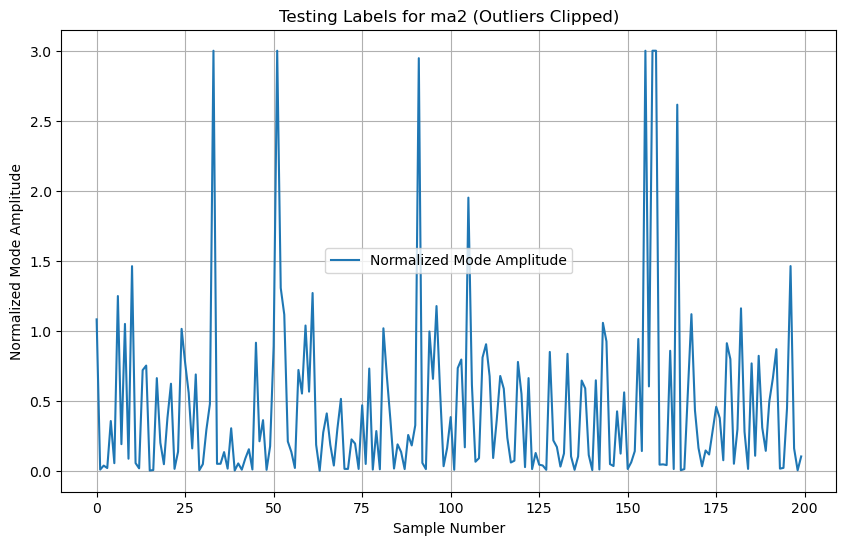

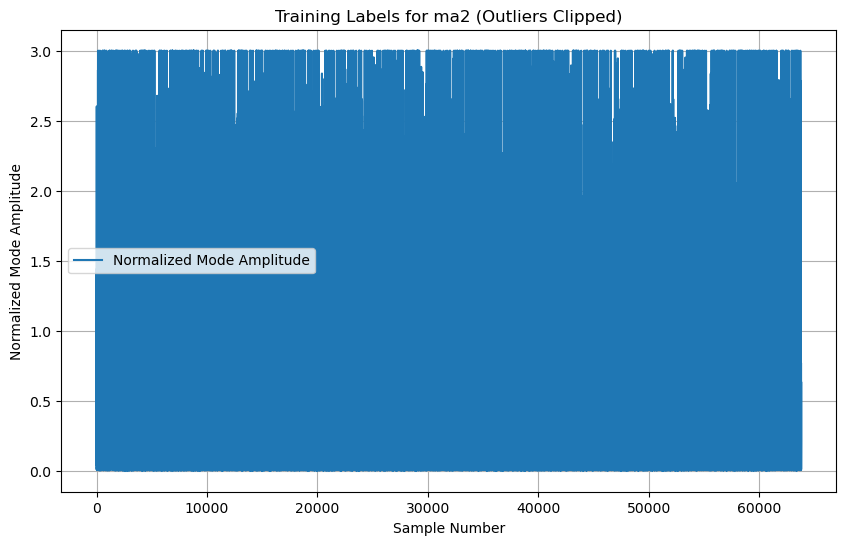

In [8]:
# Prepare data for HBT prediction model
target_data = hbt_dataType  # Using mode 2 amplitude as target
training_data = cut_training_data_2D

# Normalization factors
camera_norm = 1  # Camera data already normalized by max_pixel_value
# Compute ma_norm using 90th percentile to handle outliers
raw_target_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        raw_target_vector.append(target_data[i][j])

raw_target_vector = np.asarray(raw_target_vector, dtype=np.float32)[:, 0]
percentile_cutoff = np.percentile(np.abs(raw_target_vector), OUTLIER_CUTOFF) #99%
ma_norm = percentile_cutoff if percentile_cutoff > 0 else 1.0  # Use 99th percentile for normalization
outlier_threshold = 3 * ma_norm  # Define outliers as values > 3 * normalization factor
outliers = np.abs(raw_target_vector) > outlier_threshold
print(f"Normalization factor ({OUTLIER_CUTOFF} percentile): {ma_norm:.2f}")
print(f"Number of outliers (|value| > {outlier_threshold:.2f}): {np.sum(outliers)}")

# Clip outliers for normalization
raw_target_vector = np.clip(raw_target_vector, -outlier_threshold, outlier_threshold)

# Reshape the training data and labels, excluding RESERVED_SHOT
target_vector = []
training_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        target_vector.append(target_data[i][j])
        training_vector.append(training_data[i][j])

# Shuffle the data
random.seed(123)
zip_list = list(zip(target_vector, training_vector))
random.shuffle(zip_list)
target_vector, training_vector = zip(*zip_list)

# Convert to numpy arrays and normalize with clipping
target_vector = np.asarray(target_vector, dtype=np.float32)[:, 0]
target_vector = np.clip(target_vector, -outlier_threshold, outlier_threshold) / ma_norm
training_vector = np.asarray(training_vector, dtype=np.float32).reshape(-1, 32, 32, 1)

# Split into training and testing sets
test_size = 200
testing_inputs = training_vector[-test_size:]
testing_labels = target_vector[-test_size:]
training_vector = training_vector[:-test_size]
target_vector = target_vector[:-test_size]

# Save normalization info to a per-run file
normalization_filename = f"normalization_{notebook_type}_state_{state}.npz"
np.savez(normalization_filename,
         ma_norm=ma_norm,
         outlier_threshold=outlier_threshold,
         selected_data_type=selected_data_type)
print(f"Saved normalization info to {normalization_filename}")

print('Training shape:', training_vector.shape, 'Target shape:', target_vector.shape)
print('Testing shape:', testing_inputs.shape, 'Testing label shape:', testing_labels.shape)

# Plot testing labels
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Testing Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

# Plot training labels
plt.figure(figsize=(10, 6))
plt.plot(target_vector, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Training Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

In [9]:
import ast

# Define model architecture
num_conv2d_layers = NUM_CONV2D_LAYERS #2
num_dense_layers = NUM_DENSE_LAYERS #1

conv2d_neurons = CONV2D_NEURONS #[16, 16]
conv2d_size = CONV2D_SIZE #[(8, 8), (8, 8)]
dense_layer_neurons = DENSE_LAYER_NEURONS #[10]
max_pooling_size = MAX_POOLING_SIZE #(4, 4)
activation_func = ACTIVATION_FUNC # 'relu'
loss_func = LOSS_FUNC #'mean_squared_error'
optimizer_func = OPTIMIZER_FUNC #'adam'

# Reinterpret conv2d_size to handle various input formats
conv2d_size = [
    tuple(int(x) for x in ast.literal_eval(size) if isinstance(x, (int, float)))
    if isinstance(size, str) else tuple(int(x) for x in size)
    for size in conv2d_size
]
# Reinterpret max_pooling_size to handle various input formats
max_pooling_size = (
    tuple(int(x) for x in ast.literal_eval(max_pooling_size) if isinstance(x, (int, float)))
    if isinstance(max_pooling_size, str) else tuple(int(x) for x in max_pooling_size)
)
# Create the model
william_model = tf.keras.models.Sequential()

# Add input layer
william_model.add(tf.keras.layers.InputLayer(shape=(32, 32, 1)))

# Add Conv2D layers
for i in range(num_conv2d_layers):
    william_model.add(tf.keras.layers.Conv2D(conv2d_neurons[i], conv2d_size[i], 1, activation=activation_func))
    william_model.add(tf.keras.layers.MaxPooling2D(max_pooling_size, 1))

# Flatten the output
william_model.add(tf.keras.layers.Flatten())

# Add dense layers
for i in range(num_dense_layers):
    william_model.add(tf.keras.layers.Dense(dense_layer_neurons[i], activation=activation_func))

# Output layer
william_model.add(tf.keras.layers.Dense(1))

# Compile the model
william_model.compile(optimizer=optimizer_func, loss=loss_func)

# Display model summary
william_model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 26, 26, 64)     │         3,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 20, 20, 64)     │        65,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 18496)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 8)              │       147,976 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 216,785 (846.82 KB)

 Trainable params: 216,785 (846.82 KB)

 Non-trainable params: 0 (0.00 B)

In [10]:
# Train the model
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)
Model = william_model
history = Model.fit(training_vector, target_vector,
                       epochs=EPOCH_NUM,
                       validation_split=VALIDATION_SPLIT,
                       verbose=1,
                       callbacks=[early_stop])

Epoch 1/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 5:11 208ms/step - loss: 0.5087

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.9106  

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.8374

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.7782

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.7340

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.7009

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.6732

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.6497

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.6298

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.6130

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.5983

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.5854

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.5737

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.5628

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.5527

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.5436

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.5352

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.5276

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.5204

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.5138

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.5077

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.5020

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.4967

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.4916

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.4869

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.4824

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.4783

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.4743

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.4706

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.4669

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.4635

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.4603

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.4573

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.4545

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.4518

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.4492

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.4467

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.4444

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.4422

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.4400

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.4380

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.4361

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.4343

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.4325

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.4308

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.4292

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.4275

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.4259

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.4244

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.4228

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.4213

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.4198

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.4184

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.4170

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.4156

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.4143

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.4130

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.4117

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.4105

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.4093

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.4081

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.4069

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.4058

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.4046

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.4035

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.4025

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.4014

 202/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.4004

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.3994

 208/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.3984

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.3974

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.3965

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.3955

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.3946

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.3938

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.3929

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.3921

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.3912

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.3904

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.3896

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.3888

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.3881

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.3873

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.3866

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.3859

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.3852

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.3846

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.3839

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.3832

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.3826

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.3820

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.3814

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.3808

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.3802

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.3796

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.3791

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.3785

 292/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.3779

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.3774

 298/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.3769

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3764

 304/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3759

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3753

 310/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3748

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3744

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3739

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3734

 322/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3729

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3725

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3720

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3716

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3712

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3707

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3703

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3699

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3695

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3690

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3686

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3682

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3679

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.3675

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.3671

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.3667

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.3664

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.3660

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.3656

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.3653

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.3649

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.3646

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.3642

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.3639

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.3635

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.3632

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.3629

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.3626

 406/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.3622

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.3619

 412/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.3616

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.3613

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.3610

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.3607

 424/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.3604

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.3600

 430/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.3597

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.3594

 436/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.3591

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.3588

 442/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.3585

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.3582

 448/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.3580

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.3577

 454/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.3574

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.3571

 460/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.3568

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.3565

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.3563

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.3560

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.3557

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.3555

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.3552

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.3549

 484/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.3547

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.3544

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.3541

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.3539

 496/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.3536

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.3534

 502/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.3531

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.3529

 508/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.3526

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.3524

 514/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.3521

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.3519

 520/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.3516

 523/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.3514

 526/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.3512

 529/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.3509

 532/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.3507

 535/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.3505

 538/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.3502

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.3500

 544/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.3498

 547/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.3496

 550/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.3494

 553/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.3491

 556/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.3489

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.3487

 562/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.3485

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.3483

 568/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.3481

 571/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.3479

 574/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.3477

 577/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.3475

 580/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.3473

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.3471

 586/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.3469

 589/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.3467

 592/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.3465

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.3463

 598/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.3461

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.3459

 604/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.3457

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.3455

 610/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.3453

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.3451

 616/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.3449

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.3448

 622/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.3446

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.3444

 628/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.3442

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.3440

 634/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.3439

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.3437

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.3435

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.3433

 646/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.3432

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.3430

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.3428

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.3426

 658/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.3425

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.3423

 664/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.3421

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.3419

 670/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.3418

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.3416

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.3414

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.3413

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.3411

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.3410

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.3408

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.3406

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.3405

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.3403

 700/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.3402

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.3400

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.3399

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.3397

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.3396

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.3394

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.3393

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.3391

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.3390

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.3389

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.3387

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.3386

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.3385

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.3383

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.3382

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.3380

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.3379

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.3377

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.3376

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.3375

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.3373

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.3372

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.3370

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.3369

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.3368

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.3366

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.3365

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.3363

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.3362

 786/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.3361

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.3359

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.3358

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.3357

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.3355

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.3354

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.3353

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.3351

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.3350

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.3349

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.3348

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.3346

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.3345

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.3344

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.3343

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.3341

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.3340

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.3339

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.3338

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.3337

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.3335

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.3334

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.3333

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.3332

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.3331

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.3330

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3329

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3327

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3326

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3325

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3324

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3323

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3322

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3321

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3320

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3319

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3317

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3316

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3315

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3314

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3313

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3312

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.3311

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3310

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3309

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3308

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3307

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3305

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3304

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3303

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3302

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3301

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3300

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3299

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3298

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3297

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3296

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3295

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.3294

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3293

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3292

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3291

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3290

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3289

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3288

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3287

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3286

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3285

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3285

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3284

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3283

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3282

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3281

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3280

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.3279

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3278 

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3277

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3276

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3275

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3274

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3273

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3273

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3272

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3271

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3270

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3269

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3268

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3267

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3266

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3266

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3265

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.3264

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3263

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3262

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3261

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3260

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3260

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3259

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3258

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3257

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3256

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3255

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3255

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3254

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3253

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3252

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3251

1107/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.3251

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3250

1113/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3249

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3248

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3247

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3247

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3246

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3245

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3244

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3243

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3243

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3242

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3241

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3240

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3239

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3239

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.3238

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3237

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3236

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3236

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3235

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3234

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3233

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3233

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3232

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3231

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3230

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3230

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3229

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3228

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3227

1200/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3227

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3226

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.3225

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3224

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3224

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3223

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3222

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3221

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3221

1227/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3220

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3219

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3219

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3218

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3217

1242/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3216

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3216

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3215

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3214

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.3214

1257/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3213

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3212

1263/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3212

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3211

1269/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3210

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3209

1275/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3209

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3208

1281/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3207

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3207

1287/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3206

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3205

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3205

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3204

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3203

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.3203

1305/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3202

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3201

1311/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3201

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3200

1317/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3199

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3198

1323/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3198

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3197

1329/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3196

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3196

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3195

1338/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3194

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3194

1344/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3193

1347/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3192

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.3192

1353/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3191

1356/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3190

1359/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3190

1362/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3189

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3188

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3188

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3187

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3187

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3186

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3185

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3185

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3184

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3183

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3183

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3182

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.3181

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3181

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3180

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3180

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3179

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3178

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3178

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3177

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3176

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3176

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3175

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3175

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3174

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3173

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3173

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3172

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3171

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3171

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3170

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3170

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3169

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3168

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3168

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3167

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3167

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3166

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3165

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3165

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3164

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3164

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3163

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3162

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3162

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.3161 - val_loss: 0.3023


Epoch 2/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2515

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2945

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2933

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2919

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2893

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2880

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2862

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2849

  24/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2840

  27/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2827

  29/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2816

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2808

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2802

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2801

  39/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2799

  42/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2796

  44/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.2794

  47/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.2789

  50/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2786

  53/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2784

  56/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2781

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2777

  62/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2772

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2767

  68/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2762

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2756

  74/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2752

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2748

  80/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2745

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2742

  86/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2739

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2737

  92/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2735

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2733

  98/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2731

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2729

 104/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2727

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2725

 110/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2723

 113/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2721

 116/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2718

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2717

 122/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2715

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2713

 128/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2711

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2709

 134/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2707

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2705

 140/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2704

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2702

 146/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2701

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2699

 152/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2698

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2697

 158/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2696

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2696

 164/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2695

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2694

 170/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2694

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2693

 176/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2692

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2692

 182/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2691

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2691

 188/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2690

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2690

 194/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2690

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2689

 200/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2689

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2689

 206/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2689

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2689

 212/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2689

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2689

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2689

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2689

 224/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2689

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2689

 230/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2689

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2689

 236/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2689

 239/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2688

 242/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2688

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2688

 248/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2688

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2687

 254/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2687

 257/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2687

 260/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2686

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2686

 266/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2686

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2686

 272/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2686

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2685

 278/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2685

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2685

 284/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2685

 287/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2685

 290/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2684

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2684

 296/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2684

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2684

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2684

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2684

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2684

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2684

 314/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2683

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2683

 320/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2683

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2683

 326/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2683

 329/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2682

 332/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2682

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2682

 338/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2682

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2682

 344/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2682

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2681

 350/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2681

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2681

 356/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2681

 359/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2680

 362/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2680

 365/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2680

 368/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2680

 371/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2679

 374/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2679

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2679

 380/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2678

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2678

 386/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2678

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2678

 392/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2677

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2677

 398/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2677

 401/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2676

 404/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2676

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2676

 410/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2676

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2675

 416/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2675

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2675

 422/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2675

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2674

 428/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2674

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2674

 434/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2674

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2673

 440/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2673

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2673

 446/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2673

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2673

 452/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2672

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2672

 458/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2672

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2672

 464/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2671

 467/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2671

 470/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2671

 473/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2671

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2670

 479/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2670

 482/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2670

 485/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2670

 488/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2669

 491/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2669

 494/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2669

 497/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2668

 500/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2668

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2668

 506/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2668

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2668

 512/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2667

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2667

 518/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2667

 521/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2667

 524/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2666

 527/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2666

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2666

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2666

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2665

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2665

 542/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2665

 545/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2665

 548/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2665

 551/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2664

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2664

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2664

 560/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2664

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2663

 566/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2663

 569/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2663

 572/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2663

 575/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2663

 578/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2662

 581/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2662

 584/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2662

 587/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2662

 590/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2661

 593/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2661

 596/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2661

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2661

 602/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2661

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2660

 608/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2660

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2660

 614/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2660

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2659

 620/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2659

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2659

 626/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2658

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2658

 632/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2658

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2658

 638/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2658

 641/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2657

 644/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2657

 647/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2657

 650/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2657

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2656

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2656

 658/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2656

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2656

 664/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2656

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2655

 670/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2655

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2655

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2655

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2655

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2655

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2654

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2654

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2654

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2654

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2654

 700/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2654

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2653

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2653

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2653

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2653

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2653

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2652

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2652

 724/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2652

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2652

 730/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2652

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2651

 736/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2651

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2651

 742/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2651

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2651

 748/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2651

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2650

 754/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2650

 757/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2650

 760/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2650

 763/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2650

 766/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2649

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2649

 772/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2649

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2649

 778/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2649

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2648

 784/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2648

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2648

 790/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2648

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2648

 796/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2647

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2647

 802/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2647

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2647

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2647

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2647

 814/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2646

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2646

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2646

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2646

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2646

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2645

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2645

 835/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2645

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2645

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2645

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2645

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2645

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2644

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2644

 856/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2644

 859/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2644

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2644

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2644

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2644

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2644

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2643

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2643

 880/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2643

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2643

 886/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2643

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2643

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2643

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2643

 898/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2642

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2642

 904/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2642

 907/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2642

 910/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2642

 913/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2642

 916/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2642

 919/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2642

 922/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2642

 925/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2641

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2641

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2641

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2641

 935/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2641

 938/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2641

 941/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2641

 944/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2641

 947/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2641

 950/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2640

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2640

 956/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2640

 959/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2640

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2640

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2640

 968/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2640

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2640

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2640

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2639

 980/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2639

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2639

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2639

 989/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2639

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2639

 995/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2639

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2639

1001/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2639

1004/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2639

1007/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2638

1010/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2638

1013/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2638

1016/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2638

1019/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2638

1022/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2638

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2638

1028/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2638

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2638 

1034/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2638

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2637

1040/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2637

1043/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2637

1046/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2637

1049/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2637

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2637

1055/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2637

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2637

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2637

1064/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2636

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2636

1070/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2636

1073/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2636

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2636

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2636

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2636

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2636

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2636

1091/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2635

1094/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2635

1097/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2635

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2635

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2635

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2635

1109/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2635

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2635

1115/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2634

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2634

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2634

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2634

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2634

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2634

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2634

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2634

1139/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2634

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2633

1145/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2633

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2633

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2633

1154/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2633

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2633

1160/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2633

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2633

1166/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2633

1169/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2632

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2632

1175/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2632

1178/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2632

1181/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2632

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2632

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2632

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2632

1193/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2632

1196/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2632

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2631

1202/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2631

1205/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2631

1208/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2631

1211/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2631

1214/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2631

1217/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2631

1220/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2631

1223/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2631

1226/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2631

1229/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2630

1232/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2630

1235/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2630

1238/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2630

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2630

1244/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2630

1247/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2630

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2630

1253/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2630

1256/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2630

1259/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2629

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2629

1265/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2629

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2629

1271/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2629

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2629

1277/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2629

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2629

1283/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2629

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2629

1289/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2629

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2628

1295/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2628

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2628

1301/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2628

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2628

1307/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2628

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2628

1313/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2628

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2628

1319/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2628

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2628

1325/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2627

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2627

1331/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2627

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2627

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2627

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2627

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2627

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2627

1349/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2627

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2627

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2627

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2626

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2626

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2626

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2626

1370/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2626

1373/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2626

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2626

1379/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2626

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2626

1385/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2626

1388/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2626

1391/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2626

1394/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2626

1397/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2625

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2625

1403/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2625

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2625

1409/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2625

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2625

1415/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2625

1418/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2625

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2625

1424/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2625

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2625

1430/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2625

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2625

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2625

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2625

1442/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2624

1445/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2624

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2624

1451/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2624

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2624

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2624

1460/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2624

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2624

1466/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2624

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2624

1472/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2624

1475/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2624

1478/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2624

1481/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2624

1484/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2624

1487/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2624

1490/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2624

1493/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2624

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2623

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2623 - val_loss: 0.2712


Epoch 3/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1711

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2375

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2608

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2684

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2721

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2734

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2729

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2716

  24/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2703

  27/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2684

  30/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2667

  33/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2652

  36/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2639

  38/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2634

  41/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2626

  44/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2617

  47/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2612

  50/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2610

  53/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2608

  56/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2607

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2603

  62/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2600

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2596

  68/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2594

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2592

  74/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2590

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2587

  80/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2586

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2584

  86/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2583

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2582

  92/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2580

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2579

  98/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2577

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2576

 104/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2575

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2575

 110/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2573

 113/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2572

 116/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2571

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2569

 122/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2568

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2567

 128/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2567

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2566

 134/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2565

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2564

 140/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2563

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2562

 146/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2561

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2560

 152/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2560

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2559

 158/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2559

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2559

 164/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2558

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2558

 170/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2558

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2557

 176/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2557

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2556

 182/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2556

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2555

 188/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2555

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2554

 194/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2554

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2553

 200/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2552

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2552

 206/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2551

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2550

 212/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2549

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2549

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2548

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2547

 224/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2547

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2546

 230/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2546

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2545

 236/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2545

 239/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2544

 242/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2544

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2543

 248/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2543

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2543

 254/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2542

 257/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2542

 260/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2542

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2542

 266/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2541

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2541

 272/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2541

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2540

 278/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2540

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2540

 284/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2540

 287/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2539

 290/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2539

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2539

 296/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2539

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2538

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2538

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2538

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2537

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2537

 314/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2537

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2536

 320/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2536

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2536

 326/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2536

 329/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2535

 332/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2535

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2535

 338/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2534

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2534

 344/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2534

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2534

 350/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2533

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2533

 356/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2533

 359/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2532

 362/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2532

 365/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2532

 368/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2531

 371/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2531

 374/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2531

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2531

 380/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2530

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2530

 386/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2530

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2529

 392/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2529

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2529

 398/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2529

 401/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2528

 404/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2528

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2528

 410/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2528

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2528

 416/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2527

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2527

 422/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2527

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2527

 428/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2527

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2527

 434/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2527

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2526

 440/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2526

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2526

 446/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2526

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2526

 452/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2526

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2525

 458/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2525

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2525

 464/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2525

 467/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2525

 470/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2525

 473/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2524

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2524

 479/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2524

 482/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2524

 485/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2524

 488/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2524

 491/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2524

 494/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2524

 497/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2523

 500/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2523

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2523

 506/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2523

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2523

 512/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2523

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2523

 518/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2522

 521/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2522

 524/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2522

 527/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2522

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2522

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2522

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2521

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2521

 542/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2521

 545/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2521

 548/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2521

 551/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2521

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2520

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2520

 560/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2520

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2520

 566/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2520

 569/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2520

 572/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 575/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 578/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 581/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 584/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 587/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 590/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 593/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 596/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2518

 602/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2518

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2518

 608/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2518

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2518

 614/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2518

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2518

 620/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2518

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2518

 626/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2517

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2517

 632/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2517

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2517

 638/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2517

 641/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2517

 644/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2517

 647/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2517

 650/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2516

 653/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2516

 656/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2516

 659/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2516

 662/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2516

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2516

 668/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2516

 671/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2516

 674/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2516

 677/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2516

 680/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2516

 683/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2515

 686/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2515

 689/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2515

 692/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2515

 695/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2515

 698/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2515

 701/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 704/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 707/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 710/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 713/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 716/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 719/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 722/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 725/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 728/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 731/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 734/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 737/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 740/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2514

 743/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2514

 746/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 749/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 752/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 755/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 758/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 761/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 764/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 767/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 770/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 773/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 776/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 779/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 782/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2514

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2514

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2514

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2514

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2514

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2514

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2514

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2514

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2514

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2513

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2513

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2513

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2513

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2513

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2513

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2513

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2513

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2513

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2513

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2513

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2513

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2513

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2513

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2513

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2513

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2513

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2513

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2513

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2513

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2513

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2513

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2513

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2513

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2513

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2513

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2513

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2513

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2513

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2513

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2513

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2513

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2513

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2513

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2513

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2513

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2513

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2513

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2513

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2513

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2512

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2512

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2512

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2512

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2512

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2512

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2512

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2512

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2512

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2512

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2512

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2512

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2512

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2512

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2512

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2512

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2512

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2512

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2512

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2512

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2512

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2512

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2512

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2512

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2512

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2512

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2512

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2512

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2512

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2512 

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2512

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2512

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2512

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2512

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2512

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2512

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2512

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2512

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2512

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2512

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2512

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2512

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2512

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2512

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2512

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2512

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2512

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2512

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2512

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2512

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2512

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2512

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2512

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2512

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2512

1107/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2512

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2512

1113/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2512

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2512

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2512

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2512

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2512

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2512

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2512

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2512

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2512

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2512

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2512

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2512

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2512

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2512

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2512

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2512

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2512

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2513

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2513

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2513

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2513

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2513

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2513

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2513

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2513

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2513

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2513

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2513

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2513

1200/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2513

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2513

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2513

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2513

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2513

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2513

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2513

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2513

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2513

1227/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2513

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2513

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2513

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2513

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2513

1242/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2512

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2512

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2512

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2512

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2512

1257/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2512

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2512

1263/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2512

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2512

1269/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2512

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2512

1275/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2512

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2512

1281/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2512

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2512

1287/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2512

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2512

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2512

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2512

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2512

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2512

1305/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2512

1307/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2512

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2512

1313/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2512

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2512

1319/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2512

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2512

1325/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2512

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2512

1331/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2512

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2512

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2512

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2512

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2512

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2512

1349/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2512

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2512

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2512

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2512

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2513

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2513

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2513

1370/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2513

1373/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2513

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2513

1379/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2513

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2513

1385/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2513

1388/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2513

1391/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2513

1394/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2513

1397/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2513

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2513

1403/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2513

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2513

1409/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2513

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2513

1415/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2513

1418/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2513

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2513

1424/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2513

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2513

1430/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2513

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2513

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2513

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2513

1442/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2513

1445/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2513

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2513

1451/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2513

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2513

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2513

1460/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2513

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2513

1466/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2513

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2513

1472/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2513

1475/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2513

1478/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2513

1481/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2513

1484/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2513

1487/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2513

1490/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2513

1493/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2513

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2513

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2513 - val_loss: 0.2447


Epoch 4/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2128

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2375

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2463

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2492

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2464

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2427

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2414

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2408

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2407

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2400

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2392

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2388

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2388

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2387

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2383

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2377

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2374

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2371

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2369

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2368

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2367

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2366

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2365

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2364

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2364

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2362

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2362

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2361

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2361

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2361

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2360

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2360

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2359

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2359

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2359

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2360

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2360

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2361

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2362

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2363

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2364

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2365

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2365

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2366

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2367

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2369

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2370

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2371

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2373

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2374

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2376

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2377

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2379

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2380

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2381

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2383

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2384

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2385

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2386

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2386

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2387

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2388

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2388

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2389

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2390

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2390

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2391

 202/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2392

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2392

 208/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2393

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2394

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2395

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2395

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2396

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2397

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2398

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2399

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2399

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2400

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2401

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2401

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2402

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2402

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2403

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2403

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2403

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2404

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2404

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2405

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2405

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2406

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2406

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2407

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2407

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2408

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2408

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2409

 292/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2409

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2410

 298/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2411

 300/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2411

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2411

 304/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2412

 306/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2412

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2413

 310/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2413

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2413

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2414

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2414

 322/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2415

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2415

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2416

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2416

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2417

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2417

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2418

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2418

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2419

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2419

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2419

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2420

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2420

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2421

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2421

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2422

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2422

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2423

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2423

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2423

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2424

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2424

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2425

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2425

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2425

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2426

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2426

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2427

 406/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2427

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2427

 412/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2428

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2428

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2428

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2428

 424/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2429

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2429

 430/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2429

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2429

 436/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2429

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2430

 442/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2430

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2430

 448/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2430

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2430

 454/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2431

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2431

 460/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2431

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2431

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2432

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2432

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2432

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2432

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2433

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2433

 484/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2433

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2433

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2433

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2434

 496/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2434

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2434

 502/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2434

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2435

 508/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2435

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2435

 514/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2435

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2435

 520/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2436

 523/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2436

 526/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2436

 529/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2436

 532/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2436

 535/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2437

 538/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2437

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2437

 544/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2437

 547/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2437

 550/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2438

 553/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2438

 556/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2438

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2438

 562/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2438

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2439

 568/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2439

 571/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2439

 574/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2439

 577/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2439

 580/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2439

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2440

 586/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2440

 589/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2440

 592/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2440

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2440

 598/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2440

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2441

 604/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2441

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2441

 610/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2441

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2441

 616/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2442

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2442

 622/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2442

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2442

 628/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2442

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2443

 634/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2443

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2443

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2443

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2443

 646/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2443

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2444

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2444

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2444

 658/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2444

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2444

 664/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2444

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2445

 670/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2445

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2445

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2445

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2445

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2445

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2446

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2446

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2446

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2446

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2446

 700/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2446

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2447

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2447

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2447

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2447

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2447

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2447

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2448

 724/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2448

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2448

 730/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2448

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2448

 736/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2448

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2449

 742/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2449

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2449

 748/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2449

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2449

 754/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2450

 757/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2450

 760/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2450

 763/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2450

 766/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2450

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2450

 772/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2451

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2451

 778/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2451

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2451

 784/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2451

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2451

 790/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2452

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2452

 796/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2452

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2452

 802/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2452

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2452

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2453

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2453

 814/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2453

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2453

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2453

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2453

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2454

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2454

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2454

 835/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2454

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2454

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2454

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2454

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2455

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2455

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2455

 856/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2455

 859/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2455

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2455

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2455

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2456

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2456

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2456

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2456

 880/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2456

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2456

 886/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2456

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2457

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2457

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2457

 898/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2457

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2457

 904/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2457

 907/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2457

 910/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2457

 913/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2458

 916/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2458

 919/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2458

 922/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2458

 925/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2458

 928/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2458

 931/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2458

 934/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2458

 937/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2458

 940/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2458

 943/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2459

 946/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2459

 949/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2459

 952/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2459

 955/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2459

 958/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2459

 961/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2459

 964/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2459

 967/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2459

 970/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2460

 973/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

 976/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

 979/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2461

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2461

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2461

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2461

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2461

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2461

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2461

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2461 

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2461

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2461

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2461

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2462

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2462

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2462

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2462

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2462

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2462

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2462

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2462

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2462

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2462

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2462

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2463

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2463

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2463

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2463

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2463

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2463

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2463

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2463

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2463

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2463

1093/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2463

1096/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2463

1099/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2463

1102/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2464

1105/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2464

1108/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2464

1111/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2464

1114/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2464

1117/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2464

1120/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2464

1123/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2464

1126/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2464

1129/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2464

1132/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2464

1135/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2464

1138/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2464

1141/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2465

1144/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2465

1147/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2465

1150/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2465

1153/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2465

1156/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2465

1159/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2465

1162/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2465

1165/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2465

1168/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2465

1171/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2465

1174/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2465

1177/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2465

1180/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2466

1183/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2466

1186/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2466

1189/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2466

1192/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2466

1195/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2466

1198/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2466

1201/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2466

1204/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2466

1207/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2466

1210/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2466

1213/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2466

1216/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2466

1219/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2466

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2466

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2467

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2467

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2467

1234/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2467

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2467

1240/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2467

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2467

1246/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2467

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2467

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2467

1255/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2467

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2467

1261/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2467

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2467

1267/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2467

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2468

1273/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2468

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2468

1279/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2468

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2468

1285/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2468

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2468

1291/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2468

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2468

1297/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2468

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2468

1303/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2468

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2468

1309/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2468

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2468

1315/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2469

1318/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2469

1321/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2469

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2469

1327/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2469

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2469

1333/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2469

1336/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2469

1339/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2469

1342/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2469

1345/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2469

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2469

1351/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2469

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2470

1357/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2470

1360/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2470

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2470

1366/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2470

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2470

1372/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2470

1375/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2470

1378/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2470

1381/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2470

1384/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2470

1387/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2470

1390/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2470

1393/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2470

1396/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2470

1399/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2470

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2470

1405/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2471

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2471

1411/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2471

1414/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2471

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2471

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2471

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2471

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2471

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2471

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2471

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2471

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2471

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2471

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2471

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2471

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2471

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2471

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2471

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2471

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2472

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2472

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2472

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2472

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2472

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2472

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2472

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2472

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2472

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2472

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2472

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2472

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2472 - val_loss: 0.2400


Epoch 5/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1910

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.2244

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.2182

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.2256

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2284

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.2298

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2318

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.2340

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.2364

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2380

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2395

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2408

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2418

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2428

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2434

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2441

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2447

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2451

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2457

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2461

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2465

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2469

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2475

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2481

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2488

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2494

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2499

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2504

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2509

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2513

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2516

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2520

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2523

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2525

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2526

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2528

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2529

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2531

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2532

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2533

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2534

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2536

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2536

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2537

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2538

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2538

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2538

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2538

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2538

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2539

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2539

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2539

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2540

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2540

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2539

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2539

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2539

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2538

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2538

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2537

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2537

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2536

 186/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2535

 188/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2535

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2534

 192/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2534

 194/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2533

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2533

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2532

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2532

 204/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2532

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2531

 210/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2531

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2531

 216/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2530

 219/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2530

 222/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2530

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2529

 228/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2529

 231/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2528

 234/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2528

 237/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2528

 240/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2528

 243/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2527

 246/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2527

 249/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2527

 252/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2527

 255/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2526

 258/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2526

 261/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2526

 264/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2526

 267/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2526

 270/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2526

 273/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2525

 276/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2525

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2525

 282/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2525

 285/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2525

 288/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2525

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2524

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2524

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2524

 300/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2524

 303/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2524

 306/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2523

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2523

 312/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2523

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2523

 318/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2523

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2523

 324/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2523

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2522

 330/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2522

 333/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2522

 336/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2522

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2522

 342/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2522

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2522

 348/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2522

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2522

 354/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2522

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2522

 360/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2521

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2521

 366/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2521

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2521

 372/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2520

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2520

 378/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2520

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2520

 384/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2520

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2519

 390/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2519

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2519

 396/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2519

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2519

 402/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2519

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2519

 408/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2519

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2518

 414/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2518

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2518

 420/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2518

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2518

 426/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2518

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2518

 432/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2518

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2518

 438/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2518

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2518

 444/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2518

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2518

 450/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2518

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2518

 456/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2518

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2518

 462/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2518

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2518

 468/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2518

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2518

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2518

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2518

 480/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2518

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2518

 486/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2518

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2518

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2518

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2518

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2518

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2518

 504/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2518

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2518

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2518

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2518

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2518

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2518

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2518

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2519

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2519

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2519

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2519

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2519

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2519

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2519

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2519

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2518

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2518

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2518

 606/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2518

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2518

 612/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2518

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2518

 618/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2518

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2518

 624/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2518

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2518

 630/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2518

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2518

 636/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2517

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2517

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2517

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2517

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2517

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2517

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2517

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2517

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2517

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2517

 666/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2517

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2517

 672/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2516

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2516

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2516

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2516

 684/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2516

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2516

 690/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2516

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2516

 696/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2516

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2516

 702/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 708/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 714/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 720/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2515

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2515

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2514

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2513

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2513

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2513

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2513

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2513

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2513

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2513

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2513

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2512

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2512

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2512

 786/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2512

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2512

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2512

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2512

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2512

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2511

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2511

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2511

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2511

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2511

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2511

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2511

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2511

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2510

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2510

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2510

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2510

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2510

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2510

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2510

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2510

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2510

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2509

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2509

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2509

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2509

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2509

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2509

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2509

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2509

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2509

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2509

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2509

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2508

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2508

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2508

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2508

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2508

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2508

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2508

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2508

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2508

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2508

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2508

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2508

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2508

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2507

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2507

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2507

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2507

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2507

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2507

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2507

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2507

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2507

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2507

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2507

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2507

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2507

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2507

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2507

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2506

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2506

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2506

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2506

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2506

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2506

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2506

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2506

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2506

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2506

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2506

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2506

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2505

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2505

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2505 

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2505

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2505

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2505

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2505

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2505

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2505

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2505

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2504

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2504

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2504

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2504

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2504

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2504

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2504

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2504

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2504

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2504

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2504

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2503

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2503

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2503

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2503

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2503

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2503

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2503

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2503

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2503

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2503

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2503

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2503

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2502

1107/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2502

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2502

1113/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2502

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2502

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2502

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2502

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2502

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2502

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2502

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2502

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2501

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2501

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2501

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2501

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2501

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2501

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2501

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2501

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2501

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2501

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2501

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2501

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2501

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2501

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2500

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2500

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2500

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2500

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2500

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2500

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2500

1200/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2500

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2500

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2500

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2500

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2500

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2500

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2500

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2499

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2499

1227/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2499

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2499

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2499

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2499

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2499

1242/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2499

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2499

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2499

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2499

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2499

1257/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2499

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2498

1263/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2498

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2498

1269/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2498

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2498

1275/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2498

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2498

1281/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2498

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2498

1287/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2498

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2498

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2498

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2498

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2498

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2497

1305/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2497

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2497

1311/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2497

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2497

1317/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2497

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2497

1323/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2497

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2497

1329/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2497

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2497

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2497

1338/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2497

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2497

1344/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2496

1347/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2496

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2496

1353/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2496

1356/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2496

1359/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2496

1362/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2496

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2496

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2496

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2496

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2496

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2496

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2496

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2496

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2496

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2495

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2495

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2495

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2495

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2495

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2495

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2495

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2495

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2495

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2495

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2495

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2495

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2495

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2495

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2495

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2495

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2494

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2494

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2494

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2494

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2494

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2494

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2494

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2494

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2494

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2494

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2494

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2494

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2494

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2494

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2494

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2494

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2494

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2494

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2494

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2493

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2493 - val_loss: 0.2359


Epoch 6/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.3471

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2750

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2623

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2629

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2604

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2579

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2559

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2542

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2529

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2513

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2500

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2489

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2481

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2472

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2463

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2454

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2445

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2438

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2433

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2428

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2424

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2422

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2418

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2416

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2414

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2412

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2411

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2410

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2409

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2410

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2411

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2412

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2414

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2417

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2420

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2422

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2425

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2427

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2429

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2432

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2433

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2435

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2437

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2438

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2438

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2439

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2439

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2439

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2440

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2440

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2440

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2440

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2440

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2440

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2440

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2441

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2441

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2441

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2441

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2441

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2441

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2441

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2441

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2441

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2441

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2441

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2441

 202/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2441

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2441

 208/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2441

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2441

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2441

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2441

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2441

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2441

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2441

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2441

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2441

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2442

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2442

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2442

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2442

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2442

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2442

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2442

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2443

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2443

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2443

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2444

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2444

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2444

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2444

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2444

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2445

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2445

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2445

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2445

 292/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2445

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2445

 298/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2445

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2445

 304/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2445

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2445

 310/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2445

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2444

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2444

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2444

 322/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2444

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2444

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2444

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2444

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2444

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2444

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2444

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2444

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2444

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2444

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2445

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2445

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2445

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2445

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2445

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2445

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2445

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2445

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2445

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2446

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2446

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2446

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2446

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2446

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2447

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2447

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2447

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2447

 406/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2447

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2448

 412/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2448

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2448

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2448

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2448

 424/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2449

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2449

 430/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2449

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2449

 436/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2449

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2450

 442/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2450

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2450

 448/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2450

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2450

 454/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2450

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2450

 460/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2450

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2450

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2450

 468/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.2450

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.2450

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.2450

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.2451

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2451

 480/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2451

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2451

 486/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2451

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2451

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2451

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2451

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2451

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2451

 504/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2451

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2451

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2451

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2451

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2451

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2451

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2451

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2451

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2451

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2451

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2451

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2451

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2452

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2452

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2452

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2452

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2452

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2452

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2452

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2452

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2452

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2452

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2452

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2452

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2452

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2452

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2452

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2453

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2453

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2453

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2453

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2453

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2453

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2453

 606/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2453

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2453

 612/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2453

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2453

 618/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2453

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2453

 624/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2453

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2453

 630/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2453

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2453

 636/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2454

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2454

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2454

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2454

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2454

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2454

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2454

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2454

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2454

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2454

 666/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2454

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2454

 672/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2454

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2454

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2454

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2454

 684/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2454

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2454

 690/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2454

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2454

 696/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2454

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2454

 702/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2454

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2454

 708/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2454

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2455

 714/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2455

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2455

 720/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2455

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2455

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2455

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2455

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2455

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2455

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2455

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2455

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2455

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2455

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2455

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2455

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2455

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2455

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2455

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2455

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2455

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2455

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2455

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2455

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2455

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2455

 786/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2455

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2455

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2455

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2455

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2455

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2455

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2455

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2455

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2455

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2455

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2455

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2455

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2455

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2455

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2455

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2455

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2455

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2455

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2455

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2455

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2455

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2455

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2455

 854/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2455

 856/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2455

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2455

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2455

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2455

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2455

 869/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2455

 872/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2455

 875/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2455

 878/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2455

 881/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2455

 884/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2455

 887/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2455

 890/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2455

 893/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2455

 896/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2455

 899/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2455

 902/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2455

 905/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2455

 908/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2455

 911/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2455

 914/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2455

 917/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2455

 920/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2455

 923/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2455

 926/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2455

 929/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2455

 932/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2455

 935/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2455

 938/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2455

 941/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2455

 944/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2455

 947/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2455

 950/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2455

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2455

 956/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2455

 959/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2455

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2455

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2455

 968/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2455

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2455

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2456

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2456

 980/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2456

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2456

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2456

 989/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2456

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2456

 995/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2456

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2456

1001/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2456

1004/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2456

1007/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2456

1010/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2456

1013/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2456 

1016/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2456

1019/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2456

1022/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2456

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2456

1028/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2456

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2456

1034/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2456

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2456

1040/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2456

1043/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2456

1046/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2456

1049/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2456

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2456

1055/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2456

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2456

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2456

1064/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2456

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2456

1070/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2456

1073/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2456

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2456

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2456

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2456

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2456

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2456

1091/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2456

1094/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2456

1097/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2456

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2456

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2456

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2456

1109/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2456

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2456

1115/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2456

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2456

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2456

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2456

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2456

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2456

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2456

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2456

1139/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2456

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2456

1145/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2456

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2456

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2456

1154/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2456

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2456

1160/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2456

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2456

1166/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2456

1169/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2456

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2456

1175/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2456

1178/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2456

1181/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2456

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2456

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2456

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2456

1193/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2456

1196/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2456

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2456

1202/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2456

1205/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2456

1208/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2456

1211/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2456

1214/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2456

1217/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2456

1220/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2456

1223/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2456

1226/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2456

1229/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2456

1232/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2456

1235/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2456

1238/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2456

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2456

1244/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2456

1247/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2456

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2456

1253/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2456

1256/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2456

1259/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2456

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2456

1265/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2456

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2456

1271/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2456

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2456

1277/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2456

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2456

1283/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2456

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2456

1289/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2456

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2456

1295/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2456

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2456

1301/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2456

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2456

1307/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2456

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2456

1313/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2456

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2456

1319/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2456

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2456

1325/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2456

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2456

1331/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2455

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2455

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2455

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2455

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2455

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2455

1349/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2455

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2455

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2455

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2455

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2455

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2455

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2455

1370/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2455

1373/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2455

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2455

1379/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2455

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2455

1385/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2455

1388/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2455

1391/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2455

1394/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2455

1397/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2455

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2455

1403/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2455

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2455

1409/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2455

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2455

1415/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2455

1418/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2455

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2455

1424/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2455

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2455

1430/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2455

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2455

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2455

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2455

1442/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2455

1445/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2455

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2455

1451/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2455

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2455

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2455

1460/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2455

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2455

1466/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2455

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2455

1472/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2455

1475/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2455

1478/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2455

1481/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2454

1484/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2454

1487/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2454

1490/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2454

1493/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2454

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.2454 - val_loss: 0.2566


Epoch 7/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.3054

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.2833

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2730

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2748

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2768

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2757

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2752

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2753

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2746

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2734

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2720

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2706

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2692

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2678

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2664

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2651

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2641

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2632

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2625

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2619

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2612

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2606

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2600

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2593

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2587

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2581

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2574

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2569

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2563

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2558

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2553

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2549

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2544

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2541

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2538

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2535

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2532

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2530

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2528

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2526

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2525

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2523

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2521

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2520

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2518

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2517

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2516

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2515

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2514

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2513

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2511

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2510

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2509

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2508

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2507

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2506

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2505

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2504

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2503

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2502

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2501

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2500

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2499

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2499

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2498

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2497

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2497

 202/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2496

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2496

 208/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2496

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2495

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2495

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2495

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2494

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2494

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2493

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2493

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2493

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2492

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2492

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2491

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2490

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2490

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2489

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2489

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2489

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2488

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2488

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2488

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2488

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2487

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2487

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2487

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2487

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2486

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2486

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2486

 292/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2486

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2486

 298/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2486

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2485

 304/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2485

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2485

 310/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2485

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2485

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2484

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2484

 322/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2484

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2484

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2484

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2484

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2483

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2483

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2483

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2483

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2483

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2482

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2482

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2482

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2482

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2481

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2481

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2481

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2481

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2481

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2481

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2480

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2480

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2480

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2480

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2480

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2479

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2479

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2479

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2478

 406/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2478

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2478

 412/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2478

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2477

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2477

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2477

 424/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2476

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2476

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2476

 432/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2476

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2475

 438/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2475

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2475

 444/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2475

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2474

 450/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2474

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2474

 456/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2474

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2474

 462/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2473

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2473

 468/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2473

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2473

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2473

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2473

 480/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2472

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2472

 486/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2472

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2472

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2472

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2472

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2471

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2471

 504/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2471

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2471

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2470

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2470

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2470

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2470

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2470

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2469

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2469

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2469

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2469

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2468

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2468

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2468

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2468

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2467

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2467

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2467

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2467

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2466

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2466

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2466

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2466

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2465

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2465

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2465

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2465

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2465

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2464

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2464

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2464

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2464

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2464

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2464

 606/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2463

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2463

 612/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2463

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2463

 618/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2463

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2463

 624/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2463

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2463

 630/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2462

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2462

 636/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2462

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2462

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2462

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2462

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2462

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2462

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2461

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2461

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2461

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2461

 666/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2461

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2461

 672/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2461

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2461

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2461

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2461

 684/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2461

 686/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2461

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2460

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2460

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2460

 695/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2460

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2460

 700/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2460

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2460

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2460

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2460

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2460

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2460

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2460

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2460

 724/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2460

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2460

 730/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2460

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2460

 736/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2460

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2460

 742/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2460

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2460

 748/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2460

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2460

 754/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2460

 757/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2460

 760/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2460

 763/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2460

 766/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2460

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2460

 772/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2460

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2460

 778/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2460

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2460

 784/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2460

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2460

 790/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2460

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2460

 796/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2460

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2460

 802/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2460

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2460

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2460

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2460

 814/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2460

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2460

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2461

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2461

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2461

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2461

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2461

 835/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2461

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2461

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2461

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2461

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2461

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2461

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2461

 856/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2461

 859/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2461

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2461

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2461

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2461

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2461

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2461

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2460

 880/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2460

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2460

 886/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2460

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2460

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2460

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2460

 898/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2460

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2460

 904/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2460

 907/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2460

 910/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2460

 913/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2460

 916/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2460

 919/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2460

 922/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2460

 925/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2460

 928/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2460

 931/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2460

 934/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2460

 937/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2460

 940/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2460

 943/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2460

 946/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2460

 949/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2460

 952/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2460

 955/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2460

 958/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2460

 961/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2460

 964/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

 967/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

 970/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

 973/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

 976/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

 979/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

 982/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

 985/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

 988/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

 991/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

 994/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

 997/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

1000/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

1003/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

1006/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

1009/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2460

1012/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2460 

1015/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2460

1018/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2460

1021/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2460

1024/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2460

1027/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2460

1030/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2460

1033/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2460

1036/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2460

1039/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2460

1042/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2460

1045/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2460

1048/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2460

1051/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2460

1054/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2460

1057/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2460

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2460

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2459

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2459

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2459

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2459

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2459

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2459

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2459

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2459

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2459

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2459

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2459

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2459

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2459

1099/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2459

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2459

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2459

1107/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2459

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2459

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2459

1114/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2459

1117/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2459

1120/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2459

1123/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2459

1126/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2459

1129/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2459

1132/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2459

1135/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2459

1138/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2459

1141/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2459

1144/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2459

1147/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2459

1150/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2459

1153/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2459

1156/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2459

1159/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2459

1162/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2458

1165/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2458

1168/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2458

1171/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2458

1174/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2458

1177/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2458

1180/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2458

1183/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2458

1186/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2458

1189/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2458

1192/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2458

1195/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2458

1198/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2458

1201/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2458

1204/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2458

1207/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2458

1210/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2458

1213/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2458

1216/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2458

1219/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2458

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2458

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2458

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2458

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2458

1234/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2458

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2458

1240/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2458

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2458

1246/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2458

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2458

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2458

1255/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2458

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2458

1261/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2458

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2458

1267/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2458

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2458

1273/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2458

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2458

1279/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2458

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2458

1285/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2458

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2458

1291/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2458

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2458

1297/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2458

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2458

1303/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2458

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2458

1309/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2458

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2458

1315/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2458

1318/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2458

1321/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2458

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2458

1327/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2458

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2458

1333/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2458

1336/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2458

1339/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2458

1342/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2458

1345/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2458

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2458

1351/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2458

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2458

1357/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2458

1360/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2458

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2458

1366/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2458

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2458

1372/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2458

1375/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2458

1378/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2458

1381/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2458

1384/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2458

1387/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2458

1390/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2458

1393/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2458

1396/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2458

1399/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2458

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2458

1405/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2458

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2458

1411/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2458

1414/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2458

1417/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2458

1420/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2458

1423/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2458

1426/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2458

1429/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2458

1432/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2458

1435/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2458

1438/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2458

1441/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2458

1444/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2458

1447/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2458

1450/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2458

1453/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2458

1456/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2458

1459/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2458

1462/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2458

1465/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2458

1468/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2458

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2458

1474/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2458

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2458

1480/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2458

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2458

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2458

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2458

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2458

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2458

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2458 - val_loss: 0.2430


Epoch 8/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1904

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1964

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2060

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2117

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2164

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.2207

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.2230

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2257

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2290

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2324

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2354

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2377

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2391

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2399

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2404

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2409

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2413

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2415

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2418

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2420

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2421

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2422

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2423

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2423

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2422

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2421

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2420

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2419

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2418

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2417

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2416

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2416

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2415

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.2415

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2415

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2415

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2415

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2415

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2415

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2415

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2416

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2416

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2416

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2416

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2417

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2417

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2418

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2418

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2418

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.2417

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2417

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2417

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2417

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2417

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2417

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2418

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2418

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2418

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2419

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2419

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2419

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2420

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2420

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2421

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.2421

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2421

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2421

 202/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2422

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2422

 208/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2422

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2422

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2422

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2422

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2422

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2422

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2422

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2422

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2422

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2422

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2422

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.2422

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2422

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2422

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2422

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2422

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2422

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2422

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2422

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2422

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2422

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2422

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2421

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2421

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2421

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2421

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2421

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2421

 292/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2421

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2421

 296/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2421

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2421

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2421

 304/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2421

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2421

 310/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.2421

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2421

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2421

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2421

 322/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2421

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2421

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2421

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2421

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2421

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2421

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2421

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2421

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2421

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2422

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2422

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2422

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.2422

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2422

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2422

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2422

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2422

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2422

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2422

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2421

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2421

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2421

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2421

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2421

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2421

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2421

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2421

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2421

 406/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.2421

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2421

 412/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2421

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2421

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2421

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2422

 424/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2422

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2422

 430/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2422

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2422

 436/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2421

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2421

 442/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2421

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2421

 448/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2421

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2421

 454/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.2421

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.2421

 460/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.2421

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.2421

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.2421

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.2421

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.2421

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.2421

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.2421

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.2421

 484/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.2421

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.2421

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.2421

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.2421

 496/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.2421

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.2420

 502/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.2420

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.2420

 508/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.2420

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.2420

 514/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.2420

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.2420

 520/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.2420

 523/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.2420

 526/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.2420

 529/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.2420

 532/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.2420

 535/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.2420

 538/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.2420

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.2420

 544/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.2420

 547/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.2419

 550/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.2419

 553/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.2419

 556/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2419

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2419

 562/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2419

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2419

 568/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2419

 571/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2419

 574/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2419

 577/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2418

 580/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2418

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2418

 586/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2418

 589/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2418

 592/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2418

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2418

 598/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2418

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.2418

 604/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2418

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2418

 610/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2418

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2418

 616/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2418

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2418

 622/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2418

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2417

 628/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2417

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2417

 634/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2417

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2417

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2417

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2417

 646/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2417

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2417

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.2417

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2417

 658/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2417

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2417

 664/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2417

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2417

 670/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2417

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2417

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2417

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2417

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2417

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2416

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2416

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2416

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2416

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2416

 700/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.2416

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2416

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2416

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2416

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2416

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2416

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2416

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2416

 724/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2416

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2416

 730/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2415

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2415

 736/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2415

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2415

 742/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2415

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2415

 748/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2415

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.2415

 754/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2415

 757/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2415

 760/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2414

 763/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2414

 766/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2414

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2414

 772/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2414

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2414

 778/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2414

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2414

 782/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2414

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2414

 788/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2414

 791/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2413

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2413

 796/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2413

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2413

 802/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.2413

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2413

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2413

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2413

 814/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2413

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2413

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2413

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2413

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2413

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2413

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2413

 835/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2412

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2412

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2412

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2412

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2412

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2412

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.2412

 856/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.2412

 859/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.2412

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.2412

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.2412

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.2412

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.2412

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.2412

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.2412

 880/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.2412

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.2412

 886/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.2412

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.2412

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.2412

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.2412

 898/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.2412

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.2411

 904/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.2411

 907/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.2411

 910/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.2411

 913/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.2411

 916/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.2411

 919/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.2411

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.2411

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.2411

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.2411

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.2411

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.2411

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.2411

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.2411

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.2411

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.2411

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.2411

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.2411

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.2411

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.2411

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.2411

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.2411

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.2411

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.2411

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.2411

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.2411

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.2411

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.2411

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.2411

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.2411

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.2411

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.2411

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.2411

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.2411

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.2411

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.2411 

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.2411

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.2411

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.2411

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.2411

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.2411

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.2411

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.2411

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.2411

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.2410

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.2410

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.2410

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.2410

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.2410

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.2410

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.2410

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.2410

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.2410

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.2410

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.2410

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.2410

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.2410

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.2410

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.2410

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.2410

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.2410

1081/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.2410

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.2410

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.2410

1087/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.2410

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.2410

1091/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.2410

1093/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.2410

1096/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.2410

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.2409

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.2409

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.2409

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.2409

1109/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.2409

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.2409

1115/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.2409

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.2409

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.2409

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2409

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2409

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2409

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2409

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2409

1139/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2409

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2409

1145/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2409

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2409

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2409

1154/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2409

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2409

1160/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2409

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2409

1166/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2409

1169/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2408

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2408

1175/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2408

1178/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2408

1181/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2408

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2408

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2408

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2408

1192/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2408

1195/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2408

1198/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2408

1201/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2408

1204/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2408

1207/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2408

1210/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2408

1213/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2408

1216/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2408

1219/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2408

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2408

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2408

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2408

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2408

1234/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2408

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2408

1240/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2408

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2408

1246/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2408

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2408

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2408

1255/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2408

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2407

1261/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2407

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2407

1267/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2407

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2407

1273/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2407

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2407

1279/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2407

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2407

1285/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2407

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2407

1291/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2407

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2407

1297/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2407

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2407

1303/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2407

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2407

1309/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2407

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2407

1315/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2407

1318/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2407

1321/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2407

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2407

1327/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2406

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2406

1333/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2406

1336/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2406

1339/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2406

1342/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2406

1345/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2406

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2406

1351/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2406

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2406

1357/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2406

1359/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2406

1362/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2406

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2406

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2406

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2406

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2406

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2406

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2406

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2406

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2406

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2406

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2406

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2405

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2405

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2405

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2405

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2405

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2405

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2405

1415/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2405

1417/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2405

1420/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2405

1423/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2405

1426/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2405

1429/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2405

1432/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2405

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2405

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2405

1438/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2405

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2405

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2405

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2405

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2405

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2405

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2405

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2405

1459/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2405

1462/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2405

1465/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2405

1468/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2405

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2405

1474/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2405

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2405

1480/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2405

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2405

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2405

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2405

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2405

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2405

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2405 - val_loss: 0.2668


Epoch 9/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.3502

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.3355

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.3235

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.3142

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.3060

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2980

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2917

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2868

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2832

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2799

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2774

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2753

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2732

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2717

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2702

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2688

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2675

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2663

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2652

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2642

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2634

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2626

  66/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2621

  69/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2614

  72/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2609

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2604

  78/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2598

  81/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2593

  84/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2588

  87/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2583

  90/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2578

  93/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2573

  96/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2568

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2564

 102/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2559

 105/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2555

 108/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2551

 111/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2547

 114/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2543

 117/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2540

 120/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2536

 122/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2534

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2531

 128/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2527

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2524

 134/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2521

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2518

 140/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2515

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2511

 146/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2509

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2506

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2504

 153/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2502

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2500

 158/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2498

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2496

 164/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2494

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2492

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2491

 171/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2489

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2488

 176/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2486

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2485

 182/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2483

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2481

 188/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2480

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2478

 194/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2477

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2476

 200/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2475

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2473

 206/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2472

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2471

 212/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2469

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2468

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2467

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2465

 224/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2464

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2463

 230/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2462

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2461

 236/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2459

 239/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2458

 242/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2457

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2456

 248/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2455

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2454

 254/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2453

 257/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2452

 260/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2451

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2450

 266/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2449

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2448

 272/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2447

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2446

 278/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2445

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2444

 284/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2443

 287/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2443

 290/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2442

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2441

 296/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2440

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2439

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2439

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2438

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2437

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2437

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2436

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2436

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2435

 322/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2435

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2434

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2434

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2434

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2433

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2433

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2433

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2432

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2432

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2432

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2432

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2431

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2431

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2431

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2430

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2430

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2430

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2430

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2429

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2429

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2429

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2428

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2428

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2428

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2427

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2427

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2427

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2427

 406/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2426

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2426

 412/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2426

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2425

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2425

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2425

 424/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2424

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2424

 430/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2424

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2423

 436/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2423

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2423

 442/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2423

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2422

 448/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2422

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2422

 454/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2422

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2422

 460/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2421

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2421

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2421

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2421

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2421

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2420

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2420

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2420

 484/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2420

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2420

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2419

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2419

 496/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2419

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2419

 502/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2419

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2419

 508/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2419

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2418

 514/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2418

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2418

 520/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2418

 523/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2418

 526/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2418

 529/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2418

 532/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2418

 535/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2418

 538/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2418

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2418

 544/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2418

 547/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2418

 550/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2418

 553/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2417

 556/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2417

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2417

 562/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2417

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2417

 568/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2417

 571/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2417

 574/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2417

 577/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2417

 580/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2417

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2417

 586/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2416

 589/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2416

 592/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2416

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2416

 598/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2416

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2416

 604/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2416

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2416

 610/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2416

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2416

 616/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2415

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2415

 622/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2415

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2415

 628/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2415

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2415

 634/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2415

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2415

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2414

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2414

 646/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2414

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2414

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2414

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2414

 658/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2414

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2414

 664/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2414

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2413

 670/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2413

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2413

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2413

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2413

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2413

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2413

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2413

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2413

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2413

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2413

 700/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2413

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2413

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2413

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2412

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2412

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2412

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2412

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2412

 724/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2412

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2412

 730/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2412

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2412

 736/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2412

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2412

 742/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2412

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2412

 748/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2412

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2411

 754/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2411

 757/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2411

 760/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2411

 763/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2411

 766/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2411

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2411

 772/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2411

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2411

 778/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2411

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2410

 784/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2410

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2410

 790/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2410

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2410

 796/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2410

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2410

 802/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2410

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2410

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2410

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2410

 814/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2410

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2409

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2409

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2409

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2409

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2409

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2409

 835/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2409

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2409

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2409

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2409

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2409

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2408

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2408

 856/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2408

 859/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2408

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2408

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2408

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2408

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2408

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2408

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2408

 880/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2408

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2408

 886/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2407

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2407

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2407

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2407

 898/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2407

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2407

 904/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2407

 907/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2407

 910/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2407

 913/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2407

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2407

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2407

 920/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2407

 923/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2407

 926/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2407

 929/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2407

 932/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2407

 935/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2407

 938/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2406

 941/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2406

 944/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2406

 947/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2406

 950/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2406

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2406

 956/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2406

 959/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2406

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2406

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2406

 968/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2406

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2406

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2406

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2406

 980/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2406

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2406

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2406

 989/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2406

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2406

 995/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2406

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2406

1001/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2406

1004/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2406

1007/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2406

1010/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2406

1013/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2406

1016/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2406

1019/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2406

1022/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2406

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2406

1028/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2406 

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2406

1034/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2406

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2406

1040/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2406

1043/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2406

1046/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2406

1049/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2406

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2406

1055/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2406

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2405

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2405

1064/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2405

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2405

1070/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2405

1073/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2405

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2405

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2405

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2405

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2405

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2405

1091/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2405

1094/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2405

1097/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2405

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2405

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2405

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2405

1109/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2405

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2405

1115/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2405

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2405

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2405

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2405

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2405

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2405

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2405

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2405

1139/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2404

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2404

1145/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2404

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2404

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2404

1154/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2404

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2404

1160/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2404

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2404

1166/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2404

1169/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2404

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2404

1175/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2404

1178/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2404

1181/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2404

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2404

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2404

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2404

1193/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2404

1196/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2404

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2404

1202/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2404

1205/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2404

1208/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2404

1211/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2403

1214/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2403

1217/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2403

1220/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2403

1223/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2403

1226/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2403

1229/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2403

1232/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2403

1235/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2403

1238/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2403

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2403

1244/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2403

1247/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2403

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2403

1253/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2403

1256/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2403

1259/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2403

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2403

1265/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2403

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2403

1271/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2403

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2402

1277/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2402

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2402

1283/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2402

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2402

1289/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2402

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2402

1295/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2402

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2402

1301/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2402

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2402

1307/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2402

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2402

1313/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2402

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2402

1319/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2402

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2402

1325/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2402

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2402

1331/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2402

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2402

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2402

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2401

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2401

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2401

1349/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2401

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2401

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2401

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2401

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2401

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2401

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2401

1370/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2401

1373/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2401

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2401

1379/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2401

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2401

1385/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2401

1388/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2401

1391/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2401

1394/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2401

1397/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2401

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2400

1403/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2400

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2400

1409/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2400

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2400

1415/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2400

1418/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2400

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2400

1424/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2400

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2400

1430/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2400

1432/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2400

1435/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2400

1438/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2400

1441/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2400

1444/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2400

1447/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2400

1450/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2400

1453/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2400

1456/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2399

1459/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2399

1462/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2399

1465/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2399

1468/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2399

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2399

1474/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2399

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2399

1480/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2399

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2399

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2399

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2399

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2399

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2399

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2399 - val_loss: 0.2552


Epoch 10/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2623

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2669

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2642

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.2596

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2559

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.2512

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.2480

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2464

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.2451

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2444

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2440

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2438

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2436

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2431

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2424

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2416

  48/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2411

  51/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2404

  54/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2398

  57/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2393

  60/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2389

  63/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2384

  66/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2380

  69/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2376

  72/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2372

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2369

  78/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2365

  81/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2362

  84/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2360

  87/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2358

  90/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2356

  93/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2355

  96/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2354

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2352

 102/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2351

 105/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2349

 108/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2348

 111/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2346

 114/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2345

 117/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2343

 120/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2342

 123/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2340

 126/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2339

 129/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2338

 132/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2337

 135/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2336

 138/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2334

 141/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2334

 144/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2333

 147/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2332

 150/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2331

 153/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2330

 156/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2330

 159/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2329

 162/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2329

 165/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2328

 168/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2327

 171/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2327

 174/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2326

 177/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2326

 180/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2325

 183/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2324

 186/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2323

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2323

 192/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2322

 195/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2322

 198/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2322

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2321

 204/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2321

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2320

 210/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2320

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2319

 216/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2319

 219/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2318

 222/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2318

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2318

 228/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2318

 231/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2318

 234/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2318

 237/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2318

 240/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2318

 243/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2318

 246/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2318

 249/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2318

 252/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2319

 255/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2319

 258/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2319

 261/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2319

 264/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2319

 267/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2319

 270/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2319

 273/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2319

 276/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2319

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2319

 282/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2319

 285/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2319

 288/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2319

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2319

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2319

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2319

 300/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2319

 303/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2319

 306/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2320

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2320

 312/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.2320

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2320

 318/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2320

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2320

 324/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2320

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2321

 330/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2321

 333/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2321

 336/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2321

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2321

 342/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2321

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2321

 348/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2321

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2322

 354/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2322

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.2322

 360/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2322

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2322

 366/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2322

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2322

 372/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2322

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2322

 378/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2322

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2323

 384/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2323

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2323

 390/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2323

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2323

 396/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2323

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2323

 402/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.2323

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2323

 408/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2323

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2324

 414/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2324

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2324

 420/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2324

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2324

 426/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2324

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2324

 432/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2324

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2325

 438/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2325

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2325

 444/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2325

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2325

 450/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.2325

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2325

 456/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2325

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2325

 462/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2325

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2325

 468/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2325

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2326

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2326

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2326

 480/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2326

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2326

 486/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2326

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2326

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2326

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2327

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2327

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2327

 504/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2327

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2327

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2327

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2328

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2328

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2328

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2328

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2328

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2328

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2328

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2329

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2329

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2329

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2329

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2329

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2329

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2329

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2329

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2330

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2330

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2330

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2330

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2330

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2330

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2331

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2331

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2331

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2331

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2331

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2331

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.2332

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2332

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2332

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2332

 606/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2332

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2332

 612/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2332

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2332

 618/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2333

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2333

 624/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2333

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2333

 630/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2333

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2333

 636/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2333

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2334

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.2334

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2334

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2334

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2334

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2334

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2334

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2335

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2335

 666/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2335

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2335

 672/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2335

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2335

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2335

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2336

 684/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2336

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.2336

 690/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2336

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2336

 696/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2336

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2336

 702/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2337

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2337

 708/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2337

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2337

 714/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2337

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2337

 720/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2337

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2338

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2338

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2338

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2338

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.2338

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2338

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2338

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2338

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2338

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2338

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2338

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2339

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2339

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2339

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2339

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2339

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2339

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2339

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2339

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2339

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2339

 786/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2339

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2339

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2339

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2340

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2340

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2340

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2340

 806/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2340

 809/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2340

 812/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2340

 815/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2340

 818/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2340

 821/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2340

 824/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2340

 827/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2340

 830/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2340

 833/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2340

 836/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2340

 839/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2340

 842/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2341

 845/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2341

 848/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2341

 851/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2341

 854/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2341

 857/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2341

 860/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2341

 863/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2341

 866/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2341

 869/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2341

 872/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2341

 875/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2341

 878/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2341

 881/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2341

 884/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2341

 887/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2341

 890/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2341

 893/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2341

 896/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2342

 899/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2342

 902/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2342

 905/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2342

 908/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2342

 911/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2342

 914/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2342

 917/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2342

 920/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2342

 923/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2342

 926/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2342

 929/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2342

 932/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2342

 935/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2342

 938/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2342

 941/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2343

 944/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2343

 947/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2343

 950/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2343

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2343

 956/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2343

 959/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2343

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2343

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2343

 968/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2343

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2343

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2343

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2343

 980/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2344

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2344

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2344

 989/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2344

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2344

 995/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2344

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2344

1001/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2344

1004/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2344

1007/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2344

1010/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2344

1013/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2344

1016/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2344

1019/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2344

1022/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2344

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2345 

1028/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2345

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2345

1034/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2345

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2345

1040/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2345

1043/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2345

1046/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2345

1049/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2345

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2345

1055/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2345

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2345

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2345

1064/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2345

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2345

1070/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2345

1073/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2345

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2345

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2345

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2345

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2346

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2346

1091/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2346

1094/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2346

1097/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2346

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2346

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2346

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2346

1109/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2346

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2346

1115/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2346

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2346

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2346

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2346

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2346

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2346

1132/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2346

1135/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2346

1138/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2346

1141/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2346

1144/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2346

1147/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2346

1150/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2346

1153/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2346

1156/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2346

1159/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2346

1162/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2346

1165/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2346

1168/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2346

1171/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2346

1174/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2346

1177/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2346

1180/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2346

1183/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2346

1186/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2346

1189/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2346

1192/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2346

1195/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2346

1198/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2346

1201/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2346

1204/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2346

1207/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2346

1210/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2346

1213/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2346

1216/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2346

1219/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2346

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2346

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2346

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2346

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2346

1234/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2346

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2346

1240/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2346

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2346

1246/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2346

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2346

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2346

1255/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2346

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2346

1261/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2347

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1267/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1273/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1279/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1285/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1291/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1297/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1303/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2347

1309/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2347

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2347

1315/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2347

1318/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2347

1321/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2347

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2347

1327/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2347

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2347

1333/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2347

1336/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2347

1339/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2347

1342/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2347

1345/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2347

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2347

1351/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2347

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2347

1357/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2347

1360/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2347

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2347

1366/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2347

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2347

1372/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2347

1375/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2347

1378/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2347

1381/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2347

1384/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2347

1387/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2347

1390/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2347

1393/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2347

1396/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2347

1399/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2347

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2347

1405/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2347

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2347

1411/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2347

1414/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2347

1417/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2347

1420/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2347

1423/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2347

1426/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2347

1429/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2347

1432/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2347

1435/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2347

1438/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2347

1441/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2347

1444/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2347

1447/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2347

1450/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2347

1453/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2347

1456/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2347

1459/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2347

1462/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2347

1465/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2347

1468/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2347

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2347

1474/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2347

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2347

1480/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2347

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2347

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2347

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2347

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2347

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2347

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2347 - val_loss: 0.2494


Epoch 11/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2302

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2448

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2552

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2502

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2534

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2537

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2532

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2536

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2540

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2538

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2535

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2529

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2526

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2524

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2521

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2518

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2512

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2507

  54/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2505

  56/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2504

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2500

  62/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2497

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2493

  68/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2488

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2484

  74/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2481

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2479

  80/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2476

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2473

  86/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2470

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2467

  92/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2464

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2461

  98/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2459

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2458

 104/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2457

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2456

 110/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2454

 113/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2453

 116/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2451

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2449

 122/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2448

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2447

 128/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2446

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2445

 134/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2444

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2444

 140/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2444

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2443

 146/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2443

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2442

 152/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2442

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2441

 158/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2440

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2440

 164/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2439

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2439

 170/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2438

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2438

 176/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2437

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2437

 182/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2436

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2435

 188/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.2434

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2433

 194/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2432

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2431

 200/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2430

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2429

 206/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2428

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2427

 212/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2426

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2425

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2424

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2423

 224/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2423

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2422

 230/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2421

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2420

 236/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2419

 239/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2418

 242/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2417

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2416

 248/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2415

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2414

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2413

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2412

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2412

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2411

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2411

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2410

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2409

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2409

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2408

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2408

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2407

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2407

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2406

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2406

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2406

 296/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2405

 298/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2405

 300/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2405

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2404

 304/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2404

 306/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2403

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2403

 310/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2403

 312/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2403

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2402

 318/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2402

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2402

 324/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2401

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2401

 330/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2401

 333/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2401

 336/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2400

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2400

 342/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2400

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2399

 348/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2399

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2399

 354/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2399

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2399

 360/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2398

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2398

 366/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2398

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2398

 372/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2397

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2397

 378/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2397

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2397

 384/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2396

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2396

 390/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.2396

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2396

 396/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2396

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2395

 402/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2395

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2395

 408/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2395

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2395

 414/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2395

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2394

 420/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2394

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2394

 426/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2394

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2394

 432/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2394

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2393

 438/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2393

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2393

 444/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2393

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2393

 450/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2393

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2393

 456/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2392

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2392

 462/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2392

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2392

 468/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2392

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2392

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2392

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2392

 480/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2392

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2391

 486/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2391

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2391

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2391

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2391

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2391

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2391

 504/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2391

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2391

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2391

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2391

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2391

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2391

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2391

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2390

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2390

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2390

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2390

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2390

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2390

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2390

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2390

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2390

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2390

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2390

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2390

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2390

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2390

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2390

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2390

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2390

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2390

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2390

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2389

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2389

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2389

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2389

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2389

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2389

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2389

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2389

 606/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.2389

 608/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2389

 610/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2389

 612/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2389

 614/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2389

 616/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2389

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2389

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2389

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2388

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2388

 628/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2388

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2388

 634/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2388

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2388

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2388

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2388

 646/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2388

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2387

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2387

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.2387

 658/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2387

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2387

 664/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2387

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2387

 670/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2386

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2386

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2386

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2386

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2386

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2386

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2386

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2386

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2385

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.2385

 700/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2385

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2385

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2385

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2385

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2385

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2384

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2384

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2384

 724/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2384

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2384

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2384

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2384

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2384

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2383

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.2383

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2383

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2383

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2383

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2383

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2383

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2382

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2382

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2382

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2382

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2382

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2382

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2382

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2382

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2382

 786/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.2382

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2381

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2381

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2381

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2381

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2381

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2381

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2381

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2381

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2381

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2380

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2380

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2380

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2380

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2380

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.2380

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2380

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2380

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2380

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2380

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2379

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2379

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2379

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2379

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2379

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2379

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2379

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2379

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2378

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2378

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.2378

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2378

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2378

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2378

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2378

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2378

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2378

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2377

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2377

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2377

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2377

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2377

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2377

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2377

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2377

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.2377

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2377

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2376

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2376

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2376

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2376

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2376

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2376

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2376

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2376

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2376

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2376

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2375

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2375

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.2375

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2375

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2375

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2375

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2375

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2375

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2375

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2375

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2375

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2375

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2374

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2374

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2374

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2374

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2374

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.2374

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2374

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2374

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2374

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2374

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2374

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2374

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2374

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2373

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2373

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2373

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2373

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2373

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2373

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2373

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.2373

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2373 

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2373

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2373

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2373

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2373

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2373

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2372

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2372

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2372

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2372

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2372

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2372

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2372

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.2372

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2372

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2372

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2372

1107/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2372

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2372

1113/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2372

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2371

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2371

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2371

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2371

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2371

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2371

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2371

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2371

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.2371

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2371

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2371

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2371

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2371

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2371

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2370

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2370

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2370

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2370

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2370

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2370

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2370

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2370

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2370

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.2370

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2370

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2370

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2370

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2370

1200/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2369

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2369

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2369

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2369

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2369

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2369

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2369

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2369

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2369

1227/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2369

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.2369

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2369

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2369

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2369

1242/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2368

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2368

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2368

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2368

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2368

1257/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2368

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2368

1263/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2368

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2368

1269/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2368

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2368

1275/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.2368

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2368

1281/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2367

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2367

1287/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2367

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2367

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2367

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2367

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2367

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2367

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2367

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2367

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2367

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2367

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2367

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2367

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2367

1318/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.2367

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2367

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2367

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2367

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2366

1329/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2366

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2366

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2366

1338/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2366

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2366

1344/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2366

1347/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2366

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2366

1353/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2366

1356/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2366

1359/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2366

1362/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.2366

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2366

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2366

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2366

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2366

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2366

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2365

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2365

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2365

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2365

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2365

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2365

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2365

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2365

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2365

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.2365

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2365

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2365

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2365

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2365

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2365

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2365

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2365

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2365

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2364

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2364

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2364

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2364

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2364

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2364

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2364

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2364

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2364

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2364

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2364

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2364

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2364

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2364

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2364

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2364

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2363

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2363

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2363

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2363

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2363

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2363 - val_loss: 0.2313


Epoch 12/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1786

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.2947

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2891

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.2919

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2887

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2843

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2790

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2756

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2727

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2697

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2670

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2645

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2620

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2599

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2580

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2566

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2552

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2540

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2531

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2523

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2515

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2507

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2499

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2493

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2487

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2482

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2478

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2473

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2468

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2464

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2459

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2455

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2451

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2448

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2445

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2442

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2439

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2436

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2434

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2432

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2430

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2428

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2426

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2423

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2421

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2419

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2418

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2416

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2415

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2414

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2412

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2411

 156/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2410

 159/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2409

 162/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2407

 165/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2406

 168/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2404

 171/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2403

 174/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2402

 177/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2400

 180/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2399

 183/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2397

 186/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2396

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2394

 192/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2393

 195/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2391

 198/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2390

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2389

 204/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2387

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2386

 210/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.2385

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2384

 216/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2382

 219/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2381

 222/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2380

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2379

 228/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2378

 231/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2377

 234/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2376

 237/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2375

 240/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2375

 243/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2374

 246/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2373

 249/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2372

 252/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2371

 255/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2370

 258/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.2369

 261/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2368

 264/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2367

 267/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2366

 270/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2366

 273/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2365

 276/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2364

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.2363

 282/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2363

 285/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2362

 288/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2362

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2361

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2361

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2360

 300/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2360

 303/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.2359

 306/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2359

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2359

 312/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2358

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2358

 318/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2358

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2358

 324/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2358

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2357

 330/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2357

 333/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2357

 336/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2357

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2357

 342/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.2356

 344/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2356

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2356

 348/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.2356

 350/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2356

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2356

 354/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2355

 356/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2355

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2355

 360/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2355

 362/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2355

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2355

 366/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2354

 368/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2354

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2354

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2354

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2353

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2353

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2353

 384/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2353

 386/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2352

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2352

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2352

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2352

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2351

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.2351

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2351

 406/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2350

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2350

 412/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2349

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2349

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2349

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2348

 424/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2348

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2348

 430/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2347

 432/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2347

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2347

 438/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2347

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.2346

 444/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2346

 446/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2346

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2346

 452/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2345

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2345

 458/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2345

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2345

 464/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2344

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2344

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2344

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2344

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2344

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2343

 480/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2343

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2343

 486/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.2343

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2343

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2342

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2342

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2342

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2342

 504/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2342

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2341

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2341

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2341

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2341

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2341

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2340

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2340

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.2340

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2340

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2340

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2340

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2339

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2339

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2339

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2339

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2339

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2339

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2339

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2338

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2338

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.2338

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2338

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2338

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2338

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2338

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2338

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2338

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2338

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2338

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2337

 596/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2337

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2337

 602/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2337

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2337

 608/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.2337

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2337

 614/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2337

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2337

 620/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2337

 622/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2337

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2337

 628/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2337

 630/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2337

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2337

 636/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2337

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2337

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2337

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2337

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2337

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.2337

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2337

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2337

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2337

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2337

 666/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2337

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2337

 672/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2337

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2336

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2336

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2336

 684/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2336

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2336

 690/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2336

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.2336

 696/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2336

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2336

 702/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2336

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2336

 708/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2336

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2336

 714/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2336

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2336

 720/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2336

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2336

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2335

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2335

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2335

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.2335

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2335

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2335

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2335

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2335

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2335

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2335

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2335

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2335

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2335

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2335

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2335

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2335

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2335

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.2334

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2334

 782/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2334

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2334

 788/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2334

 791/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2334

 794/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2334

 797/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2334

 800/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2334

 803/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2334

 806/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2334

 809/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2334

 812/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2334

 815/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2334

 818/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2334

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.2334

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2334

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2334

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2333

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2333

 835/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2333

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2333

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2333

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2333

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2333

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2333

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2333

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2333

 857/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2333

 860/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2333

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.2333

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2333

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2333

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2332

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2332

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2332

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2332

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2332

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2332

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2332

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2332

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2332

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2332

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2332

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2331

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.2331

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2331

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2331

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2331

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2331

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2331

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2331

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2331

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2331

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2331

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2331

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2331

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2330

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2330

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.2330

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2330

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2330

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2330

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2330

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2330

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2330

 968/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2330

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2330

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2330

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2329

 980/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2329

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2329

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2329

 989/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.2329

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2329

 995/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2329

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2329

1000/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2329

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2329

1004/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2329

1006/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2329

1009/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2329

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2329

1013/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2329

1015/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2328

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2328

1019/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2328

1021/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2328

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2328

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2328

1027/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2328

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2328

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2328

1033/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2328

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.2328

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2328

1039/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2328

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2328

1043/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2328

1046/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2328

1049/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2328

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2328

1055/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2328

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2328

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2327

1064/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2327

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2327

1070/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2327

1073/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2327

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.2327

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2327 

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2327

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2327

1087/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2327

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2327

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2327

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2327

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2327

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2327

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2327

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2327

1109/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2326

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2326

1115/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2326

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.2326

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2326

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2326

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2326

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2326

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2326

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2326

1139/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2326

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2326

1145/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2326

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2326

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2326

1154/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2326

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2326

1160/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.2326

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2326

1166/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2326

1169/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2326

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2326

1175/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2325

1178/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2325

1181/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2325

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2325

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2325

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2325

1193/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2325

1196/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2325

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2325

1202/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.2325

1205/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2325

1208/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2325

1211/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2325

1213/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2325

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2325

1217/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2325

1219/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2325

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2325

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2325

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2325

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2325

1234/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2325

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2325

1240/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2325

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2325

1246/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2325

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2325

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2325

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2325

1257/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2325

1259/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2325

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2325

1265/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2325

1267/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2325

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2325

1273/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2325

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2325

1279/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2325

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2325

1285/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2325

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.2325

1291/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2325

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2325

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2325

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2325

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2324

1305/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2324

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2324

1311/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2324

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2324

1317/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2324

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2324

1323/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2324

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2324

1329/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.2324

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2324

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2324

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2324

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2324

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2324

1345/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2324

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2324

1351/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2324

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2324

1357/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2324

1360/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2324

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2324

1366/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2324

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.2324

1372/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2324

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2324

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2324

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2324

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2324

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2324

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2324

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2324

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2324

1397/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2324

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2324

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2324

1405/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2324

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2324

1411/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2324

1414/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2323

1417/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2323

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2323

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2323

1424/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2323

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2323

1430/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2323

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2323

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2323

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2323

1442/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2323

1445/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2323

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2323

1451/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2323

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.2323

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2323

1460/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2323

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2323

1466/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2323

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2323

1472/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2323

1475/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2323

1478/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2323

1481/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2323

1484/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2323

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2323

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2323

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2323

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2323

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2323 - val_loss: 0.2415


Epoch 13/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.2564

   3/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2185

   5/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2204

   8/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2222

  11/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2194

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2185

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2187

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2193

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2202

  24/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2213

  26/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2232

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2249

  30/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2264

  32/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2275

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2283

  36/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2290

  38/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2295

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2298

  42/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2302

  44/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2304

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2307

  48/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2310

  50/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2314

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2316

  54/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2319

  56/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2322

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2326

  62/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2332

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2336

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2340

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2343

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2346

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2347

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2348

  80/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2350

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2352

  86/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2354

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2355

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2356

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2357

  96/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2358

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2359

 102/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2360

 104/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2360

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2361

 110/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2361

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2361

 114/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2361

 117/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2362

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2362

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2362

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2361

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2360

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2360

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2360

 135/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2360

 138/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2360

 141/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2361

 144/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2361

 147/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2361

 150/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2362

 152/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2362

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2362

 156/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2362

 158/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.2362

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2362

 164/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2362

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2362

 170/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2361

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2361

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2360

 177/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2360

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2360

 182/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2359

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2359

 188/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2359

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.2359

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2358

 195/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2358

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2357

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2357

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2357

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2357

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2356

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2356

 210/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2355

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2355

 216/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2354

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2354

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2354

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2353

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2353

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2353

 231/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2353

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2352

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.2352

 237/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2352

 240/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2352

 243/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2351

 246/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2351

 248/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2351

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2351

 254/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2350

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2350

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2350

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2349

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2349

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2348

 270/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.2348

 272/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2348

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2348

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2348

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2347

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2347

 284/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2347

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2346

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2346

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2345

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2345

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2345

 300/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2344

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2344

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2343

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2343

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.2343

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2342

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2342

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2341

 318/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2341

 320/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2341

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2341

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2340

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2340

 330/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2340

 332/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2339

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2339

 336/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2339

 338/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2338

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2338

 342/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2338

 344/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2337

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2337

 348/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2337

 350/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2337

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2336

 354/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.2336

 356/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2336

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2335

 360/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2335

 362/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2335

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2334

 366/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2334

 368/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2334

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2333

 372/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.2333

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2333

 378/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2332

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2332

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2332

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2331

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2331

 390/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2331

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2330

 396/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.2330

 398/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2330

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2330

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2329

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2329

 408/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2329

 410/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2329

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2328

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2328

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2328

 420/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2328

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2327

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2327

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2327

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2327

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2326

 434/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.2326

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2326

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2325

 442/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2325

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2325

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2325

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2324

 452/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2324

 454/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2324

 456/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2324

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2323

 462/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2323

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2323

 468/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2322

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 25ms/step - loss: 0.2322

 473/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2322

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2322

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2321

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2321

 484/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2321

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2320

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2320

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2320

 496/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2320

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2319

 500/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2319

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2319

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2319

 508/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2318

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 25ms/step - loss: 0.2318

 512/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2318

 514/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2318

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2318

 518/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2317

 520/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2317

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2317

 524/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2317

 526/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2317

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2317

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2316

 532/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2316

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2316

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2316

 538/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2316

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2316

 542/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2315

 544/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2315

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2315

 548/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2315

 550/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2315

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 25ms/step - loss: 0.2315

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2315

 556/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2314

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2314

 560/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2314

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2314

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2314

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2314

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2313

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2313

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2313

 578/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2313

 580/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2313

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2313

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2312

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2312

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step - loss: 0.2312

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2312

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2312

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2311

 602/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2311

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2311

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2311

 610/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2311

 612/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2311

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2310

 618/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2310

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2310

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2310

 626/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2310

 628/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - loss: 0.2310

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2309

 634/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2309

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2309

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2309

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2309

 644/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2309

 646/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2308

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2308

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2308

 653/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2308

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2308

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2308

 659/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2308

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2308

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2308

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2308

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.2307

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2307

 671/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2307

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.2307

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2307

 677/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2307

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2307

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2307

 683/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2307

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2306

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2306

 689/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2306

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2306

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2306

 695/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2306

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2306

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2306

 701/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2306

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2306

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2305

 707/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2305

 710/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2305

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.2305

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2305

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2305

 719/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2305

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2305

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2305

 725/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2305

 728/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2304

 730/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2304

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2304

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2304

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2304

 740/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2304

 743/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2304

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2304

 748/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2304

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2303

 752/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.2303

 754/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2303

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2303

 758/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2303

 760/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2303

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2303

 764/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2303

 766/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2303

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2303

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2303

 773/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2303

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2303

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2303

 779/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2303

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2302

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2302

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2302

 788/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2302

 790/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2302

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.2302

 794/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2302

 797/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2302

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2302

 802/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2302

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2302

 806/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2302

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2302

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2302

 812/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2302

 814/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2302

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2302

 818/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2302

 821/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2302

 824/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2302

 827/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2302

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.2302

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2302

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2302

 836/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2302

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2302

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2302

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2302

 845/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2302

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2302

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2302

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2302

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2302

 857/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2302

 860/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2302

 863/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2302

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2302

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.2301

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2301

 872/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2301

 875/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2301

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2301

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2301

 881/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2301

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2301

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2301

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2301

 890/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2301

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2301

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2301

 896/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2301

 899/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2301

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2301

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2301

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.2301

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2301

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2301

 914/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2301

 916/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2301

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2301

 920/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2301

 922/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2301

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2301

 926/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2301

 928/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2301

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2301

 932/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2301

 934/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2301

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2301

 938/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2301

 940/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2301

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2301

 944/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2301

 946/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.2301

 949/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2301

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2301

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2301

 955/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2301

 958/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2301

 961/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2301

 964/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2301

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2301

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2301

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2301

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2301

 976/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2301

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2301

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2301

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2301

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step - loss: 0.2301

 988/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2300

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2300

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2300

 994/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2300

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2300

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2300

1000/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2300

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2300

1004/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2300

1006/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2300

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2300

1010/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2300

1012/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2300

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2300

1016/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2300

1018/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2300

1021/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2300

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2300

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2300

1027/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2300

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2300

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2300

1033/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2300

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2300

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2300

1039/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2300

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2300

1043/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2300

1045/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2300

1048/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2300

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2300

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2300

1054/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2300

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2300

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2300

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2300

1063/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2300

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2300

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2300

1069/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2300

1072/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2300

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2300

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2300

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2300

1081/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2300

1084/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2300

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2300

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2300

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2300

1093/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2300

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2300

1097/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2300

1099/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2300

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2300

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2300

1105/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2300 

1108/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2300

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2300

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2300

1114/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2300

1117/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2300

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2300

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2300

1123/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2300

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2300

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2300

1129/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2300

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2300

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2300

1135/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2300

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2300

1139/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2300

1141/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2300

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2300

1145/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2300

1147/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2300

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2300

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2300

1153/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2300

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2300

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2300

1159/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2300

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2300

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2300

1165/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2300

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2300

1169/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2300

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2300

1174/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2300

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2300

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2300

1181/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2300

1183/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2300

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2300

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2300

1189/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2300

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2300

1193/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2300

1195/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2300

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2300

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2300

1201/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2300

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2300

1205/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2300

1207/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2300

1210/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2300

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2300

1214/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2300

1216/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2300

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2300

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2300

1223/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2300

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2300

1227/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2300

1229/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2300

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2300

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2300

1235/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2300

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2300

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2300

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2300

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2300

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2300

1247/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2300

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2300

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2300

1253/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2300

1255/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2300

1257/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2300

1259/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2300

1261/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2300

1263/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2300

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2300

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2300

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2300

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2300

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2300

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2300

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2300

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2300

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2300

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2300

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2300

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2300

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2300

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2300

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2300

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2300

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2300

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2300

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2300

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2300

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2300

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2300

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2300

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2300

1315/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2300

1317/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2300

1319/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2300

1321/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2300

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2300

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2300

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2300

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2300

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2300

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2300

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2300

1339/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2300

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2300

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2300

1345/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2300

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2300

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2300

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2300

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2300

1356/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2300

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2300

1360/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2300

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2300

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2300

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2300

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2300

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2300

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2300

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2300

1378/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2300

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2300

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2300

1384/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2300

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2300

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2300

1391/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2300

1393/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2300

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2300

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2300

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2300

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2300

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2300

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2300

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2300

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2300

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2300

1414/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2300

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2300

1418/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2300

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2300

1423/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2300

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2300

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2300

1429/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2300

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2300

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2300

1435/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2300

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2300

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2300

1441/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2300

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2300

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2300

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2300

1450/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2300

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2300

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2300

1456/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2300

1459/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2300

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2301

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2301

1465/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2301

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2301

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2301

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2301

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2301

1475/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2301

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2301

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2301

1481/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2301

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2301

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2301

1487/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2301

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2301

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2301

1493/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2301

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2301

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2301 - val_loss: 0.2307


Epoch 14/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.1320

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1880

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2016

   9/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2033

  11/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2053

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.2059

  15/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2060

  17/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2068

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2069

  21/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2071

  24/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2075

  26/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2081

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2086

  30/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2093

  32/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2102

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2111

  36/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2120

  38/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2126

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2133

  42/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2140

  44/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2146

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2151

  48/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2156

  50/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2161

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2165

  54/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2168

  56/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2172

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2176

  60/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2180

  62/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2183

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2186

  66/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2189

  68/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2191

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2192

  72/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2193

  74/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2194

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2195

  78/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2196

  80/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2196

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2197

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2197

  87/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2197

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2197

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2197

  93/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2198

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2199

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2199

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2200

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2200

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2201

 105/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2202

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2202

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2203

 111/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2203

 113/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2204

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2204

 117/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2205

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2206

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2206

 123/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2207

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2208

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2209

 129/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2209

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2210

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2210

 135/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.2211

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2211

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2211

 141/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2212

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2212

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2213

 147/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2213

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2214

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2214

 153/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2214

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2215

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2215

 159/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2215

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2215

 164/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2216

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2216

 168/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2216

 170/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.2216

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2216

 174/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2216

 176/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2216

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2216

 180/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2216

 182/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2217

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2217

 186/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2217

 188/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2217

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2217

 192/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2217

 194/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2218

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2218

 198/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2218

 200/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2218

 202/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2219

 204/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2219

 206/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.2219

 208/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2219

 210/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2219

 212/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2219

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2219

 216/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2220

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2220

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2220

 222/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2220

 224/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2220

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2220

 228/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2220

 230/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2220

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2220

 234/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2220

 236/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2220

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2220

 240/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2220

 242/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2220

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.2220

 246/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2220

 248/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2221

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2221

 252/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2221

 254/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.2221

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2221

 258/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2221

 260/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2221

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2221

 264/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2221

 266/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2221

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2221

 270/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2221

 272/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2221

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2221

 276/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2221

 278/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2221

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2221

 282/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2221

 284/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2222

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2222

 288/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2222

 290/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2222

 292/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2222

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2222

 296/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2223

 298/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2223

 300/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2223

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2223

 304/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2223

 306/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2223

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2224

 310/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2224

 312/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2224

 314/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2224

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2225

 318/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2225

 320/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2225

 322/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2225

 324/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2225

 326/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2226

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2226

 330/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2226

 332/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2226

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2227

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2227

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2227

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2227

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2228

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2228

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2228

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2228

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2228

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2229

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2229

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2229

 359/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2229

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2229

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2229

 365/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2230

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2230

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2230

 371/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2230

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2230

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2231

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2231

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2231

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2231

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2232

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2232

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2232

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2232

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2233

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2233

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2233

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2234

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2234

 401/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2234

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2235

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2235

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2235

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2236

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2236

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2236

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2236

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2237

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2237

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2237

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2238

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2238

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2238

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2239

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2239

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2239

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2239

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2240

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2240

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2240

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2240

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2241

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2241

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2241

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2241

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2242

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2242

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2242

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2242

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2243

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2243

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2243

 467/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2243

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2244

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2244

 473/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2244

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2244

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2245

 479/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2245

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2245

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2245

 485/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2246

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2246

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2246

 491/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2246

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2247

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2247

 497/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2247

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2247

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2247

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2248

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2248

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2248

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2248

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2248

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2249

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2249

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2249

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2249

 521/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2250

 523/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2250

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2250

 527/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2250

 529/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2250

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2251

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2251

 535/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2251

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2251

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2251

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2252

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2252

 545/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2252

 547/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2252

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2252

 551/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2252

 553/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2252

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2253

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2253

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2253

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2253

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2253

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2253

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2253

 569/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2253

 571/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2254

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2254

 575/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2254

 577/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2254

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2254

 581/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2254

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2254

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2254

 587/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2255

 589/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2255

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2255

 593/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2255

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2255

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2255

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2255

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2255

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2255

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2255

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2256

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2256

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2256

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2256

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2256

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2256

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2256

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2256

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2256

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2256

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2256

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2256

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2256

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.2256

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2257

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2257

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2257

 641/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2257

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2257

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2257

 647/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2257

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2257

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2257

 653/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2257

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2257

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2257

 659/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2257

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2257

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2258

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2258

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2258

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2258

 671/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.2258

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2258

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2258

 677/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2258

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2258

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2258

 683/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2258

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2258

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2258

 689/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2258

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2259

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2259

 695/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2259

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2259

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2259

 701/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2259

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2259

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2259

 707/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2259

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2259

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step - loss: 0.2259

 713/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2259

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2259

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2260

 719/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2260

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2260

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2260

 725/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2260

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2260

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2260

 731/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2260

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2260

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2260

 737/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2260

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2260

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2260

 743/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2260

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2260

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2261

 749/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - loss: 0.2261

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2261

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2261

 755/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2261

 757/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2261

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2261

 761/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2261

 763/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2261

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2261

 767/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2261

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2261

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2261

 773/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2261

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2261

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2261

 779/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2261

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2262

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2262

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2262

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2262

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2262

 791/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2262

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2262

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2262

 797/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2262

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2262

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2262

 803/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2262

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2262

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2262

 809/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2262

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2262

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2262

 815/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2262

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2262

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2263

 821/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2263

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2263

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2263

 827/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2263

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2263

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2263

 833/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2263

 835/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2263

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2263

 839/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2263

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2263

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2263

 845/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2263

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2263

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2263

 851/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2263

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2263

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2263

 857/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2264

 859/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2264

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2264

 863/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2264

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2264

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2264

 869/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2264

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2264

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2264

 875/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2264

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2264

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2264

 881/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2264

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2264

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2264

 887/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2264

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2264

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2264

 893/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2264

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2264

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2264

 899/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2265

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2265

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2265

 905/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2265

 907/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2265

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2265

 911/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2265

 913/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2265

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2265

 917/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2265

 919/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2265

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2265

 923/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2265

 925/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2265

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2265

 929/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2265

 931/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2265

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2265

 935/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2265

 937/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2265

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2265

 941/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2266

 943/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2266

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2266

 947/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2266

 949/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2266

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2266

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2266

 955/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2266

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2266

 959/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2266

 961/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2266

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2266

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2266

 967/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2266

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2266

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2266

 973/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2266

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2266

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2266

 979/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2266

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2266

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2266

 985/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2266

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2267

 989/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2267

 991/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2267

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2267

 995/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2267

 997/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2267

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2267

1001/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2267

1003/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2267

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2267

1007/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2267

1009/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2267

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2267

1013/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2267

1015/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2267

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2267

1019/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2267

1021/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2267

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2267

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2268

1027/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2268

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2268

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2268

1033/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2268

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2268

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2268

1039/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2268

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2268

1043/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2268

1045/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2268

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2268

1049/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2268

1051/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2268

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2268

1055/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2268

1057/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2268

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2268

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2268

1063/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2268

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2268

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2268

1069/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2269

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2269

1073/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2269

1075/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2269

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2269

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2269

1081/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2269

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2269

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2269

1087/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 0.2269

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.2269

1091/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.2269

1093/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.2269

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.2269

1097/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.2269

1099/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.2269

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.2269

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.2269

1105/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.2269

1107/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.2269

1109/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.2269

1111/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.2269

1113/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.2269

1115/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.2270

1117/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.2270

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.2270

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.2270

1123/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.2270

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 0.2270

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.2270 

1129/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.2270

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.2270

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.2270

1135/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.2270

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.2270

1139/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.2270

1141/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.2270

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.2270

1145/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.2270

1147/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.2270

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.2270

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.2270

1153/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.2270

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.2270

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.2270

1159/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.2270

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - loss: 0.2270

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.2271

1165/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.2271

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.2271

1169/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.2271

1171/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.2271

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.2271

1175/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.2271

1177/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.2271

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.2271

1181/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.2271

1183/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.2271

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.2271

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.2271

1189/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.2271

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.2271

1193/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.2271

1195/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.2271

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.2271

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.2271

1201/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.2271

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.2271

1205/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.2271

1207/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.2271

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.2271

1211/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.2271

1213/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.2272

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.2272

1217/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.2272

1219/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.2272

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.2272

1223/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.2272

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.2272

1227/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.2272

1229/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.2272

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.2272

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.2272

1235/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.2272

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.2272

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.2272

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.2272

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.2272

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.2272

1247/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.2272

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.2272

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.2272

1253/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.2272

1255/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.2272

1257/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.2272

1259/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.2272

1261/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.2272

1263/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.2272

1265/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.2272

1267/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.2272

1269/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.2272

1271/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.2272

1273/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.2272

1275/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.2272

1277/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.2272

1279/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.2272

1281/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.2273

1283/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.2273

1285/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.2273

1287/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.2273

1289/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.2273

1291/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.2273

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.2273

1295/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.2273

1297/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.2273

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.2273

1301/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.2273

1303/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.2273

1305/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.2273

1307/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.2273

1309/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.2273

1311/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.2273

1313/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.2273

1315/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.2273

1317/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.2273

1319/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.2273

1321/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.2273

1323/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.2273

1325/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.2273

1327/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.2273

1329/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.2273

1331/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.2273

1333/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.2273

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.2273

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.2273

1339/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.2273

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.2273

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.2273

1345/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.2273

1347/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.2273

1349/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.2273

1351/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.2273

1353/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.2273

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.2273

1357/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.2273

1359/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.2274

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.2274

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.2274

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.2274

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.2274

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.2274

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.2274

1373/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.2274

1375/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.2274

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.2274

1379/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.2274

1381/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.2274

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.2274

1385/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.2274

1387/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.2274

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.2274

1391/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.2274

1393/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.2274

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.2274

1397/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.2274

1399/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.2274

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.2274

1403/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.2274

1405/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.2274

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.2274

1409/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.2274

1411/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.2274

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.2274

1415/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.2274

1417/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.2274

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.2274

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.2274

1423/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.2274

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.2274

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.2274

1429/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.2274

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.2274

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.2274

1435/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.2274

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.2274

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.2274

1441/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.2274

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.2274

1445/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.2274

1447/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.2274

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.2274

1451/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.2274

1453/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.2275

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.2275

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.2275

1459/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.2275

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.2275

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.2275

1465/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.2275

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.2275

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.2275

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.2275

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.2275

1475/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.2275

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.2275

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.2275

1481/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.2275

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.2275

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.2275

1487/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.2275

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.2275

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.2275

1493/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.2275

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.2275

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2275 - val_loss: 0.2255


Epoch 15/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.2287

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2112

   6/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2113

   8/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.2161

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2201

  12/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2219

  14/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2225

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2231

  18/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2238

  20/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2248

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2253

  24/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2254

  26/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2262

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2267

  30/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2270

  32/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2272

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2273

  36/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2272

  38/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2271

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2270

  42/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2268

  44/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2266

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2264

  48/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2263

  50/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2263

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2263

  54/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2264

  56/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2265

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2266

  60/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2266

  62/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2267

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2267

  66/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2266

  68/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2266

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2267

  72/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2268

  74/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2269

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2270

  78/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2271

  80/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2271

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2272

  84/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2273

  86/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2274

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2275

  90/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2275

  92/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2276

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2277

  96/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2277

  98/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2278

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2279

 102/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2279

 104/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2280

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2280

 108/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2281

 110/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2282

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2282

 114/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2283

 116/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2283

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2284

 120/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2284

 122/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2285

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2285

 126/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2285

 128/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2285

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2285

 132/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2285

 134/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2285

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2285

 138/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2285

 140/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2286

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2286

 144/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2286

 146/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2286

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2286

 150/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2286

 152/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2286

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2286

 156/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2287

 158/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2287

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2287

 162/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2287

 164/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2287

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2287

 168/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2288

 170/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2288

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2288

 174/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2289

 176/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2289

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2289

 180/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2290

 182/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2290

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2291

 186/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2291

 188/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2291

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2292

 192/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2292

 194/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2292

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2293

 198/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2293

 200/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2293

 202/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2294

 204/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2294

 206/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2295

 208/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2295

 210/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2296

 212/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2296

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2296

 216/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2296

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2296

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2297

 222/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2297

 224/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2297

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2297

 228/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2297

 230/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2297

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2297

 234/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2297

 236/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2297

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2297

 240/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2297

 242/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2297

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2297

 246/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2297

 248/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2297

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2298

 252/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2298

 254/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2298

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2298

 258/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2298

 260/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2298

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2298

 264/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2298

 266/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2298

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2298

 270/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2298

 272/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2298

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2298

 276/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2298

 278/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2298

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2298

 282/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2298

 284/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2298

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2298

 288/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2298

 290/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2298

 292/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2298

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2298

 296/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2298

 298/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2298

 300/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2298

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2298

 304/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2298

 306/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2298

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2298

 310/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2298

 312/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2298

 314/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2298

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2298

 318/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2298

 320/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2298

 322/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2298

 324/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2298

 326/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2298

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2298

 330/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2297

 332/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2297

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2297

 336/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2297

 338/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2297

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2297

 342/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 344/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 348/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 350/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 354/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 356/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 360/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 362/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 366/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 368/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 372/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 374/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 378/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 380/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2297

 384/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2297

 386/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2297

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2297

 390/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2297

 392/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2296

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2296

 396/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2296

 398/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2296

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2296

 402/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2296

 404/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2296

 406/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2296

 408/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2296

 410/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2296

 412/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2296

 414/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2296

 416/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2296

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2296

 420/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2296

 422/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2296

 424/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2296

 426/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2296

 428/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2296

 430/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2296

 432/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2296

 434/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2296

 436/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2296

 438/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2296

 440/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2296

 442/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2296

 444/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2296

 446/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2296

 448/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2296

 450/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2296

 452/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2296

 454/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2296

 456/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2296

 458/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2296

 460/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2296

 462/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2296

 464/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2296

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2296

 468/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2296

 470/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2295

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2295

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2295

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2295

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2295

 480/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2295

 482/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2295

 484/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2295

 486/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2295

 488/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2295

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2295

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2295

 494/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2295

 496/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2295

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2295

 500/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2295

 502/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2295

 504/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2295

 506/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2295

 508/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2295

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2295

 512/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2295

 514/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2295

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2295

 518/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2295

 520/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2294

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2294

 524/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2294

 526/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2294

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2294

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2294

 532/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2294

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2294

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2294

 538/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2294

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2294

 542/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2294

 544/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2294

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2294

 548/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2294

 550/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2294

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2294

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2294

 556/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2294

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2294

 560/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2294

 562/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2294

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2294

 566/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2294

 568/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2294

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2294

 572/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2294

 574/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2294

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2294

 578/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2294

 580/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2294

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2294

 584/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2294

 586/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2294

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2294

 590/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2294

 592/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2294

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2293

 596/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2293

 598/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2293

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2293

 602/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2293

 604/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2293

 606/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2293

 608/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2293

 610/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2293

 612/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2293

 614/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2293

 616/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2293

 618/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2293

 620/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2293

 622/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2293

 624/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2293

 626/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2293

 628/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2293

 630/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2293

 632/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2293

 634/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2293

 636/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2293

 638/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2293

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2293

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2293

 644/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2293

 646/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2293

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2293

 650/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2293

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2293

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2293

 656/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2293

 658/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2293

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2293

 662/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2293

 664/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2292

 666/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2292

 668/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2292

 670/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2292

 672/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2292

 674/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2292

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2292

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2292

 680/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2292

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2292

 684/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2292

 686/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2292

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2292

 690/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2292

 692/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2292

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2292

 696/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2292

 698/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2292

 700/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2292

 702/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2292

 704/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2292

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2292

 708/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2292

 710/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2292

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2292

 714/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2292

 716/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2292

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2292

 720/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2291

 722/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2291

 724/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2291

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2291

 728/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2291

 730/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2291

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2291

 734/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2291

 736/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2291

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2291

 740/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2291

 742/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2291

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2291

 746/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2291

 748/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2291

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2291

 752/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2291

 754/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2291

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2291

 758/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2291

 760/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2290

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2290

 764/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2290

 766/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2290

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2290

 770/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2290

 772/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2290

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2290

 776/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2290

 778/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2290

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2290

 782/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2290

 784/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2290

 786/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2290

 788/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2290

 790/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2290

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2289

 794/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2289

 796/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2289

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2289

 800/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2289

 802/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2289

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2289

 806/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2289

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2289

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2289

 812/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2289

 814/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2289

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2289

 818/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2289

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2289

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2289

 824/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2289

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2289

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2289

 830/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2289

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2288

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2288

 836/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2288

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2288

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2288

 842/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2288

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2288

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2288

 848/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2288

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2288

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2288

 854/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2288

 856/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2288

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2288

 860/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2288

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2288

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2288

 866/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2288

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2288

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2288

 872/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2288

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2288

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2288

 878/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2288

 880/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2288

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2287

 884/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2287

 886/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2287

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2287

 890/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2287

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2287

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2287

 896/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2287

 898/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2287

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2287

 902/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2287

 904/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2287

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2287

 908/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2287

 910/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2287

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2287

 914/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2287

 916/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2287

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2287

 920/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2286

 922/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2286

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2286

 926/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2286

 928/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2286

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2286

 932/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2286

 934/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2286

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2286

 938/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2286

 940/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2286

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2286

 944/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2286

 946/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2286

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2286

 950/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2286

 952/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2286

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2286

 956/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

 958/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

 964/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

 968/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

 970/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

 976/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

 980/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

 982/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

 988/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

 994/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2284

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2284

1000/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1004/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1006/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1010/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1012/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1016/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1018/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1022/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1024/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1028/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1030/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1034/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1036/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1040/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1042/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1046/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1048/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1054/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2283

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2283

1060/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2283

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2283

1064/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2283

1066/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2283

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2283

1070/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2283

1072/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2283

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2283

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2283

1078/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2283

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2283

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2283

1084/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2283

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2283

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2283

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2283

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2283

1094/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2283

1096/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2283

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2283

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2283

1102/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2283

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2283

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2283

1108/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2283

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2283

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2283

1114/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2283

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2283

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2283

1120/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2283

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2283

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2283

1126/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2283

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2283

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2283

1132/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2283

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2283

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2283

1138/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2283

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2283

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282 

1144/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1150/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1154/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1156/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1160/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1162/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1166/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1168/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1174/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1178/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1180/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1186/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1192/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1196/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1198/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1200/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1202/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1204/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1208/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1210/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1214/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1216/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1220/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1226/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1232/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1234/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1238/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1240/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1242/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1244/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1246/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2282

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1256/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1318/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1336/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1338/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1342/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1344/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1356/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1360/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1362/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1366/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1370/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1372/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1378/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1384/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1388/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1390/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2281

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2281

1394/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2281

1396/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2281

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2281

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2281

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2281

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2281

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2281

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2281

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2281

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2281

1414/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2281

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2281

1418/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2281

1420/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2281

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2281

1424/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2281

1426/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2281

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2281

1430/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2281

1432/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2281

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2281

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2281

1438/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2281

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2281

1442/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2281

1444/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2281

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2281

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2281

1450/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1456/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1460/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1462/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1466/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1468/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1472/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1474/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1478/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1480/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1484/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1490/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2280 - val_loss: 0.2323


Epoch 16/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.3053

   3/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2671

   5/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.2531

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2463

   9/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2432

  11/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2391

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2369

  15/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2340

  17/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2312

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2301

  21/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2287

  23/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2279

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2270

  27/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2264

  29/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2255

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2247

  33/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2242

  35/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2238

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2234

  39/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2231

  41/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2227

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2224

  45/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2221

  47/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2218

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2216

  51/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2215

  53/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2214

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2212

  57/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2211

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2210

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2209

  63/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2208

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2206

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2205

  69/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2203

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2202

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2201

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2200

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2200

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2201

  81/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2202

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2202

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2203

  87/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2203

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2204

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2204

  93/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2205

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2206

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2206

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2207

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2208

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2208

 105/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2208

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2208

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2208

 111/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2208

 113/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2208

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2208

 117/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2208

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2208

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2208

 123/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2208

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2208

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2208

 129/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2208

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2207

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2207

 135/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2207

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2206

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2206

 141/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2206

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2205

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2205

 147/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2205

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2205

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2204

 153/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2204

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2204

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2204

 159/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2204

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2204

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2204

 165/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2205

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2205

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2205

 171/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2205

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2205

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2205

 177/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2205

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2205

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2204

 183/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2204

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2204

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2204

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2204

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2204

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2204

 195/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2203

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2203

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2203

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2203

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2203

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2204

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2204

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2204

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2204

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2204

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2205

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2205

 219/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2205

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2205

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2206

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2206

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2206

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2207

 231/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2207

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2207

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2208

 237/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2208

 239/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2208

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2208

 243/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2209

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2209

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2209

 249/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2209

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2210

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2210

 255/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2210

 257/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2210

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2210

 261/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2211

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2211

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2211

 267/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2211

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2212

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2212

 273/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2212

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2212

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2213

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2213

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2213

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2213

 285/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2214

 287/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2214

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2214

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2215

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2215

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2215

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2216

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2216

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2216

 303/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2217

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2217

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2217

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2217

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2218

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2218

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2218

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2218

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2218

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2219

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2219

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2219

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2219

 329/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2220

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2220

 333/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2220

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2220

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2221

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2221

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2221

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2221

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2221

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2221

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2221

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2222

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2222

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2222

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2222

 359/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2222

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2222

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2222

 365/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2222

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2223

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2223

 371/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2223

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2223

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2223

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2223

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2223

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2223

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2224

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2224

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2224

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2224

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2224

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2224

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2224

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2225

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2225

 401/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2225

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2225

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2225

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2225

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2226

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2226

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2226

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2226

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2226

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2227

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2227

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2227

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2227

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2227

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2228

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2228

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2228

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2228

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2228

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2229

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2229

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2229

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2229

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2229

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2230

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2230

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2230

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2230

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2230

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2231

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2231

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2231

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2231

 467/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2231

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2232

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2232

 473/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2232

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2232

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2232

 479/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2232

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2233

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2233

 485/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2233

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2233

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2233

 491/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2234

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2234

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2234

 497/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2234

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2234

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2234

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2235

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2235

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2235

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2235

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2235

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2236

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2236

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2236

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2236

 521/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2236

 523/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2237

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2237

 527/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2237

 529/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2237

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2237

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2238

 535/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2238

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2238

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2238

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2238

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2238

 545/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2239

 547/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2239

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2239

 551/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2239

 553/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2239

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2240

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2240

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2240

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2240

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2240

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2240

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2241

 569/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2241

 571/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2241

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2241

 575/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2241

 577/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2241

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2242

 581/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2242

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2242

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2242

 587/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2242

 589/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2242

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2243

 593/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2243

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2243

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2243

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2243

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2243

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2244

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2244

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2244

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2244

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2244

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2244

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2244

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2245

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2245

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2245

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2245

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2245

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2245

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2246

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2246

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2246

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2246

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2246

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2246

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2247

 641/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2247

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2247

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2247

 644/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2247

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2247

 647/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2247

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2247

 650/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2247

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2247

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2248

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2248

 656/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2248

 658/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2248

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2248

 662/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2248

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2248

 664/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2248

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2248

 666/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2249

 668/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2249

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2249

 670/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2249

 672/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2249

 674/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2249

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2249

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2249

 680/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2249

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2249

 684/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2250

 686/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2250

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2250

 690/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2250

 692/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2250

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2250

 696/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2250

 698/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2250

 700/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2251

 702/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2251

 704/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2251

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2251

 708/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2251

 710/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2251

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2251

 714/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2251

 716/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2251

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2251

 720/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2252

 722/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2252

 724/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2252

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2252

 728/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2252

 730/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2252

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2252

 734/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2252

 736/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2252

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2252

 740/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2252

 742/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2253

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2253

 746/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2253

 748/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2253

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2253

 752/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2253

 754/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2253

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2253

 758/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2253

 760/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2253

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2253

 764/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2253

 766/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2253

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2253

 770/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2253

 772/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2253

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2254

 776/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2254

 778/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2254

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2254

 782/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2254

 784/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2254

 786/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2254

 788/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2254

 790/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2254

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2254

 794/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2254

 796/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2254

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2254

 800/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2254

 802/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2254

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2254

 806/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2254

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2254

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2254

 812/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2254

 814/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2255

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2255

 818/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2255

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2255

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2255

 824/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2255

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2255

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2255

 830/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2255

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2255

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2255

 836/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2255

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2255

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2255

 842/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2255

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2255

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2255

 848/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2255

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2255

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2255

 854/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2255

 856/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2255

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2256

 860/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2256

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2256

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2256

 866/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2256

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2256

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2256

 872/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2256

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2256

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2256

 878/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2256

 880/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2256

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2256

 884/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2256

 886/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2256

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2256

 890/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2256

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2256

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2256

 896/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2256

 898/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2256

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2256

 902/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2256

 904/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2256

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2256

 908/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2256

 910/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2256

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2256

 914/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2256

 916/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2256

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2256

 920/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2256

 922/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2256

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2256

 926/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2256

 928/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2256

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2257

 932/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2257

 934/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2257

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2257

 938/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2257

 940/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2257

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2257

 944/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2257

 946/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2257

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2257

 950/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2257

 952/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2257

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2257

 956/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2257

 958/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2257

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2257

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2257

 964/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2257

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2257

 968/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2257

 970/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2257

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2257

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2257

 976/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2257

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2257

 980/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2257

 982/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2257

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2257

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2257

 988/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2257

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2257

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2257

 994/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2257

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2257

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2257

1000/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2257

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2257

1004/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2257

1006/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2257

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2257

1010/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2257

1012/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2257

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2257

1016/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2257

1018/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2257

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2257

1022/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2257

1024/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2257

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2257

1028/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2257

1030/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2257

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2257

1034/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2257

1036/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2257

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2257

1040/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2257

1042/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2257

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2257

1046/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2257

1048/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2257

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2257

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2257

1054/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2257

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2257

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2257

1060/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2257

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2257

1064/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2257

1066/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2257

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2257

1070/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2257

1072/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2257

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2257

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2257

1078/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2257

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2257

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2257

1084/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2257

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2257

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2257

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2257

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2257

1094/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2257

1096/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2257

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2257

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2257

1102/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2257

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2257

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2257

1108/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2257

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2257

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2257

1114/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2257

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2257

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2257

1120/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2258

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2258

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2258

1126/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2258

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2258

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2258

1132/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2258

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2258

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2258

1138/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2258

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2258

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2258

1144/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2258

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2258

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2258

1150/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2258

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2258

1154/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2258

1156/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2258

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2258

1160/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2258

1162/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2258 

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2258

1166/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2258

1168/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2258

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2258

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2258

1174/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2258

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2258

1178/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2258

1180/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2258

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2258

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2258

1186/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2258

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2258

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2258

1192/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2258

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2258

1196/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2258

1198/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2258

1200/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2258

1202/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2258

1204/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2258

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2258

1208/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2258

1210/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2258

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2258

1214/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2258

1216/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2258

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2258

1220/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2258

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2258

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2258

1226/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2258

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2258

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2258

1232/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2258

1234/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2258

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2258

1238/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2258

1240/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2258

1242/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2258

1244/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2258

1246/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2258

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2258

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2258

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2258

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2258

1256/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2258

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2258

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2258

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2258

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2258

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2258

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2258

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2258

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2258

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2258

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2258

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2258

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2258

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2258

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2258

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2258

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2258

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2258

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2258

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2258

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2258

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2258

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2258

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2258

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2258

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2258

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2258

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2258

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2258

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2258

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2258

1318/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2258

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2258

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2258

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2258

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2258

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2258

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2258

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2258

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2258

1336/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2258

1338/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2258

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2258

1342/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2258

1344/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2258

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2258

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2258

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2258

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2258

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2258

1356/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2258

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2258

1360/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2258

1362/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2258

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2258

1366/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2258

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2258

1370/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2258

1372/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2258

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2258

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2258

1378/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2258

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2258

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2258

1384/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2258

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2258

1388/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2258

1390/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2258

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2258

1394/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2258

1396/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2258

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2258

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2258

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2258

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2258

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2258

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2258

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2258

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2258

1414/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2258

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2258

1418/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2258

1420/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2258

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2258

1424/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2258

1426/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2258

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2258

1430/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2258

1432/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2258

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2258

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2258

1438/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2258

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2258

1442/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2258

1444/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2258

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2259

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2259

1450/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2259

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2259

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2259

1456/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2259

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2259

1460/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2259

1462/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2259

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2259

1466/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2259

1468/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2259

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2259

1472/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2259

1474/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2259

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2259

1478/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2259

1480/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2259

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2259

1484/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2259

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2259

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2259

1490/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2259

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2259

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2259

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.2259 - val_loss: 0.2359


Epoch 17/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 38ms/step - loss: 0.1821

   3/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2226

   5/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2298

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2410

   9/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2449

  11/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2447

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2437

  15/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2419

  17/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2403

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2394

  21/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2380

  23/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2363

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2350

  27/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2338

  29/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2327

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2322

  33/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2317

  35/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2310

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2305

  39/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2299

  41/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2294

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2289

  45/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2287

  47/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2284

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2283

  51/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2281

  53/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2279

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2277

  57/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2276

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2274

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2273

  63/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2272

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2271

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2271

  69/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2271

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2271

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2270

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2271

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2272

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2273

  81/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2274

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2275

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2276

  87/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2277

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2278

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2279

  93/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2280

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2280

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2281

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2281

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2281

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2282

 105/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2282

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2283

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2283

 111/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2282

 113/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2282

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2282

 117/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2282

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2282

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2281

 123/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2281

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2281

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2280

 129/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2280

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2279

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2279

 135/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2279

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2278

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2278

 141/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2277

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2277

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2277

 147/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2277

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2276

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2276

 153/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2276

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2276

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2275

 159/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2275

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2275

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2274

 165/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2274

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2274

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2273

 171/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2273

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2272

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2272

 177/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2271

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2271

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2270

 183/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2270

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2270

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2269

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2268

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2268

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2267

 195/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2267

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2266

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2265

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2265

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2264

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2264

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2263

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2262

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2262

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2261

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2261

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2260

 219/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2260

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2259

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2259

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2259

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2258

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2258

 231/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2258

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2257

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2257

 237/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2257

 239/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2256

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2256

 243/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2256

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2255

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2255

 249/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2255

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2255

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2254

 255/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2254

 257/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2254

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2254

 261/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2254

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2253

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2253

 267/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2253

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2253

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2253

 273/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2252

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2252

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2252

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2252

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2252

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2251

 285/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2251

 287/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2251

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2251

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2251

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2251

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2250

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2250

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2250

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2250

 303/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2250

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2249

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2249

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2249

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2249

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2249

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2249

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2249

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2249

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2249

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2249

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2248

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2248

 329/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2248

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2248

 333/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2248

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2248

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2248

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2248

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2248

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2248

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2248

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2248

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2248

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2247

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2247

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2247

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2247

 359/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2247

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2247

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2247

 365/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2247

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2247

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2247

 371/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2247

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2247

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2247

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2247

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2247

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2247

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2247

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2247

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2248

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2248

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2248

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2248

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2248

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2248

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2248

 401/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2248

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2248

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2248

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2248

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2248

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2248

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2248

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2248

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2249

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2249

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2249

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2249

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2249

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2249

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2249

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2249

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2249

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2249

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2249

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2249

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2249

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2249

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2249

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2249

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2249

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2249

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2249

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2249

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2249

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2249

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2249

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2249

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2249

 467/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2249

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2249

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2250

 473/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2250

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2250

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2250

 479/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2250

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2250

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2250

 485/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2250

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2250

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2250

 491/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2250

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2250

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2250

 497/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2250

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2250

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2250

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2250

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2250

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2250

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2250

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2250

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2250

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2251

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2251

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2251

 521/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2251

 523/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2251

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2251

 527/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2251

 529/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2251

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2251

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2251

 535/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2251

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2252

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2252

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2252

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2252

 545/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2252

 547/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2252

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2252

 551/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2252

 553/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2252

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2252

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2252

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2252

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2252

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2252

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2253

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2253

 569/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2253

 571/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2253

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2253

 575/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2253

 577/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2253

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2253

 581/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2253

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2253

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2253

 587/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2253

 589/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2253

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2254

 593/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2254

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2254

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2254

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2254

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2254

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2254

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2254

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2254

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2254

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2254

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2254

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2255

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2255

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2255

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2255

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2255

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2255

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2255

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2255

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2255

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2255

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2255

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2255

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2256

 641/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2256

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2256

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2256

 647/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2256

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2256

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2256

 653/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2256

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2256

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2256

 659/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2256

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2257

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2257

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2257

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2257

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2257

 671/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2257

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2257

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2257

 677/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2257

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2257

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2257

 683/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2257

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2258

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2258

 689/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2258

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2258

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2258

 695/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2258

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2258

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2258

 701/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2258

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2258

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2258

 707/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2258

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2258

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2258

 713/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2259

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2259

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2259

 719/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2259

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2259

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2259

 725/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2259

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2259

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2259

 731/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2259

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2259

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2259

 737/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2259

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2259

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2259

 743/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2259

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2259

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2259

 749/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2259

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2259

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2259

 755/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2259

 757/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2259

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2259

 761/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2259

 763/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2259

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2259

 767/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2260

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2260

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2260

 773/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2260

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2260

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2260

 779/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2260

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2260

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2260

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2260

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2260

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2260

 791/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2260

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2260

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2260

 797/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2260

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2260

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2260

 803/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2260

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2260

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2260

 809/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2260

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2260

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2260

 815/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2260

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2260

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2260

 821/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2260

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2260

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2260

 827/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2260

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2260

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2260

 833/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2260

 835/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2260

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2260

 839/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2261

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2261

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2261

 845/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2261

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2261

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2261

 851/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2261

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2261

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2261

 857/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2261

 859/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2261

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2261

 863/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2261

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2261

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2261

 869/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2261

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2261

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2261

 875/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2261

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2261

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2261

 881/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2261

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2261

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2261

 887/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2261

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2261

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2261

 893/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2261

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2261

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2261

 899/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2261

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2261

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2262

 905/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2262

 907/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2262

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2262

 911/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2262

 913/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2262

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2262

 917/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2262

 919/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2262

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2262

 923/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2262

 925/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2262

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2262

 929/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2262

 931/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2262

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2262

 935/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2262

 937/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2262

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2262

 941/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2262

 943/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2262

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2262

 947/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2262

 949/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2262

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2262

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2262

 955/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2262

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2263

 959/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2263

 961/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2263

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2263

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2263

 967/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2263

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2263

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2263

 973/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2263

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2263

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2263

 979/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2263

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2263

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2263

 985/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2263

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2263

 989/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2263

 991/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2263

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2263

 995/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2263

 997/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2263

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2263

1001/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2263

1003/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2263

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2263

1007/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2263

1009/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2263

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2263

1013/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2263

1015/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2263

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2264

1019/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2264

1021/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2264

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2264

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2264

1027/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2264

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2264

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2264

1033/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2264

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2264

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2264

1039/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2264

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2264

1043/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2264

1045/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2264

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2264

1049/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2264

1051/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2264

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2264

1055/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2264

1057/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2264

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2264

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2264

1063/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2264

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2264

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2264

1069/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2264

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2264

1073/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2264

1075/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2264

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2264

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2265

1081/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2265

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2265

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2265

1087/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2265

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2265

1091/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2265

1093/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2265

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2265

1097/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2265

1099/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2265

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2265

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2265

1105/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2265

1107/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2265

1109/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2265

1111/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2265

1113/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2265

1115/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2265

1117/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2265

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2265

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2265

1123/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2265

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2265

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2265

1129/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2265

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2265

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2265

1135/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2265

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2265

1139/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2265

1141/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2265

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2265

1145/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2265

1147/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2265

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2265

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2265

1153/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2265

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2265

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2265

1159/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2265

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2266

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2266

1165/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2266

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2266

1169/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2266

1171/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2266

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2266 

1175/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2266

1177/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2266

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2266

1181/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2266

1183/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2266

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2266

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2266

1189/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2266

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2266

1193/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2266

1195/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2266

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2266

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2266

1201/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2266

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2266

1205/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2266

1207/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2266

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2266

1211/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2266

1213/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2266

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2266

1217/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2266

1219/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2266

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2266

1223/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2266

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2266

1227/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2266

1229/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2266

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2266

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2266

1235/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2266

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2266

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2266

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2266

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2266

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2266

1247/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2266

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2266

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2266

1253/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2266

1255/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2266

1257/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2266

1259/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2266

1261/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2266

1263/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2266

1265/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2266

1267/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2266

1269/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2266

1271/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2266

1273/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2266

1275/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2266

1277/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2266

1279/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2266

1281/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2266

1283/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2266

1285/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2266

1287/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2266

1289/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2266

1291/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2266

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2266

1295/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2266

1297/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2266

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2266

1301/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2266

1303/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2266

1305/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2266

1307/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2266

1309/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2266

1311/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2266

1313/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2266

1315/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2266

1317/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2266

1319/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2266

1321/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2266

1323/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2266

1325/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2266

1327/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2266

1329/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2266

1331/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2266

1333/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2266

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2266

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2266

1339/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2266

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2266

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2266

1345/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2266

1347/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2266

1349/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2266

1351/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2266

1353/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2266

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2266

1357/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2266

1359/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2266

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2266

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2266

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2266

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2266

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2266

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2266

1373/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2266

1375/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2266

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2266

1379/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2266

1381/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2266

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2266

1385/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2266

1387/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2266

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2266

1391/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2266

1393/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2266

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2266

1397/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2266

1399/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2266

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2266

1403/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2266

1405/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2266

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2266

1409/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2266

1411/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2266

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2266

1415/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2266

1417/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2266

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2266

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2266

1423/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2266

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2266

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2266

1429/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2266

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2266

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2266

1435/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2266

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2266

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2266

1441/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2266

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2266

1445/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2266

1447/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2266

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2266

1451/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2266

1453/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2266

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2266

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2266

1459/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2266

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2266

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2266

1465/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2266

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2266

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2266

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2266

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2266

1475/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2266

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2266

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2266

1481/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2266

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2266

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2266

1487/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2266

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2266

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2266

1493/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2266

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2266

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 34ms/step - loss: 0.2266 - val_loss: 0.2334


Epoch 18/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 40ms/step - loss: 0.3251

   3/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.3128

   5/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.3000

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2871

   9/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2763

  11/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2701

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2659

  15/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2616

  17/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2578

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2548

  21/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2517

  23/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2490

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2465

  27/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2443

  29/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2425

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2411

  33/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2399

  35/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2389

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2381

  39/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2376

  41/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2371

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2366

  45/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2360

  47/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2355

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2350

  51/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2346

  53/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2342

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2339

  57/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2337

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2335

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2334

  63/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2333

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2332

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2331

  69/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2330

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2329

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2328

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2327

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2325

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2324

  81/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2322

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2320

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2318

  87/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2316

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2315

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2313

  93/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2311

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2310

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2308

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2306

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2305

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2304

 105/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2303

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2301

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2300

 111/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2299

 113/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2297

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2296

 117/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2295

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2294

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2293

 123/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2291

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2290

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2289

 129/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2288

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2286

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2285

 135/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2284

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2283

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2282

 141/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2281

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2281

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2280

 147/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2279

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2279

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2278

 153/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2278

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2278

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2278

 159/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2277

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2277

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2277

 165/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2276

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2276

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2275

 171/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2275

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2274

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2273

 177/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2273

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2272

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2271

 183/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2270

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2269

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2269

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2268

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2267

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2267

 195/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2266

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2265

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2265

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2264

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2263

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2263

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2262

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2262

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2261

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2260

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2260

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2259

 219/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2258

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2257

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2257

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2256

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2256

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2255

 231/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2255

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2254

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2254

 237/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2253

 239/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2253

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2252

 243/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2252

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2251

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2251

 249/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2251

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2250

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2250

 255/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2250

 257/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2249

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2249

 261/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2248

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2248

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2248

 267/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2247

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2247

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2247

 273/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2246

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2246

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2245

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2245

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2245

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2244

 285/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2244

 287/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2244

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2243

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2243

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2243

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2242

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2242

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2242

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2241

 303/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2241

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2241

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2240

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.2240

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.2240

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.2239

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.2239

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.2239

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.2239

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.2238

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.2238

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.2238

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 33ms/step - loss: 0.2238

 329/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.2238

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.2237

 333/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.2237

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.2237

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.2237

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.2237

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.2237

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.2237

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.2237

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.2236

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.2236

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.2236

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.2236

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.2236

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 33ms/step - loss: 0.2236

 359/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.2235

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.2235

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.2235

 365/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.2235

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.2235

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.2235

 371/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.2235

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.2234

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.2234

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.2234

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.2234

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.2234

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.2234

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.2233

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 33ms/step - loss: 0.2233

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.2233

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.2233

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.2233

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.2233

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.2233

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.2233

 401/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.2232

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.2232

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.2232

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.2232

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.2232

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.2232

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.2232

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.2231

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.2231

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 33ms/step - loss: 0.2231

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.2231

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.2231

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.2231

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.2231

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.2230

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.2230

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.2230

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.2230

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.2230

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.2230

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.2229

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.2229

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.2229

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2229

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 33ms/step - loss: 0.2229

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.2229

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2229

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2228

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2228

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2228

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.2228

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.2228

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.2228

 467/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.2227

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.2227

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.2227

 473/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.2227

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.2227

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.2227

 479/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.2226

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 33ms/step - loss: 0.2226

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2226

 485/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2226

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2226

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2226

 491/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2226

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2226

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2226

 497/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2225

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2225

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2225

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2225

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2225

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2225

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2225

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 33ms/step - loss: 0.2225

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2225

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2225

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2225

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2224

 521/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2224

 523/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2224

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2224

 527/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2224

 529/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2224

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2224

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2224

 535/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2224

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2224

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2224

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2224

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2224

 545/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 33ms/step - loss: 0.2224

 547/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2223

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2223

 551/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2223

 553/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2223

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2223

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2223

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2223

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2223

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2223

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2223

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2223

 569/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2223

 571/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2223

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2223

 575/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 33ms/step - loss: 0.2223

 577/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2223

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2223

 581/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2222

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2222

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2222

 587/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2222

 589/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2222

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2222

 593/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2222

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2222

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2222

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2222

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2222

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2222

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2222

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2222

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step - loss: 0.2222

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2222

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2222

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2222

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2222

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2222

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2222

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2222

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2222

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2221

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2221

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2221

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2221

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2221

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2221

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - loss: 0.2221

 641/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2221

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2221

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2221

 647/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2221

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2221

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2221

 653/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2221

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2221

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2221

 659/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2221

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2221

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2221

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2221

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2221

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step - loss: 0.2221

 671/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2221

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2221

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2221

 677/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2221

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2221

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2221

 683/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2221

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2221

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2221

 689/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2221

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2221

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2221

 695/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2221

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2221

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - loss: 0.2221

 701/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2221

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2221

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2221

 707/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2221

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2221

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2221

 713/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2221

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2221

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2221

 719/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2221

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2221

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2221

 725/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2221

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2221

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2221

 731/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - loss: 0.2221

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2220

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2220

 737/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2220

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2220

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2220

 743/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2220

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2220

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2220

 749/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2220

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2220

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2220

 755/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2220

 757/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2220

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2220

 761/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2220

 763/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2220

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2220

 767/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2220

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2220

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2220

 773/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2220

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2220

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2220

 779/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2220

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2220

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2220

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2220

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2220

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2220

 791/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2220

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2220

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2220

 797/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2220

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2220

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2220

 803/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2220

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2220

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2220

 809/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2220

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2220

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2220

 815/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2220

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2220

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2220

 821/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2220

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2220

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2220

 827/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2220

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2220

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2220

 833/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2220

 835/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2220

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2220

 839/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2220

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2220

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2220

 845/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2220

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2220

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2220

 851/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2220

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2220

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2220

 857/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2220

 859/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2220

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2220

 863/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2220

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2220

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2220

 869/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2220

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2220

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2220

 875/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2220

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2220

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2220

 881/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2220

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2220

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2220

 887/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2220

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2220

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2220

 893/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2220

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2220

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2220

 899/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2220

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2220

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2220

 905/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2220

 907/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2220

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2220

 911/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2221

 913/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2221

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2221

 917/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2221

 919/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2221

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2221

 923/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2221

 925/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2221

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2221

 929/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2221

 931/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2221

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2221

 935/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2221

 937/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2221

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2221

 941/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2221

 943/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2221

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2221

 947/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2221

 949/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2221

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2221

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2221

 955/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2221

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2221

 959/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2221

 961/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2221

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2221

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2221

 967/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2221

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2221

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2221

 973/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2221

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2221

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2221

 979/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2221

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2221

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2221

 985/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2221

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2222

 989/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2222

 991/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2222

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2222

 995/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2222

 997/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2222

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2222

1001/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2222

1003/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2222

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2222

1007/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2222

1009/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2222

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2222

1013/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2222

1015/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2222

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2222

1019/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2222

1021/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2222

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2222

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2222

1027/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2222

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2222

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2222

1033/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2222

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2222

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2222

1039/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2222

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2222

1043/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2222

1045/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2222

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2222

1049/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2222

1051/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2222

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2223

1055/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2223

1057/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2223

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2223

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2223

1063/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2223

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2223

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2223

1069/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2223

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2223

1073/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2223

1075/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2223

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2223

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2223

1081/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2223

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2223

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2223

1087/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2223

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2223

1091/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2223

1093/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2223

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2223

1097/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2223

1099/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2223

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.2223

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2223

1105/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2223

1107/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2223

1109/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2224

1111/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2224

1113/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2224

1115/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2224

1117/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2224

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2224

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2224

1123/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2224

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2224

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2224

1129/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2224

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - loss: 0.2224

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2224

1135/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2224

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2224

1139/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2224

1141/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2224

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2224

1145/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2224

1147/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2224

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2224

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2224

1153/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2224

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2224

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2224

1159/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2224

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.2224

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2224

1165/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2224

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2225

1169/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2225

1171/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2225

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2225

1175/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2225

1177/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2225

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2225

1181/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2225

1183/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2225

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2225

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2225

1189/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2225

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - loss: 0.2225

1193/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2225 

1195/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2225

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2225

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2225

1201/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2225

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2225

1205/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2225

1207/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2225

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2225

1211/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2225

1213/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2225

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2225

1217/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2225

1219/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2225

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2225

1223/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.2225

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2225

1227/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2225

1229/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2226

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2226

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2226

1235/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2226

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2226

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2226

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2226

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2226

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2226

1247/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2226

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2226

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2226

1253/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2226

1255/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2226

1257/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2226

1259/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2226

1261/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2226

1263/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2226

1265/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2226

1267/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2226

1269/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2226

1271/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2226

1273/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2226

1275/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2226

1277/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2226

1279/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2226

1281/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2226

1283/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2226

1285/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2226

1287/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2226

1289/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2226

1291/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2226

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2226

1295/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2226

1297/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2226

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2226

1301/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2227

1303/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2227

1305/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2227

1307/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2227

1309/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2227

1311/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2227

1313/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2227

1315/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.2227

1317/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2227

1319/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2227

1321/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2227

1323/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2227

1325/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2227

1327/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2227

1329/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2227

1331/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2227

1333/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2227

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2227

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2227

1339/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2227

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2227

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2227

1345/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2227

1347/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2227

1349/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2227

1351/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2227

1353/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2227

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2227

1357/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2227

1359/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2227

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2227

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2227

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2227

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2227

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2227

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2227

1373/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2228

1375/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.2228

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2228

1379/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2228

1381/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2228

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2228

1385/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2228

1387/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2228

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2228

1391/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2228

1393/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2228

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2228

1397/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2228

1399/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2228

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2228

1403/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2228

1405/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.2228

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2228

1409/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2228

1411/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2228

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2228

1415/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2228

1417/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2228

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2228

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2228

1423/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2228

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2228

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2228

1429/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2228

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2228

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2228

1435/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.2228

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2228

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2228

1441/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2228

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2228

1445/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2228

1447/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2229

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2229

1451/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2229

1453/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2229

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2229

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2229

1459/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2229

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2229

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2229

1465/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.2229

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2229

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2229

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2229

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2229

1475/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2229

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2229

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2229

1481/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2229

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2229

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2229

1487/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2229

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2229

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2229

1493/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2229

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2229

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.2229 - val_loss: 0.2291


Epoch 19/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 42ms/step - loss: 0.2196

   3/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2043 

   5/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2015

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2054

   9/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2100

  11/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2120

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2140

  15/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2158

  17/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.2169

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 33ms/step - loss: 0.2174

  21/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.2184

  23/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 33ms/step - loss: 0.2189

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.2191

  27/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.2197

  29/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.2204

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.2209

  33/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.2214

  35/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.2217

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.2220

  39/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.2224

  41/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 34ms/step - loss: 0.2228

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - loss: 0.2231

  45/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2235

  47/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2241

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2248

  51/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2253

  53/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2258

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2263

  57/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2267

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.2271

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.2275

  63/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 36ms/step - loss: 0.2279

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 36ms/step - loss: 0.2283

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 36ms/step - loss: 0.2288

  69/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 36ms/step - loss: 0.2293

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 36ms/step - loss: 0.2298

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 36ms/step - loss: 0.2303

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 36ms/step - loss: 0.2307

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 36ms/step - loss: 0.2310

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 36ms/step - loss: 0.2314

  81/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 36ms/step - loss: 0.2317

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 36ms/step - loss: 0.2320

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 36ms/step - loss: 0.2322

  87/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.2324

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.2326

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.2328

  93/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.2330

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.2332

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.2333

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.2335

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.2336

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 36ms/step - loss: 0.2337

 105/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.2339

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.2340

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.2341

 111/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.2342

 113/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.2343

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.2344

 117/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.2345

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.2346

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.2346

 123/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.2347

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 36ms/step - loss: 0.2347

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2347

 129/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2348

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2348

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2348

 135/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2348

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2349

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2349

 141/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2349

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2349

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2349

 147/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2349

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 36ms/step - loss: 0.2349

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2349

 153/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2350

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2350

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2350

 159/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2350

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2349

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2349

 165/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2349

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2349

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2349

 171/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2349

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2349

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2349

 177/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2348

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 36ms/step - loss: 0.2348

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2348

 183/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2348

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2348

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2347

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2347

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2347

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2346

 195/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2346

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2345

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2345

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2345

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2344

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 36ms/step - loss: 0.2344

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2343

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2343

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2343

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2342

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2342

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2342

 219/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2341

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2341

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2341

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2340

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2340

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2340

 231/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 36ms/step - loss: 0.2339

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2339

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2339

 237/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2338

 239/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2338

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2338

 243/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2337

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2337

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2337

 249/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2337

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2336

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2336

 255/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2336

 257/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2336

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2335

 261/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2335

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2335

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2334

 267/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2334

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2334

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2334

 273/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2333

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2333

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2333

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2333

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2332

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2332

 285/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2332

 287/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2332

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2331

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2331

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2331

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2331

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2330

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2330

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2330

 303/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2329

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2329

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2329

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2328

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2328

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2328

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2328

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2327

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2327

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2327

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2326

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2326

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2326

 329/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2325

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2325

 333/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2325

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2325

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2324

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2324

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2324

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2323

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2323

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2323

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2322

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2322

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2322

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2321

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2321

 359/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2321

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2320

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2320

 365/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2320

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2319

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2319

 371/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2319

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2318

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2318

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2318

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2318

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2317

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2317

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2317

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2317

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2316

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2316

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2316

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2316

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2315

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2315

 401/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2315

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2315

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2315

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2314

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2314

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2314

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2314

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2313

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2313

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2313

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2313

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2312

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2312

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2312

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2312

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2311

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2311

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2311

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2311

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2311

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2310

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2310

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2310

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2310

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2309

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2309

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2309

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2309

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2308

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2308

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2308

 462/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2308

 464/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2308

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2308

 468/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2307

 470/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2307

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2307

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2307

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2307

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2307

 480/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2306

 482/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2306

 484/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2306

 486/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2306

 488/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2306

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2306

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2305

 494/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2305

 496/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.2305

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2305

 500/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2305

 502/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2305

 504/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2305

 506/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2305

 508/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2304

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2304

 512/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2304

 514/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2304

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2304

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2304

 518/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2304

 520/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2304

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2304

 524/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2304

 526/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2303

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2303

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 36ms/step - loss: 0.2303

 532/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2303

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2303

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2303

 538/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2303

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2303

 542/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2303

 544/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2302

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2302

 548/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2302

 550/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2302

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2302

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2302

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2302

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2302

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - loss: 0.2302

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2301

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2301

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2301

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2301

 569/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2301

 571/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2301

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2301

 575/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2301

 577/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2301

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2300

 581/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2300

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2300

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2300

 587/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - loss: 0.2300

 589/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2300

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2300

 593/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2300

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2300

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2299

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2299

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2299

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2299

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2299

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2299

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2299

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2299

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2299

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.2298

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2298

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2298

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2298

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2298

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2298

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2298

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2298

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2298

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2298

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2298

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2298

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2297

 641/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.2297

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2297

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2297

 647/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2297

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2297

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2297

 653/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2297

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2297

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2297

 659/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2296

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2296

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2296

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2296

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2296

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.2296

 671/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2296

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2296

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2296

 677/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2296

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2296

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2295

 683/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2295

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2295

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2295

 689/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2295

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2295

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2295

 695/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2295

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.2295

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2295

 701/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2295

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2295

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2294

 707/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2294

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2294

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2294

 713/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2294

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2294

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2294

 719/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2294

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2294

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2294

 725/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.2294

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2294

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2293

 731/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2293

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2293

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2293

 737/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2293

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2293

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2293

 743/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2293

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2293

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2293

 749/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2293

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2293

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.2293

 755/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2292

 757/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2292

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2292

 761/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2292

 763/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2292

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2292

 767/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2292

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2292

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2292

 773/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2292

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2292

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2292

 779/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2292

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.2291

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2291

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2291

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2291

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2291

 791/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2291

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2291

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2291

 797/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2291

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2291

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2291

 803/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2290

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2290

 806/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2290

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2290

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.2290

 812/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2290

 814/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2290

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2290

 818/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2290

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2290

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2290

 824/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2289

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2289

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2289

 830/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2289

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2289

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2289

 836/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2289

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.2289

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2289

 842/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2289

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2289

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2289

 848/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2288

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2288

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2288

 854/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2288

 856/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2288

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2288

 860/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2288

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2288

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.2288

 866/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2288

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2288

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2288

 872/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2287

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2287

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2287

 878/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.2287

 880/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.2287

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.2287

 884/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.2287

 886/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.2287

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.2287

 890/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.2287

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step - loss: 0.2287

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.2287

 896/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.2287

 898/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.2286

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.2286

 902/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.2286

 904/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.2286

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.2286

 908/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.2286

 910/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.2286

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.2286

 914/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.2286

 916/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.2286

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.2286

 920/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step - loss: 0.2286

 922/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.2286

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.2286

 926/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.2286

 928/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.2285

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.2285

 932/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.2285

 934/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.2285

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.2285

 938/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.2285

 940/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.2285

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.2285

 944/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.2285

 946/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.2285

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.2285

 950/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - loss: 0.2285

 952/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.2285

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.2285

 956/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.2284

 958/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.2284

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.2284

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.2284

 964/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.2284

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.2284

 968/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.2284

 970/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.2284

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.2284

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.2284

 976/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.2284

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - loss: 0.2284

 980/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.2284

 982/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.2284

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.2284

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.2283

 988/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.2283

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.2283

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.2283

 994/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.2283

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.2283

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.2283

1000/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.2283

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.2283

1004/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.2283

1006/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.2283

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2283

1010/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2283

1012/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2283

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2283

1016/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2283

1018/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2283

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2282

1022/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2282

1024/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2282

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2282

1028/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2282

1030/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2282

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2282

1034/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2282

1036/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2282

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2282

1040/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2282

1042/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2282

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2282

1046/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2282

1048/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2282

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2282

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2282

1054/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2281

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2281

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2281

1060/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.2281

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2281

1064/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2281

1066/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2281

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2281

1070/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2281

1072/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2281

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2281

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2281

1078/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2281

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2281

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2281

1084/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2281

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2281

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step - loss: 0.2280

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2280

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2280

1094/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2280

1096/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2280

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2280

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2280

1102/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2280

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2280

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2280

1108/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2280

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2280

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2280

1114/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2280

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 0.2280

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2280

1120/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2279

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2279

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2279

1126/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2279

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2279

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2279

1132/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2279

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2279

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2279

1138/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2279

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2279

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.2279

1144/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2279

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2279

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2278

1150/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2278

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2278

1154/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2278

1156/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2278

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2278

1160/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2278

1162/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2278

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2278

1166/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2278

1168/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2278

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - loss: 0.2278

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2278

1174/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2278

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2277

1178/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2277

1180/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2277

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2277

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2277

1186/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2277

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2277

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2277

1192/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2277

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2277

1196/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2277

1198/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2277

1200/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2277

1202/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2277

1204/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2277

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2277

1208/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2277

1210/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2277

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2276

1214/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2276

1216/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2276

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2276

1220/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2276

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2276

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2276

1226/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2276 

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2276

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2276

1232/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2276

1234/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2276

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2276

1238/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2276

1240/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2276

1242/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2276

1244/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2276

1246/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2276

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2275

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2275

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.2275

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2275

1256/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2275

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2275

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2275

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2275

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2275

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2275

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2275

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2275

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2275

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2275

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2275

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2275

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2275

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2275

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2275

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2275

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2274

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2274

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2274

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2274

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2274

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2274

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2274

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2274

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2274

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2274

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2274

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2274

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2274

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2274

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2274

1318/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2274

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2274

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2274

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2274

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2273

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2273

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2273

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2273

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.2273

1336/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2273

1338/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2273

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2273

1342/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2273

1344/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2273

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2273

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2273

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2273

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2273

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2273

1356/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2273

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2273

1360/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2273

1362/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.2273

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2272

1366/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2272

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2272

1370/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2272

1372/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2272

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2272

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2272

1378/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2272

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2272

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2272

1384/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2272

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2272

1388/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.2272

1390/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2272

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2272

1394/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2272

1396/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2272

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2272

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2272

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2271

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2271

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2271

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2271

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2271

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2271

1414/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2271

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2271

1418/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2271

1420/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2271

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2271

1424/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2271

1426/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2271

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2271

1430/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2271

1432/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2271

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2271

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2271

1438/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2271

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2271

1442/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.2271

1444/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2270

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2270

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2270

1450/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2270

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2270

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2270

1456/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2270

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2270

1460/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.2270

1462/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.2270

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.2270

1466/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.2270

1468/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.2270

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.2270

1472/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.2270

1474/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.2270

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.2270

1478/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.2270

1480/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.2270

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.2270

1484/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.2270

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.2270

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.2269

1490/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.2269

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.2269

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.2269

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.2269

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 62s 41ms/step - loss: 0.2269 - val_loss: 0.2323


Epoch 20/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 49ms/step - loss: 0.1736

   3/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.1995 

   5/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 34ms/step - loss: 0.2043

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.2049

   9/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 36ms/step - loss: 0.2085

  11/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 37ms/step - loss: 0.2125

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 38ms/step - loss: 0.2154

  15/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 38ms/step - loss: 0.2183

  17/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 40ms/step - loss: 0.2203

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 40ms/step - loss: 0.2218

  21/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 40ms/step - loss: 0.2227

  23/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 40ms/step - loss: 0.2234

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 40ms/step - loss: 0.2236

  27/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 40ms/step - loss: 0.2241

  29/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 40ms/step - loss: 0.2245

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 40ms/step - loss: 0.2247

  33/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 40ms/step - loss: 0.2251

  35/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 40ms/step - loss: 0.2254

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 40ms/step - loss: 0.2258

  39/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 40ms/step - loss: 0.2261

  41/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 40ms/step - loss: 0.2263

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 40ms/step - loss: 0.2265

  45/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 40ms/step - loss: 0.2267

  47/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 40ms/step - loss: 0.2268

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 41ms/step - loss: 0.2268

  51/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 41ms/step - loss: 0.2269

  53/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 41ms/step - loss: 0.2268

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 41ms/step - loss: 0.2268

  57/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 41ms/step - loss: 0.2267

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 42ms/step - loss: 0.2266

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 42ms/step - loss: 0.2266

  63/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 42ms/step - loss: 0.2265

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 42ms/step - loss: 0.2264

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 42ms/step - loss: 0.2263

  69/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 42ms/step - loss: 0.2261

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 42ms/step - loss: 0.2259

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 42ms/step - loss: 0.2257

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 43ms/step - loss: 0.2255

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 43ms/step - loss: 0.2253

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 42ms/step - loss: 0.2251

  81/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 43ms/step - loss: 0.2249

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 42ms/step - loss: 0.2248

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 42ms/step - loss: 0.2246 

  87/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - loss: 0.2244

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - loss: 0.2243

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - loss: 0.2241

  93/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - loss: 0.2240

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - loss: 0.2238

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - loss: 0.2237

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - loss: 0.2236

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - loss: 0.2234

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - loss: 0.2233

 105/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - loss: 0.2232

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - loss: 0.2231

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - loss: 0.2230

 111/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - loss: 0.2229

 113/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - loss: 0.2228

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - loss: 0.2228

 117/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - loss: 0.2227

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - loss: 0.2227

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - loss: 0.2227

 123/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - loss: 0.2226

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 43ms/step - loss: 0.2226

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 43ms/step - loss: 0.2226

 129/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 43ms/step - loss: 0.2226

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 43ms/step - loss: 0.2225

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 43ms/step - loss: 0.2225

 135/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 43ms/step - loss: 0.2225

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 43ms/step - loss: 0.2225

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 43ms/step - loss: 0.2225

 141/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 43ms/step - loss: 0.2225

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 43ms/step - loss: 0.2226

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 43ms/step - loss: 0.2226

 147/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 43ms/step - loss: 0.2226

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 43ms/step - loss: 0.2226

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 43ms/step - loss: 0.2226

 153/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 43ms/step - loss: 0.2226

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 43ms/step - loss: 0.2226

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 43ms/step - loss: 0.2226

 159/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 43ms/step - loss: 0.2226

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 43ms/step - loss: 0.2226

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 43ms/step - loss: 0.2226

 165/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 43ms/step - loss: 0.2225

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 43ms/step - loss: 0.2225

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 43ms/step - loss: 0.2226

 171/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 42ms/step - loss: 0.2226

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 43ms/step - loss: 0.2226

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 43ms/step - loss: 0.2226

 177/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 43ms/step - loss: 0.2226

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 42ms/step - loss: 0.2227

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 42ms/step - loss: 0.2227

 183/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 42ms/step - loss: 0.2227

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 42ms/step - loss: 0.2228

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 42ms/step - loss: 0.2228

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 42ms/step - loss: 0.2228

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 42ms/step - loss: 0.2228

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 42ms/step - loss: 0.2228

 195/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 42ms/step - loss: 0.2228

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 42ms/step - loss: 0.2229

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 42ms/step - loss: 0.2229

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 42ms/step - loss: 0.2229

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 42ms/step - loss: 0.2229

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 42ms/step - loss: 0.2229

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 42ms/step - loss: 0.2229

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 42ms/step - loss: 0.2229

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 42ms/step - loss: 0.2229

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 42ms/step - loss: 0.2229

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 42ms/step - loss: 0.2229

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 42ms/step - loss: 0.2229

 219/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 42ms/step - loss: 0.2229

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 42ms/step - loss: 0.2229

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 42ms/step - loss: 0.2229

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 42ms/step - loss: 0.2229

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 42ms/step - loss: 0.2228

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 42ms/step - loss: 0.2228

 231/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 42ms/step - loss: 0.2228

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 42ms/step - loss: 0.2228

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 42ms/step - loss: 0.2228

 237/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 42ms/step - loss: 0.2228

 239/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 42ms/step - loss: 0.2228

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 42ms/step - loss: 0.2228

 243/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 42ms/step - loss: 0.2228

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 42ms/step - loss: 0.2228

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 42ms/step - loss: 0.2228

 249/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 42ms/step - loss: 0.2228

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 42ms/step - loss: 0.2228

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 42ms/step - loss: 0.2227

 255/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 42ms/step - loss: 0.2227

 257/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 42ms/step - loss: 0.2227

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 42ms/step - loss: 0.2227

 261/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 42ms/step - loss: 0.2227

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 42ms/step - loss: 0.2227

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 42ms/step - loss: 0.2227

 267/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 42ms/step - loss: 0.2227

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 42ms/step - loss: 0.2227

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 42ms/step - loss: 0.2227

 273/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 42ms/step - loss: 0.2227

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 42ms/step - loss: 0.2227

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 42ms/step - loss: 0.2227

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 42ms/step - loss: 0.2227

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 42ms/step - loss: 0.2227

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 42ms/step - loss: 0.2226

 285/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 42ms/step - loss: 0.2227

 287/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 42ms/step - loss: 0.2227

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 42ms/step - loss: 0.2227

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 42ms/step - loss: 0.2227

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 42ms/step - loss: 0.2227

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 42ms/step - loss: 0.2227

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 42ms/step - loss: 0.2227

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 42ms/step - loss: 0.2227

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 42ms/step - loss: 0.2227

 303/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 42ms/step - loss: 0.2227

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 42ms/step - loss: 0.2227

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 42ms/step - loss: 0.2227

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 42ms/step - loss: 0.2227

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 42ms/step - loss: 0.2227

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 42ms/step - loss: 0.2227

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 42ms/step - loss: 0.2227

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 42ms/step - loss: 0.2227

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 42ms/step - loss: 0.2227

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 42ms/step - loss: 0.2227

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 42ms/step - loss: 0.2227

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 42ms/step - loss: 0.2227

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 42ms/step - loss: 0.2227

 329/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 42ms/step - loss: 0.2227

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 42ms/step - loss: 0.2227

 333/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 42ms/step - loss: 0.2227

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 42ms/step - loss: 0.2227

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 42ms/step - loss: 0.2227

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 42ms/step - loss: 0.2228

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 42ms/step - loss: 0.2228

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 42ms/step - loss: 0.2228

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 42ms/step - loss: 0.2228

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 42ms/step - loss: 0.2228

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 42ms/step - loss: 0.2228

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 42ms/step - loss: 0.2228

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 42ms/step - loss: 0.2228

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 42ms/step - loss: 0.2228

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 42ms/step - loss: 0.2228

 359/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 42ms/step - loss: 0.2228

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 42ms/step - loss: 0.2228

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 42ms/step - loss: 0.2229

 365/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 42ms/step - loss: 0.2229

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 42ms/step - loss: 0.2229

 368/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 42ms/step - loss: 0.2229

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 42ms/step - loss: 0.2229

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 42ms/step - loss: 0.2229

 371/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 42ms/step - loss: 0.2229

 372/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 42ms/step - loss: 0.2229

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 43ms/step - loss: 0.2229

 374/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 43ms/step - loss: 0.2229

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 43ms/step - loss: 0.2229

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 43ms/step - loss: 0.2229

 378/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 43ms/step - loss: 0.2229

 380/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 43ms/step - loss: 0.2229

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 43ms/step - loss: 0.2229

 384/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 43ms/step - loss: 0.2229

 386/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 43ms/step - loss: 0.2230

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 43ms/step - loss: 0.2230

 390/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 43ms/step - loss: 0.2230

 392/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 43ms/step - loss: 0.2230

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 43ms/step - loss: 0.2230

 396/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 43ms/step - loss: 0.2230

 398/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 43ms/step - loss: 0.2230

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 43ms/step - loss: 0.2230

 401/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 43ms/step - loss: 0.2230

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 43ms/step - loss: 0.2230

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 43ms/step - loss: 0.2230

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 43ms/step - loss: 0.2230

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 43ms/step - loss: 0.2230

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 43ms/step - loss: 0.2230

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 43ms/step - loss: 0.2230

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 43ms/step - loss: 0.2230

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 43ms/step - loss: 0.2230

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 43ms/step - loss: 0.2230

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 43ms/step - loss: 0.2230

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 43ms/step - loss: 0.2230

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 43ms/step - loss: 0.2230

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 43ms/step - loss: 0.2230

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 43ms/step - loss: 0.2230

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 43ms/step - loss: 0.2230

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 43ms/step - loss: 0.2230

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 43ms/step - loss: 0.2230

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 43ms/step - loss: 0.2230

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 43ms/step - loss: 0.2230

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 43ms/step - loss: 0.2230

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 43ms/step - loss: 0.2230

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 43ms/step - loss: 0.2230

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 43ms/step - loss: 0.2230

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 43ms/step - loss: 0.2230

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 43ms/step - loss: 0.2230

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 43ms/step - loss: 0.2230

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 43ms/step - loss: 0.2230

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 43ms/step - loss: 0.2230

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 43ms/step - loss: 0.2230

 460/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 43ms/step - loss: 0.2230

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 43ms/step - loss: 0.2230

 462/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 43ms/step - loss: 0.2230

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 43ms/step - loss: 0.2230

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 43ms/step - loss: 0.2230

 467/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 43ms/step - loss: 0.2230

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 43ms/step - loss: 0.2230

 470/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 43ms/step - loss: 0.2230

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 43ms/step - loss: 0.2230

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 43ms/step - loss: 0.2230

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 43ms/step - loss: 0.2230

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 43ms/step - loss: 0.2230

 479/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 43ms/step - loss: 0.2230

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 43ms/step - loss: 0.2230

 482/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 43ms/step - loss: 0.2230

 484/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 43ms/step - loss: 0.2230

 486/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 43ms/step - loss: 0.2230

 488/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 43ms/step - loss: 0.2230

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 43ms/step - loss: 0.2230

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 43ms/step - loss: 0.2230

 494/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 43ms/step - loss: 0.2230

 496/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 43ms/step - loss: 0.2230

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 43ms/step - loss: 0.2230

 500/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 43ms/step - loss: 0.2230

 502/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 43ms/step - loss: 0.2230

 504/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 43ms/step - loss: 0.2230

 506/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 43ms/step - loss: 0.2230

 508/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 43ms/step - loss: 0.2230

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 43ms/step - loss: 0.2230

 512/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 43ms/step - loss: 0.2230

 514/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 43ms/step - loss: 0.2230

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 43ms/step - loss: 0.2230

 518/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 43ms/step - loss: 0.2230

 520/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 43ms/step - loss: 0.2230

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 43ms/step - loss: 0.2230

 524/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - loss: 0.2230

 526/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - loss: 0.2230

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - loss: 0.2230

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - loss: 0.2230

 532/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - loss: 0.2230

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - loss: 0.2230

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - loss: 0.2230

 538/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - loss: 0.2230

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - loss: 0.2230

 542/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - loss: 0.2230

 544/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - loss: 0.2230

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 43ms/step - loss: 0.2230

 548/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 43ms/step - loss: 0.2230

 550/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 43ms/step - loss: 0.2230

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 43ms/step - loss: 0.2230

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 43ms/step - loss: 0.2230

 556/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 43ms/step - loss: 0.2230

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 43ms/step - loss: 0.2230

 560/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 43ms/step - loss: 0.2230

 562/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 43ms/step - loss: 0.2230

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 43ms/step - loss: 0.2230

 566/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 43ms/step - loss: 0.2230

 568/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 43ms/step - loss: 0.2230

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 43ms/step - loss: 0.2230

 572/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 43ms/step - loss: 0.2230

 574/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 43ms/step - loss: 0.2230

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 43ms/step - loss: 0.2230

 578/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 43ms/step - loss: 0.2230

 580/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 43ms/step - loss: 0.2230

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 43ms/step - loss: 0.2230

 584/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 43ms/step - loss: 0.2230

 586/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 43ms/step - loss: 0.2230

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 43ms/step - loss: 0.2230

 590/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 43ms/step - loss: 0.2230

 592/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 43ms/step - loss: 0.2230

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 43ms/step - loss: 0.2230

 596/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 43ms/step - loss: 0.2230

 598/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 43ms/step - loss: 0.2230

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 43ms/step - loss: 0.2230

 602/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 43ms/step - loss: 0.2230

 604/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 43ms/step - loss: 0.2230

 606/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 43ms/step - loss: 0.2230

 608/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 43ms/step - loss: 0.2230

 610/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 43ms/step - loss: 0.2230

 612/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 43ms/step - loss: 0.2230

 614/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 43ms/step - loss: 0.2230

 616/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step - loss: 0.2230

 618/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step - loss: 0.2230

 620/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step - loss: 0.2230

 622/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step - loss: 0.2230

 624/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step - loss: 0.2230

 626/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step - loss: 0.2230

 628/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step - loss: 0.2230

 630/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step - loss: 0.2230

 632/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step - loss: 0.2230

 634/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step - loss: 0.2230

 636/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step - loss: 0.2230

 638/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 43ms/step - loss: 0.2230

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - loss: 0.2230

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - loss: 0.2230

 644/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - loss: 0.2230

 646/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - loss: 0.2230

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - loss: 0.2230

 650/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - loss: 0.2230

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - loss: 0.2230

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - loss: 0.2230

 656/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - loss: 0.2230

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - loss: 0.2230

 659/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - loss: 0.2230

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - loss: 0.2230

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 43ms/step - loss: 0.2230

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 43ms/step - loss: 0.2230

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 43ms/step - loss: 0.2230

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 43ms/step - loss: 0.2230

 671/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 43ms/step - loss: 0.2230

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 43ms/step - loss: 0.2230

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 43ms/step - loss: 0.2230

 677/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 43ms/step - loss: 0.2230

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 43ms/step - loss: 0.2230

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 43ms/step - loss: 0.2230

 683/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 43ms/step - loss: 0.2230

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.2230

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.2230

 689/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.2230

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.2230

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.2230

 695/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.2230

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.2230

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.2230

 701/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.2230

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.2230

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.2230

 707/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - loss: 0.2230

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.2230

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.2230

 713/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.2230

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.2230

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.2230

 719/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.2230

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.2230

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.2230

 725/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.2230

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.2230

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.2230

 731/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - loss: 0.2230

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step - loss: 0.2230

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step - loss: 0.2230

 734/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step - loss: 0.2230

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step - loss: 0.2230

 737/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step - loss: 0.2230

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step - loss: 0.2230

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step - loss: 0.2230

 743/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step - loss: 0.2230

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step - loss: 0.2230

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step - loss: 0.2230

 749/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step - loss: 0.2229

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step - loss: 0.2229

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step - loss: 0.2229

 755/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step - loss: 0.2229

 757/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.2229

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.2229

 761/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.2229

 763/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.2229

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.2229

 767/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.2229

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.2229

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.2229

 773/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.2229

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.2229

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.2229

 779/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - loss: 0.2229

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.2229

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.2229

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.2229

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.2229

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.2229

 791/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.2229

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.2229

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.2229

 797/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.2229

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.2229

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.2229

 803/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - loss: 0.2229

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 43ms/step - loss: 0.2229

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 43ms/step - loss: 0.2229

 809/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 43ms/step - loss: 0.2229

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 43ms/step - loss: 0.2229

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 43ms/step - loss: 0.2229

 815/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 43ms/step - loss: 0.2229

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 43ms/step - loss: 0.2229

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 43ms/step - loss: 0.2229

 821/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 43ms/step - loss: 0.2229

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 43ms/step - loss: 0.2229

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 43ms/step - loss: 0.2229

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 43ms/step - loss: 0.2229

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.2229

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.2229

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.2229

 833/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.2229

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.2229

 836/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.2229

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 43ms/step - loss: 0.2229

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.2229

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.2229

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.2229

 842/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.2229

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.2229

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.2229

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.2229

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.2229

 851/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.2229

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 0.2229

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.2229

 857/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.2229

 859/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.2229

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.2229

 863/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.2229

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.2229

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.2229

 869/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.2229

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.2229

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.2229

 875/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 44ms/step - loss: 0.2229

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.2229

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.2229

 881/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.2229

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.2229

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.2229

 887/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.2229

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.2229

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.2229

 893/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.2229

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.2229

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.2229

 899/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 44ms/step - loss: 0.2229

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.2229

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.2229

 905/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.2229

 907/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.2229

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.2229

 911/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.2229

 913/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.2229

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.2229

 917/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.2229

 919/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.2229

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.2229

 923/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.2229

 925/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.2229

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.2229

 929/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.2229

 931/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.2229

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.2229

 935/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.2229

 937/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.2229

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.2229

 941/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.2229

 943/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.2229

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - loss: 0.2229

 947/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.2229

 949/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.2229

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.2229

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.2229

 955/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.2229

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.2229

 959/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.2229

 961/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.2229

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.2229

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.2229

 967/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.2229

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 44ms/step - loss: 0.2229

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.2229

 973/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.2229

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.2229

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.2229

 979/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.2229

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.2229

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.2229

 985/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.2229

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.2229

 989/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.2229

 991/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - loss: 0.2229

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.2229

 995/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.2229

 997/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.2229

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.2229

1001/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.2229

1003/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.2229

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.2229

1007/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.2229

1009/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.2229

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.2229

1013/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.2229

1015/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 44ms/step - loss: 0.2229

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.2229

1019/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.2229

1021/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.2229

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.2229

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.2229

1027/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.2229

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.2229

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.2229

1033/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.2229

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.2229

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.2229

1039/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 44ms/step - loss: 0.2229

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.2229

1043/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.2229

1045/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.2229

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.2229

1049/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.2229

1051/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.2229

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.2229

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.2229

1054/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.2229

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.2229

1057/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.2229

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.2229

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.2229

1060/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.2229

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.2229

1063/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 0.2229

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.2229

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.2229

1069/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.2229

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.2229

1073/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.2229

1075/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.2229

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.2229

1078/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.2229

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.2229

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.2229

1084/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.2229

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - loss: 0.2229

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.2229

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.2229

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.2229

1094/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.2229

1096/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.2229

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.2229

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.2229

1102/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.2229

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.2229

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.2229

1108/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 44ms/step - loss: 0.2229

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.2229

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.2229

1114/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.2229

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.2229

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.2229

1120/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.2229

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.2229

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.2229

1126/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.2229

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.2229

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.2229

1132/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - loss: 0.2229

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.2229

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.2229

1138/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.2229

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.2229

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.2229

1144/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.2229

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.2229

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.2229

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.2229

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.2229

1153/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.2229

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - loss: 0.2229

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.2229

1159/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.2229

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.2229

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.2229

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.2229

1166/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.2229

1168/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.2229

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.2229

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.2229

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.2229

1174/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.2229

1175/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.2229

1177/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.2229

1178/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - loss: 0.2229

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.2229

1180/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.2229

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.2229

1183/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.2229

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.2229

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.2229

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.2229

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.2229

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.2229

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.2229

1193/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.2229

1195/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.2229

1196/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.2229

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.2229

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.2229

1201/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - loss: 0.2229

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.2229

1205/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.2229

1207/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.2229

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.2229

1211/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.2229

1213/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.2229

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.2229

1217/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.2229

1219/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.2229

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.2229

1223/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - loss: 0.2229

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.2229

1227/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.2229

1229/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.2229

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.2229

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.2229

1235/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.2229

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.2229

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.2229

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.2229

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.2229

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.2229

1247/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.2229

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.2229

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.2229

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.2229

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.2229

1253/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.2229

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.2229

1256/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.2229

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.2229

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.2229

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.2229

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.2229

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.2229

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.2229

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - loss: 0.2229

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.2229 

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.2229

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.2229

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.2229

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.2229

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.2229

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.2229

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.2229

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.2229

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.2229

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - loss: 0.2229

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.2229

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.2229

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.2229

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.2229

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.2229

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.2229

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.2229

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.2229

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.2229

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.2229

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 0.2229

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.2229

1318/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.2229

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.2229

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.2229

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.2229

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.2229

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.2229

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.2229

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.2229

1333/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.2229

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.2229

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.2229

1339/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.2229

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.2229

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.2229

1345/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.2229

1347/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.2229

1349/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.2229

1351/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.2229

1353/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.2229

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.2229

1357/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.2229

1359/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.2229

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.2229

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - loss: 0.2229

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.2229

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.2229

1366/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.2229

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.2229

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.2229

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.2229

1370/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.2229

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.2229

1373/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.2229

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.2229

1375/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.2229

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.2229

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.2229

1378/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.2229

1379/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.2229

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.2229

1381/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.2229

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.2229

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 0.2229

1385/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.2229

1387/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.2229

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.2229

1391/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.2229

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.2229

1394/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.2229

1396/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.2229

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.2229

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.2229

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.2229

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.2229

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - loss: 0.2229

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.2229

1409/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.2229

1411/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.2229

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.2229

1415/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.2229

1417/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.2229

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.2229

1420/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.2229

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.2229

1423/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.2229

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.2229

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.2229

1429/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.2229

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.2229

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.2229

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.2229

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.2229

1438/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.2229

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.2229

1442/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.2229

1444/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.2229

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.2229

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.2229

1450/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.2229

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.2229

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.2229

1456/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.2229

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.2229

1460/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.2229

1462/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.2229

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.2229

1466/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.2229

1468/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.2229

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.2229

1472/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.2229

1474/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.2229

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.2229

1478/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.2229

1480/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.2229

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.2229

1484/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.2229

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.2229

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.2229

1490/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.2229

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.2229

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.2229

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.2229

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 74s 49ms/step - loss: 0.2229 - val_loss: 0.2193


Epoch 21/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 54ms/step - loss: 0.2690

   3/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 39ms/step - loss: 0.2456 

   5/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 40ms/step - loss: 0.2455

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 42ms/step - loss: 0.2394

   8/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 44ms/step - loss: 0.2378

   9/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 45ms/step - loss: 0.2361

  11/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 45ms/step - loss: 0.2336

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 45ms/step - loss: 0.2322

  15/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 46ms/step - loss: 0.2305

  17/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 46ms/step - loss: 0.2288

  18/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 46ms/step - loss: 0.2284

  20/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 46ms/step - loss: 0.2269

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 47ms/step - loss: 0.2253

  24/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 47ms/step - loss: 0.2238

  26/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 46ms/step - loss: 0.2233

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 47ms/step - loss: 0.2228

  30/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 47ms/step - loss: 0.2224

  32/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 47ms/step - loss: 0.2222

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 47ms/step - loss: 0.2220

  36/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 47ms/step - loss: 0.2218

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 47ms/step - loss: 0.2218

  38/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 47ms/step - loss: 0.2219

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 47ms/step - loss: 0.2223

  42/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 47ms/step - loss: 0.2226

  44/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 47ms/step - loss: 0.2228

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 47ms/step - loss: 0.2230

  48/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 47ms/step - loss: 0.2230

  50/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 47ms/step - loss: 0.2229

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 47ms/step - loss: 0.2229

  54/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 47ms/step - loss: 0.2228

  56/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 47ms/step - loss: 0.2228

  57/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 47ms/step - loss: 0.2229

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 47ms/step - loss: 0.2229

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 47ms/step - loss: 0.2229

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 47ms/step - loss: 0.2229

  62/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 47ms/step - loss: 0.2229

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 47ms/step - loss: 0.2228

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 48ms/step - loss: 0.2228

  66/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 48ms/step - loss: 0.2227

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 48ms/step - loss: 0.2226

  68/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 48ms/step - loss: 0.2226

  69/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 48ms/step - loss: 0.2224

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 48ms/step - loss: 0.2223

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 49ms/step - loss: 0.2223

  72/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 49ms/step - loss: 0.2222

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 49ms/step - loss: 0.2221

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 49ms/step - loss: 0.2219

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 49ms/step - loss: 0.2218

  78/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 49ms/step - loss: 0.2217

  80/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 49ms/step - loss: 0.2215

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 49ms/step - loss: 0.2214

  84/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 49ms/step - loss: 0.2212

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 49ms/step - loss: 0.2212

  87/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 49ms/step - loss: 0.2211

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 49ms/step - loss: 0.2209

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 49ms/step - loss: 0.2208

  93/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 49ms/step - loss: 0.2207

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 49ms/step - loss: 0.2206

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 49ms/step - loss: 0.2206

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 49ms/step - loss: 0.2204

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 49ms/step - loss: 0.2203

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 49ms/step - loss: 0.2203

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 49ms/step - loss: 0.2202

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 49ms/step - loss: 0.2202

 105/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 49ms/step - loss: 0.2201

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 49ms/step - loss: 0.2200

 108/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 49ms/step - loss: 0.2200

 110/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 49ms/step - loss: 0.2199

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 49ms/step - loss: 0.2198

 114/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 49ms/step - loss: 0.2197

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 49ms/step - loss: 0.2196

 117/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 49ms/step - loss: 0.2195

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 49ms/step - loss: 0.2194

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 49ms/step - loss: 0.2193

 123/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 49ms/step - loss: 0.2191

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 49ms/step - loss: 0.2191

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 49ms/step - loss: 0.2190

 126/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 49ms/step - loss: 0.2190

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 49ms/step - loss: 0.2189

 129/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 49ms/step - loss: 0.2188

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 49ms/step - loss: 0.2187

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 49ms/step - loss: 0.2186

 135/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 49ms/step - loss: 0.2185

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 49ms/step - loss: 0.2185

 138/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 49ms/step - loss: 0.2184

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 49ms/step - loss: 0.2184

 141/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 49ms/step - loss: 0.2183

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 49ms/step - loss: 0.2182

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 49ms/step - loss: 0.2181

 147/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 49ms/step - loss: 0.2181

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 49ms/step - loss: 0.2180

 150/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 49ms/step - loss: 0.2180

 152/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 49ms/step - loss: 0.2179

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 49ms/step - loss: 0.2179

 156/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 49ms/step - loss: 0.2178

 158/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 49ms/step - loss: 0.2178

 159/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 49ms/step - loss: 0.2178

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 49ms/step - loss: 0.2177

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 49ms/step - loss: 0.2177

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 49ms/step - loss: 0.2177

 165/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 49ms/step - loss: 0.2176

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 49ms/step - loss: 0.2176

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 49ms/step - loss: 0.2175

 171/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 49ms/step - loss: 0.2175

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 49ms/step - loss: 0.2174

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 49ms/step - loss: 0.2174

 177/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 49ms/step - loss: 0.2173

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 49ms/step - loss: 0.2173

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 49ms/step - loss: 0.2172

 182/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 49ms/step - loss: 0.2172

 183/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 49ms/step - loss: 0.2172

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 49ms/step - loss: 0.2171

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 49ms/step - loss: 0.2171

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 49ms/step - loss: 0.2170

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 49ms/step - loss: 0.2170

 192/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 49ms/step - loss: 0.2170

 194/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 49ms/step - loss: 0.2170

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 49ms/step - loss: 0.2169

 198/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 49ms/step - loss: 0.2169

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 49ms/step - loss: 0.2169

 200/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 49ms/step - loss: 0.2169

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 49ms/step - loss: 0.2168

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 49ms/step - loss: 0.2168

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 49ms/step - loss: 0.2168

 206/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 49ms/step - loss: 0.2168

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 49ms/step - loss: 0.2168

 208/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 49ms/step - loss: 0.2168

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 49ms/step - loss: 0.2168

 210/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 49ms/step - loss: 0.2168

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 49ms/step - loss: 0.2168

 212/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 49ms/step - loss: 0.2168

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 49ms/step - loss: 0.2168

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 49ms/step - loss: 0.2167

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 49ms/step - loss: 0.2167

 216/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 49ms/step - loss: 0.2167

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 49ms/step - loss: 0.2167

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 49ms/step - loss: 0.2167

 219/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 49ms/step - loss: 0.2167

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 49ms/step - loss: 0.2167

 222/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 49ms/step - loss: 0.2167

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 49ms/step - loss: 0.2167

 224/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 49ms/step - loss: 0.2167

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 49ms/step - loss: 0.2166

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 50ms/step - loss: 0.2166

 228/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 50ms/step - loss: 0.2166

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 50ms/step - loss: 0.2166

 230/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 50ms/step - loss: 0.2166

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 50ms/step - loss: 0.2166

 234/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 50ms/step - loss: 0.2166

 236/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 50ms/step - loss: 0.2166

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 50ms/step - loss: 0.2166

 240/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 50ms/step - loss: 0.2165

 242/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 50ms/step - loss: 0.2165

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 50ms/step - loss: 0.2165

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 50ms/step - loss: 0.2165

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 50ms/step - loss: 0.2165

 248/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 50ms/step - loss: 0.2165

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 50ms/step - loss: 0.2165

 252/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 50ms/step - loss: 0.2165

 254/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 49ms/step - loss: 0.2165

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 50ms/step - loss: 0.2165

 258/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 49ms/step - loss: 0.2165

 260/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 49ms/step - loss: 0.2165

 261/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 49ms/step - loss: 0.2165

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 49ms/step - loss: 0.2165

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 49ms/step - loss: 0.2165

 267/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 49ms/step - loss: 0.2165

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 49ms/step - loss: 0.2165

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 49ms/step - loss: 0.2165

 272/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 49ms/step - loss: 0.2165

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 49ms/step - loss: 0.2165

 276/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 49ms/step - loss: 0.2165

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 49ms/step - loss: 0.2165

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 49ms/step - loss: 0.2164

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 49ms/step - loss: 0.2164 

 282/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 49ms/step - loss: 0.2164

 284/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 49ms/step - loss: 0.2164

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 49ms/step - loss: 0.2164

 288/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 49ms/step - loss: 0.2164

 290/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 49ms/step - loss: 0.2164

 292/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 49ms/step - loss: 0.2164

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 49ms/step - loss: 0.2164

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 49ms/step - loss: 0.2164

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 49ms/step - loss: 0.2164

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 49ms/step - loss: 0.2164

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 49ms/step - loss: 0.2164

 303/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 49ms/step - loss: 0.2164

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 49ms/step - loss: 0.2164

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 49ms/step - loss: 0.2164

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 49ms/step - loss: 0.2164

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 49ms/step - loss: 0.2164

 312/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 49ms/step - loss: 0.2164

 314/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 49ms/step - loss: 0.2164

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 49ms/step - loss: 0.2164

 318/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 49ms/step - loss: 0.2164

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 49ms/step - loss: 0.2164

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 49ms/step - loss: 0.2164

 322/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 49ms/step - loss: 0.2164

 324/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 49ms/step - loss: 0.2164

 326/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 49ms/step - loss: 0.2164

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 49ms/step - loss: 0.2164

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 49ms/step - loss: 0.2164

 330/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 49ms/step - loss: 0.2164

 332/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 49ms/step - loss: 0.2164

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 49ms/step - loss: 0.2164

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 49ms/step - loss: 0.2164

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 49ms/step - loss: 0.2163

 338/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 49ms/step - loss: 0.2163

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 49ms/step - loss: 0.2163

 342/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 49ms/step - loss: 0.2163

 344/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 49ms/step - loss: 0.2163

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 49ms/step - loss: 0.2163

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 49ms/step - loss: 0.2163

 348/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 49ms/step - loss: 0.2163

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 49ms/step - loss: 0.2163

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 49ms/step - loss: 0.2163

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 49ms/step - loss: 0.2163

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 49ms/step - loss: 0.2163

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 49ms/step - loss: 0.2163

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 49ms/step - loss: 0.2163

 360/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 49ms/step - loss: 0.2163

 362/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 49ms/step - loss: 0.2162

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 49ms/step - loss: 0.2162

 366/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 49ms/step - loss: 0.2162

 368/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 49ms/step - loss: 0.2162

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 49ms/step - loss: 0.2162

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 49ms/step - loss: 0.2162

 372/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 49ms/step - loss: 0.2162

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 49ms/step - loss: 0.2162

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 49ms/step - loss: 0.2162

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 49ms/step - loss: 0.2162

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 49ms/step - loss: 0.2162

 380/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 49ms/step - loss: 0.2162

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 49ms/step - loss: 0.2162

 384/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 49ms/step - loss: 0.2162

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 49ms/step - loss: 0.2162

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 49ms/step - loss: 0.2162

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 49ms/step - loss: 0.2162

 390/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 49ms/step - loss: 0.2162

 392/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 49ms/step - loss: 0.2162

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 49ms/step - loss: 0.2162

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 49ms/step - loss: 0.2162

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 49ms/step - loss: 0.2162

 398/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 49ms/step - loss: 0.2162

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 49ms/step - loss: 0.2162

 402/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 49ms/step - loss: 0.2162

 404/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 49ms/step - loss: 0.2162

 406/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 49ms/step - loss: 0.2162

 408/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 49ms/step - loss: 0.2162

 410/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 49ms/step - loss: 0.2162

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 49ms/step - loss: 0.2162

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 49ms/step - loss: 0.2162

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 49ms/step - loss: 0.2162

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 49ms/step - loss: 0.2162

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 49ms/step - loss: 0.2162

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 49ms/step - loss: 0.2163

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 49ms/step - loss: 0.2163

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 49ms/step - loss: 0.2163

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 49ms/step - loss: 0.2163

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 49ms/step - loss: 0.2163

 428/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 49ms/step - loss: 0.2163

 430/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 49ms/step - loss: 0.2163

 432/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 49ms/step - loss: 0.2163

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 49ms/step - loss: 0.2163

 434/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 49ms/step - loss: 0.2163

 436/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 49ms/step - loss: 0.2163

 438/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 49ms/step - loss: 0.2163

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 49ms/step - loss: 0.2163

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 49ms/step - loss: 0.2163

 442/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 49ms/step - loss: 0.2163

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 49ms/step - loss: 0.2163

 444/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 49ms/step - loss: 0.2163

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 49ms/step - loss: 0.2163

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 49ms/step - loss: 0.2163

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 49ms/step - loss: 0.2164

 450/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 49ms/step - loss: 0.2164

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 49ms/step - loss: 0.2164

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 49ms/step - loss: 0.2164

 454/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 49ms/step - loss: 0.2164

 456/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 49ms/step - loss: 0.2164

 458/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 49ms/step - loss: 0.2164

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 49ms/step - loss: 0.2164

 460/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 49ms/step - loss: 0.2164

 462/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 49ms/step - loss: 0.2164

 464/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 49ms/step - loss: 0.2164

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 49ms/step - loss: 0.2164

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 49ms/step - loss: 0.2164

 468/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 49ms/step - loss: 0.2164

 470/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 49ms/step - loss: 0.2164

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 49ms/step - loss: 0.2164

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 49ms/step - loss: 0.2164

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 49ms/step - loss: 0.2165

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 49ms/step - loss: 0.2165

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 49ms/step - loss: 0.2165

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 49ms/step - loss: 0.2165

 480/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 49ms/step - loss: 0.2165

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 49ms/step - loss: 0.2165

 482/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 49ms/step - loss: 0.2165

 484/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 49ms/step - loss: 0.2165

 485/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 49ms/step - loss: 0.2165

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 49ms/step - loss: 0.2165

 488/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 49ms/step - loss: 0.2165

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 49ms/step - loss: 0.2165

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 49ms/step - loss: 0.2165

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 49ms/step - loss: 0.2165

 494/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 49ms/step - loss: 0.2165

 496/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 49ms/step - loss: 0.2165

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 49ms/step - loss: 0.2165

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 49ms/step - loss: 0.2165

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 49ms/step - loss: 0.2166

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 49ms/step - loss: 0.2166

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 49ms/step - loss: 0.2166

 506/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 49ms/step - loss: 0.2166

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 49ms/step - loss: 0.2166

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 49ms/step - loss: 0.2166

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 49ms/step - loss: 0.2166

 512/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 49ms/step - loss: 0.2166

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 49ms/step - loss: 0.2166

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 49ms/step - loss: 0.2166

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 49ms/step - loss: 0.2166

 518/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 49ms/step - loss: 0.2166

 520/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 49ms/step - loss: 0.2166

 521/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 49ms/step - loss: 0.2166

 523/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 49ms/step - loss: 0.2166

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 49ms/step - loss: 0.2166

 526/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 49ms/step - loss: 0.2166

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 49ms/step - loss: 0.2166

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 49ms/step - loss: 0.2167

 532/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 49ms/step - loss: 0.2167

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 49ms/step - loss: 0.2167

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 49ms/step - loss: 0.2167

 535/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 49ms/step - loss: 0.2167

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 49ms/step - loss: 0.2167

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 49ms/step - loss: 0.2167

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 49ms/step - loss: 0.2167

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 49ms/step - loss: 0.2167

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 49ms/step - loss: 0.2167

 542/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 49ms/step - loss: 0.2167

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 49ms/step - loss: 0.2167

 544/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 49ms/step - loss: 0.2167

 545/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 49ms/step - loss: 0.2167

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 49ms/step - loss: 0.2167

 547/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 49ms/step - loss: 0.2167

 548/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 49ms/step - loss: 0.2167

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 49ms/step - loss: 0.2167

 550/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 49ms/step - loss: 0.2167

 551/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 49ms/step - loss: 0.2167

 553/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 49ms/step - loss: 0.2167

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 49ms/step - loss: 0.2167

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 49ms/step - loss: 0.2167

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 49ms/step - loss: 0.2167

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 49ms/step - loss: 0.2167

 560/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 49ms/step - loss: 0.2168

 562/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 49ms/step - loss: 0.2168

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 49ms/step - loss: 0.2168

 566/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 49ms/step - loss: 0.2168

 568/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 49ms/step - loss: 0.2168

 569/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 49ms/step - loss: 0.2168

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 49ms/step - loss: 0.2168

 572/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 49ms/step - loss: 0.2168

 574/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 49ms/step - loss: 0.2168

 575/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 49ms/step - loss: 0.2168

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 49ms/step - loss: 0.2168

 578/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 49ms/step - loss: 0.2168

 580/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 49ms/step - loss: 0.2168

 581/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 49ms/step - loss: 0.2168

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 49ms/step - loss: 0.2168

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 49ms/step - loss: 0.2168

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 49ms/step - loss: 0.2168

 586/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.2168

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.2168

 590/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.2168

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.2169

 592/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.2169

 593/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.2169

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.2169

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.2169

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.2169

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.2169

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.2169

 602/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.2169

 604/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.2169

 606/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step - loss: 0.2169

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step - loss: 0.2169

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step - loss: 0.2169

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step - loss: 0.2169

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step - loss: 0.2169

 614/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step - loss: 0.2169

 616/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step - loss: 0.2169

 618/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step - loss: 0.2169

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step - loss: 0.2169

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step - loss: 0.2169

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step - loss: 0.2170

 624/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step - loss: 0.2170

 626/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step - loss: 0.2170

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step - loss: 0.2170

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step - loss: 0.2170

 630/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step - loss: 0.2170

 632/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step - loss: 0.2170

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step - loss: 0.2170

 634/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step - loss: 0.2170

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step - loss: 0.2170

 636/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.2170

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.2170

 638/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.2170

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.2170

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.2170

 641/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.2170

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.2170

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.2170

 644/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.2170

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.2170

 646/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.2170

 647/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.2170

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.2170

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.2170

 650/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.2170

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.2170

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.2170

 653/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2170

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2170

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2170

 656/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2170

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2170

 658/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2170

 659/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2171

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2171

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2171

 662/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2171

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2171

 664/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2171

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2171

 666/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2171

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2171

 668/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2171

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2171

 670/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2171

 671/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2171

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2171

 674/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - loss: 0.2171

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - loss: 0.2171

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - loss: 0.2171

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - loss: 0.2171

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - loss: 0.2171

 680/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - loss: 0.2171

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - loss: 0.2171

 683/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - loss: 0.2171

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - loss: 0.2171

 686/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - loss: 0.2171

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - loss: 0.2171

 689/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - loss: 0.2171

 690/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - loss: 0.2171

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - loss: 0.2171

 692/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - loss: 0.2171

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - loss: 0.2171

 696/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - loss: 0.2171

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - loss: 0.2171

 698/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - loss: 0.2171

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - loss: 0.2172

 701/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - loss: 0.2172

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - loss: 0.2172

 704/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - loss: 0.2172

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - loss: 0.2172

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - loss: 0.2172

 708/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - loss: 0.2172

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - loss: 0.2172

 710/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - loss: 0.2172

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - loss: 0.2172

 714/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step - loss: 0.2172

 716/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step - loss: 0.2172

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step - loss: 0.2172

 719/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step - loss: 0.2172

 720/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step - loss: 0.2172

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step - loss: 0.2172

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step - loss: 0.2172

 724/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step - loss: 0.2172

 725/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step - loss: 0.2172

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step - loss: 0.2172

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step - loss: 0.2172

 728/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step - loss: 0.2172

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step - loss: 0.2172

 731/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step - loss: 0.2172

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step - loss: 0.2173

 734/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step - loss: 0.2173

 736/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step - loss: 0.2173

 737/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step - loss: 0.2173

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step - loss: 0.2173

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step - loss: 0.2173

 740/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step - loss: 0.2173

 742/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step - loss: 0.2173

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step - loss: 0.2173

 746/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step - loss: 0.2173

 748/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step - loss: 0.2173

 749/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step - loss: 0.2173

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step - loss: 0.2173

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step - loss: 0.2173

 754/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step - loss: 0.2173

 755/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step - loss: 0.2173

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step - loss: 0.2173

 758/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step - loss: 0.2173

 760/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step - loss: 0.2173

 761/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step - loss: 0.2174

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step - loss: 0.2174

 764/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step - loss: 0.2174

 766/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step - loss: 0.2174

 767/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step - loss: 0.2174

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step - loss: 0.2174

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step - loss: 0.2174

 770/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step - loss: 0.2174

 772/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step - loss: 0.2174

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step - loss: 0.2174

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step - loss: 0.2174

 776/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step - loss: 0.2174

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step - loss: 0.2174

 779/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step - loss: 0.2174

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step - loss: 0.2174

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step - loss: 0.2174

 782/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step - loss: 0.2174

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step - loss: 0.2174

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step - loss: 0.2174

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step - loss: 0.2174

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step - loss: 0.2174

 790/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step - loss: 0.2174

 791/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step - loss: 0.2174

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step - loss: 0.2174

 794/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step - loss: 0.2174

 796/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step - loss: 0.2174

 797/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step - loss: 0.2174

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step - loss: 0.2174

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step - loss: 0.2174

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step - loss: 0.2174

 803/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step - loss: 0.2175

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step - loss: 0.2175

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step - loss: 0.2175

 806/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step - loss: 0.2175

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step - loss: 0.2175

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step - loss: 0.2175

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step - loss: 0.2175

 812/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 815/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 818/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 821/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 824/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 827/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 830/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 833/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - loss: 0.2175

 835/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step - loss: 0.2175

 836/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step - loss: 0.2175

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step - loss: 0.2176

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step - loss: 0.2176

 839/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step - loss: 0.2176

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step - loss: 0.2176

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step - loss: 0.2176

 842/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step - loss: 0.2176

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step - loss: 0.2176

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step - loss: 0.2176

 845/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step - loss: 0.2176

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step - loss: 0.2176

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step - loss: 0.2176

 848/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step - loss: 0.2176

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step - loss: 0.2176

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step - loss: 0.2176

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step - loss: 0.2176

 854/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step - loss: 0.2176

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step - loss: 0.2176

 857/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step - loss: 0.2176

 859/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step - loss: 0.2176

 860/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step - loss: 0.2176

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step - loss: 0.2176

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step - loss: 0.2176

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step - loss: 0.2176

 866/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step - loss: 0.2176

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step - loss: 0.2176

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step - loss: 0.2176

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step - loss: 0.2176

 872/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step - loss: 0.2176

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step - loss: 0.2176

 875/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - loss: 0.2176

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - loss: 0.2176

 878/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - loss: 0.2176

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - loss: 0.2176

 881/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - loss: 0.2177

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - loss: 0.2177

 884/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - loss: 0.2177

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - loss: 0.2177

 886/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - loss: 0.2177

 887/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - loss: 0.2177

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - loss: 0.2177

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - loss: 0.2177

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - loss: 0.2177

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - loss: 0.2177

 896/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step - loss: 0.2177

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step - loss: 0.2177

 898/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 52ms/step - loss: 0.2177

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step - loss: 0.2177

 902/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step - loss: 0.2177

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step - loss: 0.2177

 904/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step - loss: 0.2177

 905/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step - loss: 0.2177

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step - loss: 0.2177

 908/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step - loss: 0.2177

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step - loss: 0.2177

 911/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step - loss: 0.2177

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step - loss: 0.2177

 914/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 51ms/step - loss: 0.2177

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - loss: 0.2177

 916/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - loss: 0.2177

 917/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - loss: 0.2177

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - loss: 0.2177

 920/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - loss: 0.2178

 922/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - loss: 0.2178

 923/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - loss: 0.2178

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - loss: 0.2178

 925/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - loss: 0.2178

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - loss: 0.2178

 928/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - loss: 0.2178

 929/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - loss: 0.2178

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - loss: 0.2178

 932/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - loss: 0.2178

 934/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - loss: 0.2178

 935/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - loss: 0.2178

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - loss: 0.2178

 937/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - loss: 0.2178

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - loss: 0.2178

 941/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - loss: 0.2178

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - loss: 0.2178

 943/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - loss: 0.2178

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - loss: 0.2178

 947/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - loss: 0.2178

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - loss: 0.2178

 949/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - loss: 0.2178

 950/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - loss: 0.2178

 952/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - loss: 0.2178

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - loss: 0.2178

 955/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - loss: 0.2178

 956/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - loss: 0.2179

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - loss: 0.2179

 959/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - loss: 0.2179

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - loss: 0.2179

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 51ms/step - loss: 0.2179

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - loss: 0.2179

 964/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - loss: 0.2179

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - loss: 0.2179

 967/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 51ms/step - loss: 0.2179

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 51ms/step - loss: 0.2179

 970/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 51ms/step - loss: 0.2179

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - loss: 0.2179

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - loss: 0.2179

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - loss: 0.2179

 976/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 51ms/step - loss: 0.2179

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - loss: 0.2179

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - loss: 0.2179

 979/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - loss: 0.2179

 980/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - loss: 0.2179

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - loss: 0.2179

 982/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - loss: 0.2179

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - loss: 0.2179

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - loss: 0.2179

 985/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - loss: 0.2179

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - loss: 0.2179

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - loss: 0.2179

 988/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - loss: 0.2179

 989/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - loss: 0.2179

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - loss: 0.2179

 991/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - loss: 0.2179

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - loss: 0.2179

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - loss: 0.2179

 994/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - loss: 0.2179

 995/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - loss: 0.2179

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - loss: 0.2179

 997/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - loss: 0.2179

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - loss: 0.2179

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - loss: 0.2180

1000/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - loss: 0.2180

1001/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - loss: 0.2180

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - loss: 0.2180

1003/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - loss: 0.2180

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - loss: 0.2180

1007/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - loss: 0.2180

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - loss: 0.2180

1009/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - loss: 0.2180

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - loss: 0.2180

1012/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - loss: 0.2180

1013/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - loss: 0.2180

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - loss: 0.2180

1015/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - loss: 0.2180

1016/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - loss: 0.2180

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - loss: 0.2180

1018/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - loss: 0.2180

1019/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - loss: 0.2180

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - loss: 0.2180

1021/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - loss: 0.2180

1022/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - loss: 0.2180

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - loss: 0.2180

1024/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - loss: 0.2180

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - loss: 0.2180

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - loss: 0.2180

1027/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - loss: 0.2180

1028/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - loss: 0.2180

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - loss: 0.2180

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - loss: 0.2180

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - loss: 0.2180

1033/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - loss: 0.2180

1034/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - loss: 0.2180

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - loss: 0.2180

1036/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - loss: 0.2180

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - loss: 0.2180

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - loss: 0.2181

1040/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - loss: 0.2181

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - loss: 0.2181

1042/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - loss: 0.2181

1043/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - loss: 0.2181

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - loss: 0.2181

1045/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - loss: 0.2181

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - loss: 0.2181

1049/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - loss: 0.2181

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - loss: 0.2181

1051/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - loss: 0.2181

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - loss: 0.2181

1054/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - loss: 0.2181

1055/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - loss: 0.2181

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - loss: 0.2181

1057/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - loss: 0.2181

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - loss: 0.2181

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - loss: 0.2181

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - loss: 0.2181

1063/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - loss: 0.2181

1064/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - loss: 0.2181

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - loss: 0.2181

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - loss: 0.2181

1069/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - loss: 0.2181

1070/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - loss: 0.2181

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - loss: 0.2181

1072/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - loss: 0.2181

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - loss: 0.2181

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - loss: 0.2181

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - loss: 0.2181

1078/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - loss: 0.2181

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - loss: 0.2181

1081/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - loss: 0.2181

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - loss: 0.2181

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - loss: 0.2182

1084/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - loss: 0.2182

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - loss: 0.2182

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - loss: 0.2182

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - loss: 0.2182

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - loss: 0.2182

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - loss: 0.2182

1091/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - loss: 0.2182

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - loss: 0.2182

1094/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - loss: 0.2182

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - loss: 0.2182

1096/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - loss: 0.2182

1097/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - loss: 0.2182

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - loss: 0.2182

1099/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - loss: 0.2182

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - loss: 0.2182

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - loss: 0.2182

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - loss: 0.2182

1105/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - loss: 0.2182

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - loss: 0.2182

1108/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - loss: 0.2182

1109/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - loss: 0.2182

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - loss: 0.2182

1111/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - loss: 0.2182

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - loss: 0.2182

1114/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - loss: 0.2182

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - loss: 0.2182

1117/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - loss: 0.2182

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - loss: 0.2182

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - loss: 0.2182

1120/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - loss: 0.2182

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - loss: 0.2182

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - loss: 0.2182

1123/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - loss: 0.2182

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - loss: 0.2182

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - loss: 0.2182

1126/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - loss: 0.2182

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - loss: 0.2182

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - loss: 0.2182

1129/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - loss: 0.2182

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - loss: 0.2182

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - loss: 0.2182

1132/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2182

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2182

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2182

1135/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2182

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2183

1138/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2183

1139/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2183

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2183

1141/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2183

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2183

1144/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2183

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2183

1147/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2183

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2183

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2183

1150/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2183

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - loss: 0.2183

1153/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2183

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2183

1156/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2183

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2183

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2183

1159/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2183

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2183

1162/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2183

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2183

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2183

1165/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2183

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2183

1168/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2183

1169/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - loss: 0.2183

1171/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2183

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2183

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2183

1174/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2183

1175/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2183

1177/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2183

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2183

1180/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2183

1181/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2183

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2183

1183/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2183

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2183

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2183

1186/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2183

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2183

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2183

1189/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - loss: 0.2183

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2183

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2183

1192/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2183

1193/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2183

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2183

1196/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2183

1198/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2184

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2184

1200/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2184

1201/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2184

1202/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2184

1204/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2184

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2184

1207/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2184

1208/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2184

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - loss: 0.2184

1211/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - loss: 0.2184

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - loss: 0.2184

1213/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - loss: 0.2184

1214/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - loss: 0.2184

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - loss: 0.2184

1217/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - loss: 0.2184

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - loss: 0.2184

1219/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - loss: 0.2184

1220/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - loss: 0.2184

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - loss: 0.2184

1223/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - loss: 0.2184

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - loss: 0.2184

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - loss: 0.2184

1226/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - loss: 0.2184

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - loss: 0.2184

1229/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.2184

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.2184

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.2184

1232/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.2184

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.2184

1234/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.2184

1235/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.2184

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.2184

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.2184

1238/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.2184

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.2184

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.2184

1242/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.2184

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.2184

1244/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.2184

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.2184

1247/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.2184

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - loss: 0.2184

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - loss: 0.2184

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - loss: 0.2184

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - loss: 0.2184

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - loss: 0.2184

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - loss: 0.2184

1255/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - loss: 0.2185

1256/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - loss: 0.2185

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - loss: 0.2185

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - loss: 0.2185

1261/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - loss: 0.2185

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - loss: 0.2185

1263/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - loss: 0.2185

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - loss: 0.2185

1265/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - loss: 0.2185

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - loss: 0.2185

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - loss: 0.2185

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - loss: 0.2185

1271/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - loss: 0.2185

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - loss: 0.2185

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - loss: 0.2185

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - loss: 0.2185

1277/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - loss: 0.2185

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - loss: 0.2185

1279/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - loss: 0.2185

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - loss: 0.2185

1281/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - loss: 0.2185

1283/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - loss: 0.2185

1285/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - loss: 0.2185

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - loss: 0.2185

1287/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.2185

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.2185

1289/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.2185

1291/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.2185

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.2185

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.2185

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.2185

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.2185

1297/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.2185

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.2185

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.2185

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.2185

1301/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.2185

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.2185

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.2185

1305/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.2185

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - loss: 0.2186 

1307/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - loss: 0.2186

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - loss: 0.2186

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - loss: 0.2186

1311/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - loss: 0.2186

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - loss: 0.2186

1313/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - loss: 0.2186

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - loss: 0.2186

1315/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - loss: 0.2186

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - loss: 0.2186

1317/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - loss: 0.2186

1319/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - loss: 0.2186

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - loss: 0.2186

1321/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - loss: 0.2186

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - loss: 0.2186

1323/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - loss: 0.2186

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - loss: 0.2186

1325/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - loss: 0.2186

1327/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - loss: 0.2186

1329/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - loss: 0.2186

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - loss: 0.2186

1331/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - loss: 0.2186

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - loss: 0.2186

1333/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - loss: 0.2186

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - loss: 0.2186

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - loss: 0.2186

1336/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - loss: 0.2186

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - loss: 0.2186

1338/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - loss: 0.2186

1339/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - loss: 0.2186

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - loss: 0.2186

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - loss: 0.2186

1342/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - loss: 0.2186

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - loss: 0.2186

1344/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - loss: 0.2186

1345/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - loss: 0.2186

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - loss: 0.2186

1347/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - loss: 0.2186

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - loss: 0.2186

1349/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - loss: 0.2186

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - loss: 0.2186

1351/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - loss: 0.2186

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - loss: 0.2186

1353/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - loss: 0.2186

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - loss: 0.2186

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - loss: 0.2187

1356/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - loss: 0.2187

1357/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - loss: 0.2187

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - loss: 0.2187

1359/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - loss: 0.2187

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - loss: 0.2187

1362/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - loss: 0.2187

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - loss: 0.2187

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - loss: 0.2187

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - loss: 0.2187

1366/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - loss: 0.2187

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - loss: 0.2187

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - loss: 0.2187

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - loss: 0.2187

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - loss: 0.2187

1372/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - loss: 0.2187

1373/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - loss: 0.2187

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - loss: 0.2187

1375/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - loss: 0.2187

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - loss: 0.2187

1378/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - loss: 0.2187

1379/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - loss: 0.2187

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - loss: 0.2187

1381/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - loss: 0.2187

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - loss: 0.2187

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.2187

1384/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.2187

1385/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.2187

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.2187

1387/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.2187

1388/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.2187

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.2187

1390/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.2187

1391/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.2187

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.2187

1393/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.2187

1394/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.2187

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.2187

1396/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.2187

1397/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.2187

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.2187

1399/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.2187

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.2187

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.2188

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.2188

1403/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.2188

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.2188

1405/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.2188

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.2188

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.2188

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.2188

1409/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.2188

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.2188

1411/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.2188

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.2188

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.2188

1414/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.2188

1415/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.2188

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.2188

1417/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.2188

1418/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.2188

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.2188

1420/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.2188

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.2188

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.2188

1423/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.2188

1424/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.2188

1426/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.2188

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.2188

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.2188

1429/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.2188

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.2188

1432/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.2188

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.2188

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.2188

1435/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.2188

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.2188

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.2188

1438/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.2188

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.2188

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.2188

1441/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.2188

1442/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.2188

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.2188

1444/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.2188

1445/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.2188

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.2188

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.2188

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.2189

1450/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.2189

1451/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.2189

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.2189

1453/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.2189

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.2189

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.2189

1456/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.2189

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.2189

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.2189

1459/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.2189

1460/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.2189

1462/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.2189

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.2189

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.2189

1465/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.2189

1466/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.2189

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.2189

1468/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.2189

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.2189

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.2189

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.2189

1472/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.2189

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.2189

1474/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.2189

1475/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.2189

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.2189

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.2189

1478/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.2189

1480/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.2189

1481/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.2189

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.2189

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.2189

1484/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.2189

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.2189

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.2189

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.2189

1490/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.2189

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.2189

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.2189

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.2189

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.2189

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 87s 58ms/step - loss: 0.2190 - val_loss: 0.2243


Epoch 22/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 57ms/step - loss: 0.2330

   3/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 40ms/step - loss: 0.1914 

   5/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 45ms/step - loss: 0.2039

   6/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 48ms/step - loss: 0.2138

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 51ms/step - loss: 0.2192

   8/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 52ms/step - loss: 0.2214

   9/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 53ms/step - loss: 0.2227

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 53ms/step - loss: 0.2231

  11/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 53ms/step - loss: 0.2231

  12/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 53ms/step - loss: 0.2231

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 53ms/step - loss: 0.2235

  14/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 54ms/step - loss: 0.2235

  15/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 55ms/step - loss: 0.2234

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 56ms/step - loss: 0.2234

  17/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 56ms/step - loss: 0.2232

  18/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 57ms/step - loss: 0.2233

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 57ms/step - loss: 0.2234

  20/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 57ms/step - loss: 0.2235

  21/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 56ms/step - loss: 0.2237

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 56ms/step - loss: 0.2240

  24/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 56ms/step - loss: 0.2243

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 56ms/step - loss: 0.2243

  26/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 56ms/step - loss: 0.2243

  27/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 56ms/step - loss: 0.2246

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 56ms/step - loss: 0.2250

  29/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 56ms/step - loss: 0.2254

  30/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 57ms/step - loss: 0.2256

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 57ms/step - loss: 0.2259

  33/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 56ms/step - loss: 0.2262

  35/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 56ms/step - loss: 0.2265

  36/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 56ms/step - loss: 0.2267

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 56ms/step - loss: 0.2269

  38/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 56ms/step - loss: 0.2270

  39/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 56ms/step - loss: 0.2272

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 56ms/step - loss: 0.2274

  42/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 56ms/step - loss: 0.2279

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 55ms/step - loss: 0.2282

  44/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 56ms/step - loss: 0.2285

  45/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 56ms/step - loss: 0.2288

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 56ms/step - loss: 0.2290

  47/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 56ms/step - loss: 0.2292

  48/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 56ms/step - loss: 0.2294

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 56ms/step - loss: 0.2295

  50/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 56ms/step - loss: 0.2296

  51/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 56ms/step - loss: 0.2297

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 57ms/step - loss: 0.2299

  53/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 56ms/step - loss: 0.2300

  54/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 57ms/step - loss: 0.2302

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 57ms/step - loss: 0.2303

  56/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 57ms/step - loss: 0.2304

  57/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 57ms/step - loss: 0.2305

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 57ms/step - loss: 0.2305

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 57ms/step - loss: 0.2305

  60/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 57ms/step - loss: 0.2306

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 57ms/step - loss: 0.2306

  62/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 57ms/step - loss: 0.2306

  63/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 57ms/step - loss: 0.2306

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 57ms/step - loss: 0.2306

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 57ms/step - loss: 0.2305

  66/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 57ms/step - loss: 0.2305

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 58ms/step - loss: 0.2305

  68/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 58ms/step - loss: 0.2305

  69/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 58ms/step - loss: 0.2305

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 58ms/step - loss: 0.2304

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 58ms/step - loss: 0.2304

  72/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 58ms/step - loss: 0.2303

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 58ms/step - loss: 0.2303

  74/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 58ms/step - loss: 0.2303

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 58ms/step - loss: 0.2303

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 58ms/step - loss: 0.2303

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 58ms/step - loss: 0.2302

  78/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 59ms/step - loss: 0.2302

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 59ms/step - loss: 0.2301

  80/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 59ms/step - loss: 0.2300

  81/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 59ms/step - loss: 0.2300

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 59ms/step - loss: 0.2299

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 59ms/step - loss: 0.2298

  84/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 59ms/step - loss: 0.2298

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 59ms/step - loss: 0.2297

  86/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 59ms/step - loss: 0.2297

  87/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 59ms/step - loss: 0.2297

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 59ms/step - loss: 0.2296

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 59ms/step - loss: 0.2296

  90/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 58ms/step - loss: 0.2296

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 58ms/step - loss: 0.2295

  92/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 58ms/step - loss: 0.2295

  93/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 58ms/step - loss: 0.2294

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 58ms/step - loss: 0.2294

  96/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 58ms/step - loss: 0.2294

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 58ms/step - loss: 0.2293

  98/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 58ms/step - loss: 0.2293

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 58ms/step - loss: 0.2293

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 58ms/step - loss: 0.2293

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 58ms/step - loss: 0.2292

 102/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 58ms/step - loss: 0.2292

 104/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 58ms/step - loss: 0.2292

 105/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 58ms/step - loss: 0.2292

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 58ms/step - loss: 0.2292

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 58ms/step - loss: 0.2292

 108/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 58ms/step - loss: 0.2291

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 58ms/step - loss: 0.2291

 111/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 58ms/step - loss: 0.2291

 113/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 58ms/step - loss: 0.2291

 114/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 58ms/step - loss: 0.2291

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 58ms/step - loss: 0.2291

 116/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 58ms/step - loss: 0.2291

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 58ms/step - loss: 0.2291

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 58ms/step - loss: 0.2291

 120/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 58ms/step - loss: 0.2291

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 58ms/step - loss: 0.2291

 122/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 58ms/step - loss: 0.2291

 123/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 58ms/step - loss: 0.2292

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 57ms/step - loss: 0.2292

 126/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 57ms/step - loss: 0.2292

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 57ms/step - loss: 0.2292

 128/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 57ms/step - loss: 0.2292

 129/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 57ms/step - loss: 0.2292

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 57ms/step - loss: 0.2293

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 57ms/step - loss: 0.2293

 132/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 57ms/step - loss: 0.2293

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 57ms/step - loss: 0.2293

 134/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 57ms/step - loss: 0.2293

 135/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 57ms/step - loss: 0.2293

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 57ms/step - loss: 0.2293

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 57ms/step - loss: 0.2293

 138/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 57ms/step - loss: 0.2293

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 57ms/step - loss: 0.2293

 140/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 57ms/step - loss: 0.2293

 141/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 57ms/step - loss: 0.2293

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 57ms/step - loss: 0.2293

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 57ms/step - loss: 0.2293

 144/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 57ms/step - loss: 0.2292

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 57ms/step - loss: 0.2292

 146/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 58ms/step - loss: 0.2292

 147/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 58ms/step - loss: 0.2292

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 58ms/step - loss: 0.2292

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 58ms/step - loss: 0.2291

 150/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 58ms/step - loss: 0.2291

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 58ms/step - loss: 0.2291

 152/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 58ms/step - loss: 0.2291

 153/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 58ms/step - loss: 0.2291

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 58ms/step - loss: 0.2290

 156/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 58ms/step - loss: 0.2290

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 58ms/step - loss: 0.2290

 158/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 58ms/step - loss: 0.2290

 159/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 58ms/step - loss: 0.2289

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 58ms/step - loss: 0.2289

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 58ms/step - loss: 0.2289

 162/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 58ms/step - loss: 0.2289

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 58ms/step - loss: 0.2289

 164/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 58ms/step - loss: 0.2289

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 58ms/step - loss: 0.2288

 168/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 58ms/step - loss: 0.2288

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 58ms/step - loss: 0.2288

 170/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 58ms/step - loss: 0.2287

 171/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 58ms/step - loss: 0.2287

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 58ms/step - loss: 0.2287

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 58ms/step - loss: 0.2287

 174/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 58ms/step - loss: 0.2286

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 58ms/step - loss: 0.2286

 177/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 58ms/step - loss: 0.2286

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 58ms/step - loss: 0.2285

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 58ms/step - loss: 0.2285

 180/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 58ms/step - loss: 0.2285

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 58ms/step - loss: 0.2285

 182/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 58ms/step - loss: 0.2285

 183/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 58ms/step - loss: 0.2284

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 58ms/step - loss: 0.2284

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 58ms/step - loss: 0.2284

 186/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 58ms/step - loss: 0.2284

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 58ms/step - loss: 0.2284

 188/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 58ms/step - loss: 0.2283

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 58ms/step - loss: 0.2283

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 58ms/step - loss: 0.2283

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 58ms/step - loss: 0.2283

 192/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 58ms/step - loss: 0.2283

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 58ms/step - loss: 0.2282

 194/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 58ms/step - loss: 0.2282

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 58ms/step - loss: 0.2282

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 58ms/step - loss: 0.2282

 198/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 58ms/step - loss: 0.2282

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 58ms/step - loss: 0.2282

 200/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 58ms/step - loss: 0.2282

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 58ms/step - loss: 0.2281

 202/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 58ms/step - loss: 0.2281

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 57ms/step - loss: 0.2281

 204/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 57ms/step - loss: 0.2281

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 57ms/step - loss: 0.2281

 206/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 57ms/step - loss: 0.2281

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 57ms/step - loss: 0.2281

 208/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 57ms/step - loss: 0.2280

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 57ms/step - loss: 0.2280

 210/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 57ms/step - loss: 0.2280

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 57ms/step - loss: 0.2280

 212/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 57ms/step - loss: 0.2280

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 57ms/step - loss: 0.2280

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 57ms/step - loss: 0.2280

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 57ms/step - loss: 0.2280

 216/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 57ms/step - loss: 0.2279

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 57ms/step - loss: 0.2279

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 57ms/step - loss: 0.2279

 219/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 57ms/step - loss: 0.2279

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 57ms/step - loss: 0.2279

 222/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 57ms/step - loss: 0.2278

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 57ms/step - loss: 0.2278

 224/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 57ms/step - loss: 0.2278

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 57ms/step - loss: 0.2278

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 57ms/step - loss: 0.2278

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 57ms/step - loss: 0.2278

 228/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 57ms/step - loss: 0.2277

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 57ms/step - loss: 0.2277

 230/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 57ms/step - loss: 0.2277

 231/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 57ms/step - loss: 0.2277

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 57ms/step - loss: 0.2277

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 57ms/step - loss: 0.2277

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 57ms/step - loss: 0.2276

 236/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 57ms/step - loss: 0.2276

 237/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 57ms/step - loss: 0.2276

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 57ms/step - loss: 0.2276

 239/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 57ms/step - loss: 0.2276

 240/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 57ms/step - loss: 0.2276

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 57ms/step - loss: 0.2275

 242/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 57ms/step - loss: 0.2275

 243/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 57ms/step - loss: 0.2275

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 57ms/step - loss: 0.2275

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 57ms/step - loss: 0.2275

 246/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 57ms/step - loss: 0.2275

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 57ms/step - loss: 0.2275

 248/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 57ms/step - loss: 0.2275

 249/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 57ms/step - loss: 0.2274

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 57ms/step - loss: 0.2274

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 57ms/step - loss: 0.2274

 252/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 57ms/step - loss: 0.2274

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 57ms/step - loss: 0.2274

 254/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 57ms/step - loss: 0.2274

 255/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 57ms/step - loss: 0.2274

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 57ms/step - loss: 0.2274

 257/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 57ms/step - loss: 0.2274

 258/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 57ms/step - loss: 0.2274

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 57ms/step - loss: 0.2273

 260/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 57ms/step - loss: 0.2273

 261/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 57ms/step - loss: 0.2273

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 57ms/step - loss: 0.2273

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 57ms/step - loss: 0.2273

 264/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 57ms/step - loss: 0.2273

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 57ms/step - loss: 0.2273

 266/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 57ms/step - loss: 0.2273

 267/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 58ms/step - loss: 0.2273

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 58ms/step - loss: 0.2272

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 58ms/step - loss: 0.2272

 270/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 58ms/step - loss: 0.2272

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 58ms/step - loss: 0.2272

 272/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 58ms/step - loss: 0.2272

 273/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 58ms/step - loss: 0.2272

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 58ms/step - loss: 0.2272

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 58ms/step - loss: 0.2271

 276/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 58ms/step - loss: 0.2271

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 58ms/step - loss: 0.2271

 278/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 58ms/step - loss: 0.2271

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 58ms/step - loss: 0.2271

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 58ms/step - loss: 0.2271

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 58ms/step - loss: 0.2270

 282/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 58ms/step - loss: 0.2270

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 58ms/step - loss: 0.2270

 284/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 58ms/step - loss: 0.2270

 285/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 58ms/step - loss: 0.2270

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 58ms/step - loss: 0.2270

 287/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 57ms/step - loss: 0.2270

 288/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 57ms/step - loss: 0.2269

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 57ms/step - loss: 0.2269

 290/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 57ms/step - loss: 0.2269

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 57ms/step - loss: 0.2269

 292/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 57ms/step - loss: 0.2269

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 57ms/step - loss: 0.2269

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 57ms/step - loss: 0.2269

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 57ms/step - loss: 0.2269

 296/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 57ms/step - loss: 0.2268

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 57ms/step - loss: 0.2268

 298/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 57ms/step - loss: 0.2268

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 57ms/step - loss: 0.2268

 300/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 57ms/step - loss: 0.2268

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 57ms/step - loss: 0.2268

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 57ms/step - loss: 0.2268

 303/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 57ms/step - loss: 0.2267

 304/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 57ms/step - loss: 0.2267

 306/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 57ms/step - loss: 0.2267

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 57ms/step - loss: 0.2267

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 57ms/step - loss: 0.2267

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 57ms/step - loss: 0.2267

 310/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 57ms/step - loss: 0.2267

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 57ms/step - loss: 0.2266

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 57ms/step - loss: 0.2266

 314/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 57ms/step - loss: 0.2266

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 57ms/step - loss: 0.2266

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 57ms/step - loss: 0.2266

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 57ms/step - loss: 0.2266

 318/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 57ms/step - loss: 0.2266

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 57ms/step - loss: 0.2266

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 57ms/step - loss: 0.2265

 322/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 57ms/step - loss: 0.2265

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 57ms/step - loss: 0.2265

 324/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 57ms/step - loss: 0.2265

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 57ms/step - loss: 0.2265

 326/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 57ms/step - loss: 0.2265

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 57ms/step - loss: 0.2265

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 57ms/step - loss: 0.2265

 329/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 57ms/step - loss: 0.2265

 330/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 57ms/step - loss: 0.2264

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 57ms/step - loss: 0.2264

 332/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 57ms/step - loss: 0.2264

 333/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 57ms/step - loss: 0.2264

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 57ms/step - loss: 0.2264

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 57ms/step - loss: 0.2264

 336/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 57ms/step - loss: 0.2264

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 57ms/step - loss: 0.2264

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 57ms/step - loss: 0.2263

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 57ms/step - loss: 0.2263

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 57ms/step - loss: 0.2263

 342/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 57ms/step - loss: 0.2263

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 57ms/step - loss: 0.2263

 344/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 57ms/step - loss: 0.2263

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 57ms/step - loss: 0.2263

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 57ms/step - loss: 0.2262

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 57ms/step - loss: 0.2262

 348/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 57ms/step - loss: 0.2262

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 57ms/step - loss: 0.2262

 350/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 57ms/step - loss: 0.2262

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2262

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 57ms/step - loss: 0.2262

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2262

 354/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2261

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2261

 356/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2261

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2261

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2261

 359/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2261

 360/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2261

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2261

 362/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2260

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2260

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2260

 365/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2260

 366/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2260

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2260

 368/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2260

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2260

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2259

 371/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2259

 372/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 58ms/step - loss: 0.2259

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 58ms/step - loss: 0.2259

 374/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 58ms/step - loss: 0.2259

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 58ms/step - loss: 0.2259

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 58ms/step - loss: 0.2259

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 58ms/step - loss: 0.2259

 378/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 58ms/step - loss: 0.2259

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 58ms/step - loss: 0.2258

 380/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 58ms/step - loss: 0.2258

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 58ms/step - loss: 0.2258

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 58ms/step - loss: 0.2258

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 58ms/step - loss: 0.2258

 384/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 58ms/step - loss: 0.2258

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 58ms/step - loss: 0.2258

 386/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 58ms/step - loss: 0.2258

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 58ms/step - loss: 0.2258

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 58ms/step - loss: 0.2257

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 58ms/step - loss: 0.2257

 390/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 58ms/step - loss: 0.2257

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 58ms/step - loss: 0.2257

 392/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 58ms/step - loss: 0.2257

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 58ms/step - loss: 0.2257

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 58ms/step - loss: 0.2257

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 58ms/step - loss: 0.2257

 396/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 58ms/step - loss: 0.2256

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 58ms/step - loss: 0.2256

 398/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 58ms/step - loss: 0.2256

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 58ms/step - loss: 0.2256

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 58ms/step - loss: 0.2256

 402/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 58ms/step - loss: 0.2256

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 58ms/step - loss: 0.2256

 404/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 58ms/step - loss: 0.2256

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 58ms/step - loss: 0.2255

 406/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 58ms/step - loss: 0.2255

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 58ms/step - loss: 0.2255

 408/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 58ms/step - loss: 0.2255

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 58ms/step - loss: 0.2255

 410/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 58ms/step - loss: 0.2255

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 58ms/step - loss: 0.2255

 412/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 58ms/step - loss: 0.2255

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 58ms/step - loss: 0.2255

 414/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 58ms/step - loss: 0.2255

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 58ms/step - loss: 0.2254

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 58ms/step - loss: 0.2254

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 58ms/step - loss: 0.2254

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 58ms/step - loss: 0.2254

 420/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 58ms/step - loss: 0.2254

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 58ms/step - loss: 0.2254

 422/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 58ms/step - loss: 0.2254

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 58ms/step - loss: 0.2254

 424/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 58ms/step - loss: 0.2254

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 58ms/step - loss: 0.2254

 426/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 58ms/step - loss: 0.2253

 428/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 58ms/step - loss: 0.2253

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 58ms/step - loss: 0.2253

 430/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 58ms/step - loss: 0.2253

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 58ms/step - loss: 0.2253

 432/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 58ms/step - loss: 0.2253

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 58ms/step - loss: 0.2253

 434/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 58ms/step - loss: 0.2253

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 58ms/step - loss: 0.2253

 436/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 58ms/step - loss: 0.2253

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 58ms/step - loss: 0.2253

 438/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 57ms/step - loss: 0.2253

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 57ms/step - loss: 0.2252

 440/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 57ms/step - loss: 0.2252

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 57ms/step - loss: 0.2252

 442/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 57ms/step - loss: 0.2252

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 57ms/step - loss: 0.2252

 444/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 57ms/step - loss: 0.2252

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 57ms/step - loss: 0.2252

 446/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 57ms/step - loss: 0.2252

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 57ms/step - loss: 0.2252

 448/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 57ms/step - loss: 0.2252

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 57ms/step - loss: 0.2252

 450/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 57ms/step - loss: 0.2252

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 57ms/step - loss: 0.2252

 452/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 57ms/step - loss: 0.2251

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 57ms/step - loss: 0.2251 

 454/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 57ms/step - loss: 0.2251

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 57ms/step - loss: 0.2251

 456/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 57ms/step - loss: 0.2251

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 57ms/step - loss: 0.2251

 458/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 57ms/step - loss: 0.2251

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 57ms/step - loss: 0.2251

 460/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 57ms/step - loss: 0.2251

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 57ms/step - loss: 0.2251

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 57ms/step - loss: 0.2251

 464/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 57ms/step - loss: 0.2250

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 57ms/step - loss: 0.2250

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 57ms/step - loss: 0.2250

 467/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 57ms/step - loss: 0.2250

 468/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 57ms/step - loss: 0.2250

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 57ms/step - loss: 0.2250

 470/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 57ms/step - loss: 0.2250

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 57ms/step - loss: 0.2250

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 57ms/step - loss: 0.2250

 473/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 57ms/step - loss: 0.2250

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 57ms/step - loss: 0.2250

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 57ms/step - loss: 0.2250

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 57ms/step - loss: 0.2250

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 57ms/step - loss: 0.2249

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 57ms/step - loss: 0.2249

 479/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 57ms/step - loss: 0.2249

 480/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 57ms/step - loss: 0.2249

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 57ms/step - loss: 0.2249

 482/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 57ms/step - loss: 0.2249

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 57ms/step - loss: 0.2249

 485/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 57ms/step - loss: 0.2249

 486/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 57ms/step - loss: 0.2249

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 57ms/step - loss: 0.2249

 488/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 57ms/step - loss: 0.2249

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 57ms/step - loss: 0.2249

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 57ms/step - loss: 0.2249

 491/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 57ms/step - loss: 0.2249

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 57ms/step - loss: 0.2249

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 57ms/step - loss: 0.2249

 494/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 57ms/step - loss: 0.2249

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 57ms/step - loss: 0.2249

 496/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 57ms/step - loss: 0.2248

 497/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 57ms/step - loss: 0.2248

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 57ms/step - loss: 0.2248

 500/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 57ms/step - loss: 0.2248

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 57ms/step - loss: 0.2248

 502/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 57ms/step - loss: 0.2248

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 57ms/step - loss: 0.2248

 504/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 57ms/step - loss: 0.2248

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 57ms/step - loss: 0.2248

 506/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 57ms/step - loss: 0.2248

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 57ms/step - loss: 0.2248

 508/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 57ms/step - loss: 0.2248

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 57ms/step - loss: 0.2248

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 57ms/step - loss: 0.2248

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 57ms/step - loss: 0.2248

 512/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 57ms/step - loss: 0.2248

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 57ms/step - loss: 0.2248

 514/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 57ms/step - loss: 0.2248

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 57ms/step - loss: 0.2248

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 57ms/step - loss: 0.2248

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 57ms/step - loss: 0.2248

 518/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 57ms/step - loss: 0.2247

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 57ms/step - loss: 0.2247

 520/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 57ms/step - loss: 0.2247

 521/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 57ms/step - loss: 0.2247

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 57ms/step - loss: 0.2247

 523/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 57ms/step - loss: 0.2247

 524/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 57ms/step - loss: 0.2247

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 57ms/step - loss: 0.2247

 526/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 57ms/step - loss: 0.2247

 527/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 57ms/step - loss: 0.2247

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 57ms/step - loss: 0.2247

 529/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 57ms/step - loss: 0.2247

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 57ms/step - loss: 0.2247

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 57ms/step - loss: 0.2247

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 57ms/step - loss: 0.2247

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 57ms/step - loss: 0.2247

 535/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2247

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2247

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2247

 538/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2246

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2246

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2246

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2246

 542/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2246

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2246

 544/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2246

 545/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2246

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2246

 548/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2246

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2246

 550/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2246

 551/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 57ms/step - loss: 0.2246

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2246

 553/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2246

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2246

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2246

 556/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2246

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2246

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2245

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2245

 560/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2245

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2245

 562/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2245

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2245

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2245

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2245

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2245

 568/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 57ms/step - loss: 0.2245

 569/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2245

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2245

 571/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2245

 572/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2245

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2245

 574/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2245

 575/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2245

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2245

 577/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2245

 578/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2245

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2245

 580/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2245

 581/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2245

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2245

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2245

 584/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2245

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 57ms/step - loss: 0.2244

 586/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step - loss: 0.2244

 587/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step - loss: 0.2244

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step - loss: 0.2244

 589/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step - loss: 0.2244

 590/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step - loss: 0.2244

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step - loss: 0.2244

 592/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step - loss: 0.2244

 593/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step - loss: 0.2244

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step - loss: 0.2244

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step - loss: 0.2244

 596/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step - loss: 0.2244

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step - loss: 0.2244

 598/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step - loss: 0.2244

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step - loss: 0.2244

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step - loss: 0.2244

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step - loss: 0.2244

 602/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step - loss: 0.2244

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step - loss: 0.2244

 604/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.2244

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.2244

 606/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.2244

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.2244

 608/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.2244

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.2244

 610/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.2244

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.2244

 612/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.2244

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.2244

 614/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.2243

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.2243

 616/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.2243

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.2243

 618/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.2243

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.2243

 620/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.2243

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.2243

 622/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.2243

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.2243

 624/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.2243

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.2243

 626/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.2243

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.2243

 628/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.2243

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.2243

 630/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.2243

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.2243

 632/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.2243

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.2243

 634/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.2243

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.2243

 636/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.2243

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.2243

 638/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.2243

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.2243

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.2243

 641/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - loss: 0.2243

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 58ms/step - loss: 0.2243

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 58ms/step - loss: 0.2243

 644/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 58ms/step - loss: 0.2243

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step - loss: 0.2243

 646/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step - loss: 0.2243

 647/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step - loss: 0.2243

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step - loss: 0.2243

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step - loss: 0.2243

 650/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step - loss: 0.2242

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step - loss: 0.2242

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step - loss: 0.2242

 653/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step - loss: 0.2242

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step - loss: 0.2242

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step - loss: 0.2242

 656/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step - loss: 0.2242

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step - loss: 0.2242

 658/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 57ms/step - loss: 0.2242

 659/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step - loss: 0.2242

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step - loss: 0.2242

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 58ms/step - loss: 0.2242

 662/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 58ms/step - loss: 0.2242

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 58ms/step - loss: 0.2242

 664/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 58ms/step - loss: 0.2242

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 57ms/step - loss: 0.2242

 666/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 58ms/step - loss: 0.2242

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 58ms/step - loss: 0.2242

 668/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 58ms/step - loss: 0.2242

 670/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 57ms/step - loss: 0.2242

 671/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 57ms/step - loss: 0.2242

 672/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 57ms/step - loss: 0.2242

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 58ms/step - loss: 0.2242

 674/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 58ms/step - loss: 0.2242

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 58ms/step - loss: 0.2242

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 58ms/step - loss: 0.2242

 677/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 58ms/step - loss: 0.2242

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 58ms/step - loss: 0.2242

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 58ms/step - loss: 0.2242

 680/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 58ms/step - loss: 0.2242

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step - loss: 0.2242

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step - loss: 0.2242

 683/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step - loss: 0.2242

 684/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step - loss: 0.2242

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step - loss: 0.2242

 686/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step - loss: 0.2242

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step - loss: 0.2242

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step - loss: 0.2242

 689/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step - loss: 0.2242

 690/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step - loss: 0.2242

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step - loss: 0.2242

 692/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step - loss: 0.2241

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step - loss: 0.2241

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step - loss: 0.2241

 695/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step - loss: 0.2241

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step - loss: 0.2241

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.2241

 700/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.2241

 701/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.2241

 702/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.2241

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.2241

 704/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.2241

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.2241

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.2241

 707/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.2241

 708/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.2241

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.2241

 710/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.2241

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.2241

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.2241

 713/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.2241

 714/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.2241

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.2241

 716/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.2241

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.2241

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.2241

 719/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.2241

 720/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.2241

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.2241

 722/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.2241

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.2241

 724/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.2241

 725/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.2241

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.2241

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.2241

 728/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.2241

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.2241

 730/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.2241

 731/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.2241

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.2241

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.2241

 734/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.2241

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step - loss: 0.2241

 736/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step - loss: 0.2241

 737/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step - loss: 0.2240

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step - loss: 0.2240

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step - loss: 0.2240

 740/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step - loss: 0.2240

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step - loss: 0.2240

 742/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step - loss: 0.2240

 743/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step - loss: 0.2240

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step - loss: 0.2240

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step - loss: 0.2240

 746/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step - loss: 0.2240

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step - loss: 0.2240

 748/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step - loss: 0.2240

 749/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step - loss: 0.2240

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step - loss: 0.2240

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step - loss: 0.2240

 752/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step - loss: 0.2240

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.2240

 754/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.2240

 755/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.2240

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.2240

 757/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.2240

 758/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.2240

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.2240

 760/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.2240

 761/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.2240

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.2240

 763/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.2240

 764/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.2240

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.2240

 766/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.2240

 767/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.2240

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.2240

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.2240

 770/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - loss: 0.2240

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - loss: 0.2240

 772/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - loss: 0.2240

 773/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - loss: 0.2240

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - loss: 0.2240

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - loss: 0.2240

 776/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - loss: 0.2240

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - loss: 0.2240

 778/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - loss: 0.2240

 779/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - loss: 0.2239

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - loss: 0.2239

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - loss: 0.2239

 782/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - loss: 0.2239

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - loss: 0.2239

 784/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - loss: 0.2239

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - loss: 0.2239

 786/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - loss: 0.2239

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - loss: 0.2239

 788/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - loss: 0.2239

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - loss: 0.2239

 790/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - loss: 0.2239

 791/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - loss: 0.2239

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - loss: 0.2239

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - loss: 0.2239

 794/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - loss: 0.2239

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - loss: 0.2239

 796/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - loss: 0.2239

 797/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - loss: 0.2239

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - loss: 0.2239

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - loss: 0.2239

 800/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - loss: 0.2239

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - loss: 0.2239

 802/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - loss: 0.2239

 803/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - loss: 0.2239

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - loss: 0.2239

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - loss: 0.2239

 806/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - loss: 0.2239

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - loss: 0.2239

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - loss: 0.2239

 809/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - loss: 0.2239

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - loss: 0.2239

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - loss: 0.2239

 812/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - loss: 0.2239

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - loss: 0.2239

 814/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - loss: 0.2239

 815/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - loss: 0.2239

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - loss: 0.2238

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - loss: 0.2238

 818/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - loss: 0.2238

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - loss: 0.2238

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - loss: 0.2238

 821/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - loss: 0.2238

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - loss: 0.2238

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - loss: 0.2238

 824/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - loss: 0.2238

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step - loss: 0.2238

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step - loss: 0.2238

 827/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step - loss: 0.2238

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step - loss: 0.2238

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step - loss: 0.2238

 830/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step - loss: 0.2238

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step - loss: 0.2238

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step - loss: 0.2238

 833/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step - loss: 0.2238

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step - loss: 0.2238

 835/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step - loss: 0.2238

 836/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step - loss: 0.2238

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step - loss: 0.2238

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step - loss: 0.2238

 839/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step - loss: 0.2238

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step - loss: 0.2238

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step - loss: 0.2238

 842/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step - loss: 0.2238

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step - loss: 0.2238

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step - loss: 0.2238

 845/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step - loss: 0.2238

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step - loss: 0.2238

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step - loss: 0.2238

 848/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step - loss: 0.2238

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step - loss: 0.2238

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step - loss: 0.2237

 851/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step - loss: 0.2237

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step - loss: 0.2237

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step - loss: 0.2237

 854/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step - loss: 0.2237

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step - loss: 0.2237

 856/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step - loss: 0.2237

 857/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step - loss: 0.2237

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step - loss: 0.2237

 859/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step - loss: 0.2237

 860/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step - loss: 0.2237

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step - loss: 0.2237

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step - loss: 0.2237

 863/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step - loss: 0.2237

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step - loss: 0.2237

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step - loss: 0.2237

 866/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step - loss: 0.2237

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step - loss: 0.2237

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step - loss: 0.2237

 869/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step - loss: 0.2237

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step - loss: 0.2237

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step - loss: 0.2237

 872/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step - loss: 0.2237

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step - loss: 0.2237

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step - loss: 0.2237

 875/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step - loss: 0.2237

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step - loss: 0.2237

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - loss: 0.2237

 878/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - loss: 0.2237

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - loss: 0.2237

 880/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - loss: 0.2237

 881/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - loss: 0.2237

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - loss: 0.2237

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - loss: 0.2237

 884/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - loss: 0.2237

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - loss: 0.2236

 886/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - loss: 0.2236

 887/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - loss: 0.2236

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - loss: 0.2236

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - loss: 0.2236

 890/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - loss: 0.2236

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - loss: 0.2236

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - loss: 0.2236

 893/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - loss: 0.2236

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - loss: 0.2236

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step - loss: 0.2236

 896/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step - loss: 0.2236

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step - loss: 0.2236

 898/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step - loss: 0.2236

 899/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step - loss: 0.2236

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step - loss: 0.2236

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step - loss: 0.2236

 902/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step - loss: 0.2236

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step - loss: 0.2236

 904/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step - loss: 0.2236

 905/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step - loss: 0.2236

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step - loss: 0.2236

 907/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step - loss: 0.2236

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step - loss: 0.2236

 911/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step - loss: 0.2236

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step - loss: 0.2236

 913/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 58ms/step - loss: 0.2236

 914/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step - loss: 0.2236

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step - loss: 0.2236

 916/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step - loss: 0.2236

 917/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step - loss: 0.2236

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step - loss: 0.2236

 919/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step - loss: 0.2236

 920/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step - loss: 0.2236

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step - loss: 0.2236

 922/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step - loss: 0.2236

 923/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step - loss: 0.2235

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step - loss: 0.2235

 925/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step - loss: 0.2235

 926/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step - loss: 0.2235

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step - loss: 0.2235

 928/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step - loss: 0.2235

 929/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step - loss: 0.2235

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step - loss: 0.2235

 931/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - loss: 0.2235

 932/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - loss: 0.2235

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - loss: 0.2235

 934/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - loss: 0.2235

 935/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - loss: 0.2235

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - loss: 0.2235

 937/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - loss: 0.2235

 938/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - loss: 0.2235

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - loss: 0.2235

 940/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - loss: 0.2235

 941/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - loss: 0.2235

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - loss: 0.2235

 943/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - loss: 0.2235

 944/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - loss: 0.2235

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - loss: 0.2235

 946/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - loss: 0.2235

 947/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - loss: 0.2235

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step - loss: 0.2235

 949/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step - loss: 0.2235

 950/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step - loss: 0.2235

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step - loss: 0.2235

 952/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step - loss: 0.2235

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step - loss: 0.2235

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step - loss: 0.2235

 955/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step - loss: 0.2235

 956/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step - loss: 0.2235

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step - loss: 0.2234

 958/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step - loss: 0.2234

 959/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step - loss: 0.2234

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step - loss: 0.2234

 961/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step - loss: 0.2234

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step - loss: 0.2234

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step - loss: 0.2234

 964/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step - loss: 0.2234

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step - loss: 0.2234

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step - loss: 0.2234

 967/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step - loss: 0.2234

 968/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step - loss: 0.2234

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step - loss: 0.2234

 970/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step - loss: 0.2234

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step - loss: 0.2234

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step - loss: 0.2234

 973/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step - loss: 0.2234

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step - loss: 0.2234

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step - loss: 0.2234

 976/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step - loss: 0.2234

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step - loss: 0.2234

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step - loss: 0.2234

 979/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step - loss: 0.2234

 980/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step - loss: 0.2234

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step - loss: 0.2234

 982/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step - loss: 0.2234

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step - loss: 0.2234

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step - loss: 0.2234

 985/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step - loss: 0.2233

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step - loss: 0.2233

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step - loss: 0.2233

 988/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step - loss: 0.2233

 989/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step - loss: 0.2233

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step - loss: 0.2233

 991/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step - loss: 0.2233

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step - loss: 0.2233

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step - loss: 0.2233

 994/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step - loss: 0.2233

 995/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step - loss: 0.2233

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step - loss: 0.2233

 997/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step - loss: 0.2233

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step - loss: 0.2233

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step - loss: 0.2233

1000/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 58ms/step - loss: 0.2233

1001/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step - loss: 0.2233

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step - loss: 0.2233

1003/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step - loss: 0.2233

1004/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step - loss: 0.2233

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step - loss: 0.2233

1006/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step - loss: 0.2233

1007/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step - loss: 0.2233

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step - loss: 0.2233

1009/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step - loss: 0.2233

1010/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step - loss: 0.2233

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step - loss: 0.2233

1012/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step - loss: 0.2233

1013/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step - loss: 0.2233

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step - loss: 0.2232

1015/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step - loss: 0.2232

1016/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step - loss: 0.2232

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step - loss: 0.2232

1018/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - loss: 0.2232

1019/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - loss: 0.2232

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - loss: 0.2232

1021/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - loss: 0.2232

1022/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - loss: 0.2232

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - loss: 0.2232

1024/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - loss: 0.2232

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - loss: 0.2232

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - loss: 0.2232

1027/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - loss: 0.2232

1028/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - loss: 0.2232

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - loss: 0.2232

1030/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - loss: 0.2232

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - loss: 0.2232

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - loss: 0.2232

1033/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - loss: 0.2232

1034/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step - loss: 0.2232

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 58ms/step - loss: 0.2232

1036/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step - loss: 0.2232

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step - loss: 0.2232

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step - loss: 0.2232

1039/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step - loss: 0.2232

1040/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step - loss: 0.2232

1042/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step - loss: 0.2232

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 58ms/step - loss: 0.2232

1045/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 58ms/step - loss: 0.2232

1046/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step - loss: 0.2232

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step - loss: 0.2231

1048/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step - loss: 0.2231

1049/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step - loss: 0.2231

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step - loss: 0.2231

1051/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step - loss: 0.2231

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step - loss: 0.2231

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step - loss: 0.2231

1054/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step - loss: 0.2231

1055/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step - loss: 0.2231

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step - loss: 0.2231

1057/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step - loss: 0.2231

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step - loss: 0.2231

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step - loss: 0.2231

1060/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step - loss: 0.2231

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step - loss: 0.2231

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step - loss: 0.2231

1063/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step - loss: 0.2231

1064/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step - loss: 0.2231

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step - loss: 0.2231

1066/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step - loss: 0.2231

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step - loss: 0.2231

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step - loss: 0.2231

1069/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 59ms/step - loss: 0.2231

1070/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step - loss: 0.2231

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step - loss: 0.2231

1072/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step - loss: 0.2231

1073/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step - loss: 0.2231

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step - loss: 0.2231

1075/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step - loss: 0.2231

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step - loss: 0.2231

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step - loss: 0.2231

1078/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step - loss: 0.2231

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step - loss: 0.2231

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step - loss: 0.2231

1081/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step - loss: 0.2231

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step - loss: 0.2231

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step - loss: 0.2231

1084/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step - loss: 0.2231

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step - loss: 0.2231

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 59ms/step - loss: 0.2230

1087/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step - loss: 0.2230

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step - loss: 0.2230

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step - loss: 0.2230

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step - loss: 0.2230

1091/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step - loss: 0.2230

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step - loss: 0.2230

1093/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step - loss: 0.2230

1094/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step - loss: 0.2230

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step - loss: 0.2230

1096/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step - loss: 0.2230

1097/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step - loss: 0.2230

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step - loss: 0.2230

1099/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step - loss: 0.2230

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step - loss: 0.2230

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step - loss: 0.2230

1102/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step - loss: 0.2230

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 59ms/step - loss: 0.2230

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step - loss: 0.2230

1105/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step - loss: 0.2230

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step - loss: 0.2230

1107/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step - loss: 0.2230

1108/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step - loss: 0.2230

1109/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step - loss: 0.2230

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step - loss: 0.2230

1111/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step - loss: 0.2230

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step - loss: 0.2230

1113/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step - loss: 0.2230

1114/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step - loss: 0.2230

1115/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step - loss: 0.2230

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step - loss: 0.2230

1117/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step - loss: 0.2230

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step - loss: 0.2230

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step - loss: 0.2230

1120/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 59ms/step - loss: 0.2230

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step - loss: 0.2230

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step - loss: 0.2230

1123/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step - loss: 0.2230

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step - loss: 0.2230

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step - loss: 0.2230

1126/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step - loss: 0.2230

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step - loss: 0.2230

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step - loss: 0.2230

1129/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step - loss: 0.2230

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step - loss: 0.2230

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step - loss: 0.2230

1132/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step - loss: 0.2230

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step - loss: 0.2230

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step - loss: 0.2229

1135/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step - loss: 0.2229

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step - loss: 0.2229

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step - loss: 0.2229

1138/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step - loss: 0.2229

1139/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - loss: 0.2229

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - loss: 0.2229

1141/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - loss: 0.2229

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - loss: 0.2229

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - loss: 0.2229

1144/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - loss: 0.2229

1145/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - loss: 0.2229

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - loss: 0.2229

1147/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - loss: 0.2229

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - loss: 0.2229

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - loss: 0.2229

1150/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - loss: 0.2229

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - loss: 0.2229

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - loss: 0.2229

1153/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - loss: 0.2229

1154/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - loss: 0.2229

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - loss: 0.2229

1156/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step - loss: 0.2229

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step - loss: 0.2229

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step - loss: 0.2229

1159/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step - loss: 0.2229

1160/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step - loss: 0.2229

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step - loss: 0.2229

1162/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step - loss: 0.2229

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step - loss: 0.2229

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step - loss: 0.2229

1165/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step - loss: 0.2229

1166/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step - loss: 0.2229

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step - loss: 0.2229

1168/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step - loss: 0.2229

1169/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step - loss: 0.2229

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step - loss: 0.2229

1171/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step - loss: 0.2229

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step - loss: 0.2229

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 59ms/step - loss: 0.2229

1174/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step - loss: 0.2229

1175/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step - loss: 0.2229

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step - loss: 0.2229

1177/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step - loss: 0.2229

1178/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step - loss: 0.2229

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step - loss: 0.2229

1180/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step - loss: 0.2229

1181/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step - loss: 0.2229

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step - loss: 0.2229

1183/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step - loss: 0.2229

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step - loss: 0.2229

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step - loss: 0.2229

1186/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step - loss: 0.2229

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step - loss: 0.2229

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step - loss: 0.2229

1189/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step - loss: 0.2229

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step - loss: 0.2229

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 59ms/step - loss: 0.2229

1192/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step - loss: 0.2229

1193/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step - loss: 0.2229

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step - loss: 0.2229

1195/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step - loss: 0.2229

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step - loss: 0.2229

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step - loss: 0.2229

1201/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step - loss: 0.2229

1202/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step - loss: 0.2229

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step - loss: 0.2229

1204/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step - loss: 0.2229

1205/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step - loss: 0.2229

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step - loss: 0.2229

1207/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step - loss: 0.2229

1208/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 59ms/step - loss: 0.2228

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 59ms/step - loss: 0.2228

1210/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 59ms/step - loss: 0.2228

1211/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 59ms/step - loss: 0.2228

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 59ms/step - loss: 0.2228

1213/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 59ms/step - loss: 0.2228

1214/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 59ms/step - loss: 0.2228

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 59ms/step - loss: 0.2228

1216/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 59ms/step - loss: 0.2228

1217/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 59ms/step - loss: 0.2228

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 59ms/step - loss: 0.2228

1219/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 59ms/step - loss: 0.2228

1220/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 59ms/step - loss: 0.2228

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 59ms/step - loss: 0.2228

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 59ms/step - loss: 0.2228

1223/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 59ms/step - loss: 0.2228

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 59ms/step - loss: 0.2228

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 59ms/step - loss: 0.2228

1226/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 59ms/step - loss: 0.2228

1227/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step - loss: 0.2228

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step - loss: 0.2228

1229/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step - loss: 0.2228

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step - loss: 0.2228

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step - loss: 0.2228

1232/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step - loss: 0.2228

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step - loss: 0.2228

1234/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step - loss: 0.2228

1235/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step - loss: 0.2228

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step - loss: 0.2228

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step - loss: 0.2228

1238/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step - loss: 0.2228

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step - loss: 0.2228

1240/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step - loss: 0.2228

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step - loss: 0.2228

1242/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step - loss: 0.2228

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step - loss: 0.2228

1244/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - loss: 0.2228

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - loss: 0.2228

1246/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - loss: 0.2228

1247/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - loss: 0.2228

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - loss: 0.2228

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - loss: 0.2228

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - loss: 0.2228

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - loss: 0.2228

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - loss: 0.2228

1253/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - loss: 0.2228

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - loss: 0.2228

1255/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - loss: 0.2228

1256/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - loss: 0.2228

1257/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - loss: 0.2228

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - loss: 0.2228

1259/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - loss: 0.2228

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - loss: 0.2228

1261/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step - loss: 0.2228

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2228

1263/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2228

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2228

1265/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2228

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2228

1267/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2228

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2228

1269/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2228

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2228

1271/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2228

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2228

1273/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2228

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2228

1275/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2228

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2228

1277/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2228

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2228

1279/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2228

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2228

1281/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2228

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2228

1283/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2228

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2228

1285/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2228

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2228

1287/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2228

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2228

1289/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2228

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2228

1291/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2228

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2228

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2228

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2228

1295/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2228

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2228

1297/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2228

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2228

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2228

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2228

1301/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2228

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2228

1303/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2228

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2228

1305/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2228

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2228

1307/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2228

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2228

1309/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2228

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2228

1311/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2228

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228

1313/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228

1315/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228

1317/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228

1318/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228

1319/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228

1321/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228

1323/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228

1325/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228

1327/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228

1329/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2228 

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2228

1331/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2228

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2228

1333/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2228

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2228

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2228

1336/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2228

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2228

1338/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2228

1339/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2228

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2228

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2228

1342/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2228

1344/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2228

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2227

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2227

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2227

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2227

1353/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2227

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2227

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2227

1356/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2227

1357/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2227

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2227

1359/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2227

1360/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2227

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2227

1362/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2227

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2227

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2227

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2227

1366/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2227

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2227

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2227

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2227

1370/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2227

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2227

1372/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2227

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2227

1375/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2227

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2227

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2227

1378/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2227

1379/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2227

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2227

1381/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2227

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2227

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2227

1384/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2227

1385/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2227

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2227

1387/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2227

1388/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2227

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2227

1390/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2227

1391/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2227

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2227

1393/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2227

1394/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2227

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2227

1396/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2227

1397/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2227

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2227

1399/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2227

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2227

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2227

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2227

1403/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2227

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2227

1405/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2227

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2227

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2227

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2227

1409/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2227

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2227

1411/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2227

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2227

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2227

1414/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2227

1415/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2227

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2227

1417/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2227

1418/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2227

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2227

1420/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2227

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2227

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2227

1423/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2227

1424/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2227

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2227

1426/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2227

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2227

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2227

1429/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2227

1430/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2227

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2227

1432/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2227

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2227

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2227

1435/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2227

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2227

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2227

1438/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2227

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2227

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2227

1441/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2227

1442/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2227

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2227

1444/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2227

1445/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2227

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2227

1447/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2227

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2227

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2227

1450/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2227

1451/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2227

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2227

1453/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2227

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2227

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2227

1456/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2227

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2227

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2227

1459/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2227

1460/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2227

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2227

1462/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2227

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2227

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2227

1465/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2227

1466/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2227

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2227

1468/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2227

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2227

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2227

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2227

1472/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2227

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2227

1474/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2227

1475/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2227

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2227

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2227

1478/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2227

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2227

1480/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2227

1481/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2227

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2227

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2227

1484/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2227

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2227

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2227

1487/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2227

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2227

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2227

1490/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2227

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2227

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2227

1493/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2227

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2227

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2227

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 99s 66ms/step - loss: 0.2227 - val_loss: 0.2353


Epoch 23/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - loss: 0.1812

   2/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 52ms/step - loss: 0.1946

   3/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 55ms/step - loss: 0.1922

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 59ms/step - loss: 0.1857

   5/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 62ms/step - loss: 0.1870

   6/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - loss: 0.1869

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 64ms/step - loss: 0.1865

   8/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 63ms/step - loss: 0.1862

   9/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 63ms/step - loss: 0.1861

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 64ms/step - loss: 0.1872

  11/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - loss: 0.1882

  12/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 66ms/step - loss: 0.1901

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 67ms/step - loss: 0.1914

  14/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 67ms/step - loss: 0.1924

  15/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 67ms/step - loss: 0.1933

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 68ms/step - loss: 0.1939

  17/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 68ms/step - loss: 0.1945

  18/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 69ms/step - loss: 0.1952

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 70ms/step - loss: 0.1956

  20/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 70ms/step - loss: 0.1959

  21/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 70ms/step - loss: 0.1960

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 71ms/step - loss: 0.1962

  23/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 70ms/step - loss: 0.1962

  24/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 70ms/step - loss: 0.1963

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 70ms/step - loss: 0.1966

  26/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 72ms/step - loss: 0.1968

  27/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 72ms/step - loss: 0.1972

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 73ms/step - loss: 0.1975

  29/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 74ms/step - loss: 0.1978

  30/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 75ms/step - loss: 0.1982

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 77ms/step - loss: 0.1987

  32/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - loss: 0.1992

  33/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 77ms/step - loss: 0.1996

  35/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 76ms/step - loss: 0.2002

  36/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 75ms/step - loss: 0.2005

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - loss: 0.2008

  38/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - loss: 0.2012

  39/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - loss: 0.2014

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - loss: 0.2017

  41/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - loss: 0.2018

  42/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - loss: 0.2020

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 74ms/step - loss: 0.2021

  44/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 74ms/step - loss: 0.2022

  45/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 74ms/step - loss: 0.2023

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 74ms/step - loss: 0.2025

  47/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 74ms/step - loss: 0.2026

  48/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 74ms/step - loss: 0.2028

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 74ms/step - loss: 0.2029

  50/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 74ms/step - loss: 0.2031

  51/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 74ms/step - loss: 0.2032

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - loss: 0.2034

  53/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 73ms/step - loss: 0.2036

  54/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 73ms/step - loss: 0.2038

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 73ms/step - loss: 0.2040

  56/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 73ms/step - loss: 0.2041

  57/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 73ms/step - loss: 0.2043

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 73ms/step - loss: 0.2044

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 72ms/step - loss: 0.2045

  60/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 72ms/step - loss: 0.2046

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 72ms/step - loss: 0.2047

  62/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 72ms/step - loss: 0.2048

  63/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 72ms/step - loss: 0.2049

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 72ms/step - loss: 0.2050

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 72ms/step - loss: 0.2051

  66/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 72ms/step - loss: 0.2052

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 72ms/step - loss: 0.2053

  68/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 72ms/step - loss: 0.2053

  69/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 72ms/step - loss: 0.2054

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 72ms/step - loss: 0.2055

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 72ms/step - loss: 0.2056

  72/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 72ms/step - loss: 0.2057

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 71ms/step - loss: 0.2058

  74/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 71ms/step - loss: 0.2059

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 71ms/step - loss: 0.2060

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 71ms/step - loss: 0.2061

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 71ms/step - loss: 0.2062

  78/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 71ms/step - loss: 0.2063

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 71ms/step - loss: 0.2064

  80/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 71ms/step - loss: 0.2065

  81/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 71ms/step - loss: 0.2065

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 71ms/step - loss: 0.2066

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 71ms/step - loss: 0.2067

  84/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 71ms/step - loss: 0.2067

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 71ms/step - loss: 0.2068

  86/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 71ms/step - loss: 0.2068

  87/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 71ms/step - loss: 0.2069

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 71ms/step - loss: 0.2070

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - loss: 0.2070

  90/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - loss: 0.2071

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - loss: 0.2072

  92/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - loss: 0.2072

  93/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - loss: 0.2073

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - loss: 0.2074

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - loss: 0.2074

  96/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - loss: 0.2075

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - loss: 0.2076

  98/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - loss: 0.2076

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - loss: 0.2077

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - loss: 0.2077

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - loss: 0.2078

 102/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - loss: 0.2079

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - loss: 0.2080

 104/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - loss: 0.2080

 105/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - loss: 0.2081

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - loss: 0.2081

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - loss: 0.2082

 108/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - loss: 0.2083

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - loss: 0.2083

 110/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - loss: 0.2084

 111/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - loss: 0.2085

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - loss: 0.2085

 113/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - loss: 0.2086

 114/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - loss: 0.2086

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - loss: 0.2087

 116/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - loss: 0.2088

 117/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - loss: 0.2088

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2089

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2090

 120/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2090

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2091

 122/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2091

 123/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2092

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2093

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2093

 126/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2094

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2094

 128/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2095

 129/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2096

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2096

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2097

 132/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2097

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2098

 134/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2099

 135/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2099

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2100

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2101

 138/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2101

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2102

 140/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - loss: 0.2103

 141/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - loss: 0.2103

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - loss: 0.2104

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - loss: 0.2105

 144/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - loss: 0.2105

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - loss: 0.2106

 146/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - loss: 0.2106

 147/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - loss: 0.2107

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - loss: 0.2107

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - loss: 0.2108

 150/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - loss: 0.2108

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 70ms/step - loss: 0.2109

 152/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 70ms/step - loss: 0.2109

 153/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 70ms/step - loss: 0.2110

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 70ms/step - loss: 0.2110

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 70ms/step - loss: 0.2111

 156/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 70ms/step - loss: 0.2111

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 70ms/step - loss: 0.2112

 158/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 70ms/step - loss: 0.2112

 159/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 70ms/step - loss: 0.2112

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 70ms/step - loss: 0.2113

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 70ms/step - loss: 0.2113

 162/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - loss: 0.2114

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - loss: 0.2114

 164/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - loss: 0.2114

 165/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - loss: 0.2115

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - loss: 0.2115

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - loss: 0.2115

 168/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - loss: 0.2116

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - loss: 0.2116

 170/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - loss: 0.2116

 171/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - loss: 0.2117

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - loss: 0.2117

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - loss: 0.2117

 174/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - loss: 0.2118

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - loss: 0.2118

 176/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - loss: 0.2118

 177/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - loss: 0.2119

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - loss: 0.2119

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - loss: 0.2119

 180/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - loss: 0.2120

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - loss: 0.2120

 182/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - loss: 0.2120

 183/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - loss: 0.2120

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - loss: 0.2121

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - loss: 0.2121

 186/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - loss: 0.2121

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - loss: 0.2121

 188/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - loss: 0.2122

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - loss: 0.2122

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - loss: 0.2122

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - loss: 0.2122

 192/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - loss: 0.2123

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - loss: 0.2123

 194/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - loss: 0.2123

 195/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - loss: 0.2123

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - loss: 0.2124

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - loss: 0.2124

 198/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - loss: 0.2124

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - loss: 0.2124

 200/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - loss: 0.2125

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - loss: 0.2125

 202/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - loss: 0.2125

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - loss: 0.2125

 204/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - loss: 0.2126

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - loss: 0.2126

 206/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - loss: 0.2126

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - loss: 0.2126

 208/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - loss: 0.2127

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - loss: 0.2127

 210/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - loss: 0.2127

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - loss: 0.2127

 212/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - loss: 0.2128

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - loss: 0.2128

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - loss: 0.2128

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - loss: 0.2128

 216/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - loss: 0.2128

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - loss: 0.2128

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - loss: 0.2129

 219/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - loss: 0.2129

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - loss: 0.2129

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - loss: 0.2129

 222/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - loss: 0.2129

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - loss: 0.2129

 224/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - loss: 0.2129

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - loss: 0.2130

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - loss: 0.2130

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - loss: 0.2130

 228/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - loss: 0.2130

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - loss: 0.2130

 230/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - loss: 0.2130

 231/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 70ms/step - loss: 0.2130

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 70ms/step - loss: 0.2130

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 70ms/step - loss: 0.2131

 234/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 70ms/step - loss: 0.2131

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 70ms/step - loss: 0.2131

 236/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 70ms/step - loss: 0.2131

 237/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 69ms/step - loss: 0.2131

 239/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - loss: 0.2131

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - loss: 0.2131

 243/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - loss: 0.2131

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - loss: 0.2132

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - loss: 0.2132

 246/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - loss: 0.2132

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - loss: 0.2132

 248/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - loss: 0.2132

 249/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - loss: 0.2132

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - loss: 0.2132

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - loss: 0.2132

 252/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - loss: 0.2132

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - loss: 0.2132

 254/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - loss: 0.2132

 255/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - loss: 0.2132

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - loss: 0.2132

 257/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - loss: 0.2132

 258/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - loss: 0.2132

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - loss: 0.2132

 260/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - loss: 0.2132

 261/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2132

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2132

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2132

 264/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2132

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2132

 266/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2132

 267/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2132

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2132

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2132

 270/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2133

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2133

 272/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2133

 273/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2133

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2133

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2133

 276/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2133

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2133

 278/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2133

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2133

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2133

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - loss: 0.2133

 282/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - loss: 0.2133

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - loss: 0.2133

 284/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - loss: 0.2133

 285/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - loss: 0.2133

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - loss: 0.2133

 287/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - loss: 0.2133

 288/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - loss: 0.2134

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - loss: 0.2134

 290/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - loss: 0.2134

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - loss: 0.2134

 292/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - loss: 0.2134

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - loss: 0.2134

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - loss: 0.2134

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - loss: 0.2134

 296/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - loss: 0.2134

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - loss: 0.2134

 298/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - loss: 0.2134

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - loss: 0.2134

 300/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - loss: 0.2135

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - loss: 0.2135

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - loss: 0.2135

 303/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - loss: 0.2135

 304/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - loss: 0.2135

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - loss: 0.2135

 306/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - loss: 0.2135

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - loss: 0.2135

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - loss: 0.2135

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - loss: 0.2135

 310/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - loss: 0.2135

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - loss: 0.2136

 312/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - loss: 0.2136

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - loss: 0.2136

 314/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - loss: 0.2136

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - loss: 0.2136

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - loss: 0.2136

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - loss: 0.2136

 318/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - loss: 0.2136

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - loss: 0.2136

 320/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - loss: 0.2136

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 70ms/step - loss: 0.2136

 322/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 70ms/step - loss: 0.2136

 324/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 69ms/step - loss: 0.2137

 326/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 69ms/step - loss: 0.2137

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - loss: 0.2137

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - loss: 0.2137

 329/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - loss: 0.2137

 330/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - loss: 0.2137

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - loss: 0.2137

 332/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - loss: 0.2137

 333/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - loss: 0.2137

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - loss: 0.2137

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - loss: 0.2137

 336/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - loss: 0.2137

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - loss: 0.2137

 338/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - loss: 0.2137

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - loss: 0.2138

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - loss: 0.2138

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - loss: 0.2138

 342/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - loss: 0.2138

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - loss: 0.2138

 344/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - loss: 0.2138

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - loss: 0.2138

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - loss: 0.2138

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - loss: 0.2138

 348/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - loss: 0.2138

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - loss: 0.2138

 350/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - loss: 0.2138

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - loss: 0.2138

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - loss: 0.2138

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - loss: 0.2138

 354/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - loss: 0.2138

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - loss: 0.2138

 356/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - loss: 0.2138

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - loss: 0.2138

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - loss: 0.2138

 359/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - loss: 0.2138

 360/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - loss: 0.2138

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - loss: 0.2138

 362/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - loss: 0.2139

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - loss: 0.2139

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - loss: 0.2139

 365/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - loss: 0.2139

 366/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - loss: 0.2139

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - loss: 0.2139

 368/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - loss: 0.2139

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - loss: 0.2139

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - loss: 0.2139

 371/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - loss: 0.2139

 372/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - loss: 0.2139

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - loss: 0.2139

 374/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - loss: 0.2139

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - loss: 0.2139

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - loss: 0.2139

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - loss: 0.2139

 378/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - loss: 0.2139

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - loss: 0.2139

 380/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - loss: 0.2139

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - loss: 0.2139

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - loss: 0.2139

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - loss: 0.2139

 384/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - loss: 0.2140

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - loss: 0.2140

 386/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - loss: 0.2140

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - loss: 0.2140

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - loss: 0.2140

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - loss: 0.2140

 390/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - loss: 0.2140

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - loss: 0.2140

 392/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - loss: 0.2140

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - loss: 0.2140

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - loss: 0.2140

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - loss: 0.2140

 396/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - loss: 0.2140

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - loss: 0.2140

 398/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - loss: 0.2140

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - loss: 0.2140

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - loss: 0.2141

 401/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - loss: 0.2141

 402/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - loss: 0.2141

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - loss: 0.2141

 404/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - loss: 0.2141

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - loss: 0.2141

 406/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - loss: 0.2141

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - loss: 0.2141

 408/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - loss: 0.2141

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - loss: 0.2141

 410/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - loss: 0.2141

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - loss: 0.2141

 412/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - loss: 0.2142

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - loss: 0.2142

 414/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - loss: 0.2142

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - loss: 0.2142

 416/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - loss: 0.2142

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - loss: 0.2142

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - loss: 0.2142

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - loss: 0.2142

 420/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - loss: 0.2142

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - loss: 0.2142

 422/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - loss: 0.2142

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - loss: 0.2143

 424/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - loss: 0.2143

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - loss: 0.2143

 426/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - loss: 0.2143

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - loss: 0.2143

 428/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - loss: 0.2143

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - loss: 0.2143

 430/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - loss: 0.2143

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - loss: 0.2143

 432/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - loss: 0.2143

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - loss: 0.2143

 434/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - loss: 0.2143

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - loss: 0.2144

 436/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - loss: 0.2144

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - loss: 0.2144

 438/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - loss: 0.2144

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - loss: 0.2144

 440/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - loss: 0.2144

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - loss: 0.2144

 442/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - loss: 0.2144

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - loss: 0.2144

 444/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - loss: 0.2144

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - loss: 0.2144

 446/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - loss: 0.2144

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - loss: 0.2145

 448/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - loss: 0.2145

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - loss: 0.2145

 450/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - loss: 0.2145

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - loss: 0.2145

 452/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - loss: 0.2145

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - loss: 0.2145

 454/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - loss: 0.2145

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - loss: 0.2145

 456/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - loss: 0.2145

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - loss: 0.2145

 458/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - loss: 0.2145

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - loss: 0.2146

 460/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - loss: 0.2146

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - loss: 0.2146

 462/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - loss: 0.2146

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - loss: 0.2146

 464/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - loss: 0.2146

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2146

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2146

 467/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2146

 468/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2146

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2146

 470/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2147

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2147

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2147

 473/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2147

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2147

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2147

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2147

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2147

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2147

 479/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2147

 480/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2148

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2148

 482/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2148

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2148

 484/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2148

 485/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2148

 486/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - loss: 0.2148

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - loss: 0.2148

 488/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - loss: 0.2148

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - loss: 0.2148

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - loss: 0.2148

 491/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - loss: 0.2148

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 70ms/step - loss: 0.2149

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 70ms/step - loss: 0.2149

 494/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 70ms/step - loss: 0.2149

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 70ms/step - loss: 0.2149

 496/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 70ms/step - loss: 0.2149

 497/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 70ms/step - loss: 0.2149

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 70ms/step - loss: 0.2149

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 70ms/step - loss: 0.2149

 500/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 70ms/step - loss: 0.2149

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 70ms/step - loss: 0.2149

 502/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 70ms/step - loss: 0.2149

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 70ms/step - loss: 0.2149

 504/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 70ms/step - loss: 0.2149

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 70ms/step - loss: 0.2149

 506/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 70ms/step - loss: 0.2150

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 70ms/step - loss: 0.2150

 508/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 70ms/step - loss: 0.2150

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 70ms/step - loss: 0.2150

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 70ms/step - loss: 0.2150

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 70ms/step - loss: 0.2150

 512/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 70ms/step - loss: 0.2150

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 70ms/step - loss: 0.2150

 514/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 70ms/step - loss: 0.2150

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 70ms/step - loss: 0.2150

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 70ms/step - loss: 0.2150

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 70ms/step - loss: 0.2150

 518/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 70ms/step - loss: 0.2150

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 70ms/step - loss: 0.2151

 520/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 70ms/step - loss: 0.2151

 521/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 70ms/step - loss: 0.2151

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 70ms/step - loss: 0.2151

 523/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 70ms/step - loss: 0.2151

 524/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 70ms/step - loss: 0.2151

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 70ms/step - loss: 0.2151

 526/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 70ms/step - loss: 0.2151

 527/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 70ms/step - loss: 0.2151

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 70ms/step - loss: 0.2151

 529/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 70ms/step - loss: 0.2151

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 70ms/step - loss: 0.2151

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 70ms/step - loss: 0.2151

 532/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 70ms/step - loss: 0.2152

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 70ms/step - loss: 0.2152

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 70ms/step - loss: 0.2152

 535/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 70ms/step - loss: 0.2152

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 70ms/step - loss: 0.2152

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 70ms/step - loss: 0.2152

 538/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 70ms/step - loss: 0.2152

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 70ms/step - loss: 0.2152

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 70ms/step - loss: 0.2152

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 70ms/step - loss: 0.2152

 542/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 70ms/step - loss: 0.2152

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 70ms/step - loss: 0.2152

 544/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 70ms/step - loss: 0.2152

 545/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 70ms/step - loss: 0.2153

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 70ms/step - loss: 0.2153

 547/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 70ms/step - loss: 0.2153

 548/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 70ms/step - loss: 0.2153

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 70ms/step - loss: 0.2153

 550/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 70ms/step - loss: 0.2153

 551/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 70ms/step - loss: 0.2153

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 70ms/step - loss: 0.2153

 553/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 70ms/step - loss: 0.2153

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 70ms/step - loss: 0.2153

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 70ms/step - loss: 0.2153

 556/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 70ms/step - loss: 0.2153

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 70ms/step - loss: 0.2154

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 70ms/step - loss: 0.2154

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 70ms/step - loss: 0.2154

 560/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 70ms/step - loss: 0.2154

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 70ms/step - loss: 0.2154

 562/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 70ms/step - loss: 0.2154

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 70ms/step - loss: 0.2154

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 70ms/step - loss: 0.2154

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 70ms/step - loss: 0.2154

 566/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 70ms/step - loss: 0.2154

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 70ms/step - loss: 0.2154

 568/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 70ms/step - loss: 0.2154

 569/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 70ms/step - loss: 0.2154

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 70ms/step - loss: 0.2155

 571/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 70ms/step - loss: 0.2155

 572/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 70ms/step - loss: 0.2155

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 70ms/step - loss: 0.2155

 574/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 70ms/step - loss: 0.2155

 575/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 70ms/step - loss: 0.2155

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 70ms/step - loss: 0.2155

 577/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 70ms/step - loss: 0.2155

 578/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 70ms/step - loss: 0.2155

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 70ms/step - loss: 0.2155

 580/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 70ms/step - loss: 0.2155

 581/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 70ms/step - loss: 0.2155

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 70ms/step - loss: 0.2155

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 70ms/step - loss: 0.2156

 584/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 70ms/step - loss: 0.2156

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 70ms/step - loss: 0.2156

 586/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 70ms/step - loss: 0.2156

 587/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 70ms/step - loss: 0.2156

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 70ms/step - loss: 0.2156

 589/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 70ms/step - loss: 0.2156

 590/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 70ms/step - loss: 0.2156

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 70ms/step - loss: 0.2156

 592/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 70ms/step - loss: 0.2156

 593/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 70ms/step - loss: 0.2156

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 70ms/step - loss: 0.2156

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2156

 596/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2156

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2156

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2157

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2157

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2157

 602/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2157

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2157

 604/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2157

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2157

 606/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2157

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2157

 608/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2157

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2157

 610/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2157

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2157

 612/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2157

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2157

 614/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2157

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2157

 616/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2158

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2158

 618/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2158

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2158

 620/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2158

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2158

 622/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2158

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2158

 624/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2158

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2158

 626/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2158

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2158

 628/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2158

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2158

 630/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2158

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2158

 632/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2158

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2158

 634/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2159

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2159

 636/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2159 

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2159

 638/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2159

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2159

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2159

 641/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2159

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2159

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2159

 644/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2159

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2159

 646/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2159

 647/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2159

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2159

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2159

 650/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2159

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2159

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2159

 653/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2159

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2159

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2160

 656/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2160

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2160

 658/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2160

 659/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2160

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2160

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2160

 662/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2160

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2160

 664/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2160

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2160

 666/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2160

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2160

 668/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2160

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2160

 670/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2160

 671/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2160

 672/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2160

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2161

 674/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2161

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2161

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2161

 677/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2161

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2161

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2161

 680/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2161

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2161

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2161

 683/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2161

 684/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2161

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2161

 686/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2161

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2161

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2161

 689/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2161

 690/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2161

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2162

 692/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2162

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2162

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2162

 695/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2162

 696/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2162

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2162

 698/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2162

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2162

 700/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2162

 701/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2162

 702/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2162

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2162

 704/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2162

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2162

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2162

 707/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2162

 708/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2162

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2162

 710/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2163

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2163

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2163

 713/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2163

 714/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2163

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2163

 716/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2163

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2163

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2163

 719/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2163

 720/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2163

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2163

 722/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2163

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2163

 724/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2163

 725/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2163

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2163

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2163

 728/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2163

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2163

 730/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2164

 731/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2164

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2164

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2164

 734/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2164

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2164

 736/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2164

 737/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2164

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2164

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2164

 740/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2164

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2164

 742/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2164

 743/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2164

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2164

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2164

 746/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2164

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2164

 748/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2164

 749/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2164

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2164

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2164

 752/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2164

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2164

 754/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2165

 755/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2165

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2165

 757/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2165

 758/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2165

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2165

 760/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2165

 761/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2165

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2165

 763/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2165

 764/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2165

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2165

 766/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2165

 767/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2165

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2165

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2165

 770/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2165

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2165

 772/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2165

 773/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2165

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2165

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2165

 776/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2165

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2165

 778/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2165

 779/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2166

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2166

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2166

 782/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2166

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2166

 784/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2166

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2166

 786/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2166

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2166

 788/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2166

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2166

 790/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2166

 791/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2166

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2166

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2166

 794/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2166

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2166

 796/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2166

 797/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2166

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2166

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2166

 800/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2166

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2166

 802/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2166

 803/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2166

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2166

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2166

 806/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2166

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2166

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2166

 809/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2167

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2167

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2167

 812/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2167

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2167

 814/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2167

 815/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2167

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2167

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2167

 818/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2167

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2167

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2167

 821/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2167

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2167

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2167

 824/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2167

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2167

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2167

 827/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2167

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2167

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2167

 830/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2167

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2167

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2167

 833/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2167

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2167

 835/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2167

 836/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2167

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2167

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2168

 839/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2168

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2168

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2168

 842/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2168

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2168

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2168

 845/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2168

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2168

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2168

 848/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2168

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2168

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2168

 851/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2168

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2168

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2168

 854/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2168

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2168

 856/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2168

 857/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2168

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2168

 859/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2168

 860/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2168

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2168

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2168

 863/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2168

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2168

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2168

 866/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2168

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2168

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2168

 869/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2168

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2168

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2168

 872/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2168

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2168

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2168

 875/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2169

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2169

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2169

 878/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2169

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2169

 880/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2169

 881/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2169

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2169

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2169

 884/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2169

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2169

 886/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2169

 887/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2169

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2169

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2169

 890/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2169

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2169

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2169

 893/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2169

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2169

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2169

 896/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2169

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2169

 898/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2169

 899/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2169

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2169

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2169

 902/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2169

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2169

 904/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2169

 905/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2169

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2169

 907/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2169

 908/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2169

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2169

 910/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2169

 911/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2169

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2169

 913/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2169

 914/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2169

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2169

 916/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2169

 917/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2169

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2170

 919/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2170

 920/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2170

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2170

 922/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2170

 923/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2170

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2170

 925/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2170

 926/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2170

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2170

 928/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2170

 929/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2170

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2170

 931/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2170

 932/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2170

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2170

 934/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2170

 935/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2170

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2170

 937/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2170

 938/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2170

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2170

 940/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2170

 941/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2170

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2170

 943/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2170

 944/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2170

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2170

 946/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2170

 947/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2170

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2170

 949/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2170

 950/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2170

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2170

 952/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2170

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2170

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2170

 955/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2170

 956/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2170

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2170

 958/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2170

 959/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2170

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2170

 961/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2170

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2170

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2170

 964/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2170

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2170

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2170

 967/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2170

 968/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2170

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2170

 970/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2170

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2170

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2170

 973/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2170

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2170

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2170

 976/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2170

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2170

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2170

 979/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2170

 980/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2170

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2170

 982/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2170

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2171

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2171

 985/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2171

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2171

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2171

 988/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2171

 989/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2171

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2171

 991/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2171

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2171

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2171

 994/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2171

 995/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2171

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2171

 997/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2171

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2171

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2171

1000/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2171

1001/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2171

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2171

1003/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2171

1004/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2171

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2171

1006/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2171

1007/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2171

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2171

1009/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2171

1010/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2171

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2171

1012/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2171

1013/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2171

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2171

1015/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2171

1016/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2171

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2171

1018/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2171

1019/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2171

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2171

1021/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2171

1022/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2171

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2171

1024/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2171

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2171

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2171

1027/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2171

1028/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2171

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2171

1030/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2171

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2171

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2171

1033/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2171

1034/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2171

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2171

1036/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2171

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2171

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2171

1039/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2171

1040/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2172

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2172

1042/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2172

1043/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2172

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2172

1045/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2172

1046/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2172

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2172

1048/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2172

1049/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2172

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2172

1051/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2172

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2172

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2172

1054/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2172

1055/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2172

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2172

1057/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2172

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2172

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2172

1060/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2172

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2172

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2172

1063/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2172

1064/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2172

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2172

1066/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2172

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2172

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2172

1069/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2172

1070/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2172

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2172

1072/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2172

1073/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2172

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2172

1075/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2172

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2172

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2172

1078/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2172

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2172

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2172

1081/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2172

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2172

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2172

1084/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2172

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2172

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2172

1087/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2172

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2172

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2172

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2172

1091/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2172

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2172

1093/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2172

1094/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2172

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2172

1096/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2172

1097/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2172

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2172

1099/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2172

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2172

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2172

1102/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2172

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2172

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2172

1105/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2172

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2172

1107/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2172

1108/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2172

1109/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2172

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2172

1111/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2172

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2172

1113/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2172

1114/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2172

1115/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2173

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2173

1117/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2173

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2173

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2173

1120/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2173

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2173

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2173

1123/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2173

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2173

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2173

1126/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2173

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2173

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2173

1129/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2173

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2173

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2173

1132/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2173

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2173

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2173

1135/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2173

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2173

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2173

1138/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2173

1139/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2173

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2173

1141/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2173

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2173

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2173

1144/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2173

1145/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2173

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2173

1147/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2173

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2173

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2173

1150/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2173

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2173

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2173

1153/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2173

1154/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2173

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2173

1156/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2173

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2173

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2173

1159/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2173

1160/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2173

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2173

1162/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2173

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2173

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2173

1165/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2173

1166/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2173

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2173

1168/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2173

1169/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2173

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2173

1171/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2173

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2173

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2173

1174/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2173

1175/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2173

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2173

1177/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2173

1178/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2173

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2173

1180/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2173

1181/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2173

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2173

1183/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2173

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2173

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2173

1186/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2173

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2173

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2173

1189/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2173

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2173

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2173

1192/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2173

1193/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2173

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2173

1195/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2173

1196/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2173

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2173

1198/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2173

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2174

1200/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2174

1201/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2174

1202/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2174

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2174

1204/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2174

1205/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2174

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2174

1207/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2174

1208/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2174

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2174

1210/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2174

1211/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2174

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2174

1213/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2174

1214/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2174

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2174

1216/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2174

1217/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2174

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2174

1219/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2174

1220/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2174

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2174

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2174

1223/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2174

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2174

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2174

1226/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2174

1227/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2174

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2174

1229/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2174

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2174

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2174

1232/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2174

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2174

1234/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2174

1235/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2174

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2174

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2174

1238/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2174

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2174

1240/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2174

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2174

1242/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2174

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2174

1244/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2174

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2174

1246/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2174

1247/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2174

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2174

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2174

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2174

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2174

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2174

1253/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2174

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2174

1255/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2174

1256/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2174

1257/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2174

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2174

1259/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2174

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2174

1261/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2174

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2175

1263/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2175

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2175

1265/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2175

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2175

1267/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2175

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2175

1269/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2175

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2175

1271/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2175

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2175

1273/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2175

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2175

1275/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2175

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2175

1277/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2175

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2175

1279/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2175

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2175

1281/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2175

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2175

1283/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2175

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2175

1285/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2175

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2175

1287/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2175

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2175

1289/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2175

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2175

1291/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2175

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2175

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2175

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2175

1295/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2175

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2175

1297/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2175

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2175

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2175

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2175

1301/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2175

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2175

1303/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2175

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2175

1305/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2175

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2175

1307/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2175

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2175

1309/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2175

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2175

1311/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2175

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2175

1313/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2175

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2175

1315/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2175

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2175

1317/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2175

1318/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2175

1319/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2175

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2175

1321/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2175

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2175

1323/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2175

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2175

1325/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2175

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2176

1327/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2176

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2176

1329/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2176

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2176

1331/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2176

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2176

1333/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2176

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2176

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2176

1336/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2176

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2176

1338/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2176

1339/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2176

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2176

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2176

1342/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2176

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2176

1344/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2176

1345/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2176

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2176

1347/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2176

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2176

1349/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2176

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2176

1351/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2176

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2176

1353/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2176

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2176

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2176

1356/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2176

1357/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2176 

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2176

1359/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2176

1360/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2176

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2176

1362/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2176

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2176

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2176

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2176

1366/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2176

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2176

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2176

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2176

1370/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2176

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2176

1372/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2176

1373/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2176

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2176

1375/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2176

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2176

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2176

1378/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2176

1379/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2176

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2176

1381/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2176

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2176

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2176

1384/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2176

1385/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2176

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2176

1387/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2176

1388/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2176

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2176

1390/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2176

1391/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2176

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2176

1393/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2177

1394/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2177

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2177

1396/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2177

1397/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2177

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2177

1399/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2177

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2177

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2177

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2177

1403/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2177

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2177

1405/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2177

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2177

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2177

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2177

1409/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2177

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2177

1411/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2177

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2177

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2177

1414/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2177

1415/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2177

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2177

1417/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2177

1418/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2177

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2177

1420/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2177

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2177

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2177

1423/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2177

1424/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2177

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2177

1426/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2177

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2177

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2177

1429/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2177

1430/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2177

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2177

1432/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2177

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2177

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2177

1435/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2177

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2177

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2177

1438/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2177

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2177

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2177

1441/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2177

1442/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2177

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2177

1444/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2177

1445/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2177

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2177

1447/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2177

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2177

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2177

1450/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2177

1451/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2178

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2178

1453/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2178

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2178

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2178

1456/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2178

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2178

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2178

1459/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2178

1460/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2178

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2178

1462/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2178

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2178

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2178

1465/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2178

1466/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2178

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2178

1468/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2178

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2178

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2178

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2178

1472/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2178

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2178

1474/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2178

1475/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2178

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2178

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2178

1478/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2178

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2178

1480/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2178

1481/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2178

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2178

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2178

1484/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2178

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2178

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2178

1487/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2178

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2178

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2178

1490/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2178

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2178

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2178

1493/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2178

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2178

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2178

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 118s 79ms/step - loss: 0.2178 - val_loss: 0.2342


Epoch 24/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 80ms/step - loss: 0.3233

   2/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 67ms/step - loss: 0.3091

   3/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 70ms/step - loss: 0.2946

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 71ms/step - loss: 0.2861

   5/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 70ms/step - loss: 0.2794

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 57ms/step - loss: 0.2701

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 46ms/step - loss: 0.2571

  12/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 42ms/step - loss: 0.2539

  14/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 40ms/step - loss: 0.2508 

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 39ms/step - loss: 0.2473

  18/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 39ms/step - loss: 0.2446

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 40ms/step - loss: 0.2433

  20/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 41ms/step - loss: 0.2422

  21/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 43ms/step - loss: 0.2412

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 46ms/step - loss: 0.2400

  23/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 48ms/step - loss: 0.2392

  24/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 49ms/step - loss: 0.2383

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 50ms/step - loss: 0.2375

  26/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 51ms/step - loss: 0.2365

  27/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 52ms/step - loss: 0.2355

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 53ms/step - loss: 0.2346

  29/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 54ms/step - loss: 0.2339

  30/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 55ms/step - loss: 0.2333

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 55ms/step - loss: 0.2328

  32/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 56ms/step - loss: 0.2325

  33/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 57ms/step - loss: 0.2321

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 57ms/step - loss: 0.2317

  35/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 58ms/step - loss: 0.2314

  36/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 58ms/step - loss: 0.2312

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 58ms/step - loss: 0.2310

  38/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 59ms/step - loss: 0.2308

  39/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 59ms/step - loss: 0.2307

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 59ms/step - loss: 0.2305

  41/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 60ms/step - loss: 0.2303

  42/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 60ms/step - loss: 0.2301

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 61ms/step - loss: 0.2299

  44/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 61ms/step - loss: 0.2296

  45/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 61ms/step - loss: 0.2295

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 61ms/step - loss: 0.2294

  47/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 62ms/step - loss: 0.2293

  48/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 62ms/step - loss: 0.2292

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 62ms/step - loss: 0.2291

  50/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 62ms/step - loss: 0.2289

  51/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 63ms/step - loss: 0.2287

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 63ms/step - loss: 0.2285

  53/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 63ms/step - loss: 0.2283

  54/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 63ms/step - loss: 0.2281

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 63ms/step - loss: 0.2280

  56/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 63ms/step - loss: 0.2278

  57/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 63ms/step - loss: 0.2276

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 64ms/step - loss: 0.2274

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 64ms/step - loss: 0.2272

  60/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 64ms/step - loss: 0.2271

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 64ms/step - loss: 0.2270

  62/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 64ms/step - loss: 0.2268

  63/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 65ms/step - loss: 0.2266

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 65ms/step - loss: 0.2265

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 65ms/step - loss: 0.2264

  66/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - loss: 0.2262

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - loss: 0.2261

  68/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2260

  69/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 66ms/step - loss: 0.2259

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 66ms/step - loss: 0.2258

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 66ms/step - loss: 0.2257

  72/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 66ms/step - loss: 0.2256

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 67ms/step - loss: 0.2255

  74/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 67ms/step - loss: 0.2254

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 67ms/step - loss: 0.2254

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 68ms/step - loss: 0.2253

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 69ms/step - loss: 0.2252

  78/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 69ms/step - loss: 0.2252

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - loss: 0.2251

  80/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - loss: 0.2250

  81/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - loss: 0.2249

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 71ms/step - loss: 0.2248

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 71ms/step - loss: 0.2248

  84/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 72ms/step - loss: 0.2247

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 72ms/step - loss: 0.2246

  86/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 72ms/step - loss: 0.2246

  87/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 72ms/step - loss: 0.2245

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 72ms/step - loss: 0.2244

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 72ms/step - loss: 0.2244

  90/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2243

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 72ms/step - loss: 0.2242

  92/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 72ms/step - loss: 0.2241

  93/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 72ms/step - loss: 0.2240

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2240

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2239

  96/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2238

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2238

  98/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2237

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2236

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2236

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2235

 102/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2235

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2235

 104/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 73ms/step - loss: 0.2235

 105/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2235

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2235

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2235

 108/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2234

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2234

 110/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2234

 111/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2234

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2234

 113/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2234

 114/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2234

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2234

 116/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2233

 117/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - loss: 0.2233

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - loss: 0.2233

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - loss: 0.2233

 120/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - loss: 0.2233

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - loss: 0.2233

 122/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - loss: 0.2233

 123/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - loss: 0.2233

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - loss: 0.2233

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - loss: 0.2233

 126/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - loss: 0.2233

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - loss: 0.2233

 128/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - loss: 0.2232

 129/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 74ms/step - loss: 0.2232

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 74ms/step - loss: 0.2232

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 74ms/step - loss: 0.2232

 132/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 74ms/step - loss: 0.2232

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 74ms/step - loss: 0.2232

 134/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 74ms/step - loss: 0.2232

 135/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 75ms/step - loss: 0.2232

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 75ms/step - loss: 0.2232

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 75ms/step - loss: 0.2232

 138/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 75ms/step - loss: 0.2232

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 75ms/step - loss: 0.2232

 140/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 75ms/step - loss: 0.2232

 141/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - loss: 0.2232

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - loss: 0.2232

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - loss: 0.2232

 144/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - loss: 0.2232

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - loss: 0.2232

 146/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - loss: 0.2232

 147/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - loss: 0.2232

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - loss: 0.2232

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - loss: 0.2232

 150/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - loss: 0.2232

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - loss: 0.2232

 152/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - loss: 0.2232

 153/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - loss: 0.2232

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - loss: 0.2232

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - loss: 0.2232

 156/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - loss: 0.2232

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - loss: 0.2232

 158/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - loss: 0.2232

 159/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2232

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2232

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2232

 162/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2232

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2232

 164/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2232

 165/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2232

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2232

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2232

 168/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2232

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2232

 170/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2232

 171/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2232

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2232

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2231

 174/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2231

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2231

 176/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2231

 177/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2231

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 78ms/step - loss: 0.2231

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 78ms/step - loss: 0.2231

 180/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 78ms/step - loss: 0.2231

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 78ms/step - loss: 0.2231

 182/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 78ms/step - loss: 0.2231

 183/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 78ms/step - loss: 0.2231

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 78ms/step - loss: 0.2231

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 78ms/step - loss: 0.2231

 186/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 78ms/step - loss: 0.2230

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 78ms/step - loss: 0.2230

 188/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 78ms/step - loss: 0.2230

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 78ms/step - loss: 0.2230

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 78ms/step - loss: 0.2230

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 78ms/step - loss: 0.2230

 192/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 78ms/step - loss: 0.2230

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 78ms/step - loss: 0.2230

 194/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 78ms/step - loss: 0.2230

 195/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 78ms/step - loss: 0.2230

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 78ms/step - loss: 0.2230

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 78ms/step - loss: 0.2230

 198/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 78ms/step - loss: 0.2229

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 78ms/step - loss: 0.2229

 200/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 78ms/step - loss: 0.2229

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 78ms/step - loss: 0.2229

 202/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 78ms/step - loss: 0.2229

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 78ms/step - loss: 0.2229

 204/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - loss: 0.2229

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - loss: 0.2229

 206/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - loss: 0.2229

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - loss: 0.2229

 208/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - loss: 0.2229

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - loss: 0.2229

 210/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - loss: 0.2229

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - loss: 0.2229

 212/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - loss: 0.2229

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - loss: 0.2229

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - loss: 0.2229

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - loss: 0.2229

 216/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - loss: 0.2229

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - loss: 0.2229

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - loss: 0.2229

 219/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - loss: 0.2229

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - loss: 0.2229

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - loss: 0.2229

 222/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - loss: 0.2229

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - loss: 0.2229

 224/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - loss: 0.2229

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - loss: 0.2229

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - loss: 0.2229

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - loss: 0.2229

 228/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - loss: 0.2229

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - loss: 0.2228

 230/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - loss: 0.2228

 231/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - loss: 0.2228

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - loss: 0.2228

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - loss: 0.2228

 234/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - loss: 0.2228

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - loss: 0.2228

 236/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - loss: 0.2228

 237/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - loss: 0.2228

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - loss: 0.2228

 239/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - loss: 0.2228

 240/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - loss: 0.2228

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - loss: 0.2227

 242/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - loss: 0.2227

 243/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - loss: 0.2227

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - loss: 0.2227

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 77ms/step - loss: 0.2227

 246/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 77ms/step - loss: 0.2227

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 77ms/step - loss: 0.2227

 248/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 77ms/step - loss: 0.2227

 249/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 77ms/step - loss: 0.2227

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 77ms/step - loss: 0.2227

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 77ms/step - loss: 0.2227

 252/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 77ms/step - loss: 0.2227

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 77ms/step - loss: 0.2227

 254/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2227

 255/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2227

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2227

 257/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2227

 258/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2227

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2227

 260/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2227

 261/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2227

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2227

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2227

 264/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2227

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2227

 266/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2227

 267/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2227

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2227

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2227

 270/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2227

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2227

 272/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2227

 273/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2227

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2227

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2227

 276/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2227

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2227

 278/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2227

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2227

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2227

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2227

 282/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2227

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2227

 284/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2227

 285/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2227

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2227

 287/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2227

 288/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2227

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2227

 290/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2226

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2226

 292/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2226

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2226

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2226

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2226

 296/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2226

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2226

 298/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2226

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2226

 300/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2226

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2226

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2226

 303/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2226

 304/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2226

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2226

 306/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2226

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2226

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2226

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2226

 310/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2226

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2226

 312/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2226

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2226

 314/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2225

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2225

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2225

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2225

 318/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2225

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2225

 320/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2225

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2225

 322/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2225

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2225

 324/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2225

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2225

 326/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2225

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2225

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2225

 329/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2225

 330/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2225

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2225

 332/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2225

 333/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2225

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2225

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2225

 336/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2224

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2224

 338/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2224

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2224

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2224

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2224

 342/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2224

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2224

 344/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2224

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2224

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2224

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2224

 348/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2224

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2224

 350/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2224

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2224

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2224

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2224

 354/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 77ms/step - loss: 0.2224

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 77ms/step - loss: 0.2224

 356/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 77ms/step - loss: 0.2224

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 77ms/step - loss: 0.2224

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 77ms/step - loss: 0.2224

 359/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 77ms/step - loss: 0.2224

 360/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 77ms/step - loss: 0.2224

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 77ms/step - loss: 0.2224

 362/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 77ms/step - loss: 0.2224

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 77ms/step - loss: 0.2224

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 77ms/step - loss: 0.2224

 365/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 77ms/step - loss: 0.2224

 366/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 77ms/step - loss: 0.2224

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 77ms/step - loss: 0.2224

 368/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 78ms/step - loss: 0.2224

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 79ms/step - loss: 0.2224

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 82ms/step - loss: 0.2224

 371/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 82ms/step - loss: 0.2224

 372/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 82ms/step - loss: 0.2224

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 82ms/step - loss: 0.2224

 374/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 83ms/step - loss: 0.2224

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 84ms/step - loss: 0.2224

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 85ms/step - loss: 0.2224

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 85ms/step - loss: 0.2224

 378/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 85ms/step - loss: 0.2224

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 85ms/step - loss: 0.2224

 380/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 85ms/step - loss: 0.2224

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2224

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2224

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2223

 384/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2223

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2223

 386/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2223

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2223

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2223

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2223

 390/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2223

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2223

 392/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2223

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2223

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2223

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2223

 396/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2223

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2223

 398/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2223

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2223

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2223

 401/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2223

 402/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2223

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2223

 404/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2223

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2223

 406/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2223

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2223

 408/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2223

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2222

 410/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2222

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2222

 412/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2222

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2222

 414/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2222

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 87ms/step - loss: 0.2222

 416/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2222

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 87ms/step - loss: 0.2222

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2222

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2222

 420/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2222

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2222

 422/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2222

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2222

 424/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2222

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2222

 426/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2222

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2222

 428/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2222

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2222

 430/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2222

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2222

 432/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2222

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2222

 434/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2222

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2221

 436/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2221

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2221

 438/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2221

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2221

 440/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2221

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2221

 442/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2221

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 87ms/step - loss: 0.2221

 444/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 87ms/step - loss: 0.2221

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 87ms/step - loss: 0.2221

 446/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 87ms/step - loss: 0.2221

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 87ms/step - loss: 0.2221

 448/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 87ms/step - loss: 0.2221

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 87ms/step - loss: 0.2221

 450/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 87ms/step - loss: 0.2221

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 87ms/step - loss: 0.2221

 452/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 89ms/step - loss: 0.2221

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 89ms/step - loss: 0.2221

 454/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 89ms/step - loss: 0.2221

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 89ms/step - loss: 0.2221

 456/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 89ms/step - loss: 0.2221

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 89ms/step - loss: 0.2221

 458/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 89ms/step - loss: 0.2221

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 89ms/step - loss: 0.2221

 460/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 89ms/step - loss: 0.2221

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 89ms/step - loss: 0.2221

 462/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 89ms/step - loss: 0.2221

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 89ms/step - loss: 0.2221

 464/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 89ms/step - loss: 0.2221

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 89ms/step - loss: 0.2221

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 89ms/step - loss: 0.2221

 467/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 89ms/step - loss: 0.2221

 468/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 89ms/step - loss: 0.2221

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 89ms/step - loss: 0.2221

 470/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 89ms/step - loss: 0.2221

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 89ms/step - loss: 0.2221

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 89ms/step - loss: 0.2221

 473/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 89ms/step - loss: 0.2221

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 89ms/step - loss: 0.2221

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 89ms/step - loss: 0.2221

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 89ms/step - loss: 0.2221

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 89ms/step - loss: 0.2221

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 89ms/step - loss: 0.2221

 479/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 89ms/step - loss: 0.2221

 480/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 89ms/step - loss: 0.2221

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 89ms/step - loss: 0.2221

 482/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 89ms/step - loss: 0.2221

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 89ms/step - loss: 0.2221

 484/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 89ms/step - loss: 0.2221

 485/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 89ms/step - loss: 0.2221

 486/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 89ms/step - loss: 0.2221

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 89ms/step - loss: 0.2221

 488/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 89ms/step - loss: 0.2221

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 89ms/step - loss: 0.2221

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 89ms/step - loss: 0.2221

 491/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 89ms/step - loss: 0.2221

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 89ms/step - loss: 0.2221

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 89ms/step - loss: 0.2221

 494/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 89ms/step - loss: 0.2221

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 89ms/step - loss: 0.2221

 496/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 89ms/step - loss: 0.2221

 497/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 89ms/step - loss: 0.2221

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 89ms/step - loss: 0.2221

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 89ms/step - loss: 0.2221

 500/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 89ms/step - loss: 0.2221

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 89ms/step - loss: 0.2221

 502/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 89ms/step - loss: 0.2221

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 89ms/step - loss: 0.2221

 504/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 89ms/step - loss: 0.2221

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 89ms/step - loss: 0.2221

 506/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 89ms/step - loss: 0.2221

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 89ms/step - loss: 0.2221

 508/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 89ms/step - loss: 0.2221

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 89ms/step - loss: 0.2221

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 89ms/step - loss: 0.2221

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 89ms/step - loss: 0.2221

 512/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 89ms/step - loss: 0.2221

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 89ms/step - loss: 0.2221

 514/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 89ms/step - loss: 0.2221

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 89ms/step - loss: 0.2221

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 89ms/step - loss: 0.2221

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 89ms/step - loss: 0.2221

 518/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 89ms/step - loss: 0.2221

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 89ms/step - loss: 0.2220

 520/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 89ms/step - loss: 0.2220

 521/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 89ms/step - loss: 0.2220

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 89ms/step - loss: 0.2220

 523/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 89ms/step - loss: 0.2220

 524/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 89ms/step - loss: 0.2220

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 89ms/step - loss: 0.2220

 526/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 89ms/step - loss: 0.2220

 527/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 89ms/step - loss: 0.2220

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 89ms/step - loss: 0.2220

 529/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 88ms/step - loss: 0.2220

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 88ms/step - loss: 0.2220

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 88ms/step - loss: 0.2220

 532/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 88ms/step - loss: 0.2220

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 88ms/step - loss: 0.2220

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 88ms/step - loss: 0.2220

 535/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 88ms/step - loss: 0.2220

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 88ms/step - loss: 0.2220

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 88ms/step - loss: 0.2220

 538/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 88ms/step - loss: 0.2220

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 88ms/step - loss: 0.2220

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 88ms/step - loss: 0.2220

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 88ms/step - loss: 0.2220

 542/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 88ms/step - loss: 0.2220

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 88ms/step - loss: 0.2220

 544/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 88ms/step - loss: 0.2220

 545/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 88ms/step - loss: 0.2220

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 88ms/step - loss: 0.2220

 547/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 88ms/step - loss: 0.2220

 548/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 88ms/step - loss: 0.2220

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 88ms/step - loss: 0.2220

 550/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 88ms/step - loss: 0.2220

 551/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 88ms/step - loss: 0.2220

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 88ms/step - loss: 0.2220

 553/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 88ms/step - loss: 0.2220

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 88ms/step - loss: 0.2220

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 88ms/step - loss: 0.2220

 556/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 88ms/step - loss: 0.2220

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 88ms/step - loss: 0.2220

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 88ms/step - loss: 0.2220

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 88ms/step - loss: 0.2220

 560/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 88ms/step - loss: 0.2220

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 88ms/step - loss: 0.2220

 562/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 88ms/step - loss: 0.2219

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 88ms/step - loss: 0.2219

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 88ms/step - loss: 0.2219

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 88ms/step - loss: 0.2219

 566/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 88ms/step - loss: 0.2219

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 88ms/step - loss: 0.2219

 568/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 88ms/step - loss: 0.2219

 569/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 88ms/step - loss: 0.2219

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 88ms/step - loss: 0.2219

 571/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 88ms/step - loss: 0.2219

 572/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 88ms/step - loss: 0.2219

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 88ms/step - loss: 0.2219

 574/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 88ms/step - loss: 0.2219

 575/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 88ms/step - loss: 0.2219

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 88ms/step - loss: 0.2219

 577/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 88ms/step - loss: 0.2219

 578/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 88ms/step - loss: 0.2219

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 88ms/step - loss: 0.2219

 580/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 88ms/step - loss: 0.2219

 581/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 88ms/step - loss: 0.2219

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 88ms/step - loss: 0.2219

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 88ms/step - loss: 0.2219

 584/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 88ms/step - loss: 0.2219

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 88ms/step - loss: 0.2219

 586/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 88ms/step - loss: 0.2219

 587/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 88ms/step - loss: 0.2219

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 88ms/step - loss: 0.2219

 589/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 88ms/step - loss: 0.2219

 590/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 88ms/step - loss: 0.2219

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 88ms/step - loss: 0.2219

 592/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 88ms/step - loss: 0.2219

 593/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 88ms/step - loss: 0.2219

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 88ms/step - loss: 0.2219

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.2219

 596/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.2219

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.2219

 598/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.2219

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.2219

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.2219

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.2219

 602/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.2219

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.2219

 604/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.2219

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.2219

 606/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.2219

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.2219

 608/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.2219

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.2219

 610/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.2219

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.2219

 612/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.2219

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.2219

 614/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2219

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2219

 616/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2219

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2219

 618/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2219

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2219

 620/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2219

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2219

 622/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2219

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2219

 624/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2219

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2219

 626/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2219

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2219

 628/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2219

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2219

 630/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2219

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2219

 632/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2219

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2219

 634/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2219

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2219

 636/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2219

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2219

 638/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2219

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2219

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2219

 641/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2219

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2219

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2219

 644/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.2219

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.2219

 646/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.2219

 647/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.2219

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.2219

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.2219

 650/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.2219

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.2219

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.2219

 653/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.2219

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.2219

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.2219

 656/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.2219

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.2219

 658/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.2219

 659/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.2219

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.2219

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.2218

 662/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.2218

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.2218

 664/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.2218

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.2218

 666/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.2218

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.2218

 668/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.2218

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2218

 670/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2218

 671/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2218

 672/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2218

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2218

 674/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2218

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2218

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2218

 677/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2218

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2218

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2218

 680/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2218

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2218

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2218

 683/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2218

 684/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2218

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2218

 686/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2218

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2218

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2218

 689/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2218

 690/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2218

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2218

 692/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2218

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2218

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2218

 695/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2218

 696/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2218

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2218

 698/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2218

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.2218

 700/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.2218

 701/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.2218

 702/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.2218

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.2218

 704/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.2218

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.2218

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.2218

 707/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.2218

 708/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.2218

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.2218

 710/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.2218

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.2218

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.2218

 713/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2218

 714/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2218

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2218

 716/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2218

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2218

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2218

 719/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2218

 720/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2218

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2218

 722/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2218

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2218

 724/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2218

 725/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2218

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2218

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2218

 728/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2218

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2218

 730/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2218

 731/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2218

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2218

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2218

 734/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2218

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2218

 736/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2218

 737/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2218

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2218

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2218

 740/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2218

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2218

 742/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2218

 743/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2218

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2218

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2218

 746/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2218

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2218

 748/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2218

 749/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2218

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2218

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2218

 752/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2218

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2218

 754/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2218

 755/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2218

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2218

 757/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2218

 758/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2218

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2218

 760/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2218

 761/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2218

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2218

 763/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2218

 764/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2218

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2218

 766/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2218

 767/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2218

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2218

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2218

 770/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2218

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2218

 772/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2218

 773/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2218

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2218

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2218

 776/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2218

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2218

 778/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2218

 779/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2218

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2218

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2218

 782/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2218

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2218

 784/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.2218

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.2218

 786/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.2218

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.2218

 788/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.2218

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.2218

 790/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.2218

 791/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.2218

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.2218

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.2218

 794/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2218 

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2218

 796/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2218

 797/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2218

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2218

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2218

 800/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2218

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2218

 802/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2218

 803/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2218

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2218

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2217

 806/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2217

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2217

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2217

 809/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2217

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2217

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2217

 812/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2217

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2217

 814/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2217

 815/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2217

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2217

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.2217

 818/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.2217

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.2217

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.2217

 821/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.2217

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.2217

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.2217

 824/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.2217

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.2217

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.2217

 827/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.2217

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.2217

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.2217

 830/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2217

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2217

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2217

 833/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2217

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2217

 835/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2217

 836/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2217

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2217

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2217

 839/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2217

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.2217

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.2217

 842/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.2217

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.2217

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.2217

 845/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.2217

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.2217

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.2217

 848/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.2217

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.2217

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.2217

 851/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.2217

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.2217

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.2217

 854/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.2216

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.2216

 856/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.2216

 857/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.2216

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.2216

 859/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.2216

 860/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.2216

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.2216

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.2216

 863/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.2216

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.2216

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.2216

 866/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.2216

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.2216

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.2216

 869/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.2216

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.2216

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.2216

 872/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.2216

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.2216

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.2216

 875/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.2216

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.2216

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.2216

 878/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.2216

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.2216

 880/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.2216

 881/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.2216

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.2216

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.2216

 884/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.2216

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.2216

 886/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.2216

 887/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.2216

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.2216

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.2216

 890/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.2216

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.2216

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.2216

 893/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.2216

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2216

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2216

 896/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2216

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2216

 898/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2216

 899/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2215

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2215

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2215

 902/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2215

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2215

 904/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2215

 905/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2215

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.2215

 907/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.2215

 908/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.2215

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.2215

 910/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.2215

 911/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.2215

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.2215

 913/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.2215

 914/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.2215

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.2215

 916/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.2215

 917/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.2215

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.2215

 919/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.2215

 920/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.2215

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.2215

 922/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.2215

 923/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.2215

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.2215

 925/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.2215

 926/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.2215

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.2215

 928/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.2215

 929/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.2215

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.2215

 931/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.2215

 932/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.2215

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.2215

 934/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.2215

 935/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.2215

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.2215

 937/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.2215

 938/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.2215

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.2215

 940/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.2215

 941/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.2215

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.2215

 943/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.2214

 944/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.2214

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.2214

 946/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.2214

 947/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.2214

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.2214

 949/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.2214

 950/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.2214

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2214

 952/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2214

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2214

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2214

 955/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2214

 956/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2214

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2214

 958/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2214

 959/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2214

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2214

 961/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2214

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2214

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.2214

 964/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.2214

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.2214

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.2214

 967/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.2214

 968/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.2214

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.2214

 970/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.2214

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.2214

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.2214

 973/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.2214

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.2214

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.2214

 976/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.2214

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.2214

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.2214

 979/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.2214

 980/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.2213

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.2213

 982/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.2213

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.2213

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.2213

 985/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.2213

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.2213

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2213

 988/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2213

 989/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2213

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2213

 991/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2213

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2213

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2213

 994/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2213

 995/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2213

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2213

 997/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2213

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2213

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2213

1000/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2213

1001/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2213

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2213

1003/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2213

1004/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2213

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2213

1006/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2213

1007/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2213

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2213

1009/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2213

1010/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.2213

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.2213

1012/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.2213

1013/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.2213

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.2213

1015/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.2213

1016/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.2213

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.2213

1018/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.2212

1019/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.2212

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.2212

1021/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.2212

1022/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2212

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2212

1024/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2212

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2212

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2212

1027/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2212

1028/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2212

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2212

1030/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2212

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2212

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2212

1033/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2212

1034/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2212

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2212

1036/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2212

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2212

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2212

1039/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2212

1040/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2212

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2212

1042/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2212

1043/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2212

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2212

1045/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2212

1046/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2212

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2212

1048/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2212

1049/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2212

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2212

1051/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2212

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2212

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2212

1054/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2212

1055/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2212

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2212

1057/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2212

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2212

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2212

1060/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2212

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2212

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2212

1063/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2212

1064/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2212

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2212

1066/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2212

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.2212

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.2212

1069/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.2212

1070/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.2211

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.2211

1072/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.2211

1073/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.2211

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.2211

1075/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.2211

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.2211

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.2211

1078/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.2211

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.2211

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.2211

1081/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.2211

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.2211

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.2211

1084/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.2211

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.2211

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.2211

1087/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.2211

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.2211

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.2211

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.2211

1091/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.2211

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.2211

1093/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.2211

1094/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.2211

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.2211

1096/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.2211

1097/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.2211

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.2211

1099/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.2211

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.2211

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.2211

1102/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.2211

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2211

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2211

1105/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2211

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2211

1107/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2211

1108/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2211

1109/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2211

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2211

1111/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2211

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2211

1113/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2211

1114/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2211

1115/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2211

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2211

1117/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2211

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2211

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2211

1120/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2211

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2211

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2211

1123/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2211

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2211

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2211

1126/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2211

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2211

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2211

1129/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2211

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2211

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2211

1132/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2211

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2211

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2211

1135/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2211

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2211

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2211

1138/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.2211

1139/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.2211

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.2211

1141/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.2211

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.2210

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.2210

1144/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.2210

1145/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.2210

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.2210

1147/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.2210

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - loss: 0.2210

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.2210

1150/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.2210

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.2210

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.2210

1153/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.2210

1154/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.2210

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.2210

1156/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.2210

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.2210

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.2210

1159/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.2210

1160/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - loss: 0.2210

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.2210

1162/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.2210

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.2210

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.2210

1165/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.2210

1166/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.2210

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.2210

1168/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.2210

1169/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.2210

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.2210

1171/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.2210

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.2210

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.2210

1174/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.2210

1175/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.2210

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.2210

1177/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.2210

1178/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.2210

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.2210

1180/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.2210

1181/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.2210

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.2210

1183/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.2210

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.2210

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.2210

1186/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.2210

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.2210

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.2210

1189/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.2210

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.2210

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.2210

1192/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.2210

1193/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.2210

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.2210

1195/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.2210

1196/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.2210

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.2210

1198/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.2210

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.2210

1200/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.2210

1201/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.2210

1202/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.2210

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.2210

1204/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.2210

1205/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.2210

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.2210

1207/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.2210

1208/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.2210

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.2210

1210/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.2210

1211/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.2210

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.2210

1213/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.2210

1214/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.2210

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.2210

1216/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.2210

1217/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.2210

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.2209

1219/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.2209

1220/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.2209

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.2209

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.2209

1223/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.2209

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.2209

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.2209

1226/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.2209

1227/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.2209

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.2209

1229/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.2209

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.2209

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.2209

1232/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.2209

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.2209

1234/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.2209

1235/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.2209

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.2209

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.2209

1238/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.2209

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.2209

1240/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.2209

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.2209

1242/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.2209

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.2209

1244/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.2209

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.2209

1246/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.2209

1247/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.2209

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.2209

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.2209

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.2209

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.2209

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.2209

1253/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.2209

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.2209

1255/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.2209

1256/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.2209

1257/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.2209

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.2209

1259/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.2209

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.2209

1261/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.2209

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.2209

1263/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.2209

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.2209

1265/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.2209

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.2209

1267/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.2209

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.2209

1269/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.2209

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.2209

1271/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.2209

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.2209

1273/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.2209

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.2209

1275/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.2209

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.2209

1277/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.2209

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.2209

1279/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.2209

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.2209

1281/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.2209

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.2209

1283/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.2209

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.2209

1285/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.2209

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.2209

1287/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.2209

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.2209

1289/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.2209

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.2209

1291/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.2209

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.2209

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.2209

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.2209

1295/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.2209

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.2209

1297/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.2209

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.2208

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.2208

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.2208

1301/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.2208

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.2208

1303/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.2208

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.2208

1305/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.2208

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.2208

1307/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.2208

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.2208

1309/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.2208

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.2208

1311/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.2208

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.2208

1313/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.2208

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.2208

1315/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.2208

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.2208

1317/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.2208

1318/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.2208

1319/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.2208

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.2208

1321/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.2208

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.2208

1323/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.2208

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.2208

1325/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.2208

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.2208

1327/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.2208

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.2208

1329/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.2208

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.2208

1331/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.2208

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.2208

1333/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.2208

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.2208

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.2208

1336/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.2208

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.2208

1338/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.2208

1339/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.2208

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.2208

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.2208

1342/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.2208

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.2208

1344/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.2208

1345/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.2208

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.2208

1347/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.2208

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.2208

1349/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.2208

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.2208

1351/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.2208

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.2208

1353/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.2208

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.2208

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.2208

1356/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.2208

1357/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.2208

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.2208

1359/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.2208

1360/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.2208

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.2208

1362/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.2208

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.2208

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.2208

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.2208

1366/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.2208

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.2208

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.2208

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.2208

1370/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.2208

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.2208

1372/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.2208

1373/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.2208

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.2208

1375/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.2208 

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.2208

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.2208

1378/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.2208

1379/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.2208

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.2208

1381/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.2208

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.2208

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.2208

1384/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.2208

1385/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.2208

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.2208

1387/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.2208

1388/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.2208

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.2208

1390/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.2208

1391/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.2208

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.2208

1393/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.2208

1394/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.2208

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.2208

1396/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.2208

1397/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.2208

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.2208

1399/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.2208

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.2208

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.2208

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.2208

1403/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.2208

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.2208

1405/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.2208

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.2208

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.2208

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.2208

1409/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.2208

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.2208

1411/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.2208

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step - loss: 0.2208

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step - loss: 0.2208

1414/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step - loss: 0.2208

1415/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.2208

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.2208

1417/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.2208

1418/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.2208

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.2208

1420/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.2208

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.2208

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.2208

1423/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.2208

1424/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.2208

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.2208

1426/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.2208

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.2208

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.2208

1429/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.2208

1430/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.2208

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.2208

1432/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.2208

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.2208

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.2208

1435/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.2208

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.2208

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.2208

1438/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.2208

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.2208

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.2208

1441/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.2208

1442/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.2208

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.2208

1444/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.2208

1445/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.2208

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.2208

1447/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.2208

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.2208

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.2208

1450/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.2208

1451/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.2208

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.2208

1453/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.2208

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.2208

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.2208

1456/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.2208

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.2208

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.2208

1459/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 0.2208

1460/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.2208

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.2208

1462/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.2208

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.2208

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.2208

1465/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.2208

1466/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.2208

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.2208

1468/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.2208

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.2208

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.2208

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.2208

1472/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.2208

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.2208

1474/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.2208

1475/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.2208

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.2208

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.2208

1478/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.2208

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.2208

1480/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.2208

1481/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.2208

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.2208

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.2208

1484/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.2208

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.2208

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.2208

1487/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.2208

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.2208

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.2208

1490/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.2208

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.2208

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.2208

1493/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.2208

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.2208

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.2208

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 134s 90ms/step - loss: 0.2208 - val_loss: 0.2322


Epoch 25/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 2:43 110ms/step - loss: 0.2531

   2/1496 ━━━━━━━━━━━━━━━━━━━━ 2:35 104ms/step - loss: 0.2385

   3/1496 ━━━━━━━━━━━━━━━━━━━━ 2:27 99ms/step - loss: 0.2405 

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 2:35 104ms/step - loss: 0.2399

   5/1496 ━━━━━━━━━━━━━━━━━━━━ 2:37 105ms/step - loss: 0.2370

   6/1496 ━━━━━━━━━━━━━━━━━━━━ 2:36 105ms/step - loss: 0.2319

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 2:35 104ms/step - loss: 0.2294

   8/1496 ━━━━━━━━━━━━━━━━━━━━ 2:35 104ms/step - loss: 0.2275

   9/1496 ━━━━━━━━━━━━━━━━━━━━ 2:33 104ms/step - loss: 0.2255

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 2:31 102ms/step - loss: 0.2237

  11/1496 ━━━━━━━━━━━━━━━━━━━━ 2:29 100ms/step - loss: 0.2225

  12/1496 ━━━━━━━━━━━━━━━━━━━━ 2:25 98ms/step - loss: 0.2207 

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 2:23 97ms/step - loss: 0.2188

  14/1496 ━━━━━━━━━━━━━━━━━━━━ 2:21 95ms/step - loss: 0.2170

  15/1496 ━━━━━━━━━━━━━━━━━━━━ 2:18 94ms/step - loss: 0.2151

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 2:16 92ms/step - loss: 0.2138

  17/1496 ━━━━━━━━━━━━━━━━━━━━ 2:14 91ms/step - loss: 0.2123

  18/1496 ━━━━━━━━━━━━━━━━━━━━ 2:12 90ms/step - loss: 0.2109

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 2:11 89ms/step - loss: 0.2097

  20/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 88ms/step - loss: 0.2086

  21/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 87ms/step - loss: 0.2077

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 87ms/step - loss: 0.2069

  23/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 86ms/step - loss: 0.2063

  24/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 85ms/step - loss: 0.2057

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 85ms/step - loss: 0.2054

  26/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 85ms/step - loss: 0.2053

  27/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 84ms/step - loss: 0.2051

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 84ms/step - loss: 0.2051

  29/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 84ms/step - loss: 0.2049

  30/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 84ms/step - loss: 0.2050

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 83ms/step - loss: 0.2052

  32/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 83ms/step - loss: 0.2055

  33/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 83ms/step - loss: 0.2057

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 82ms/step - loss: 0.2060

  35/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 82ms/step - loss: 0.2064

  36/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 82ms/step - loss: 0.2066

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 82ms/step - loss: 0.2069

  38/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 82ms/step - loss: 0.2071

  39/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 82ms/step - loss: 0.2074

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 82ms/step - loss: 0.2077

  41/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 82ms/step - loss: 0.2082

  42/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 82ms/step - loss: 0.2088

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 81ms/step - loss: 0.2092

  44/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 81ms/step - loss: 0.2096

  45/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 81ms/step - loss: 0.2099

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 81ms/step - loss: 0.2102

  47/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 81ms/step - loss: 0.2105

  48/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 81ms/step - loss: 0.2108

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 80ms/step - loss: 0.2110

  50/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 80ms/step - loss: 0.2113

  51/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 80ms/step - loss: 0.2116

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 80ms/step - loss: 0.2118

  53/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 80ms/step - loss: 0.2121

  54/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 80ms/step - loss: 0.2123

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 80ms/step - loss: 0.2125

  56/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 80ms/step - loss: 0.2127

  57/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 80ms/step - loss: 0.2129

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 80ms/step - loss: 0.2130

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 80ms/step - loss: 0.2131

  60/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 80ms/step - loss: 0.2132

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 80ms/step - loss: 0.2133

  62/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 80ms/step - loss: 0.2134

  63/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 80ms/step - loss: 0.2135

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 80ms/step - loss: 0.2136

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 80ms/step - loss: 0.2137

  66/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 81ms/step - loss: 0.2138

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 81ms/step - loss: 0.2139

  68/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 81ms/step - loss: 0.2140

  69/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 81ms/step - loss: 0.2141

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 81ms/step - loss: 0.2142

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 81ms/step - loss: 0.2142

  72/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 81ms/step - loss: 0.2143

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 81ms/step - loss: 0.2144

  74/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 81ms/step - loss: 0.2145

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 81ms/step - loss: 0.2147

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 81ms/step - loss: 0.2148

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 81ms/step - loss: 0.2149

  78/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 81ms/step - loss: 0.2150

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 82ms/step - loss: 0.2151

  80/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 82ms/step - loss: 0.2152

  81/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 82ms/step - loss: 0.2154

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 82ms/step - loss: 0.2155

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 82ms/step - loss: 0.2156

  84/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 82ms/step - loss: 0.2157

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 82ms/step - loss: 0.2158

  86/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 82ms/step - loss: 0.2159

  87/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 82ms/step - loss: 0.2159

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 81ms/step - loss: 0.2160

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 81ms/step - loss: 0.2161

  90/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 81ms/step - loss: 0.2162

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 81ms/step - loss: 0.2163

  92/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 81ms/step - loss: 0.2163

  93/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 81ms/step - loss: 0.2164

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 81ms/step - loss: 0.2165

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 81ms/step - loss: 0.2166

  96/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 81ms/step - loss: 0.2167

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 81ms/step - loss: 0.2168

  98/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 81ms/step - loss: 0.2169

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 80ms/step - loss: 0.2170

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 80ms/step - loss: 0.2171

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 80ms/step - loss: 0.2171

 102/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 80ms/step - loss: 0.2172

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 80ms/step - loss: 0.2173

 104/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 80ms/step - loss: 0.2174

 105/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 80ms/step - loss: 0.2174

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 80ms/step - loss: 0.2175

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 80ms/step - loss: 0.2176

 108/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 80ms/step - loss: 0.2176

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 80ms/step - loss: 0.2177

 110/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 80ms/step - loss: 0.2177

 111/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 80ms/step - loss: 0.2178

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 80ms/step - loss: 0.2178

 113/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 80ms/step - loss: 0.2179

 114/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 80ms/step - loss: 0.2179

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 80ms/step - loss: 0.2180

 116/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 79ms/step - loss: 0.2181

 117/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 79ms/step - loss: 0.2181

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 79ms/step - loss: 0.2182

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 79ms/step - loss: 0.2182

 120/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 79ms/step - loss: 0.2183

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 79ms/step - loss: 0.2183

 122/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 79ms/step - loss: 0.2184

 123/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 79ms/step - loss: 0.2184

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 79ms/step - loss: 0.2185

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 79ms/step - loss: 0.2185

 126/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 79ms/step - loss: 0.2185

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 79ms/step - loss: 0.2186

 128/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 79ms/step - loss: 0.2186

 129/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 79ms/step - loss: 0.2186

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 79ms/step - loss: 0.2187

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 79ms/step - loss: 0.2187

 132/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 79ms/step - loss: 0.2187

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 79ms/step - loss: 0.2187

 134/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - loss: 0.2188

 135/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - loss: 0.2188

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - loss: 0.2188

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - loss: 0.2188

 138/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - loss: 0.2189

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - loss: 0.2189

 140/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - loss: 0.2189

 141/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2189

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2189

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2190

 144/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2190

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2190

 146/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2190

 147/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2190

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 78ms/step - loss: 0.2190

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 78ms/step - loss: 0.2190

 150/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 78ms/step - loss: 0.2191

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 78ms/step - loss: 0.2191

 152/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 78ms/step - loss: 0.2191

 153/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 78ms/step - loss: 0.2191

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 78ms/step - loss: 0.2191

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 78ms/step - loss: 0.2191

 156/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2191

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - loss: 0.2191

 158/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - loss: 0.2191

 159/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - loss: 0.2191

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - loss: 0.2191

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - loss: 0.2191

 162/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - loss: 0.2191

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - loss: 0.2191

 164/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - loss: 0.2191

 165/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - loss: 0.2192

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - loss: 0.2192

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - loss: 0.2192

 168/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - loss: 0.2192

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - loss: 0.2192

 170/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - loss: 0.2192

 171/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - loss: 0.2192

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - loss: 0.2192

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - loss: 0.2191

 174/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - loss: 0.2191

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - loss: 0.2191

 176/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - loss: 0.2191

 177/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - loss: 0.2191

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - loss: 0.2191

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - loss: 0.2191

 180/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - loss: 0.2191

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - loss: 0.2191

 182/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - loss: 0.2191

 183/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - loss: 0.2191

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - loss: 0.2191

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - loss: 0.2191

 186/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - loss: 0.2192

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - loss: 0.2192

 188/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - loss: 0.2192

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - loss: 0.2192

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - loss: 0.2192

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - loss: 0.2192

 192/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - loss: 0.2192

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - loss: 0.2192

 194/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - loss: 0.2192

 195/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - loss: 0.2192

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - loss: 0.2193

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - loss: 0.2193

 198/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - loss: 0.2193

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - loss: 0.2193

 200/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - loss: 0.2193

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - loss: 0.2194

 202/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - loss: 0.2194

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - loss: 0.2194

 204/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - loss: 0.2194

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - loss: 0.2194

 206/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - loss: 0.2194

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - loss: 0.2195

 208/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - loss: 0.2195

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - loss: 0.2195

 210/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - loss: 0.2195

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - loss: 0.2195

 212/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - loss: 0.2195

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - loss: 0.2195

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - loss: 0.2196

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - loss: 0.2196

 216/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - loss: 0.2196

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - loss: 0.2196

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - loss: 0.2196

 219/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - loss: 0.2197

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - loss: 0.2197

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - loss: 0.2197

 222/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - loss: 0.2197

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - loss: 0.2197

 224/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - loss: 0.2197

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - loss: 0.2198

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - loss: 0.2198

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - loss: 0.2198

 228/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - loss: 0.2198

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - loss: 0.2198

 230/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2199

 231/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2199

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2199

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2199

 234/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2199

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2199

 236/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2200

 237/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2200

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2200

 239/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2200

 240/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2200

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2200

 242/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2200

 243/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2200

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2200

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2200

 246/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2200

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2201

 248/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2201

 249/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2201

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2201

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2201

 252/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2201

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2201

 254/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2201

 255/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2201

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2201

 257/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - loss: 0.2201

 258/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - loss: 0.2202

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - loss: 0.2202

 260/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - loss: 0.2202

 261/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - loss: 0.2202

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - loss: 0.2202

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2202

 264/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2202

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2202

 266/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2203

 267/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2203

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2203

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2203

 270/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2203

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2203

 272/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2203

 273/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2203

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2204

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2204

 276/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2204

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2204

 278/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2204

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 282/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 284/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 285/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 287/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 288/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 290/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 292/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 296/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 298/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 300/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2204

 303/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2204

 304/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2204

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2204

 306/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2204

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2204

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2204

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2204

 310/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2204

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2204

 312/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2204

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2204

 314/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2204

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2204

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2204

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2204

 318/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2204

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2204

 320/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2204

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2204

 322/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2204

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2204

 324/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2204

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2204

 326/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2205

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2205

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2205

 329/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2205

 330/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2205

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2205

 332/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2205

 333/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2205

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2205

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2205

 336/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2205

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2205

 338/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2205

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2205

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2205

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2205

 342/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2205

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2205

 344/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2205

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2205

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2205

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2205

 348/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2205

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2205

 350/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2205

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2205

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2205

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2205

 354/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2205

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2205

 356/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2205

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2205

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2205

 359/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2205

 360/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2205

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2205

 362/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2205

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2205

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2205

 365/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2205

 366/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2205

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2205

 368/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2205

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2205

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2205

 371/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2205

 372/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2205

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2205

 374/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2205

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2205

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2205

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2205

 378/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2205

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2205

 380/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2205

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2205

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2205

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2205

 384/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2205

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2205

 386/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2205

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - loss: 0.2205

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - loss: 0.2205

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - loss: 0.2205

 390/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - loss: 0.2205

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - loss: 0.2205

 392/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - loss: 0.2205

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - loss: 0.2205

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - loss: 0.2205

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - loss: 0.2205

 396/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - loss: 0.2205

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - loss: 0.2205

 398/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - loss: 0.2205

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - loss: 0.2205

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - loss: 0.2205

 401/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - loss: 0.2205

 402/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - loss: 0.2204

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - loss: 0.2204

 404/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - loss: 0.2204

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - loss: 0.2204

 406/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - loss: 0.2204

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - loss: 0.2204

 408/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - loss: 0.2204

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - loss: 0.2204

 410/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - loss: 0.2204

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - loss: 0.2204

 412/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - loss: 0.2204

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - loss: 0.2204

 414/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - loss: 0.2204

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - loss: 0.2204

 416/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - loss: 0.2204

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - loss: 0.2204

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - loss: 0.2204

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - loss: 0.2204

 420/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - loss: 0.2204

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - loss: 0.2204

 422/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - loss: 0.2204

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - loss: 0.2204

 424/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - loss: 0.2204

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - loss: 0.2204

 426/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - loss: 0.2204

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - loss: 0.2204

 428/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - loss: 0.2204

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - loss: 0.2205

 430/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - loss: 0.2205

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - loss: 0.2205

 432/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - loss: 0.2205

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - loss: 0.2205

 434/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - loss: 0.2205

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - loss: 0.2205

 436/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - loss: 0.2205

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - loss: 0.2205

 438/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - loss: 0.2205

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - loss: 0.2205

 440/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - loss: 0.2205

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - loss: 0.2205

 442/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - loss: 0.2204

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - loss: 0.2204

 444/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - loss: 0.2204

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - loss: 0.2204

 446/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - loss: 0.2204

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - loss: 0.2204

 448/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - loss: 0.2204

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - loss: 0.2204

 450/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - loss: 0.2204

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - loss: 0.2204

 452/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - loss: 0.2204

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - loss: 0.2204

 454/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - loss: 0.2204

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - loss: 0.2204

 456/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - loss: 0.2204

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - loss: 0.2204

 458/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - loss: 0.2204

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - loss: 0.2204

 460/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - loss: 0.2204

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - loss: 0.2204

 462/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - loss: 0.2204

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - loss: 0.2204

 464/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2204

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2204

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2204

 467/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2204

 468/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2204

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2204

 470/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2204

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2204

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2204

 473/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2204

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2204

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2204

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2204

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2204

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2204

 479/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2204

 480/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2204

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2204

 482/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2204

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2204

 484/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2204

 485/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 76ms/step - loss: 0.2204

 486/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 76ms/step - loss: 0.2204

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 76ms/step - loss: 0.2204

 488/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 76ms/step - loss: 0.2204

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 76ms/step - loss: 0.2204

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 76ms/step - loss: 0.2204

 491/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - loss: 0.2204

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - loss: 0.2205

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - loss: 0.2205

 494/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - loss: 0.2205

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - loss: 0.2205

 496/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - loss: 0.2205

 497/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - loss: 0.2205

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - loss: 0.2205

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - loss: 0.2205

 500/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - loss: 0.2205

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - loss: 0.2205

 502/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - loss: 0.2205

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - loss: 0.2205

 504/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - loss: 0.2205

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - loss: 0.2205

 506/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - loss: 0.2205

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - loss: 0.2205

 508/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - loss: 0.2205

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - loss: 0.2205

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - loss: 0.2205

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - loss: 0.2205

 512/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - loss: 0.2205

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - loss: 0.2205

 514/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - loss: 0.2205

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - loss: 0.2205

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - loss: 0.2205

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - loss: 0.2205

 518/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - loss: 0.2205

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - loss: 0.2205

 520/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - loss: 0.2205

 521/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - loss: 0.2205

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - loss: 0.2205

 523/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - loss: 0.2205

 524/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - loss: 0.2205

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - loss: 0.2205

 526/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - loss: 0.2205

 527/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - loss: 0.2205

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - loss: 0.2205

 529/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - loss: 0.2205

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - loss: 0.2205

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - loss: 0.2205

 532/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - loss: 0.2205

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - loss: 0.2205

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - loss: 0.2205

 535/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - loss: 0.2205

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - loss: 0.2205

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - loss: 0.2205

 538/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - loss: 0.2205

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - loss: 0.2205

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - loss: 0.2205

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - loss: 0.2205

 542/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - loss: 0.2205

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - loss: 0.2205

 544/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - loss: 0.2205

 545/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - loss: 0.2205

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - loss: 0.2205

 547/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - loss: 0.2205

 548/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - loss: 0.2205

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - loss: 0.2205

 550/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - loss: 0.2205

 551/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - loss: 0.2205

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - loss: 0.2205

 553/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - loss: 0.2205

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - loss: 0.2205

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - loss: 0.2205

 556/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - loss: 0.2205

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - loss: 0.2205

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - loss: 0.2205

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - loss: 0.2205

 560/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - loss: 0.2205

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - loss: 0.2205

 562/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - loss: 0.2205

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - loss: 0.2205

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - loss: 0.2205

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - loss: 0.2205

 566/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - loss: 0.2205

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - loss: 0.2205

 568/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - loss: 0.2205

 569/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - loss: 0.2205

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2205

 571/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2205

 572/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2205

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2205

 574/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2205

 575/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2205

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2205

 577/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2205

 578/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2205

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2205

 580/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2205

 581/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2205

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2205

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2205

 584/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2205

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2205

 586/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2205

 587/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2205

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2205

 589/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2205

 590/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2205

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2205

 592/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2205

 593/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2205

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2205

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2205

 596/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2205

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2205

 598/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2205

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2205

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2205

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2205

 602/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2205

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2205

 604/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2205

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2205

 606/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2205

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2205

 608/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2205

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2205

 610/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2205

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2205

 612/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2205

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2205

 614/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2205

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2205

 616/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2205

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2205

 618/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2205

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2205

 620/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2205

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2205

 622/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2205

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2205

 624/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2205

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2205

 626/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2205

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2205

 628/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2205

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2205

 630/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2205

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2205

 632/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2205

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2205

 634/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2205

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2205

 636/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2205

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2205

 638/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2205

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2205

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2205

 641/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2205

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2205

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2205

 644/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2205

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2205

 646/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2205

 647/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2205

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2205

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2205

 650/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2205

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2205

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2205

 653/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2205

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2205

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2205

 656/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2205

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2205

 658/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2205

 659/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2205

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2205

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2205

 662/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2205

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2205

 664/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2205

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2205

 666/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2205

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2205

 668/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2205

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2205

 670/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2205

 671/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2205

 672/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2205

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2205

 674/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2205

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2205

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2205

 677/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2205

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2205

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2205

 680/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2205

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2205

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2205

 683/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2205

 684/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2205

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2205

 686/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2205

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2205

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2205

 689/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2205

 690/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2205

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2205

 692/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2205

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2205

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2205

 695/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2205

 696/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2205

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2205

 698/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2205

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2205

 700/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2205 

 701/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2205

 702/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2205

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2205

 704/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2205

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2205

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2204

 707/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2204

 708/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2204

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2204

 710/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2204

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.2204

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.2204

 713/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.2204

 714/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.2204

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.2204

 716/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2204

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2204

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2204

 719/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2204

 720/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2204

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2204

 722/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2204

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2204

 724/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2204

 725/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2204

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2204

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2204

 728/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2204

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2204

 730/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2204

 731/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2204

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2204

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2204

 734/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2204

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2204

 736/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2204

 737/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2204

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2204

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2204

 740/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2204

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2204

 742/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2204

 743/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.2204

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.2204

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.2204

 746/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.2204

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.2204

 748/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.2204

 749/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.2204

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.2204

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.2204

 752/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.2204

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.2203

 754/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.2203

 755/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.2203

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2203

 757/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2203

 758/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2203

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2203

 760/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2203

 761/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2203

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2203

 763/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2203

 764/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2203

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2203

 766/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2203

 767/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2203

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2203

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2203

 770/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2203

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2203

 772/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2203

 773/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2203

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2203

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2203

 776/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2203

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2203

 778/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2203

 779/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2203

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2203

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2203

 782/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2203

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2203

 784/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2203

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2203

 786/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2203

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2203

 788/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2203

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2203

 790/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2203

 791/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2203

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2203

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2203

 794/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2203

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.2203

 796/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.2203

 797/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.2203

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.2203

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.2203

 800/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.2203

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.2203

 802/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.2202

 803/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2202

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2202

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2202

 806/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2202

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2202

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2202

 809/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2202

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2202

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2202

 812/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2202

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2202

 814/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2202

 815/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2202

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2202

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2202

 818/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2202

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2202

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2202

 821/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2202

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2202

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2202

 824/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2202

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2202

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2202

 827/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2202

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2202

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2202

 830/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2202

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2202

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2202

 833/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2202

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2202

 835/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2202

 836/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2202

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2202

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2202

 839/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2202

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2202

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2202

 842/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2202

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2202

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2202

 845/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2202

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2202

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2202

 848/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2202

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2202

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2202

 851/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2202

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2202

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2202

 854/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2202

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2202

 856/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2202

 857/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2202

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2202

 859/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2202

 860/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2202

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2202

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2202

 863/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2202

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2202

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2202

 866/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2202

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2202

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2202

 869/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2202

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2202

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2202

 872/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2202

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2202

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2202

 875/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2202

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2202

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2202

 878/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2202

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2201

 880/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2201

 881/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2201

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2201

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2201

 884/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2201

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2201

 886/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2201

 887/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2201

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2201

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2201

 890/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2201

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2201

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2201

 893/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2201

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2201

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2201

 896/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2201

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2201

 898/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2201

 899/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2201

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2201

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2201

 902/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2201

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2201

 904/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2201

 905/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2201

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2201

 907/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2201

 908/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2201

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2201

 910/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2201

 911/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2201

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2201

 913/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2201

 914/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2201

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2201

 916/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2201

 917/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2201

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2201

 919/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2201

 920/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2201

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2201

 922/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2201

 923/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2201

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2201

 925/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2201

 926/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2201

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2201

 928/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2201

 929/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2201

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2201

 931/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2201

 932/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2201

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2201

 934/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.2201

 935/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.2201

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.2201

 937/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.2201

 938/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.2201

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.2201

 940/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.2201

 941/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2201

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2201

 943/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2201

 944/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2201

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2201

 946/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2201

 947/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2201

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2201

 949/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2201

 950/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2201

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2201

 952/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2201

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2201

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2201

 955/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2201

 956/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2201

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2201

 958/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2201

 959/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2201

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2201

 961/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2201

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2201

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2201

 964/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2201

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2201

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2201

 967/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2201

 968/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2201

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2201

 970/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2201

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2201

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2201

 973/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2201

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2201

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2201

 976/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2201

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2201

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2201

 979/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2201

 980/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2201

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2201

 982/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2201

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2201

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2200

 985/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2200

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2200

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2200

 988/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2200

 989/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2200

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2200

 991/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2200

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2200

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2200

 994/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2200

 995/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2200

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2200

 997/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2200

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2200

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2200

1000/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2200

1001/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2200

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2200

1003/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2200

1004/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2200

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2200

1006/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2200

1007/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2200

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2200

1009/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2200

1010/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2200

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2200

1012/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2200

1013/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2200

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2200

1015/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2200

1016/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2200

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2200

1018/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2200

1019/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2200

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2200

1021/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2200

1022/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2200

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2200

1024/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2200

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2200

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2200

1027/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2200

1028/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2200

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2200

1030/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2200

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2200

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2200

1033/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2200

1034/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2200

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2200

1036/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2200

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2200

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2200

1039/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2200

1040/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2200

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2200

1042/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2200

1043/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2200

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2200

1045/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2200

1046/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2200

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2200

1048/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2200

1049/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2200

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2200

1051/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2200

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2200

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2200

1054/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2200

1055/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2200

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2200

1057/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2199

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2199

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2199

1060/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2199

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2199

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2199

1063/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2199

1064/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2199

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2199

1066/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2199

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2199

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2199

1069/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2199

1070/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2199

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2199

1072/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2199

1073/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2199

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2199

1075/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2199

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2199

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2199

1078/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2199

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2199

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2199

1081/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2199

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2199

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2199

1084/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2199

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2199

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2199

1087/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2199

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2199

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2199

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2199

1091/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2199

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2199

1093/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2199

1094/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2199

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2199

1096/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - loss: 0.2199

1097/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - loss: 0.2199

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - loss: 0.2199

1099/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - loss: 0.2199

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - loss: 0.2199

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - loss: 0.2199

1102/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - loss: 0.2199

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - loss: 0.2199

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - loss: 0.2199

1105/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - loss: 0.2199

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - loss: 0.2199

1107/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - loss: 0.2199

1108/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - loss: 0.2199

1109/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2199

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2199

1111/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2199

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2199

1113/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2199

1114/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2199

1115/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2199

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2199

1117/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2199

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2199

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2199

1120/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2199

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2199

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2199

1123/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2199

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2199

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2199

1126/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2199

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2199

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2199

1129/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2199

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2199

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2199

1132/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2199

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2199

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2199

1135/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2199

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2199

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2199

1138/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2199

1139/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2199

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2199

1141/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2199

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2199

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2199

1144/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2199

1145/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2199

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2199

1147/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2199

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2199

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2199

1150/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2199

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2199

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2199

1153/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2199

1154/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2199

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2199

1156/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2199

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2199

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2199

1159/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2199

1160/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2199

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2199

1162/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2199

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2199

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2199

1165/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2199

1166/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2199

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2199

1168/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2199

1169/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2199

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2199

1171/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2199

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2199

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2199

1174/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2199

1175/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2199

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2199

1177/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2199

1178/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2199

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2199

1180/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2199

1181/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2199

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2199

1183/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2199

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2199

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2199

1186/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2199

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2199

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2199

1189/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2199

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2199

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2199

1192/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2199

1193/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2199

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2199

1195/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2199

1196/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2199

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2199

1198/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2199

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2199

1200/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2199

1201/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2199

1202/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2199

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2199

1204/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2199

1205/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2199

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2199

1207/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2199

1208/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2199

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2199

1210/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2199

1211/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2199

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2199

1213/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2199

1214/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2199

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2199

1216/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2199

1217/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2199

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2199

1219/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2199

1220/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2199

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2199

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2199

1223/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2199

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2199

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2199

1226/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2199

1227/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2199

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2199

1229/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2199

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2199

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2199

1232/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2199

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2199

1234/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2199

1235/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2199

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2199

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2199

1238/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2199

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2199

1240/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2199

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2199

1242/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2199

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2199

1244/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2199

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2199

1246/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2199

1247/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2199

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2199

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2199

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2199

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2199

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2199

1253/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2199

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2199

1255/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2199

1256/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2199

1257/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2199

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2199

1259/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2199

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2199

1261/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2199

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2199

1263/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2199

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2199

1265/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2199

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2199

1267/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2199

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2199

1269/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2199

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2199

1271/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2199

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2199

1273/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2199

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2199

1275/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2199

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2199

1277/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2199

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2199

1279/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2199

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2199

1281/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2199

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2199

1283/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2199

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2199

1285/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2199

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2199

1287/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2199

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2199

1289/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2199

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2199

1291/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2199

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2199

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2199

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2200

1295/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2200

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2200

1297/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2200

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2200

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2200

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2200

1301/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2200

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2200

1303/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2200

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2200

1305/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2200

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2200

1307/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2200

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2200

1309/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2200

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2200

1311/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2200

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2200

1313/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2200

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2200

1315/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2200

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2200

1317/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2200

1318/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2200

1319/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2200

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2200

1321/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2200

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2200

1323/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - loss: 0.2200

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - loss: 0.2200

1325/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - loss: 0.2200

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - loss: 0.2200

1327/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - loss: 0.2200

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - loss: 0.2200

1329/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - loss: 0.2200

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - loss: 0.2200

1331/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - loss: 0.2200

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - loss: 0.2200

1333/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - loss: 0.2200

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - loss: 0.2200

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - loss: 0.2200

1336/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - loss: 0.2200

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.2200

1338/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.2200

1339/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.2200

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.2200

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.2200

1342/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.2200

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.2200

1344/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.2200

1345/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.2200

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.2200

1347/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.2200

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.2200

1349/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.2200

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2200

1351/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2200

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2200

1353/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2200

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2200

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2200

1356/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2200

1357/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2200

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2200

1359/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2200

1360/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2200

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2200

1362/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2200

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2200

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2200 

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2200

1366/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2200

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2200

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2200

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2200

1370/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2200

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2200

1372/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2200

1373/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2200

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2200

1375/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2200

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2200

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2200

1378/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2200

1379/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2200

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2200

1381/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2200

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2200

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2200

1384/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2200

1385/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2200

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2200

1387/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2200

1388/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2200

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2200

1390/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2200

1391/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2200

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2200

1393/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2200

1394/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2200

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2200

1396/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2200

1397/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2200

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2200

1399/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2200

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2200

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2200

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2200

1403/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2200

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.2200

1405/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.2200

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.2200

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.2200

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.2200

1409/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.2200

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.2200

1411/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.2200

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.2200

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.2200

1414/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.2200

1415/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.2200

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.2200

1417/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.2200

1418/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.2200

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.2200

1420/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.2200

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.2200

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.2200

1423/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.2200

1424/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.2200

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.2200

1426/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.2200

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.2200

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.2200

1429/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.2200

1430/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.2200

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.2200

1432/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.2200

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.2200

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.2200

1435/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.2200

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.2200

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.2200

1438/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.2200

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.2200

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.2200

1441/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.2200

1442/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.2200

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2200

1444/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2200

1445/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2200

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2200

1447/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2200

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2200

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2200

1450/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2200

1451/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2200

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2200

1453/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2200

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2200

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2200

1456/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2200

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2200

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2200

1459/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2200

1460/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2200

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2200

1462/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2200

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2200

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2200

1465/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2200

1466/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2200

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2200

1468/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2200

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2200

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2200

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2200

1472/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2200

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2200

1474/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2200

1475/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2200

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2200

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2200

1478/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2200

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2200

1480/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2200

1481/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2200

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2200

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2200

1484/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2200

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2200

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2200

1487/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2200

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2200

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2200

1490/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2200

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2200

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2200

1493/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2200

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2200

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2200

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 122s 82ms/step - loss: 0.2200 - val_loss: 0.2230


Epoch 26/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 82ms/step - loss: 0.2471

   2/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 73ms/step - loss: 0.2447

   3/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 72ms/step - loss: 0.2478

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - loss: 0.2463

   5/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 73ms/step - loss: 0.2411

   6/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 73ms/step - loss: 0.2355

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 74ms/step - loss: 0.2300

   8/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - loss: 0.2266

   9/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 74ms/step - loss: 0.2234

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 74ms/step - loss: 0.2205

  11/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 74ms/step - loss: 0.2186

  12/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 74ms/step - loss: 0.2179

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 74ms/step - loss: 0.2184

  14/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 73ms/step - loss: 0.2194

  15/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 73ms/step - loss: 0.2207

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 73ms/step - loss: 0.2215

  17/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 73ms/step - loss: 0.2228

  18/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 73ms/step - loss: 0.2236

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 73ms/step - loss: 0.2244

  20/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 73ms/step - loss: 0.2250

  21/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 73ms/step - loss: 0.2254

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 73ms/step - loss: 0.2256

  23/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 73ms/step - loss: 0.2261

  24/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 73ms/step - loss: 0.2264

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - loss: 0.2268

  26/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - loss: 0.2272

  27/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - loss: 0.2278

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - loss: 0.2283

  29/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 72ms/step - loss: 0.2289

  30/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 72ms/step - loss: 0.2295

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 72ms/step - loss: 0.2300

  32/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 72ms/step - loss: 0.2307

  33/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - loss: 0.2314

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - loss: 0.2320

  35/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - loss: 0.2325

  36/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - loss: 0.2330

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 73ms/step - loss: 0.2334

  38/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 74ms/step - loss: 0.2338

  39/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 74ms/step - loss: 0.2341

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 74ms/step - loss: 0.2345

  41/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 74ms/step - loss: 0.2347

  42/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - loss: 0.2350

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - loss: 0.2353

  44/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - loss: 0.2355

  45/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - loss: 0.2357

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - loss: 0.2359

  47/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - loss: 0.2360

  48/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - loss: 0.2362

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - loss: 0.2363

  50/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - loss: 0.2365

  51/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - loss: 0.2366

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - loss: 0.2368

  53/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - loss: 0.2369

  54/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - loss: 0.2370

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - loss: 0.2371

  56/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - loss: 0.2372

  57/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - loss: 0.2372

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 75ms/step - loss: 0.2373

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 75ms/step - loss: 0.2373

  60/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 75ms/step - loss: 0.2373

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 75ms/step - loss: 0.2374

  62/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 75ms/step - loss: 0.2374

  63/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 75ms/step - loss: 0.2374

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 75ms/step - loss: 0.2374

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - loss: 0.2375

  66/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - loss: 0.2376

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - loss: 0.2377

  68/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - loss: 0.2378

  69/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - loss: 0.2378

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 74ms/step - loss: 0.2379

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 74ms/step - loss: 0.2379

  72/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 74ms/step - loss: 0.2379

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 74ms/step - loss: 0.2380

  74/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 74ms/step - loss: 0.2380

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 74ms/step - loss: 0.2380

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 74ms/step - loss: 0.2380

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 74ms/step - loss: 0.2380

  78/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 74ms/step - loss: 0.2380

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 74ms/step - loss: 0.2380

  80/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 74ms/step - loss: 0.2380

  81/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 74ms/step - loss: 0.2380

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 74ms/step - loss: 0.2379

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 74ms/step - loss: 0.2379

  84/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 74ms/step - loss: 0.2379

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 74ms/step - loss: 0.2379

  86/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 74ms/step - loss: 0.2378

  87/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 74ms/step - loss: 0.2378

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 74ms/step - loss: 0.2378

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 74ms/step - loss: 0.2377

  90/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 74ms/step - loss: 0.2377

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 74ms/step - loss: 0.2377

  92/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 74ms/step - loss: 0.2377

  93/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 74ms/step - loss: 0.2376

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 74ms/step - loss: 0.2376

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 74ms/step - loss: 0.2376

  96/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 74ms/step - loss: 0.2375

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 74ms/step - loss: 0.2375

  98/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 74ms/step - loss: 0.2375

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2375

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2374

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2374

 102/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2374

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2374

 104/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2374

 105/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2374

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2373

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2373

 108/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - loss: 0.2373

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2373

 110/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2372

 111/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2372

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2372

 113/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2372

 114/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2371

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2371

 116/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2370

 117/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2370

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2370

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2369

 120/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - loss: 0.2369

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - loss: 0.2369

 122/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - loss: 0.2368

 123/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - loss: 0.2368

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - loss: 0.2368

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - loss: 0.2368

 126/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - loss: 0.2367

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - loss: 0.2367

 128/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - loss: 0.2366

 129/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - loss: 0.2366

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - loss: 0.2366

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - loss: 0.2365

 132/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - loss: 0.2365

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - loss: 0.2365

 134/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - loss: 0.2364

 135/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - loss: 0.2364

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - loss: 0.2364

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - loss: 0.2363

 138/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - loss: 0.2363

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - loss: 0.2363

 140/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - loss: 0.2362

 141/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - loss: 0.2362

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - loss: 0.2361

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - loss: 0.2361

 144/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - loss: 0.2360

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - loss: 0.2360

 146/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - loss: 0.2360

 147/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - loss: 0.2359

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - loss: 0.2359

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - loss: 0.2359

 150/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - loss: 0.2358

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - loss: 0.2358

 152/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - loss: 0.2358

 153/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - loss: 0.2357

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - loss: 0.2357

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - loss: 0.2357

 156/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - loss: 0.2356

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2356

 158/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2356

 159/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2356

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2356

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2355

 162/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2355

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2355

 164/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2355

 165/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2355

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2354

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2354

 168/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2354

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2354

 170/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2354

 171/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2354

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2353

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2353

 174/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2353

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2353

 176/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2353

 177/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - loss: 0.2353

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - loss: 0.2353

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - loss: 0.2352

 180/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - loss: 0.2352

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - loss: 0.2352

 182/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - loss: 0.2352

 183/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - loss: 0.2352

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - loss: 0.2352

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - loss: 0.2352

 186/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - loss: 0.2351

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2351

 188/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2351

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2351

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2350

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2350

 192/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2350

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2350

 194/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2349

 195/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2349

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2349

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2349

 198/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - loss: 0.2348

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - loss: 0.2348

 200/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - loss: 0.2348

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - loss: 0.2348

 202/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - loss: 0.2347

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - loss: 0.2347

 204/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - loss: 0.2347

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - loss: 0.2347

 206/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - loss: 0.2346

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - loss: 0.2346

 208/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2346

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - loss: 0.2345

 210/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - loss: 0.2345

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - loss: 0.2345

 212/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - loss: 0.2344

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - loss: 0.2344

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - loss: 0.2344

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - loss: 0.2343

 216/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - loss: 0.2343

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2343

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2342

 219/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2342

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2342

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2342

 222/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2341

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2341

 224/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - loss: 0.2341

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - loss: 0.2341

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - loss: 0.2340

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - loss: 0.2340

 228/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - loss: 0.2340

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - loss: 0.2339

 230/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - loss: 0.2339

 231/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - loss: 0.2339

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - loss: 0.2339

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - loss: 0.2338

 234/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - loss: 0.2338

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - loss: 0.2338

 236/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - loss: 0.2338

 237/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - loss: 0.2337

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - loss: 0.2337

 239/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - loss: 0.2337

 240/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - loss: 0.2337

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - loss: 0.2337

 242/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - loss: 0.2336

 243/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - loss: 0.2336

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - loss: 0.2336

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - loss: 0.2336

 246/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - loss: 0.2336

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - loss: 0.2336

 248/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - loss: 0.2335

 249/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2335

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2335

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2335

 252/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2335

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2334

 254/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2334

 255/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2334

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - loss: 0.2334

 257/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - loss: 0.2334

 258/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - loss: 0.2333

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - loss: 0.2333

 260/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - loss: 0.2333

 261/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - loss: 0.2333

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - loss: 0.2333

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - loss: 0.2332

 264/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - loss: 0.2332

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - loss: 0.2332

 266/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - loss: 0.2332

 267/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - loss: 0.2331

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - loss: 0.2331

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - loss: 0.2331

 270/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - loss: 0.2331

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - loss: 0.2331

 272/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - loss: 0.2330

 273/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - loss: 0.2330

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - loss: 0.2330

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - loss: 0.2330

 276/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - loss: 0.2329

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - loss: 0.2329

 278/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - loss: 0.2329

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - loss: 0.2329

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - loss: 0.2329

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - loss: 0.2328

 282/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - loss: 0.2328

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - loss: 0.2328

 284/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - loss: 0.2328

 285/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - loss: 0.2328

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - loss: 0.2327

 287/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - loss: 0.2327

 288/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - loss: 0.2327

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - loss: 0.2327

 290/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - loss: 0.2327

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - loss: 0.2327

 292/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - loss: 0.2327

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - loss: 0.2326

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - loss: 0.2326

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - loss: 0.2326

 296/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - loss: 0.2326

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - loss: 0.2326

 298/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - loss: 0.2326

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - loss: 0.2325

 300/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - loss: 0.2325

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - loss: 0.2325

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - loss: 0.2325

 303/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - loss: 0.2325

 304/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - loss: 0.2325

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - loss: 0.2324

 306/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - loss: 0.2324

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - loss: 0.2324

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - loss: 0.2324

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - loss: 0.2324

 310/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - loss: 0.2323

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 75ms/step - loss: 0.2323

 312/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - loss: 0.2323

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 75ms/step - loss: 0.2323

 314/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - loss: 0.2323

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - loss: 0.2323

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - loss: 0.2323

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - loss: 0.2322

 318/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - loss: 0.2322

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - loss: 0.2322

 320/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - loss: 0.2322

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - loss: 0.2322

 322/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - loss: 0.2322

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - loss: 0.2321

 324/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - loss: 0.2321

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - loss: 0.2321

 326/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - loss: 0.2321

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - loss: 0.2321

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - loss: 0.2321

 329/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - loss: 0.2321

 330/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - loss: 0.2320

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - loss: 0.2320

 332/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - loss: 0.2320

 333/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - loss: 0.2320

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - loss: 0.2320

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - loss: 0.2319

 336/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - loss: 0.2319

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - loss: 0.2319

 338/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - loss: 0.2319

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - loss: 0.2319

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - loss: 0.2318

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - loss: 0.2318

 342/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - loss: 0.2318

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - loss: 0.2318

 344/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - loss: 0.2318

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - loss: 0.2318

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - loss: 0.2317

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - loss: 0.2317

 348/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - loss: 0.2317

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - loss: 0.2317

 350/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - loss: 0.2317

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - loss: 0.2316

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - loss: 0.2316

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - loss: 0.2316

 354/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - loss: 0.2316

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - loss: 0.2316

 356/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - loss: 0.2315

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - loss: 0.2315

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - loss: 0.2315

 359/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - loss: 0.2315

 360/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - loss: 0.2315

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - loss: 0.2314

 362/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - loss: 0.2314

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - loss: 0.2314

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - loss: 0.2314

 365/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - loss: 0.2313

 366/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - loss: 0.2313

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - loss: 0.2313

 368/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - loss: 0.2313

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - loss: 0.2313

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - loss: 0.2312

 371/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - loss: 0.2312

 372/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - loss: 0.2312

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - loss: 0.2312

 374/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - loss: 0.2312

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2311

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2311

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2311

 378/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2311

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2311

 380/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2310

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2310

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2310

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2310

 384/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2310

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2309

 386/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2309

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2309

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2309

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2309

 390/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2308

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2308

 392/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2308

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2308

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2308

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2308

 396/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2307

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2307

 398/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2307

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2307

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2307

 401/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2306

 402/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2306

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2306

 404/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2306

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2306

 406/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2306

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2305

 408/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2305

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2305

 410/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2305

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2305

 412/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2305

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2304

 414/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2304

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2304

 416/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2304

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2304

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2303

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2303

 420/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2303

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2303

 422/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2303

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2303

 424/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2302

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2302

 426/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2302

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2302

 428/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2302

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2302

 430/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2301

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2301

 432/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2301

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2301

 434/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2301

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2301

 436/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2300

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2300

 438/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2300

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2300

 440/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2300

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2299

 442/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2299

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2299

 444/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2299

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2299

 446/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2299

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2298

 448/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2298

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2298

 450/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2298

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2298

 452/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2298

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2297

 454/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2297

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2297

 456/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2297

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2297

 458/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2297

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2296

 460/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2296

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2296

 462/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2296

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2296

 464/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2296

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2295

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2295

 467/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2295

 468/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2295

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2295

 470/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2295

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2294

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2294

 473/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2294

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2294

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2294

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2294

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2293

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2293

 479/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2293

 480/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2293

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2293

 482/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2293

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2292

 484/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2292

 485/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2292

 486/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2292

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2292

 488/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2292

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2291

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2291

 491/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2291

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2291

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2291

 494/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2291

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2291

 496/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2290

 497/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2290

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2290

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2290

 500/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2290

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2290

 502/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2290

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2289

 504/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2289

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2289

 506/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2289

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2289

 508/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2289

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2289

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2288

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2288

 512/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2288

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2288

 514/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2288

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2288

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2288

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2288

 518/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2287

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2287

 520/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2287

 521/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2287

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2287

 523/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2287

 524/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2287

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2286

 526/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2286

 527/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2286

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2286

 529/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2286

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2286

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2286

 532/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2285

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2285

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2285

 535/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2285

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2285

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2285

 538/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2285

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2284

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2284

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2284

 542/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2284

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2284

 544/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2284

 545/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2284

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2283

 547/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2283

 548/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2283

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2283

 550/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2283

 551/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2283

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2283

 553/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2282

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2282

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2282

 556/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2282

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2282

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2282

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2282

 560/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2282

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2281

 562/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2281

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2281

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2281

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2281

 566/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2281

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2281

 568/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2280

 569/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2280

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2280

 571/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2280

 572/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2280

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2280

 574/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2280

 575/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2280

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2279

 577/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2279

 578/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - loss: 0.2279

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - loss: 0.2279

 580/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - loss: 0.2279

 581/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - loss: 0.2279

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - loss: 0.2279

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - loss: 0.2278

 584/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - loss: 0.2278

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - loss: 0.2278

 586/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - loss: 0.2278

 587/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - loss: 0.2278

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - loss: 0.2278

 589/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - loss: 0.2278

 590/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - loss: 0.2277

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - loss: 0.2277

 592/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - loss: 0.2277

 593/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2277

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2277

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2277

 596/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2277

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2276

 598/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2276

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2276

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2276

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2276

 602/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2276

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2276

 604/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2275

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2275

 606/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2275

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2275

 608/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2275

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2275

 610/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2275

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2275

 612/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2274

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2274

 614/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2274

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2274

 616/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2274

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2274

 618/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2274

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2273

 620/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2273

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2273

 622/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2273

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2273

 624/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2273

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2273

 626/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2273

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2272

 628/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2272

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2272

 630/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2272

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2272

 632/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2272

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2272

 634/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2272

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2272

 636/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2271

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2271

 638/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2271

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2271

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2271

 641/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2271

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2271

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2271

 644/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2270

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2270

 646/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2270

 647/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2270

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2270

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2270

 650/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2270

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2270

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2270

 653/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2270

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2269

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2269

 656/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2269

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2269

 658/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2269

 659/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2269

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2269

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2269

 662/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2269

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2268

 664/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2268

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2268

 666/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.2268

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2268

 668/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2268

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2268

 670/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2268

 671/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2268

 672/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2267

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2267

 674/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2267

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2267

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2267

 677/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2267

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2267

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2267

 680/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2267

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2267

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2266

 683/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2266

 684/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2266

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2266

 686/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2266

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2266

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2266

 689/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2266

 690/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2266

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2265

 692/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2265 

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2265

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2265

 695/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2265

 696/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2265

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2265

 698/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2265

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2265

 700/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2264

 701/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2264

 702/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2264

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2264

 704/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2264

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.2264

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.2264

 707/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.2264

 708/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.2264

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.2263

 710/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.2263

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.2263

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.2263

 713/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.2263

 714/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2263

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2263

 716/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2263

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2263

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2263

 719/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2262

 720/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2262

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2262

 722/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2262

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2262

 724/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2262

 725/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2262

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2262

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2262

 728/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2261

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2261

 730/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2261

 731/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2261

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2261

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2261

 734/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2261

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2261

 736/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2261

 737/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2261

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2260

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2260

 740/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2260

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2260

 742/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2260

 743/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.2260

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.2260

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.2260

 746/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.2260

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.2260

 748/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.2259

 749/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.2259

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.2259

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.2259

 752/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.2259

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.2259

 754/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.2259

 755/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.2259

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - loss: 0.2259

 757/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - loss: 0.2259

 758/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - loss: 0.2259

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - loss: 0.2258

 760/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - loss: 0.2258

 761/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - loss: 0.2258

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - loss: 0.2258

 763/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - loss: 0.2258

 764/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - loss: 0.2258

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - loss: 0.2258

 766/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - loss: 0.2258

 767/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - loss: 0.2258

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - loss: 0.2258

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - loss: 0.2258

 770/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - loss: 0.2257

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - loss: 0.2257

 772/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - loss: 0.2257

 773/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - loss: 0.2257

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - loss: 0.2257

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - loss: 0.2257

 776/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - loss: 0.2257

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - loss: 0.2257

 778/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - loss: 0.2257

 779/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - loss: 0.2257

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - loss: 0.2257

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - loss: 0.2256

 782/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - loss: 0.2256

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - loss: 0.2256

 784/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - loss: 0.2256

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - loss: 0.2256

 786/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - loss: 0.2256

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - loss: 0.2256

 788/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - loss: 0.2256

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - loss: 0.2256

 790/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - loss: 0.2256

 791/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - loss: 0.2256

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - loss: 0.2255

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - loss: 0.2255

 794/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - loss: 0.2255

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - loss: 0.2255

 796/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - loss: 0.2255

 797/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - loss: 0.2255

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - loss: 0.2255

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - loss: 0.2255

 800/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - loss: 0.2255

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - loss: 0.2255

 802/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - loss: 0.2255

 803/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - loss: 0.2255

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - loss: 0.2255

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - loss: 0.2254

 806/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - loss: 0.2254

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - loss: 0.2254

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - loss: 0.2254

 809/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - loss: 0.2254

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - loss: 0.2254

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2254

 812/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2254

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2254

 814/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2254

 815/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2254

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2254

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2254

 818/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2254

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2253

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2253

 821/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2253

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2253

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2253

 824/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2253

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2253

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2253

 827/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2253

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2253

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2253

 830/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2253

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2253

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2253

 833/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2253

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2252

 835/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2252

 836/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2252

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2252

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2252

 839/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2252

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2252

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2252

 842/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2252

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2252

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2252

 845/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2252

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2252

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2251

 848/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2251

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2251

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2251

 851/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2251

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2251

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2251

 854/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2251

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2251

 856/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2251

 857/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2251

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2251

 859/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2251

 860/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2251

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2250

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2250

 863/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2250

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2250

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2250

 866/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2250

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2250

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2250

 869/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2250

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2250

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2250

 872/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2250

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2250

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2250

 875/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2249

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2249

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2249

 878/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2249

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2249

 880/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2249

 881/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2249

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2249

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2249

 884/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2249

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2249

 886/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2249

 887/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2249

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2249

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2249

 890/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2248

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2248

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2248

 893/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2248

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2248

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2248

 896/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2248

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2248

 898/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2248

 899/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2248

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2248

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2248

 902/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2248

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2248

 904/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2248

 905/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2248

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2247

 907/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2247

 908/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2247

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2247

 910/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2247

 911/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2247

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2247

 913/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2247

 914/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2247

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2247

 916/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2247

 917/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2247

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2247

 919/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2247

 920/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2247

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2247

 922/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2246

 923/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2246

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2246

 925/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2246

 926/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2246

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2246

 928/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2246

 929/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2246

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2246

 931/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - loss: 0.2246

 932/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - loss: 0.2246

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - loss: 0.2246

 934/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - loss: 0.2246

 935/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - loss: 0.2246

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - loss: 0.2246

 937/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - loss: 0.2246

 938/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - loss: 0.2246

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - loss: 0.2245

 940/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - loss: 0.2245

 941/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - loss: 0.2245

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - loss: 0.2245

 943/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - loss: 0.2245

 944/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - loss: 0.2245

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - loss: 0.2245

 946/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - loss: 0.2245

 947/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - loss: 0.2245

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - loss: 0.2245

 949/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - loss: 0.2245

 950/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - loss: 0.2245

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - loss: 0.2245

 952/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - loss: 0.2245

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - loss: 0.2245

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - loss: 0.2245

 955/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - loss: 0.2245

 956/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - loss: 0.2244

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - loss: 0.2244

 958/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - loss: 0.2244

 959/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - loss: 0.2244

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - loss: 0.2244

 961/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - loss: 0.2244

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - loss: 0.2244

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - loss: 0.2244

 964/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - loss: 0.2244

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - loss: 0.2244

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - loss: 0.2244

 967/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - loss: 0.2244

 968/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - loss: 0.2244

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - loss: 0.2244

 970/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - loss: 0.2244

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - loss: 0.2244

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - loss: 0.2244

 973/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - loss: 0.2244

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - loss: 0.2244

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - loss: 0.2243

 976/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - loss: 0.2243

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - loss: 0.2243

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - loss: 0.2243

 979/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - loss: 0.2243

 980/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - loss: 0.2243

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - loss: 0.2243

 982/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - loss: 0.2243

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - loss: 0.2243

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - loss: 0.2243

 985/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - loss: 0.2243

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - loss: 0.2243

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - loss: 0.2243

 988/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - loss: 0.2243

 989/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - loss: 0.2243

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - loss: 0.2243

 991/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - loss: 0.2243

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - loss: 0.2243

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - loss: 0.2243

 994/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - loss: 0.2243

 995/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - loss: 0.2242

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - loss: 0.2242

 997/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - loss: 0.2242

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - loss: 0.2242

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - loss: 0.2242

1000/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - loss: 0.2242

1001/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - loss: 0.2242

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - loss: 0.2242

1003/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - loss: 0.2242

1004/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - loss: 0.2242

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - loss: 0.2242

1006/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - loss: 0.2242

1007/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - loss: 0.2242

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - loss: 0.2242

1009/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - loss: 0.2242

1010/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - loss: 0.2242

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - loss: 0.2242

1012/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.2242

1013/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.2242

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.2242

1015/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.2242

1016/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.2242

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.2241

1018/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.2241

1019/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.2241

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.2241

1021/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.2241

1022/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.2241

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.2241

1024/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.2241

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.2241

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - loss: 0.2241

1027/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.2241

1028/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2241

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2241

1030/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2241

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.2241

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.2241

1033/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.2241

1034/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.2241

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.2241

1036/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.2241

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.2241

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.2241

1039/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - loss: 0.2240

1040/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - loss: 0.2240

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - loss: 0.2240

1042/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - loss: 0.2240

1043/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - loss: 0.2240

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - loss: 0.2240

1045/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - loss: 0.2240

1046/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2240

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2240

1048/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2240

1049/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2240

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2240

1051/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2240

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2240

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2240

1054/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2240

1055/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2240

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2240

1057/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.2240

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.2240

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.2240

1060/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.2240

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.2239

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.2239

1063/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.2239

1064/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.2239

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.2239

1066/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - loss: 0.2239

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.2239

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.2239

1069/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.2239

1070/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.2239

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.2239

1072/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.2239

1073/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.2239

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.2239

1075/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.2239

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.2239

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.2239

1078/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.2239

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - loss: 0.2239

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.2239

1081/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.2239

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.2239

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.2238

1084/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.2238

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.2238

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.2238

1087/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.2238

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.2238

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.2238

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.2238

1091/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.2238

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.2238

1093/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.2238

1094/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.2238

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.2238

1096/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.2238

1097/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.2238

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.2238

1099/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.2238

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.2238

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.2238

1102/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.2238

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.2238

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.2238

1105/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.2238

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.2238

1107/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.2238

1108/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.2237

1109/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.2237

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.2237

1111/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.2237

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.2237

1113/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.2237

1114/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.2237

1115/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.2237

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.2237

1117/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.2237

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.2237

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.2237

1120/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.2237

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.2237

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.2237

1123/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.2237

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.2237

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.2237

1126/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.2237

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.2237

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.2237

1129/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.2237

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.2237

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.2237

1132/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.2237

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.2236

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.2236

1135/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.2236

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.2236

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.2236

1138/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.2236

1139/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.2236

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.2236

1141/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.2236

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.2236

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.2236

1144/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.2236

1145/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.2236

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.2236

1147/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2236

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2236

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2236

1150/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2236

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2236

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2236

1153/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2236

1154/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2236

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2236

1156/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2236

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2236

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2235

1159/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2235

1160/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2235

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2235

1162/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2235

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2235

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2235

1165/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2235

1166/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2235

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2235

1168/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2235

1169/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2235

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2235

1171/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2235

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2235

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - loss: 0.2235

1174/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - loss: 0.2235

1175/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - loss: 0.2235

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - loss: 0.2235

1177/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - loss: 0.2235

1178/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - loss: 0.2235

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - loss: 0.2235

1180/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - loss: 0.2235

1181/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - loss: 0.2235

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - loss: 0.2235

1183/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - loss: 0.2234

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - loss: 0.2234

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - loss: 0.2234

1186/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - loss: 0.2234

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - loss: 0.2234

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - loss: 0.2234

1189/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - loss: 0.2234

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - loss: 0.2234

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - loss: 0.2234

1192/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - loss: 0.2234

1193/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - loss: 0.2234

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - loss: 0.2234

1195/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - loss: 0.2234

1196/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - loss: 0.2234

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - loss: 0.2234

1198/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - loss: 0.2234

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - loss: 0.2234

1200/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2234

1201/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2234

1202/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2234

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2234

1204/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2234

1205/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2234

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2234

1207/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2233

1208/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2233

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2233

1210/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2233

1211/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2233

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2233

1213/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2233

1214/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2233

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2233

1216/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2233

1217/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2233

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2233

1219/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2233

1220/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2233

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2233

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2233

1223/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2233

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2233

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2233

1226/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2233

1227/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2233

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2233

1229/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2233

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2233

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2233

1232/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2233

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2233

1234/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2232

1235/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2232

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2232

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2232

1238/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2232

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2232

1240/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2232

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2232

1242/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2232

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2232

1244/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2232

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2232

1246/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2232

1247/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2232

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2232

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2232

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2232

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2232

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2232

1253/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2232

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2232

1255/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2232

1256/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2232

1257/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2232

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2232

1259/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2232

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2232

1261/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2232

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2231

1263/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2231

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2231

1265/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2231

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2231

1267/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2231

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2231

1269/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2231

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2231

1271/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2231

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2231

1273/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2231

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2231

1275/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2231

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2231

1277/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2231

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2231

1279/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2231

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2231

1281/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2231

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2231

1283/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2231

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2231

1285/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2231

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2231

1287/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2231

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2231

1289/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2230

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2230

1291/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2230

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2230

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2230

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2230

1295/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2230

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2230

1297/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2230

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2230

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2230

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2230

1301/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2230

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2230

1303/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2230

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2230

1305/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2230

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2230

1307/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2230

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2230

1309/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2230

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2230

1311/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2230

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2230

1313/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2230

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2230

1315/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2230

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2230

1317/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2230

1318/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2230

1319/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2229

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2229

1321/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2229

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2229

1323/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2229

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2229

1325/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2229

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2229

1327/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2229

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2229

1329/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2229

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2229

1331/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2229

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2229

1333/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2229

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2229

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2229

1336/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2229

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2229

1338/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2229

1339/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2229

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2229

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2229

1342/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2229

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2229

1344/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2229

1345/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2229

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2229

1347/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2229

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.2229

1349/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2228

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2228

1351/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2228

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2228

1353/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2228

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2228

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2228

1356/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2228

1357/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2228

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2228

1359/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2228

1360/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2228

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.2228

1362/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2228 

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2228

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2228

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2228

1366/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2228

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2228

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2228

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2228

1370/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2228

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2228

1372/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2228

1373/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2228

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2228

1375/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.2228

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2228

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2228

1378/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2228

1379/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2228

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2228

1381/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2227

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2227

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2227

1384/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2227

1385/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2227

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2227

1387/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2227

1388/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.2227

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2227

1390/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2227

1391/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2227

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2227

1393/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2227

1394/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2227

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2227

1396/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2227

1397/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2227

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2227

1399/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2227

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2227

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2227

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.2227

1403/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2227

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2227

1405/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2227

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2227

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2227

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2227

1409/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2227

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2227

1411/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2227

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2227

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2227

1414/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2227

1415/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2226

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2226

1417/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2226

1418/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2226

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2226

1420/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2226

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2226

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2226

1423/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2226

1424/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2226

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2226

1426/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2226

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2226

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2226

1429/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2226

1430/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2226

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2226

1432/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2226

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2226

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2226

1435/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2226

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2226

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.2226

1438/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.2226

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.2226

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.2226

1441/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.2226

1442/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.2226

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2226

1444/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2226

1445/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2226

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2226

1447/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2226

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2226

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2226

1450/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2226

1451/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2226

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2225

1453/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2225

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2225

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.2225

1456/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2225

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2225

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2225

1459/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2225

1460/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2225

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2225

1462/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2225

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2225

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2225

1465/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2225

1466/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2225

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2225

1468/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2225

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.2225

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2225

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2225

1472/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2225

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2225

1474/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2225

1475/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2225

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2225

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2225

1478/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2225

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2225

1480/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2225

1481/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2225

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2225

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2225

1484/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2225

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2225

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2225

1487/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2225

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2225

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2225

1490/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2225

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2225

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2225

1493/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2225

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2225

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2224

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 121s 81ms/step - loss: 0.2224 - val_loss: 0.2221


Epoch 27/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - loss: 0.2543

   2/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 66ms/step - loss: 0.2327

   3/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 67ms/step - loss: 0.2372

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - loss: 0.2358

   5/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 70ms/step - loss: 0.2385

   6/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 70ms/step - loss: 0.2393

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 70ms/step - loss: 0.2399

   8/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 70ms/step - loss: 0.2400

   9/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 71ms/step - loss: 0.2387

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 71ms/step - loss: 0.2371

  11/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 71ms/step - loss: 0.2362

  12/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 71ms/step - loss: 0.2353

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 70ms/step - loss: 0.2344

  14/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 70ms/step - loss: 0.2332

  15/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 70ms/step - loss: 0.2322

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 70ms/step - loss: 0.2310

  17/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 71ms/step - loss: 0.2303

  18/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 71ms/step - loss: 0.2298

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 72ms/step - loss: 0.2294

  20/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 72ms/step - loss: 0.2290

  21/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 73ms/step - loss: 0.2287

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 74ms/step - loss: 0.2285

  23/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 74ms/step - loss: 0.2285

  24/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - loss: 0.2283

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 75ms/step - loss: 0.2282

  26/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 75ms/step - loss: 0.2280

  27/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 76ms/step - loss: 0.2278

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 76ms/step - loss: 0.2277

  29/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 77ms/step - loss: 0.2275

  30/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 77ms/step - loss: 0.2274

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 77ms/step - loss: 0.2273

  32/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - loss: 0.2271

  33/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - loss: 0.2269

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - loss: 0.2267

  35/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - loss: 0.2265

  36/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - loss: 0.2264

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - loss: 0.2262

  38/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - loss: 0.2260

  39/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - loss: 0.2259

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - loss: 0.2258

  41/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - loss: 0.2257

  42/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - loss: 0.2257

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - loss: 0.2257

  44/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - loss: 0.2256

  45/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - loss: 0.2255

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - loss: 0.2255

  47/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 79ms/step - loss: 0.2254

  48/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - loss: 0.2254

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - loss: 0.2253

  50/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - loss: 0.2253

  51/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - loss: 0.2252

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - loss: 0.2252

  53/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - loss: 0.2252

  54/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 77ms/step - loss: 0.2251

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 77ms/step - loss: 0.2251

  56/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 77ms/step - loss: 0.2250

  57/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 77ms/step - loss: 0.2249

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - loss: 0.2248

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - loss: 0.2247

  60/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - loss: 0.2246

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - loss: 0.2245

  62/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - loss: 0.2244

  63/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - loss: 0.2243

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - loss: 0.2242

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - loss: 0.2242

  66/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - loss: 0.2241

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - loss: 0.2240

  68/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - loss: 0.2240

  69/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - loss: 0.2239

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - loss: 0.2239

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - loss: 0.2239

  72/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - loss: 0.2239

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - loss: 0.2238

  74/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - loss: 0.2238

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - loss: 0.2238

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - loss: 0.2237

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - loss: 0.2237

  78/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - loss: 0.2236

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - loss: 0.2235

  80/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 76ms/step - loss: 0.2235

  81/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 76ms/step - loss: 0.2234

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 76ms/step - loss: 0.2233

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 76ms/step - loss: 0.2232

  84/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 76ms/step - loss: 0.2232

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 76ms/step - loss: 0.2231

  86/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - loss: 0.2230

  87/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - loss: 0.2230

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - loss: 0.2229

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - loss: 0.2229

  90/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - loss: 0.2228

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - loss: 0.2228

  92/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - loss: 0.2227

  93/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - loss: 0.2227

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - loss: 0.2226

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - loss: 0.2226

  96/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - loss: 0.2225

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - loss: 0.2225

  98/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - loss: 0.2224

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - loss: 0.2224

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - loss: 0.2224

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - loss: 0.2223

 102/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - loss: 0.2223

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - loss: 0.2222

 104/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - loss: 0.2222

 105/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - loss: 0.2221

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - loss: 0.2221

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - loss: 0.2221

 108/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - loss: 0.2220

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - loss: 0.2220

 110/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - loss: 0.2220

 111/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - loss: 0.2219

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - loss: 0.2219

 113/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - loss: 0.2219

 114/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - loss: 0.2218

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - loss: 0.2218

 116/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - loss: 0.2218

 117/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - loss: 0.2218

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - loss: 0.2218

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - loss: 0.2217

 120/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - loss: 0.2217

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - loss: 0.2217

 122/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - loss: 0.2217

 123/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - loss: 0.2217

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - loss: 0.2217

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - loss: 0.2217

 126/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - loss: 0.2217

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - loss: 0.2217

 128/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - loss: 0.2217

 129/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - loss: 0.2217

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - loss: 0.2216

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - loss: 0.2216

 132/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - loss: 0.2216

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - loss: 0.2216

 134/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - loss: 0.2216

 135/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - loss: 0.2216

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - loss: 0.2216

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - loss: 0.2215

 138/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - loss: 0.2215

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - loss: 0.2215

 140/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - loss: 0.2215

 141/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - loss: 0.2214

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - loss: 0.2214

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - loss: 0.2214

 144/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - loss: 0.2214

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - loss: 0.2213

 146/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - loss: 0.2213

 147/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - loss: 0.2213

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - loss: 0.2213

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - loss: 0.2212

 150/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - loss: 0.2212

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - loss: 0.2212

 152/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - loss: 0.2212

 153/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - loss: 0.2211

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - loss: 0.2211

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - loss: 0.2211

 156/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - loss: 0.2211

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - loss: 0.2211

 158/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - loss: 0.2210

 159/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - loss: 0.2210

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - loss: 0.2210

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - loss: 0.2210

 162/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - loss: 0.2209

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - loss: 0.2209

 164/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - loss: 0.2209

 165/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - loss: 0.2209

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - loss: 0.2209

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - loss: 0.2208

 168/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - loss: 0.2208

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - loss: 0.2208

 170/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - loss: 0.2208

 171/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - loss: 0.2208

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - loss: 0.2208

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - loss: 0.2208

 174/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - loss: 0.2208

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - loss: 0.2208

 176/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - loss: 0.2208

 177/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - loss: 0.2207

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - loss: 0.2207

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - loss: 0.2207

 180/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - loss: 0.2207

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - loss: 0.2207

 182/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - loss: 0.2207

 183/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2207

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - loss: 0.2207

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - loss: 0.2207

 186/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - loss: 0.2207

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - loss: 0.2207

 188/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - loss: 0.2207

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - loss: 0.2206

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - loss: 0.2206

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - loss: 0.2206

 192/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - loss: 0.2206

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - loss: 0.2206

 194/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - loss: 0.2206

 195/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2206

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2206

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2206

 198/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2206

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2206

 200/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2206

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2206

 202/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2206

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2206

 204/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2206

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - loss: 0.2206

 206/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - loss: 0.2206

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - loss: 0.2206

 208/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - loss: 0.2206

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - loss: 0.2205

 210/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - loss: 0.2205

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - loss: 0.2205

 212/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - loss: 0.2205

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - loss: 0.2205

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - loss: 0.2205

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2205

 216/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2205

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2205

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2205

 219/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2205

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2205

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2205

 222/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2205

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2205

 224/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2205

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2205

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2205

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2205

 228/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2205

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - loss: 0.2205

 230/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - loss: 0.2205

 231/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - loss: 0.2205

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - loss: 0.2205

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - loss: 0.2205

 234/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - loss: 0.2205

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2205

 236/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2205

 237/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2205

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2205

 239/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2205

 240/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2205

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2205

 242/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2205

 243/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2205

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2204

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2204

 246/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2204

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2204

 248/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2204

 249/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - loss: 0.2204

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2204

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2204

 252/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2204

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2204

 254/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2204

 255/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2204

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2204

 257/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2204

 258/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2204

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2204

 260/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2203

 261/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2203

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2203

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2203

 264/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - loss: 0.2203

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2203

 266/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2203

 267/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2203

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2203

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2203

 270/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2203

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2203

 272/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2203

 273/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2203

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2203

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2203

 276/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2203

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2203

 278/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2203

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - loss: 0.2203

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 77ms/step - loss: 0.2203

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 77ms/step - loss: 0.2202

 282/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 77ms/step - loss: 0.2202

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 77ms/step - loss: 0.2202

 284/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2202

 285/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2202

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2202

 287/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2202

 288/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2202

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2202

 290/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2202

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2202

 292/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - loss: 0.2202

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2202

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2202

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2202

 296/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2202

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2202

 298/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2201

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2201

 300/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2201

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2201

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2201

 303/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2201

 304/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - loss: 0.2201

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2201

 306/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2201

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2201

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2201

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2201

 310/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2201

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2201

 312/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2200

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2200

 314/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2200

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - loss: 0.2200

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2200

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2200

 318/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2200

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2200

 320/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2200

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2200

 322/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2200

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2200

 324/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2200

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2200

 326/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - loss: 0.2200

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2199

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2199

 329/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2199

 330/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2199

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2199

 332/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2199

 333/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2199

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2199

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2199

 336/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - loss: 0.2199

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2199

 338/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2199

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2199

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2199

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2199

 342/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2199

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2199

 344/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2199

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2199

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2199

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2199

 348/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2199

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - loss: 0.2199

 350/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2199

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2199

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2199

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2199

 354/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2198

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2198

 356/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2198

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2198

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2198

 359/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2198

 360/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - loss: 0.2198

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2198

 362/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2198

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2198

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2198

 365/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2198

 366/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2198

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2198

 368/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2198

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2198

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2198

 371/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - loss: 0.2198

 372/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2198

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2198

 374/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2198

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2198

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2198

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2198

 378/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2198

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2198

 380/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2198

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - loss: 0.2198

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - loss: 0.2198

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - loss: 0.2198

 384/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2198

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2198

 386/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2198

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2198

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2198

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2198

 390/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2199

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2199

 392/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2199

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2199

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - loss: 0.2199

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2199

 396/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2199

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2199

 398/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2199

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2199

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2199

 401/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2199

 402/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2199

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2199

 404/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2199

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - loss: 0.2199

 406/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2199

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2199

 408/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2199

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2199

 410/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2199

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2199

 412/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2199

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2199

 414/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2199

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2199

 416/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2199

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - loss: 0.2200

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2200

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2200

 420/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2200

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2200

 422/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2200

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2200

 424/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2200

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2200

 426/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2200

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2200

 428/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2200

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - loss: 0.2200

 430/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2200

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2200

 432/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2200

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2200

 434/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2200

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2200

 436/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2200

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2200

 438/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2200

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2200

 440/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2201

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - loss: 0.2201

 442/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2201

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2201

 444/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2201

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2201

 446/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2201

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2201

 448/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2201

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2201

 450/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2201

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2201

 452/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2201

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2201

 454/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2201

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2201

 456/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2201

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2201

 458/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2201

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2201

 460/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2201

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - loss: 0.2201

 462/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2201

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2201

 464/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2201

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2202

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2202

 467/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - loss: 0.2202

 468/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2202

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2202

 470/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2202

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2202

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2202

 473/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2202

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2202

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2202

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - loss: 0.2202

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2202

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2202

 479/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2202

 480/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2202

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2202

 482/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2202

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2202

 484/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2202

 485/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2202

 486/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2202

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - loss: 0.2202

 488/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2202

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2202

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2202

 491/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2202

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2202

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2202

 494/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2202

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2202

 496/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2202

 497/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2202

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2202

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2202

 500/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - loss: 0.2202

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2202

 502/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2202

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2202

 504/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2202

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2202

 506/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2202

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2202

 508/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2202

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2202

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2202

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2202

 512/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2202

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2202

 514/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - loss: 0.2202

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2202

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2202

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2202

 518/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2202

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2202

 520/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2202

 521/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2202

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2202

 523/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2202

 524/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2202

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2202

 526/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - loss: 0.2202

 527/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2202

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2202

 529/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2202

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2202

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2202

 532/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2202

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2202

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2202

 535/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2202

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2202

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2202

 538/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2202

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - loss: 0.2202

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2202

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2202

 542/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2202

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2202

 544/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2202

 545/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2202

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2202

 547/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2202

 548/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2202

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2202

 550/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2202

 551/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - loss: 0.2202

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2202

 553/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2202

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2202

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2202

 556/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2202

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2202

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2202

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2202

 560/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2202

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2202

 562/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2202

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2202

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2202

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - loss: 0.2202

 566/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2202

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2202

 568/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2202

 569/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2202

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2202

 571/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2202

 572/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - loss: 0.2202

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2202

 574/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2202

 575/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2202

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2202

 577/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2202

 578/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2202

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2202

 580/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2202

 581/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2202

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2202

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2202

 584/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2202

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - loss: 0.2202

 586/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2202

 587/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2202

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2202

 589/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2202

 590/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2202

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2202

 592/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2202

 593/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2202

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2202

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2202

 596/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2202

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.2202

 598/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2202

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2202

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2202

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2202

 602/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2202

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2202

 604/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2202

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2202

 606/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2202

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2202

 608/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2202

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2202

 610/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2202

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2202

 612/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2202

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2202

 614/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2202

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2202

 616/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2202

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2202

 618/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2202

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2202

 620/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2202

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2202

 622/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2202

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.2202

 624/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.2202

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.2202

 626/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.2202

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.2202

 628/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.2202

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.2202

 630/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.2202

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.2202

 632/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.2202

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.2202

 634/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.2202

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.2202

 636/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.2202

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.2202

 638/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.2202

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.2202

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.2202

 641/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2202

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2202

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2202

 644/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2202

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2202

 646/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2202

 647/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2202

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2202

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2202

 650/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2202

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2202

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2202

 653/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2202

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2202

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2202

 656/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2202

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.2202

 658/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.2202

 659/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.2202

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.2202

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.2202

 662/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.2202

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.2202

 664/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.2202

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.2202

 666/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.2202

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.2202

 668/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.2202

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.2202

 670/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.2202

 671/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.2202

 672/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.2202

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.2202

 674/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.2202

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.2202

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.2202

 677/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.2202

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2202

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2202

 680/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2202

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2202

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2202

 683/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2202

 684/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2202

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2202

 686/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2202

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2202

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2202

 689/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2202

 690/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2202

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.2202

 692/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.2202

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.2202

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.2202

 695/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.2202

 696/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.2202

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.2202

 698/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.2202

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.2202

 700/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.2202

 701/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.2202

 702/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.2202

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.2202

 704/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.2202 

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.2202

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.2202

 707/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.2202

 708/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.2202

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.2202

 710/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.2202

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.2202

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.2202

 713/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.2202

 714/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.2202

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.2202

 716/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2202

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2202

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2202

 719/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2202

 720/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2202

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2202

 722/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2202

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2202

 724/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2202

 725/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2202

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2202

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2202

 728/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2202

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2202

 730/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2202

 731/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2202

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2202

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2202

 734/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2202

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2202

 736/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2202

 737/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - loss: 0.2202

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - loss: 0.2202

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - loss: 0.2202

 740/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - loss: 0.2202

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - loss: 0.2202

 742/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - loss: 0.2201

 743/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - loss: 0.2201

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - loss: 0.2201

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - loss: 0.2201

 746/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - loss: 0.2201

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - loss: 0.2201

 748/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - loss: 0.2201

 749/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - loss: 0.2201

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - loss: 0.2201

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - loss: 0.2201

 752/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - loss: 0.2201

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - loss: 0.2201

 754/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2201

 755/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2201

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2201

 757/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2201

 758/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2201

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2201

 760/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2201

 761/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2201

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2201

 763/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2201

 764/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2201

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2201

 766/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2201

 767/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - loss: 0.2201

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - loss: 0.2201

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - loss: 0.2201

 770/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - loss: 0.2201

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - loss: 0.2201

 772/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - loss: 0.2201

 773/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - loss: 0.2201

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - loss: 0.2201

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - loss: 0.2201

 776/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - loss: 0.2201

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - loss: 0.2201

 778/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - loss: 0.2201

 779/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2201

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2201

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2201

 782/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2201

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2201

 784/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2201

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2201

 786/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2201

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2201

 788/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2201

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2201

 790/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2201

 791/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2201

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2201

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2201

 794/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2201

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2201

 796/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2201

 797/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2201

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2201

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2201

 800/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2201

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2201

 802/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2201

 803/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2201

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2201

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2201

 806/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2201

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2201

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2201

 809/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2201

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2201

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2201

 812/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2201

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2201

 814/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2201

 815/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2201

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2201

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2201

 818/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2201

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2201

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2201

 821/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2201

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2201

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2201

 824/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2201

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2201

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2201

 827/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2201

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2201

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2201

 830/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2201

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2201

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2201

 833/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2200

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2200

 835/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2200

 836/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2200

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2200

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2200

 839/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2200

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2200

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2200

 842/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2200

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2200

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2200

 845/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2200

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2200

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2200

 848/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2200

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2200

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2200

 851/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2200

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2200

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2200

 854/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2200

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2200

 856/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - loss: 0.2200

 857/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2200

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2200

 859/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2200

 860/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2200

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2200

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2200

 863/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2200

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2200

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2200

 866/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2200

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2200

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2200

 869/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - loss: 0.2200

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2200

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2200

 872/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2200

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2200

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2200

 875/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2200

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2200

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2200

 878/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2200

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2200

 880/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2200

 881/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2200

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2200

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2200

 884/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2200

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2200

 886/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2200

 887/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2200

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2200

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2200

 890/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2200

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2200

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2200

 893/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2200

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2199

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2199

 896/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2199

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2199

 898/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2199

 899/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2199

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2199

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2199

 902/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2199

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2199

 904/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2199

 905/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2199

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2199

 907/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2199

 908/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2199

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2199

 910/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2199

 911/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2199

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2199

 913/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2199

 914/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2199

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2199

 916/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2199

 917/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2199

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2199

 919/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2199

 920/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2199

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2199

 922/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2199

 923/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2199

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2199

 925/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2199

 926/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2199

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2199

 928/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2199

 929/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2199

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2199

 931/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2199

 932/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2199

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2199

 934/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2199

 935/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2199

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2199

 937/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2199

 938/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2199

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2199

 940/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2199

 941/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2199

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2199

 943/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2199

 944/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2199

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2199

 946/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2199

 947/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2199

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2199

 949/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2199

 950/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2199

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2199

 952/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2199

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2199

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2199

 955/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2199

 956/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2199

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2199

 958/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2199

 959/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2199

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2199

 961/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2198

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2198

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2198

 964/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2198

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - loss: 0.2198

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2198

 967/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2198

 968/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2198

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2198

 970/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2198

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2198

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2198

 973/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2198

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2198

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2198

 976/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2198

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2198

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - loss: 0.2198

 979/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2198

 980/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2198

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2198

 982/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2198

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2198

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2198

 985/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2198

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2198

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2198

 988/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2198

 989/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2198

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2198

 991/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2198

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2198

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2198

 994/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2198

 995/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2198

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2198

 997/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2198

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2198

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2198

1000/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2198

1001/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2198

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2198

1003/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2198

1004/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - loss: 0.2198

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2198

1006/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2198

1007/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2198

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2198

1009/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2198

1010/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2198

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2198

1012/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2198

1013/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2198

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2198

1015/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2198

1016/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2198

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - loss: 0.2198

1018/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2198

1019/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2198

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2198

1021/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2198

1022/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2198

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2198

1024/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2198

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2198

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2198

1027/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2198

1028/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2198

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2198

1030/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - loss: 0.2198

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2198

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2198

1033/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2198

1034/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2198

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2198

1036/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2198

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2198

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2198

1039/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2198

1040/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2198

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2197

1042/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2197

1043/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2197

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2197

1045/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2197

1046/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2197

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2197

1048/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2197

1049/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2197

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2197

1051/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2197

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2197

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2197

1054/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2197

1055/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2197

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2197

1057/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2197

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2197

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2197

1060/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2197

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2197

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2197

1063/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2197

1064/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2197

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2197

1066/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2197

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2197

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2197

1069/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2197

1070/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2197

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2197

1072/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2197

1073/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2197

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2197

1075/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2197

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2197

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2197

1078/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2197

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2197

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2197

1081/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2197

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2197

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2197

1084/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2197

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2197

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2197

1087/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2197

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2197

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2197

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2197

1091/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2197

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2197

1093/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2197

1094/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2197

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2197

1096/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2197

1097/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2197

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2197

1099/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2197

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2196

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2196

1102/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2196

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2196

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2196

1105/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2196

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2196

1107/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2196

1108/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2196

1109/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2196

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2196

1111/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2196

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2196

1113/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2196

1114/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2196

1115/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2196

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2196

1117/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2196

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2196

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2196

1120/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2196

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2196

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2196

1123/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2196

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2196

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2196

1126/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2196

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2196

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2196

1129/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2196

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2196

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2196

1132/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2196

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2196

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2196

1135/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2196

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2196

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2196

1138/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2196

1139/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2196

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2196

1141/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2196

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2196

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2196

1144/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2196

1145/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2196

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2196

1147/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2196

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2196

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2196

1150/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2196

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2196

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2196

1153/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2196

1154/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2195

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2195

1156/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2195

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2195

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2195

1159/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2195

1160/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2195

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2195

1162/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2195

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2195

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2195

1165/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2195

1166/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2195

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2195

1168/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2195

1169/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2195

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2195

1171/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2195

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2195

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2195

1174/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2195

1175/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2195

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2195

1177/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2195

1178/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2195

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2195

1180/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2195

1181/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2195

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2195

1183/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2195

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2195

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2195

1186/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2195

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2195

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2195

1189/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2195

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2195

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2195

1192/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2195

1193/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2195

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2195

1195/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2195

1196/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2195

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2195

1198/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2195

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2195

1200/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2195

1201/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2195

1202/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2195

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2195

1204/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2195

1205/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2195

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2195

1207/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2195

1208/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2195

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2195

1210/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2195

1211/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2195

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2195

1213/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2195

1214/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2195

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2195

1216/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2195

1217/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2195

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2195

1219/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2195

1220/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2195

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2195

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2195

1223/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2195

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2195

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2195

1226/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2195

1227/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2195

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2195

1229/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2195

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2195

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2195

1232/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2195

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2195

1234/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2195

1235/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2195

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2195

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2195

1238/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2195

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2195

1240/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2195

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2195

1242/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2195

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2195

1244/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2194

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2194

1246/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2194

1247/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2194

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2194

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2194

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2194

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2194

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2194

1253/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2194

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2194

1255/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2194

1256/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2194

1257/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2194

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2194

1259/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2194

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2194

1261/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2194

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2194

1263/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2194

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2194

1265/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2194

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2194

1267/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2194

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2194

1269/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2194

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.2194

1271/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2194

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2194

1273/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2194

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2194

1275/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2194

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2194

1277/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2194

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2194

1279/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2194

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2194

1281/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2194

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2194

1283/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.2194

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2194

1285/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2194

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2194

1287/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2194

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2194

1289/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2194

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2194

1291/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2194

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2194

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2194

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2194

1295/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2194

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2194

1297/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2194

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2194

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2194

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2194

1301/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2194

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2194

1303/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2194

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2194

1305/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2194

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2194

1307/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2194

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2194

1309/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2194

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2194

1311/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2194

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2194

1313/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2194

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2194

1315/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2194

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2194

1317/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2194

1318/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2194

1319/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2194

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2194

1321/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2194

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2194

1323/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.2194

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - loss: 0.2194

1325/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - loss: 0.2194

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - loss: 0.2194

1327/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - loss: 0.2194

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - loss: 0.2194

1329/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - loss: 0.2194

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2194

1331/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2194

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2194

1333/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2194

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2194

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2194

1336/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2194

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2194

1338/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2194

1339/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2194

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2194

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2194

1342/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2194

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2194

1344/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2194

1345/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2194

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2194

1347/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2194

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2194

1349/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2194

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2193

1351/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2193

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2193

1353/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2193

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2193

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2193

1356/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2193

1357/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2193

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2193

1359/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2193

1360/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2193

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2193

1362/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2193

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2193

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2193 

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2193

1366/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2193

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2193

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2193

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2193

1370/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2193

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2193

1372/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2193

1373/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2193

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2193

1375/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2193

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2193

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2193

1378/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2193

1379/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2193

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2193

1381/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2193

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2193

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2193

1384/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2193

1385/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2193

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2193

1387/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2193

1388/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2193

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2193

1390/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2193

1391/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2193

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2193

1393/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2193

1394/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2193

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2193

1396/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2193

1397/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2193

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2193

1399/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2193

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2193

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2193

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2193

1403/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2193

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2193

1405/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2193

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2193

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2193

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2193

1409/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2193

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2193

1411/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2193

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2193

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2193

1414/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2193

1415/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2193

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2193

1417/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2193

1418/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2193

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2193

1420/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2193

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2193

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2193

1423/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2193

1424/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2193

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2193

1426/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2193

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2193

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2193

1429/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2193

1430/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2193

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2193

1432/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2193

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2193

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2193

1435/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2193

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2193

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2193

1438/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2193

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2193

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2193

1441/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2193

1442/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2193

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2193

1444/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2193

1445/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2193

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2193

1447/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2193

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2193

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2193

1450/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2193

1451/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2193

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2193

1453/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2193

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2193

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2193

1456/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2193

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2193

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2193

1459/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2193

1460/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2193

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2193

1462/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2193

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2193

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2193

1465/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2193

1466/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2193

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2193

1468/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2193

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2193

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2193

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2193

1472/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2193

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2193

1474/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2193

1475/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2193

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2193

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2193

1478/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2193

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2193

1480/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2193

1481/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2193

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2193

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2193

1484/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2193

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2193

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2193

1487/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2193

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2193

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2193

1490/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2193

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2193

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2193

1493/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2193

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2193

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2193

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 124s 83ms/step - loss: 0.2193 - val_loss: 0.2289


Epoch 28/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 2:44 110ms/step - loss: 0.1833

   2/1496 ━━━━━━━━━━━━━━━━━━━━ 2:30 101ms/step - loss: 0.1749

   3/1496 ━━━━━━━━━━━━━━━━━━━━ 2:18 93ms/step - loss: 0.1807 

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 2:15 91ms/step - loss: 0.1847

   5/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 87ms/step - loss: 0.1912

   6/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 84ms/step - loss: 0.1956

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 82ms/step - loss: 0.1983

   8/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 81ms/step - loss: 0.2011

   9/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 80ms/step - loss: 0.2038

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 79ms/step - loss: 0.2054

  11/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - loss: 0.2073

  12/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - loss: 0.2087

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - loss: 0.2107

  14/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 77ms/step - loss: 0.2120

  15/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 77ms/step - loss: 0.2131

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 77ms/step - loss: 0.2139

  17/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 76ms/step - loss: 0.2146

  18/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 76ms/step - loss: 0.2154

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 76ms/step - loss: 0.2158

  20/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 76ms/step - loss: 0.2164

  21/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 76ms/step - loss: 0.2167

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 76ms/step - loss: 0.2168

  23/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 82ms/step - loss: 0.2173

  24/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 84ms/step - loss: 0.2175

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 85ms/step - loss: 0.2177

  26/1496 ━━━━━━━━━━━━━━━━━━━━ 2:34 105ms/step - loss: 0.2179

  27/1496 ━━━━━━━━━━━━━━━━━━━━ 2:44 112ms/step - loss: 0.2180

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 2:48 115ms/step - loss: 0.2180

  29/1496 ━━━━━━━━━━━━━━━━━━━━ 2:57 121ms/step - loss: 0.2180

  30/1496 ━━━━━━━━━━━━━━━━━━━━ 3:07 128ms/step - loss: 0.2180

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 3:06 128ms/step - loss: 0.2179

  32/1496 ━━━━━━━━━━━━━━━━━━━━ 3:10 130ms/step - loss: 0.2180

  33/1496 ━━━━━━━━━━━━━━━━━━━━ 3:09 129ms/step - loss: 0.2180

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 3:07 128ms/step - loss: 0.2180

  35/1496 ━━━━━━━━━━━━━━━━━━━━ 3:08 129ms/step - loss: 0.2180

  36/1496 ━━━━━━━━━━━━━━━━━━━━ 3:07 128ms/step - loss: 0.2180

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 3:05 127ms/step - loss: 0.2179

  38/1496 ━━━━━━━━━━━━━━━━━━━━ 3:09 130ms/step - loss: 0.2179

  39/1496 ━━━━━━━━━━━━━━━━━━━━ 3:10 131ms/step - loss: 0.2179

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 3:09 130ms/step - loss: 0.2178

  41/1496 ━━━━━━━━━━━━━━━━━━━━ 3:08 129ms/step - loss: 0.2178

  42/1496 ━━━━━━━━━━━━━━━━━━━━ 3:13 133ms/step - loss: 0.2177

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 3:12 132ms/step - loss: 0.2177

  44/1496 ━━━━━━━━━━━━━━━━━━━━ 3:11 132ms/step - loss: 0.2178

  45/1496 ━━━━━━━━━━━━━━━━━━━━ 3:16 135ms/step - loss: 0.2178

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 3:18 137ms/step - loss: 0.2178

  47/1496 ━━━━━━━━━━━━━━━━━━━━ 3:18 137ms/step - loss: 0.2179

  48/1496 ━━━━━━━━━━━━━━━━━━━━ 3:16 136ms/step - loss: 0.2179

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 3:20 138ms/step - loss: 0.2178

  50/1496 ━━━━━━━━━━━━━━━━━━━━ 3:19 138ms/step - loss: 0.2178

  51/1496 ━━━━━━━━━━━━━━━━━━━━ 3:20 139ms/step - loss: 0.2177

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 3:20 139ms/step - loss: 0.2177

  53/1496 ━━━━━━━━━━━━━━━━━━━━ 3:32 147ms/step - loss: 0.2176

  54/1496 ━━━━━━━━━━━━━━━━━━━━ 3:38 152ms/step - loss: 0.2176

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 3:40 153ms/step - loss: 0.2175

  56/1496 ━━━━━━━━━━━━━━━━━━━━ 3:39 152ms/step - loss: 0.2174

  57/1496 ━━━━━━━━━━━━━━━━━━━━ 3:38 152ms/step - loss: 0.2174

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 3:36 151ms/step - loss: 0.2173

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 3:34 149ms/step - loss: 0.2173

  60/1496 ━━━━━━━━━━━━━━━━━━━━ 3:33 148ms/step - loss: 0.2173

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 3:32 148ms/step - loss: 0.2172

  62/1496 ━━━━━━━━━━━━━━━━━━━━ 3:30 147ms/step - loss: 0.2172

  63/1496 ━━━━━━━━━━━━━━━━━━━━ 3:29 146ms/step - loss: 0.2172

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 3:27 145ms/step - loss: 0.2171

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 3:26 144ms/step - loss: 0.2171

  66/1496 ━━━━━━━━━━━━━━━━━━━━ 3:25 143ms/step - loss: 0.2170

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 3:26 145ms/step - loss: 0.2170

  68/1496 ━━━━━━━━━━━━━━━━━━━━ 3:26 144ms/step - loss: 0.2170

  69/1496 ━━━━━━━━━━━━━━━━━━━━ 3:24 143ms/step - loss: 0.2169

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 3:23 143ms/step - loss: 0.2168

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 3:29 147ms/step - loss: 0.2168

  72/1496 ━━━━━━━━━━━━━━━━━━━━ 3:29 147ms/step - loss: 0.2167

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 3:29 147ms/step - loss: 0.2167

  74/1496 ━━━━━━━━━━━━━━━━━━━━ 3:30 148ms/step - loss: 0.2166

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 3:29 148ms/step - loss: 0.2166

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 3:30 148ms/step - loss: 0.2166

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 3:29 148ms/step - loss: 0.2166

  78/1496 ━━━━━━━━━━━━━━━━━━━━ 3:36 153ms/step - loss: 0.2166

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 3:40 155ms/step - loss: 0.2166

  80/1496 ━━━━━━━━━━━━━━━━━━━━ 3:39 155ms/step - loss: 0.2166

  81/1496 ━━━━━━━━━━━━━━━━━━━━ 3:38 154ms/step - loss: 0.2166

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 3:37 154ms/step - loss: 0.2166

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 3:36 153ms/step - loss: 0.2167

  84/1496 ━━━━━━━━━━━━━━━━━━━━ 3:35 153ms/step - loss: 0.2167

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 3:34 152ms/step - loss: 0.2168

  86/1496 ━━━━━━━━━━━━━━━━━━━━ 3:33 151ms/step - loss: 0.2168

  87/1496 ━━━━━━━━━━━━━━━━━━━━ 3:32 151ms/step - loss: 0.2169

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 3:31 150ms/step - loss: 0.2169

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 3:30 149ms/step - loss: 0.2170

  90/1496 ━━━━━━━━━━━━━━━━━━━━ 3:29 149ms/step - loss: 0.2170

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 3:28 148ms/step - loss: 0.2170

  92/1496 ━━━━━━━━━━━━━━━━━━━━ 3:27 148ms/step - loss: 0.2171

  93/1496 ━━━━━━━━━━━━━━━━━━━━ 3:26 147ms/step - loss: 0.2171

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 3:25 146ms/step - loss: 0.2172

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 3:24 146ms/step - loss: 0.2172

  96/1496 ━━━━━━━━━━━━━━━━━━━━ 3:23 145ms/step - loss: 0.2173

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 3:22 145ms/step - loss: 0.2173

  98/1496 ━━━━━━━━━━━━━━━━━━━━ 3:22 144ms/step - loss: 0.2173

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 3:21 144ms/step - loss: 0.2174

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 3:20 144ms/step - loss: 0.2174

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 3:21 144ms/step - loss: 0.2175

 102/1496 ━━━━━━━━━━━━━━━━━━━━ 3:20 144ms/step - loss: 0.2175

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 3:19 143ms/step - loss: 0.2175

 104/1496 ━━━━━━━━━━━━━━━━━━━━ 3:19 144ms/step - loss: 0.2176

 105/1496 ━━━━━━━━━━━━━━━━━━━━ 3:25 148ms/step - loss: 0.2176

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 3:28 150ms/step - loss: 0.2177

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 3:28 150ms/step - loss: 0.2177

 108/1496 ━━━━━━━━━━━━━━━━━━━━ 3:29 151ms/step - loss: 0.2177

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 3:30 151ms/step - loss: 0.2178

 110/1496 ━━━━━━━━━━━━━━━━━━━━ 3:30 152ms/step - loss: 0.2178

 111/1496 ━━━━━━━━━━━━━━━━━━━━ 3:31 153ms/step - loss: 0.2178

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 3:31 153ms/step - loss: 0.2179

 113/1496 ━━━━━━━━━━━━━━━━━━━━ 3:31 153ms/step - loss: 0.2179

 114/1496 ━━━━━━━━━━━━━━━━━━━━ 3:31 153ms/step - loss: 0.2179

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 3:31 153ms/step - loss: 0.2180

 116/1496 ━━━━━━━━━━━━━━━━━━━━ 3:31 153ms/step - loss: 0.2180

 117/1496 ━━━━━━━━━━━━━━━━━━━━ 3:34 156ms/step - loss: 0.2181

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 3:38 159ms/step - loss: 0.2181

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 3:41 161ms/step - loss: 0.2182

 120/1496 ━━━━━━━━━━━━━━━━━━━━ 3:42 162ms/step - loss: 0.2182

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 3:42 162ms/step - loss: 0.2182

 122/1496 ━━━━━━━━━━━━━━━━━━━━ 3:42 162ms/step - loss: 0.2182

 123/1496 ━━━━━━━━━━━━━━━━━━━━ 3:43 163ms/step - loss: 0.2183

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 3:43 163ms/step - loss: 0.2183

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 3:43 163ms/step - loss: 0.2183

 126/1496 ━━━━━━━━━━━━━━━━━━━━ 3:43 163ms/step - loss: 0.2183

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 3:42 162ms/step - loss: 0.2183

 128/1496 ━━━━━━━━━━━━━━━━━━━━ 3:41 162ms/step - loss: 0.2183

 129/1496 ━━━━━━━━━━━━━━━━━━━━ 3:40 162ms/step - loss: 0.2183

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 3:40 161ms/step - loss: 0.2183

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 3:38 160ms/step - loss: 0.2183

 132/1496 ━━━━━━━━━━━━━━━━━━━━ 3:38 160ms/step - loss: 0.2183

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 3:37 159ms/step - loss: 0.2183

 134/1496 ━━━━━━━━━━━━━━━━━━━━ 3:37 159ms/step - loss: 0.2182

 135/1496 ━━━━━━━━━━━━━━━━━━━━ 3:36 159ms/step - loss: 0.2182

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 3:36 160ms/step - loss: 0.2182

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 3:36 159ms/step - loss: 0.2182

 138/1496 ━━━━━━━━━━━━━━━━━━━━ 3:35 159ms/step - loss: 0.2182

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 3:34 158ms/step - loss: 0.2182

 140/1496 ━━━━━━━━━━━━━━━━━━━━ 3:33 158ms/step - loss: 0.2182

 141/1496 ━━━━━━━━━━━━━━━━━━━━ 3:33 157ms/step - loss: 0.2182

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 3:32 157ms/step - loss: 0.2182

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 3:31 157ms/step - loss: 0.2182

 144/1496 ━━━━━━━━━━━━━━━━━━━━ 3:31 156ms/step - loss: 0.2182

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 3:30 156ms/step - loss: 0.2182

 146/1496 ━━━━━━━━━━━━━━━━━━━━ 3:29 155ms/step - loss: 0.2182

 147/1496 ━━━━━━━━━━━━━━━━━━━━ 3:29 155ms/step - loss: 0.2182

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 3:28 154ms/step - loss: 0.2181

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 3:27 154ms/step - loss: 0.2181

 150/1496 ━━━━━━━━━━━━━━━━━━━━ 3:26 154ms/step - loss: 0.2181

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 3:26 154ms/step - loss: 0.2181

 152/1496 ━━━━━━━━━━━━━━━━━━━━ 3:26 154ms/step - loss: 0.2181

 153/1496 ━━━━━━━━━━━━━━━━━━━━ 3:26 154ms/step - loss: 0.2181

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 3:25 153ms/step - loss: 0.2180

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 3:25 153ms/step - loss: 0.2180

 156/1496 ━━━━━━━━━━━━━━━━━━━━ 3:24 153ms/step - loss: 0.2180

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 3:24 152ms/step - loss: 0.2180

 158/1496 ━━━━━━━━━━━━━━━━━━━━ 3:23 152ms/step - loss: 0.2180

 159/1496 ━━━━━━━━━━━━━━━━━━━━ 3:22 152ms/step - loss: 0.2180

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 3:22 151ms/step - loss: 0.2180

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 3:21 151ms/step - loss: 0.2179

 162/1496 ━━━━━━━━━━━━━━━━━━━━ 3:21 151ms/step - loss: 0.2179

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 3:20 151ms/step - loss: 0.2179

 164/1496 ━━━━━━━━━━━━━━━━━━━━ 3:20 150ms/step - loss: 0.2179

 165/1496 ━━━━━━━━━━━━━━━━━━━━ 3:19 150ms/step - loss: 0.2179

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 3:19 150ms/step - loss: 0.2179

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 3:18 149ms/step - loss: 0.2179

 168/1496 ━━━━━━━━━━━━━━━━━━━━ 3:17 149ms/step - loss: 0.2179

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 3:16 148ms/step - loss: 0.2179

 170/1496 ━━━━━━━━━━━━━━━━━━━━ 3:16 148ms/step - loss: 0.2178

 171/1496 ━━━━━━━━━━━━━━━━━━━━ 3:15 148ms/step - loss: 0.2178

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 3:15 147ms/step - loss: 0.2178

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 3:14 147ms/step - loss: 0.2178

 174/1496 ━━━━━━━━━━━━━━━━━━━━ 3:13 147ms/step - loss: 0.2178

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 3:13 146ms/step - loss: 0.2178

 176/1496 ━━━━━━━━━━━━━━━━━━━━ 3:12 146ms/step - loss: 0.2178

 177/1496 ━━━━━━━━━━━━━━━━━━━━ 3:11 145ms/step - loss: 0.2178

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 3:10 145ms/step - loss: 0.2177

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 3:10 145ms/step - loss: 0.2177

 180/1496 ━━━━━━━━━━━━━━━━━━━━ 3:09 144ms/step - loss: 0.2177

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 3:09 144ms/step - loss: 0.2177

 182/1496 ━━━━━━━━━━━━━━━━━━━━ 3:08 144ms/step - loss: 0.2177

 183/1496 ━━━━━━━━━━━━━━━━━━━━ 3:08 143ms/step - loss: 0.2177

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 3:07 143ms/step - loss: 0.2177

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 3:06 143ms/step - loss: 0.2177

 186/1496 ━━━━━━━━━━━━━━━━━━━━ 3:06 142ms/step - loss: 0.2177

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 3:06 142ms/step - loss: 0.2176

 188/1496 ━━━━━━━━━━━━━━━━━━━━ 3:05 142ms/step - loss: 0.2176

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 3:05 142ms/step - loss: 0.2176

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 3:04 141ms/step - loss: 0.2176

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 3:04 141ms/step - loss: 0.2176

 192/1496 ━━━━━━━━━━━━━━━━━━━━ 3:03 141ms/step - loss: 0.2176

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 3:03 141ms/step - loss: 0.2176

 194/1496 ━━━━━━━━━━━━━━━━━━━━ 3:02 140ms/step - loss: 0.2176

 195/1496 ━━━━━━━━━━━━━━━━━━━━ 3:02 141ms/step - loss: 0.2176

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 3:02 140ms/step - loss: 0.2176

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 3:02 140ms/step - loss: 0.2176

 198/1496 ━━━━━━━━━━━━━━━━━━━━ 3:01 140ms/step - loss: 0.2176

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 3:01 140ms/step - loss: 0.2176

 200/1496 ━━━━━━━━━━━━━━━━━━━━ 3:00 139ms/step - loss: 0.2176

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 3:00 139ms/step - loss: 0.2176

 202/1496 ━━━━━━━━━━━━━━━━━━━━ 2:59 139ms/step - loss: 0.2175

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 2:59 139ms/step - loss: 0.2175

 204/1496 ━━━━━━━━━━━━━━━━━━━━ 2:58 138ms/step - loss: 0.2175

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 2:58 138ms/step - loss: 0.2175

 206/1496 ━━━━━━━━━━━━━━━━━━━━ 2:58 138ms/step - loss: 0.2175

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 2:57 138ms/step - loss: 0.2175

 208/1496 ━━━━━━━━━━━━━━━━━━━━ 2:57 138ms/step - loss: 0.2175

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 2:56 137ms/step - loss: 0.2175

 210/1496 ━━━━━━━━━━━━━━━━━━━━ 2:56 137ms/step - loss: 0.2175

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 2:55 137ms/step - loss: 0.2175

 212/1496 ━━━━━━━━━━━━━━━━━━━━ 2:55 136ms/step - loss: 0.2175

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 2:54 136ms/step - loss: 0.2175

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 2:54 136ms/step - loss: 0.2175

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 2:54 136ms/step - loss: 0.2175

 216/1496 ━━━━━━━━━━━━━━━━━━━━ 2:53 136ms/step - loss: 0.2175

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 2:53 136ms/step - loss: 0.2175

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 2:52 135ms/step - loss: 0.2175

 219/1496 ━━━━━━━━━━━━━━━━━━━━ 2:52 135ms/step - loss: 0.2175

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 2:52 135ms/step - loss: 0.2175

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 2:52 135ms/step - loss: 0.2175

 222/1496 ━━━━━━━━━━━━━━━━━━━━ 2:51 135ms/step - loss: 0.2175

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 2:51 134ms/step - loss: 0.2175

 224/1496 ━━━━━━━━━━━━━━━━━━━━ 2:50 134ms/step - loss: 0.2175

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 2:50 134ms/step - loss: 0.2174

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 2:49 134ms/step - loss: 0.2174

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 2:49 133ms/step - loss: 0.2174

 228/1496 ━━━━━━━━━━━━━━━━━━━━ 2:48 133ms/step - loss: 0.2174

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 2:48 133ms/step - loss: 0.2174

 230/1496 ━━━━━━━━━━━━━━━━━━━━ 2:47 133ms/step - loss: 0.2174

 231/1496 ━━━━━━━━━━━━━━━━━━━━ 2:47 132ms/step - loss: 0.2174

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 2:47 132ms/step - loss: 0.2174

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 2:46 132ms/step - loss: 0.2174

 234/1496 ━━━━━━━━━━━━━━━━━━━━ 2:47 133ms/step - loss: 0.2174

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 2:47 133ms/step - loss: 0.2174

 236/1496 ━━━━━━━━━━━━━━━━━━━━ 2:46 133ms/step - loss: 0.2174

 237/1496 ━━━━━━━━━━━━━━━━━━━━ 2:47 133ms/step - loss: 0.2174

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 2:48 134ms/step - loss: 0.2174

 239/1496 ━━━━━━━━━━━━━━━━━━━━ 2:48 134ms/step - loss: 0.2174

 240/1496 ━━━━━━━━━━━━━━━━━━━━ 2:47 134ms/step - loss: 0.2173

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 2:47 134ms/step - loss: 0.2173

 242/1496 ━━━━━━━━━━━━━━━━━━━━ 2:47 133ms/step - loss: 0.2173

 243/1496 ━━━━━━━━━━━━━━━━━━━━ 2:46 133ms/step - loss: 0.2173

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 2:46 133ms/step - loss: 0.2173

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 2:46 133ms/step - loss: 0.2173

 246/1496 ━━━━━━━━━━━━━━━━━━━━ 2:45 132ms/step - loss: 0.2173

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 2:45 132ms/step - loss: 0.2173

 248/1496 ━━━━━━━━━━━━━━━━━━━━ 2:44 132ms/step - loss: 0.2173

 249/1496 ━━━━━━━━━━━━━━━━━━━━ 2:44 132ms/step - loss: 0.2173

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 2:43 132ms/step - loss: 0.2173

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 2:43 131ms/step - loss: 0.2173

 252/1496 ━━━━━━━━━━━━━━━━━━━━ 2:43 131ms/step - loss: 0.2173

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 2:42 131ms/step - loss: 0.2173

 254/1496 ━━━━━━━━━━━━━━━━━━━━ 2:42 131ms/step - loss: 0.2172

 255/1496 ━━━━━━━━━━━━━━━━━━━━ 2:42 131ms/step - loss: 0.2172

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 2:41 130ms/step - loss: 0.2172

 257/1496 ━━━━━━━━━━━━━━━━━━━━ 2:41 130ms/step - loss: 0.2172

 258/1496 ━━━━━━━━━━━━━━━━━━━━ 2:41 130ms/step - loss: 0.2172

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 2:40 130ms/step - loss: 0.2172

 260/1496 ━━━━━━━━━━━━━━━━━━━━ 2:40 130ms/step - loss: 0.2172

 261/1496 ━━━━━━━━━━━━━━━━━━━━ 2:41 130ms/step - loss: 0.2172

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 2:41 131ms/step - loss: 0.2172

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 2:40 131ms/step - loss: 0.2172

 264/1496 ━━━━━━━━━━━━━━━━━━━━ 2:40 130ms/step - loss: 0.2172

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 2:40 130ms/step - loss: 0.2172

 266/1496 ━━━━━━━━━━━━━━━━━━━━ 2:39 130ms/step - loss: 0.2171

 267/1496 ━━━━━━━━━━━━━━━━━━━━ 2:39 130ms/step - loss: 0.2171

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 2:39 130ms/step - loss: 0.2171

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 2:38 129ms/step - loss: 0.2171

 270/1496 ━━━━━━━━━━━━━━━━━━━━ 2:38 129ms/step - loss: 0.2171

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 2:37 129ms/step - loss: 0.2171

 272/1496 ━━━━━━━━━━━━━━━━━━━━ 2:37 129ms/step - loss: 0.2171

 273/1496 ━━━━━━━━━━━━━━━━━━━━ 2:37 129ms/step - loss: 0.2171

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 2:36 128ms/step - loss: 0.2171

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 2:36 128ms/step - loss: 0.2171

 276/1496 ━━━━━━━━━━━━━━━━━━━━ 2:36 128ms/step - loss: 0.2171

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 2:35 128ms/step - loss: 0.2171

 278/1496 ━━━━━━━━━━━━━━━━━━━━ 2:35 128ms/step - loss: 0.2171

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 2:35 127ms/step - loss: 0.2171

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 2:34 127ms/step - loss: 0.2171

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 2:34 127ms/step - loss: 0.2171

 282/1496 ━━━━━━━━━━━━━━━━━━━━ 2:33 127ms/step - loss: 0.2171

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 2:33 127ms/step - loss: 0.2171

 284/1496 ━━━━━━━━━━━━━━━━━━━━ 2:33 126ms/step - loss: 0.2171

 285/1496 ━━━━━━━━━━━━━━━━━━━━ 2:32 126ms/step - loss: 0.2171

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 2:32 126ms/step - loss: 0.2171

 287/1496 ━━━━━━━━━━━━━━━━━━━━ 2:32 126ms/step - loss: 0.2171

 288/1496 ━━━━━━━━━━━━━━━━━━━━ 2:31 126ms/step - loss: 0.2171

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 2:31 126ms/step - loss: 0.2171

 290/1496 ━━━━━━━━━━━━━━━━━━━━ 2:31 125ms/step - loss: 0.2171

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 2:31 125ms/step - loss: 0.2171

 292/1496 ━━━━━━━━━━━━━━━━━━━━ 2:30 125ms/step - loss: 0.2171

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 2:30 125ms/step - loss: 0.2171

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 2:30 125ms/step - loss: 0.2171

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 2:29 125ms/step - loss: 0.2171

 296/1496 ━━━━━━━━━━━━━━━━━━━━ 2:29 125ms/step - loss: 0.2171

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 2:29 124ms/step - loss: 0.2171

 298/1496 ━━━━━━━━━━━━━━━━━━━━ 2:28 124ms/step - loss: 0.2171

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 2:28 124ms/step - loss: 0.2171

 300/1496 ━━━━━━━━━━━━━━━━━━━━ 2:28 124ms/step - loss: 0.2171

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 2:27 124ms/step - loss: 0.2171

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 2:27 124ms/step - loss: 0.2171

 303/1496 ━━━━━━━━━━━━━━━━━━━━ 2:27 124ms/step - loss: 0.2171

 304/1496 ━━━━━━━━━━━━━━━━━━━━ 2:27 123ms/step - loss: 0.2171

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 2:26 123ms/step - loss: 0.2171

 306/1496 ━━━━━━━━━━━━━━━━━━━━ 2:26 123ms/step - loss: 0.2171

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 2:26 123ms/step - loss: 0.2171

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 2:26 123ms/step - loss: 0.2171

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 2:25 123ms/step - loss: 0.2171

 310/1496 ━━━━━━━━━━━━━━━━━━━━ 2:25 123ms/step - loss: 0.2171

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 2:25 123ms/step - loss: 0.2171

 312/1496 ━━━━━━━━━━━━━━━━━━━━ 2:25 123ms/step - loss: 0.2172

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 2:24 123ms/step - loss: 0.2172

 314/1496 ━━━━━━━━━━━━━━━━━━━━ 2:24 122ms/step - loss: 0.2172

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 2:24 122ms/step - loss: 0.2172

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 2:24 122ms/step - loss: 0.2172

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 2:23 122ms/step - loss: 0.2172

 318/1496 ━━━━━━━━━━━━━━━━━━━━ 2:23 122ms/step - loss: 0.2172

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 2:23 122ms/step - loss: 0.2172

 320/1496 ━━━━━━━━━━━━━━━━━━━━ 2:23 122ms/step - loss: 0.2172

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 2:23 122ms/step - loss: 0.2172

 322/1496 ━━━━━━━━━━━━━━━━━━━━ 2:23 122ms/step - loss: 0.2172

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 2:22 122ms/step - loss: 0.2172

 324/1496 ━━━━━━━━━━━━━━━━━━━━ 2:22 122ms/step - loss: 0.2172

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 2:22 122ms/step - loss: 0.2172

 326/1496 ━━━━━━━━━━━━━━━━━━━━ 2:22 122ms/step - loss: 0.2172

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 2:22 122ms/step - loss: 0.2172

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 2:21 122ms/step - loss: 0.2172

 329/1496 ━━━━━━━━━━━━━━━━━━━━ 2:21 121ms/step - loss: 0.2172

 330/1496 ━━━━━━━━━━━━━━━━━━━━ 2:21 121ms/step - loss: 0.2172

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 2:21 121ms/step - loss: 0.2172

 332/1496 ━━━━━━━━━━━━━━━━━━━━ 2:20 121ms/step - loss: 0.2172

 333/1496 ━━━━━━━━━━━━━━━━━━━━ 2:20 121ms/step - loss: 0.2172

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 2:20 121ms/step - loss: 0.2172

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 2:20 121ms/step - loss: 0.2172

 336/1496 ━━━━━━━━━━━━━━━━━━━━ 2:20 121ms/step - loss: 0.2172

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 2:19 121ms/step - loss: 0.2173

 338/1496 ━━━━━━━━━━━━━━━━━━━━ 2:19 121ms/step - loss: 0.2173

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 2:19 120ms/step - loss: 0.2173

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 2:19 120ms/step - loss: 0.2173

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 2:18 120ms/step - loss: 0.2173

 342/1496 ━━━━━━━━━━━━━━━━━━━━ 2:18 120ms/step - loss: 0.2173

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 2:18 120ms/step - loss: 0.2173

 344/1496 ━━━━━━━━━━━━━━━━━━━━ 2:18 120ms/step - loss: 0.2173

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 2:18 120ms/step - loss: 0.2173

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 2:17 120ms/step - loss: 0.2173

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 2:17 120ms/step - loss: 0.2173

 348/1496 ━━━━━━━━━━━━━━━━━━━━ 2:17 120ms/step - loss: 0.2173

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 2:17 120ms/step - loss: 0.2173

 350/1496 ━━━━━━━━━━━━━━━━━━━━ 2:16 119ms/step - loss: 0.2173

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 2:16 119ms/step - loss: 0.2173

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 2:16 119ms/step - loss: 0.2173

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 2:16 119ms/step - loss: 0.2174

 354/1496 ━━━━━━━━━━━━━━━━━━━━ 2:15 119ms/step - loss: 0.2174

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 2:15 119ms/step - loss: 0.2174

 356/1496 ━━━━━━━━━━━━━━━━━━━━ 2:15 119ms/step - loss: 0.2174

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 2:15 119ms/step - loss: 0.2174

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 2:14 118ms/step - loss: 0.2174

 359/1496 ━━━━━━━━━━━━━━━━━━━━ 2:14 118ms/step - loss: 0.2174

 360/1496 ━━━━━━━━━━━━━━━━━━━━ 2:14 118ms/step - loss: 0.2174

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 2:14 118ms/step - loss: 0.2174

 362/1496 ━━━━━━━━━━━━━━━━━━━━ 2:13 118ms/step - loss: 0.2174

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 2:13 118ms/step - loss: 0.2174

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 2:13 118ms/step - loss: 0.2175

 365/1496 ━━━━━━━━━━━━━━━━━━━━ 2:13 118ms/step - loss: 0.2175

 366/1496 ━━━━━━━━━━━━━━━━━━━━ 2:12 118ms/step - loss: 0.2175

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 2:12 118ms/step - loss: 0.2175

 368/1496 ━━━━━━━━━━━━━━━━━━━━ 2:12 118ms/step - loss: 0.2175

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 2:12 117ms/step - loss: 0.2175

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 2:12 117ms/step - loss: 0.2175

 371/1496 ━━━━━━━━━━━━━━━━━━━━ 2:11 117ms/step - loss: 0.2175

 372/1496 ━━━━━━━━━━━━━━━━━━━━ 2:11 117ms/step - loss: 0.2175

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 2:11 117ms/step - loss: 0.2175

 374/1496 ━━━━━━━━━━━━━━━━━━━━ 2:11 117ms/step - loss: 0.2175

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 117ms/step - loss: 0.2175

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 117ms/step - loss: 0.2175

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 117ms/step - loss: 0.2176

 378/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 116ms/step - loss: 0.2176

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 116ms/step - loss: 0.2176

 380/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 116ms/step - loss: 0.2176

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 116ms/step - loss: 0.2176

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 116ms/step - loss: 0.2176

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 116ms/step - loss: 0.2176

 384/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 116ms/step - loss: 0.2176

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 116ms/step - loss: 0.2176

 386/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 116ms/step - loss: 0.2176

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 115ms/step - loss: 0.2176

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 115ms/step - loss: 0.2176

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 115ms/step - loss: 0.2176

 390/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 115ms/step - loss: 0.2177

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 115ms/step - loss: 0.2177

 392/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 115ms/step - loss: 0.2177

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 115ms/step - loss: 0.2177

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 115ms/step - loss: 0.2177

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 115ms/step - loss: 0.2177

 396/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 115ms/step - loss: 0.2177

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 114ms/step - loss: 0.2177

 398/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 114ms/step - loss: 0.2177

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 114ms/step - loss: 0.2177

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 114ms/step - loss: 0.2177

 401/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 114ms/step - loss: 0.2177

 402/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 114ms/step - loss: 0.2177

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 114ms/step - loss: 0.2177

 404/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 114ms/step - loss: 0.2177

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 114ms/step - loss: 0.2178

 406/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 114ms/step - loss: 0.2178

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 113ms/step - loss: 0.2178

 408/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 113ms/step - loss: 0.2178

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 113ms/step - loss: 0.2178

 410/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 113ms/step - loss: 0.2178

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 114ms/step - loss: 0.2178

 412/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 114ms/step - loss: 0.2178

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 114ms/step - loss: 0.2178

 414/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 114ms/step - loss: 0.2178

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 114ms/step - loss: 0.2178

 416/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 114ms/step - loss: 0.2178

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 114ms/step - loss: 0.2178

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 113ms/step - loss: 0.2179

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 113ms/step - loss: 0.2179

 420/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 113ms/step - loss: 0.2179

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 113ms/step - loss: 0.2179

 422/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 113ms/step - loss: 0.2179

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 113ms/step - loss: 0.2179

 424/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 113ms/step - loss: 0.2179

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 113ms/step - loss: 0.2179

 426/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 113ms/step - loss: 0.2179

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 113ms/step - loss: 0.2179

 428/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 113ms/step - loss: 0.2179

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 112ms/step - loss: 0.2179

 430/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 112ms/step - loss: 0.2179

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 112ms/step - loss: 0.2179

 432/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 112ms/step - loss: 0.2179

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 112ms/step - loss: 0.2179

 434/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 112ms/step - loss: 0.2179

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 112ms/step - loss: 0.2180

 436/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 112ms/step - loss: 0.2180

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 112ms/step - loss: 0.2180

 438/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 112ms/step - loss: 0.2180

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 112ms/step - loss: 0.2180

 440/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 112ms/step - loss: 0.2180

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 112ms/step - loss: 0.2180

 442/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 112ms/step - loss: 0.2180

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 112ms/step - loss: 0.2180

 444/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 111ms/step - loss: 0.2180

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 111ms/step - loss: 0.2180

 446/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 111ms/step - loss: 0.2180

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 111ms/step - loss: 0.2180

 448/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 111ms/step - loss: 0.2180

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 111ms/step - loss: 0.2180

 450/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 111ms/step - loss: 0.2180

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 111ms/step - loss: 0.2180

 452/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 111ms/step - loss: 0.2180

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 111ms/step - loss: 0.2180

 454/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 111ms/step - loss: 0.2180

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 111ms/step - loss: 0.2180

 456/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 111ms/step - loss: 0.2180

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 110ms/step - loss: 0.2180

 458/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 110ms/step - loss: 0.2180

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 110ms/step - loss: 0.2180

 460/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 110ms/step - loss: 0.2180

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 110ms/step - loss: 0.2180

 462/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 110ms/step - loss: 0.2180

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 110ms/step - loss: 0.2180

 464/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 110ms/step - loss: 0.2180

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 110ms/step - loss: 0.2181

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 110ms/step - loss: 0.2181

 467/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 110ms/step - loss: 0.2181

 468/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 110ms/step - loss: 0.2181

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 110ms/step - loss: 0.2181

 470/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 110ms/step - loss: 0.2181

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 109ms/step - loss: 0.2181

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 109ms/step - loss: 0.2181

 473/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 109ms/step - loss: 0.2181

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 109ms/step - loss: 0.2181

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 109ms/step - loss: 0.2181

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 109ms/step - loss: 0.2181

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 109ms/step - loss: 0.2181

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 109ms/step - loss: 0.2181

 479/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 109ms/step - loss: 0.2181

 480/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 109ms/step - loss: 0.2181

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 109ms/step - loss: 0.2181

 482/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 109ms/step - loss: 0.2181

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 109ms/step - loss: 0.2181

 484/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 108ms/step - loss: 0.2181

 485/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 108ms/step - loss: 0.2181

 486/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 108ms/step - loss: 0.2181

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 108ms/step - loss: 0.2181

 488/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 108ms/step - loss: 0.2181

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 108ms/step - loss: 0.2181

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 108ms/step - loss: 0.2181

 491/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 108ms/step - loss: 0.2182

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 108ms/step - loss: 0.2182

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 108ms/step - loss: 0.2182

 494/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 108ms/step - loss: 0.2182

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 108ms/step - loss: 0.2182

 496/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 108ms/step - loss: 0.2182

 497/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 108ms/step - loss: 0.2182

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 108ms/step - loss: 0.2182

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 108ms/step - loss: 0.2182

 500/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 108ms/step - loss: 0.2182

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 108ms/step - loss: 0.2182

 502/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 108ms/step - loss: 0.2182

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 108ms/step - loss: 0.2182

 504/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 107ms/step - loss: 0.2182

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 107ms/step - loss: 0.2182

 506/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 107ms/step - loss: 0.2182

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 107ms/step - loss: 0.2182

 508/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 107ms/step - loss: 0.2183

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 107ms/step - loss: 0.2183

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 107ms/step - loss: 0.2183

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 107ms/step - loss: 0.2183

 512/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 107ms/step - loss: 0.2183

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 107ms/step - loss: 0.2183

 514/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 107ms/step - loss: 0.2183

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 107ms/step - loss: 0.2183

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 107ms/step - loss: 0.2183

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 107ms/step - loss: 0.2183

 518/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 107ms/step - loss: 0.2183

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 107ms/step - loss: 0.2183

 520/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 107ms/step - loss: 0.2183

 521/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 107ms/step - loss: 0.2183

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 107ms/step - loss: 0.2183

 523/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 107ms/step - loss: 0.2183

 524/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 107ms/step - loss: 0.2183

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 107ms/step - loss: 0.2183

 526/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 107ms/step - loss: 0.2183

 527/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 107ms/step - loss: 0.2183

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 106ms/step - loss: 0.2183

 529/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 106ms/step - loss: 0.2184

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 106ms/step - loss: 0.2184

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 106ms/step - loss: 0.2184

 532/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 106ms/step - loss: 0.2184

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 106ms/step - loss: 0.2184

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 106ms/step - loss: 0.2184

 535/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 106ms/step - loss: 0.2184

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 106ms/step - loss: 0.2184

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 106ms/step - loss: 0.2184

 538/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 106ms/step - loss: 0.2184

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 106ms/step - loss: 0.2184

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 106ms/step - loss: 0.2184

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 106ms/step - loss: 0.2184

 542/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 106ms/step - loss: 0.2184

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 105ms/step - loss: 0.2184

 544/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 105ms/step - loss: 0.2184

 545/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 105ms/step - loss: 0.2184

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 105ms/step - loss: 0.2184

 547/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 105ms/step - loss: 0.2184

 548/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 105ms/step - loss: 0.2184

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 105ms/step - loss: 0.2184

 550/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 105ms/step - loss: 0.2184

 551/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 105ms/step - loss: 0.2184

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 105ms/step - loss: 0.2185

 553/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 105ms/step - loss: 0.2185

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 105ms/step - loss: 0.2185

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 105ms/step - loss: 0.2185

 556/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 105ms/step - loss: 0.2185

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 105ms/step - loss: 0.2185

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 105ms/step - loss: 0.2185

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 104ms/step - loss: 0.2185

 560/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 104ms/step - loss: 0.2185

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 104ms/step - loss: 0.2185

 562/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 104ms/step - loss: 0.2185

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 104ms/step - loss: 0.2185

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 104ms/step - loss: 0.2185

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 104ms/step - loss: 0.2185

 566/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 104ms/step - loss: 0.2185

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 104ms/step - loss: 0.2185

 568/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 104ms/step - loss: 0.2185

 569/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 104ms/step - loss: 0.2185

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 104ms/step - loss: 0.2185

 571/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 104ms/step - loss: 0.2185

 572/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 104ms/step - loss: 0.2185

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 105ms/step - loss: 0.2186

 574/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 105ms/step - loss: 0.2186

 575/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 105ms/step - loss: 0.2186

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 105ms/step - loss: 0.2186

 577/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 105ms/step - loss: 0.2186

 578/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 105ms/step - loss: 0.2186

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 105ms/step - loss: 0.2186

 580/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 105ms/step - loss: 0.2186

 581/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 105ms/step - loss: 0.2186

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 104ms/step - loss: 0.2186

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 104ms/step - loss: 0.2186

 584/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 104ms/step - loss: 0.2186

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 104ms/step - loss: 0.2186

 586/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 104ms/step - loss: 0.2186

 587/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 104ms/step - loss: 0.2186

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 104ms/step - loss: 0.2186

 589/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 104ms/step - loss: 0.2186

 590/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 104ms/step - loss: 0.2187

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 104ms/step - loss: 0.2187

 592/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.2187

 593/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.2187

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.2187

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.2187

 596/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.2187

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.2187

 598/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.2187

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.2187

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.2187

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.2187

 602/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.2187

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.2187

 604/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.2187

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.2187

 606/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.2187

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.2187

 608/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.2188

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.2188

 610/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.2188

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.2188

 612/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.2188

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.2188

 614/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.2188

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.2188

 616/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.2188

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.2188

 618/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.2188

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.2188

 620/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.2188

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.2188

 622/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.2188

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.2188

 624/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.2188

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2188

 626/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2188

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2189

 628/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2189

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2189

 630/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2189

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2189

 632/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2189

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2189

 634/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2189

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2189

 636/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2189

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2189

 638/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2189

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2189

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2189

 641/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2189

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2189

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2189

 644/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2189

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2189

 646/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2189

 647/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2189

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2190

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2190

 650/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2190

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2190

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2190

 653/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2190

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2190

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2190

 656/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2190

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2190

 658/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2190

 659/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2190

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2190

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2190

 662/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2190

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2190

 664/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.2190

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.2190

 666/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.2190

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.2190

 668/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.2190

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.2190

 670/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.2190

 671/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.2190

 672/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2190

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2191

 674/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2191

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2191

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2191

 677/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2191

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2191

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2191

 680/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2191

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2191

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2191

 683/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.2191

 684/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.2191

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.2191

 686/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.2191

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.2191

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.2191

 689/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.2191

 690/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.2191

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.2191

 692/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.2191

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.2191

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - loss: 0.2191

 695/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - loss: 0.2191

 696/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - loss: 0.2191

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 106ms/step - loss: 0.2191

 698/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 106ms/step - loss: 0.2191

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 106ms/step - loss: 0.2191

 700/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 106ms/step - loss: 0.2191

 701/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 106ms/step - loss: 0.2191

 702/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 106ms/step - loss: 0.2191

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 106ms/step - loss: 0.2191

 704/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 106ms/step - loss: 0.2191

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 106ms/step - loss: 0.2191

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 106ms/step - loss: 0.2191

 707/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 106ms/step - loss: 0.2191

 708/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 106ms/step - loss: 0.2191

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 106ms/step - loss: 0.2191

 710/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 106ms/step - loss: 0.2191

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 106ms/step - loss: 0.2191

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 106ms/step - loss: 0.2192

 713/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 106ms/step - loss: 0.2192

 714/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 106ms/step - loss: 0.2192

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 106ms/step - loss: 0.2192

 716/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 106ms/step - loss: 0.2192

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 106ms/step - loss: 0.2192

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 106ms/step - loss: 0.2192

 719/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 106ms/step - loss: 0.2192

 720/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 106ms/step - loss: 0.2192

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 107ms/step - loss: 0.2192

 722/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 107ms/step - loss: 0.2192

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 107ms/step - loss: 0.2192

 724/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 107ms/step - loss: 0.2192

 725/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 107ms/step - loss: 0.2192

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 107ms/step - loss: 0.2192

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 107ms/step - loss: 0.2192

 728/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 107ms/step - loss: 0.2192

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 107ms/step - loss: 0.2192

 730/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 107ms/step - loss: 0.2192

 731/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 107ms/step - loss: 0.2192

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 107ms/step - loss: 0.2192

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 107ms/step - loss: 0.2192

 734/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 107ms/step - loss: 0.2192

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 107ms/step - loss: 0.2192

 736/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 107ms/step - loss: 0.2192

 737/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 107ms/step - loss: 0.2192

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 107ms/step - loss: 0.2192

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 107ms/step - loss: 0.2192

 740/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 107ms/step - loss: 0.2192

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 107ms/step - loss: 0.2192

 742/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 107ms/step - loss: 0.2192

 743/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 107ms/step - loss: 0.2192

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 107ms/step - loss: 0.2192

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 107ms/step - loss: 0.2192

 746/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 107ms/step - loss: 0.2192

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 107ms/step - loss: 0.2192

 748/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 107ms/step - loss: 0.2192

 749/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 107ms/step - loss: 0.2192

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 107ms/step - loss: 0.2192

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 107ms/step - loss: 0.2192

 752/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 107ms/step - loss: 0.2192

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 107ms/step - loss: 0.2192

 754/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 107ms/step - loss: 0.2192

 755/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 107ms/step - loss: 0.2192

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 107ms/step - loss: 0.2192

 757/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 107ms/step - loss: 0.2192

 758/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 107ms/step - loss: 0.2192

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 107ms/step - loss: 0.2192

 760/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 107ms/step - loss: 0.2192

 761/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 107ms/step - loss: 0.2192

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 106ms/step - loss: 0.2192

 763/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 106ms/step - loss: 0.2192

 764/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 106ms/step - loss: 0.2192

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 106ms/step - loss: 0.2192

 766/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 106ms/step - loss: 0.2192

 767/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 106ms/step - loss: 0.2192

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 106ms/step - loss: 0.2192

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 106ms/step - loss: 0.2192

 770/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 107ms/step - loss: 0.2192

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 107ms/step - loss: 0.2192

 772/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 107ms/step - loss: 0.2192

 773/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 107ms/step - loss: 0.2192

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 107ms/step - loss: 0.2192

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 107ms/step - loss: 0.2192

 776/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 107ms/step - loss: 0.2192

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 107ms/step - loss: 0.2192

 778/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 107ms/step - loss: 0.2192

 779/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 106ms/step - loss: 0.2192

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 106ms/step - loss: 0.2192

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 106ms/step - loss: 0.2192

 782/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 106ms/step - loss: 0.2193

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 106ms/step - loss: 0.2193

 784/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 106ms/step - loss: 0.2193

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 106ms/step - loss: 0.2193

 786/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 106ms/step - loss: 0.2193

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 106ms/step - loss: 0.2193

 788/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 106ms/step - loss: 0.2193

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 106ms/step - loss: 0.2193

 790/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 106ms/step - loss: 0.2193

 791/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 106ms/step - loss: 0.2193

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 106ms/step - loss: 0.2193

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 106ms/step - loss: 0.2193

 794/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 106ms/step - loss: 0.2193

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 106ms/step - loss: 0.2193

 796/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 106ms/step - loss: 0.2193

 797/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 106ms/step - loss: 0.2193

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 106ms/step - loss: 0.2193

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 106ms/step - loss: 0.2193

 800/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 106ms/step - loss: 0.2193

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 106ms/step - loss: 0.2193

 802/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 106ms/step - loss: 0.2193

 803/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 106ms/step - loss: 0.2193

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 106ms/step - loss: 0.2193

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 106ms/step - loss: 0.2193

 806/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 106ms/step - loss: 0.2193

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 106ms/step - loss: 0.2193

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 106ms/step - loss: 0.2193

 809/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 106ms/step - loss: 0.2193

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 106ms/step - loss: 0.2193

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 106ms/step - loss: 0.2193

 812/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 106ms/step - loss: 0.2193

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 106ms/step - loss: 0.2193

 814/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 106ms/step - loss: 0.2193

 815/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 106ms/step - loss: 0.2193

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 106ms/step - loss: 0.2193

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 106ms/step - loss: 0.2193

 818/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 106ms/step - loss: 0.2193

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 106ms/step - loss: 0.2193

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 106ms/step - loss: 0.2193

 821/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 106ms/step - loss: 0.2193

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 106ms/step - loss: 0.2193

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 106ms/step - loss: 0.2193

 824/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step - loss: 0.2193

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step - loss: 0.2193

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step - loss: 0.2193

 827/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step - loss: 0.2193

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step - loss: 0.2193

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step - loss: 0.2193

 830/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step - loss: 0.2193

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step - loss: 0.2193

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step - loss: 0.2193

 833/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 105ms/step - loss: 0.2193

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 105ms/step - loss: 0.2193

 835/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 105ms/step - loss: 0.2193

 836/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 105ms/step - loss: 0.2193

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 105ms/step - loss: 0.2193

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 105ms/step - loss: 0.2192

 839/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 105ms/step - loss: 0.2192

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 105ms/step - loss: 0.2192

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 105ms/step - loss: 0.2192

 842/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 105ms/step - loss: 0.2192

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 105ms/step - loss: 0.2192

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 105ms/step - loss: 0.2192

 845/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 105ms/step - loss: 0.2192

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 105ms/step - loss: 0.2192

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 105ms/step - loss: 0.2192

 848/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 105ms/step - loss: 0.2192

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 105ms/step - loss: 0.2192

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 105ms/step - loss: 0.2192

 851/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 105ms/step - loss: 0.2192

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 105ms/step - loss: 0.2192

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 105ms/step - loss: 0.2192

 854/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 105ms/step - loss: 0.2192

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 105ms/step - loss: 0.2192

 856/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 105ms/step - loss: 0.2192

 857/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 105ms/step - loss: 0.2192

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 105ms/step - loss: 0.2192

 859/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 105ms/step - loss: 0.2192

 860/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 105ms/step - loss: 0.2192

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 105ms/step - loss: 0.2192

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 105ms/step - loss: 0.2192

 863/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 105ms/step - loss: 0.2192

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 105ms/step - loss: 0.2192

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step - loss: 0.2192

 866/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step - loss: 0.2192

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step - loss: 0.2192

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step - loss: 0.2192

 869/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.2192

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.2192

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.2192

 872/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.2192

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.2192

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.2192

 875/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.2192

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.2192

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.2192

 878/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.2192

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.2192

 880/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.2192

 881/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.2192

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.2192

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.2192

 884/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.2192

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.2192

 886/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.2192

 887/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.2192

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.2192

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.2192

 890/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.2192

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.2192

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.2192

 893/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.2192

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.2192

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.2192

 896/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.2192

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.2192

 898/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.2192

 899/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.2192

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.2192

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.2192

 902/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.2192

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.2192

 904/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.2192

 905/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.2192

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.2192

 907/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.2192

 908/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.2192

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.2192

 910/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.2192

 911/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.2192

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.2192

 913/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.2192

 914/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.2192

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.2192

 916/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.2192 

 917/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.2192

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.2192

 919/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.2192

 920/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.2193

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.2193

 922/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.2193

 923/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.2193

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.2193

 925/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.2193

 926/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.2193

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.2193

 928/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.2193

 929/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.2193

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.2193

 931/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.2193

 932/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.2193

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.2193

 934/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.2193

 935/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.2193

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.2193

 937/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.2193

 938/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.2193

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.2193

 940/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.2193

 941/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.2193

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.2193

 943/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.2193

 944/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.2193

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.2193

 946/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.2193

 947/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.2193

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.2193

 949/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.2193

 950/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.2193

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.2193

 952/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.2193

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.2193

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.2193

 955/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.2193

 956/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.2193

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.2193

 958/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.2193

 959/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.2193

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.2193

 961/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.2193

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.2193

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.2193

 964/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.2193

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.2193

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.2193

 967/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.2193

 968/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.2193

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.2193

 970/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.2193

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.2193

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.2193

 973/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.2193

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.2193

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.2193

 976/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.2193

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.2193

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.2193

 979/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.2193

 980/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.2193

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.2193

 982/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.2193

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.2193

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.2193

 985/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.2193

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.2193

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.2193

 988/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.2193

 989/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.2193

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.2193

 991/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.2193

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.2193

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.2193

 994/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.2193

 995/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.2193

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.2193

 997/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.2193

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.2193

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.2193

1000/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.2193

1001/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.2193

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.2193

1003/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.2193

1004/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.2193

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.2193

1006/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.2193

1007/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.2193

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.2193

1009/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.2193

1010/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.2193

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.2193

1012/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.2193

1013/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.2193

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.2193

1015/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.2193

1016/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.2193

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.2193

1018/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.2193

1019/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.2193

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.2193

1021/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.2193

1022/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.2193

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.2193

1024/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.2193

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.2193

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.2193

1027/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.2193

1028/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.2193

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.2193

1030/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.2193

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.2193

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.2193

1033/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.2193

1034/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.2193

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.2193

1036/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.2193

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.2194

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.2194

1039/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.2194

1040/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.2194

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.2194

1042/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.2194

1043/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.2194

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.2194

1045/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.2194

1046/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.2194

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.2194

1048/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.2194

1049/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.2194

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.2194

1051/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.2194

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.2194

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.2194

1054/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.2194

1055/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.2194

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.2194

1057/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.2194

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.2194

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.2194

1060/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.2194

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.2194

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.2194

1063/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.2194

1064/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.2194

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.2194

1066/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.2194

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.2194

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.2194

1069/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.2194

1070/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.2194

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.2194

1072/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.2194

1073/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.2194

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.2194

1075/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.2194

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.2194

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.2194

1078/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.2194

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.2194

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.2194

1081/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.2194

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.2194

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.2194

1084/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.2194

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.2194

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.2194

1087/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.2194

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.2194

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.2194

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.2194

1091/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.2194

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.2194

1093/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.2194

1094/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.2194

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.2194

1096/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.2194

1097/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.2194

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2194

1099/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2194

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2194

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2194

1102/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2194

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2194

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2194

1105/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2194

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2194

1107/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2194

1108/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2194

1109/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2194

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2194

1111/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2194

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2194

1113/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2194

1114/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2194

1115/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2194

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2194

1117/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2194

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2194

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2194

1120/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2194

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2194

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2194

1123/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2194

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2194

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2194

1126/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2194

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2194

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2194

1129/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2194

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2194

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2194

1132/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2194

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2194

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2194

1135/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2194

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2194

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2194

1138/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2194

1139/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2194

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2194

1141/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2194

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2194

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2194

1144/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2194

1145/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2194

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2194

1147/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2194

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2194

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2194

1150/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2194

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2194

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2194 

1153/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2194

1154/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2194

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2194

1156/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2194

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2194

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2194

1159/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2194

1160/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2194

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2194

1162/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2194

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2194

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2194

1165/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2194

1166/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2194

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2194

1168/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2194

1169/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2194

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2194

1171/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2194

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2194

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2194

1174/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2194

1175/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2194

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2194

1177/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2194

1178/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2194

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2194

1180/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2194

1181/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2194

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2194

1183/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2194

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2194

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2194

1186/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2194

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2194

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2194

1189/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2194

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2194

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2194

1192/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2194

1193/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2194

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2194

1195/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2194

1196/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2194

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2194

1198/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2194

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2194

1200/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2194

1201/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2194

1202/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2194

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2194

1204/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2194

1205/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2194

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2194

1207/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2194

1208/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2194

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2194

1210/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2194

1211/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2194

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2194

1213/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2194

1214/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2194

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2194

1216/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2194

1217/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2194

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2194

1219/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2194

1220/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2194

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2194

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2194

1223/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2194

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2194

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2194

1226/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2194

1227/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2194

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2194

1229/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2194

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2194

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2194

1232/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2194

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2194

1234/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2194

1235/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2194

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2194

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2194

1238/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2194

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2194

1240/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2194

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2194

1242/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2194

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2194

1244/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2194

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2194

1246/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2194

1247/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2194

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2194

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2194

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2194

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2194

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2194

1253/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2194

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2194

1255/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2194

1256/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2194

1257/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2194

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2194

1259/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2194

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2194

1261/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2194

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2194

1263/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2194

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2194

1265/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2194

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2194

1267/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2194

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2194

1269/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2194

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2194

1271/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2194

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2194

1273/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2194

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2193

1275/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2193

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2193

1277/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2193

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2193

1279/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2193

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2193

1281/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2193

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2193

1283/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2193

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2193

1285/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2193

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2193

1287/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2193

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2193

1289/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2193

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2193

1291/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2193

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2193

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2193

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2193

1295/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2193

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2193

1297/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2193

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2193

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2193

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2193

1301/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2193

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2193

1303/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2193

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2193

1305/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2193

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2193

1307/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2193

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2193

1309/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2193

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2193

1311/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2193

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2193

1313/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2193

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2193

1315/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2193

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2193

1317/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2193

1318/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2193

1319/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2193

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2193

1321/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2193

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2193

1323/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2193

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2193

1325/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2193

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2193

1327/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2193

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2193

1329/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2193

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2193

1331/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2193

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2193

1333/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2193

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2193

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2193

1336/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2193

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2193

1338/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2193

1339/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2193

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2193

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2193

1342/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2193

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2193

1344/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2193

1345/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2193

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2193

1347/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2193

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.2193

1349/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.2193

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.2193

1351/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.2193

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.2193

1353/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.2193

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.2193

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.2193

1356/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.2193

1357/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.2193

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.2193

1359/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.2193

1360/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.2193

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.2193

1362/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.2193

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.2193

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.2193

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.2193

1366/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.2193

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.2193

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.2193

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.2193

1370/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.2193

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.2193

1372/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.2193

1373/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2193

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2193

1375/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2193

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2193

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2193

1378/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2193

1379/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2193

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2193

1381/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2193

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2193

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2193

1384/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2193

1385/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2193

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2193

1387/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2193

1388/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2193

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2193

1390/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2193

1391/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2193

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2193

1393/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2193

1394/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2193 

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2193

1396/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2193

1397/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2193

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2193

1399/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2193

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2193

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2193

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2193

1403/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2193

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2193

1405/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2193

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2193

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2193

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2193

1409/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2193

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2193

1411/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2193

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2193

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2193

1414/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2193

1415/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2193

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2193

1417/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2193

1418/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2193

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2193

1420/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2193

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2193

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2193

1423/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.2193

1424/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2193

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2193

1426/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2193

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2193

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2193

1429/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2193

1430/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2193

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2193

1432/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2193

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2193

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.2193

1435/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.2193

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.2193

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.2193

1438/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.2193

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.2193

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.2193

1441/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.2193

1442/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.2193

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.2193

1444/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.2193

1445/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.2193

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.2193

1447/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.2193

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.2193

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.2193

1450/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.2193

1451/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.2193

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.2193

1453/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.2193

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.2193

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.2193

1456/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.2193

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.2193

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.2193

1459/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.2193

1460/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.2193

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.2193

1462/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.2193

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.2193

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.2193

1465/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.2193

1466/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.2193

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.2193

1468/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.2193

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.2193

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.2193

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.2193

1472/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.2193

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.2193

1474/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.2193

1475/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.2193

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.2193

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.2193

1478/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.2193

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.2193

1480/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.2193

1481/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.2193

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.2193

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.2193

1484/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.2193

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.2193

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.2193

1487/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.2193

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.2193

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.2193

1490/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.2193

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.2193

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.2193

1493/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.2193

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.2193

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.2193

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 155s 104ms/step - loss: 0.2193 - val_loss: 0.2179


Epoch 29/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 85ms/step - loss: 0.3922

   2/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 72ms/step - loss: 0.3564

   3/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 72ms/step - loss: 0.3298

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 73ms/step - loss: 0.3065

   5/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 73ms/step - loss: 0.2942

   6/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 77ms/step - loss: 0.2844

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 81ms/step - loss: 0.2789

   8/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 83ms/step - loss: 0.2728

   9/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 87ms/step - loss: 0.2674

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 2:11 89ms/step - loss: 0.2625

  11/1496 ━━━━━━━━━━━━━━━━━━━━ 2:15 91ms/step - loss: 0.2583

  12/1496 ━━━━━━━━━━━━━━━━━━━━ 2:16 92ms/step - loss: 0.2544

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 2:18 93ms/step - loss: 0.2511

  14/1496 ━━━━━━━━━━━━━━━━━━━━ 2:18 93ms/step - loss: 0.2484

  15/1496 ━━━━━━━━━━━━━━━━━━━━ 2:18 93ms/step - loss: 0.2465

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 2:20 95ms/step - loss: 0.2442

  17/1496 ━━━━━━━━━━━━━━━━━━━━ 2:21 96ms/step - loss: 0.2422

  18/1496 ━━━━━━━━━━━━━━━━━━━━ 2:23 97ms/step - loss: 0.2405

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 2:30 102ms/step - loss: 0.2392

  20/1496 ━━━━━━━━━━━━━━━━━━━━ 2:31 102ms/step - loss: 0.2380

  21/1496 ━━━━━━━━━━━━━━━━━━━━ 2:32 103ms/step - loss: 0.2368

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 2:33 104ms/step - loss: 0.2357

  23/1496 ━━━━━━━━━━━━━━━━━━━━ 2:33 105ms/step - loss: 0.2348

  24/1496 ━━━━━━━━━━━━━━━━━━━━ 2:34 105ms/step - loss: 0.2341

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 2:34 105ms/step - loss: 0.2335

  26/1496 ━━━━━━━━━━━━━━━━━━━━ 2:34 105ms/step - loss: 0.2330

  27/1496 ━━━━━━━━━━━━━━━━━━━━ 2:34 105ms/step - loss: 0.2324

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 2:34 105ms/step - loss: 0.2320

  29/1496 ━━━━━━━━━━━━━━━━━━━━ 2:33 105ms/step - loss: 0.2317

  30/1496 ━━━━━━━━━━━━━━━━━━━━ 2:32 104ms/step - loss: 0.2316

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 2:31 103ms/step - loss: 0.2314

  32/1496 ━━━━━━━━━━━━━━━━━━━━ 2:29 102ms/step - loss: 0.2311

  33/1496 ━━━━━━━━━━━━━━━━━━━━ 2:28 102ms/step - loss: 0.2309

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 2:27 101ms/step - loss: 0.2306

  35/1496 ━━━━━━━━━━━━━━━━━━━━ 2:26 100ms/step - loss: 0.2303

  36/1496 ━━━━━━━━━━━━━━━━━━━━ 2:25 99ms/step - loss: 0.2300 

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 2:23 99ms/step - loss: 0.2297

  38/1496 ━━━━━━━━━━━━━━━━━━━━ 2:23 98ms/step - loss: 0.2294

  39/1496 ━━━━━━━━━━━━━━━━━━━━ 2:22 98ms/step - loss: 0.2290

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 2:21 97ms/step - loss: 0.2287

  41/1496 ━━━━━━━━━━━━━━━━━━━━ 2:20 96ms/step - loss: 0.2284

  42/1496 ━━━━━━━━━━━━━━━━━━━━ 2:19 96ms/step - loss: 0.2281

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 2:18 96ms/step - loss: 0.2278

  44/1496 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - loss: 0.2275

  45/1496 ━━━━━━━━━━━━━━━━━━━━ 2:17 95ms/step - loss: 0.2273

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 2:16 94ms/step - loss: 0.2271

  47/1496 ━━━━━━━━━━━━━━━━━━━━ 2:16 94ms/step - loss: 0.2269

  48/1496 ━━━━━━━━━━━━━━━━━━━━ 2:15 94ms/step - loss: 0.2267

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 2:15 93ms/step - loss: 0.2266

  50/1496 ━━━━━━━━━━━━━━━━━━━━ 2:14 93ms/step - loss: 0.2265

  51/1496 ━━━━━━━━━━━━━━━━━━━━ 2:14 93ms/step - loss: 0.2263

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 2:13 92ms/step - loss: 0.2262

  53/1496 ━━━━━━━━━━━━━━━━━━━━ 2:12 92ms/step - loss: 0.2261

  54/1496 ━━━━━━━━━━━━━━━━━━━━ 2:12 92ms/step - loss: 0.2260

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 2:11 91ms/step - loss: 0.2259

  56/1496 ━━━━━━━━━━━━━━━━━━━━ 2:11 91ms/step - loss: 0.2258

  57/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 91ms/step - loss: 0.2256

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 91ms/step - loss: 0.2255

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 91ms/step - loss: 0.2254

  60/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 90ms/step - loss: 0.2252

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 90ms/step - loss: 0.2251

  62/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 90ms/step - loss: 0.2250

  63/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 90ms/step - loss: 0.2249

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 90ms/step - loss: 0.2247

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 90ms/step - loss: 0.2246

  66/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 89ms/step - loss: 0.2246

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 89ms/step - loss: 0.2245

  68/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 89ms/step - loss: 0.2244

  69/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 89ms/step - loss: 0.2243

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 89ms/step - loss: 0.2243

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 89ms/step - loss: 0.2242

  72/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 89ms/step - loss: 0.2242

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 89ms/step - loss: 0.2241

  74/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 89ms/step - loss: 0.2240

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 89ms/step - loss: 0.2240

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 89ms/step - loss: 0.2239

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 89ms/step - loss: 0.2239

  78/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 89ms/step - loss: 0.2238

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 89ms/step - loss: 0.2238

  80/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 89ms/step - loss: 0.2238

  81/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 89ms/step - loss: 0.2237

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 88ms/step - loss: 0.2237

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 88ms/step - loss: 0.2237

  84/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 88ms/step - loss: 0.2237

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 88ms/step - loss: 0.2237

  86/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 88ms/step - loss: 0.2237

  87/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 88ms/step - loss: 0.2236

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 88ms/step - loss: 0.2236

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 88ms/step - loss: 0.2236

  90/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 88ms/step - loss: 0.2236

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 88ms/step - loss: 0.2236

  92/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 88ms/step - loss: 0.2236

  93/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 88ms/step - loss: 0.2236

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 88ms/step - loss: 0.2236

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 88ms/step - loss: 0.2236

  96/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 87ms/step - loss: 0.2237

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 87ms/step - loss: 0.2237

  98/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 87ms/step - loss: 0.2237

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 87ms/step - loss: 0.2237

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 87ms/step - loss: 0.2237

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 87ms/step - loss: 0.2238

 102/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 87ms/step - loss: 0.2238

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 87ms/step - loss: 0.2238

 104/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 86ms/step - loss: 0.2238

 105/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 86ms/step - loss: 0.2238

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 86ms/step - loss: 0.2238

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 86ms/step - loss: 0.2238

 108/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 86ms/step - loss: 0.2238

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 86ms/step - loss: 0.2238

 110/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 86ms/step - loss: 0.2238

 111/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 87ms/step - loss: 0.2238

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 87ms/step - loss: 0.2238

 113/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 87ms/step - loss: 0.2238

 114/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 87ms/step - loss: 0.2238

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 87ms/step - loss: 0.2238

 116/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 87ms/step - loss: 0.2238

 117/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 87ms/step - loss: 0.2238

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 87ms/step - loss: 0.2238

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - loss: 0.2239

 120/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 89ms/step - loss: 0.2239

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 89ms/step - loss: 0.2239

 122/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 89ms/step - loss: 0.2239

 123/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 89ms/step - loss: 0.2240

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 90ms/step - loss: 0.2240

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 90ms/step - loss: 0.2240

 126/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 90ms/step - loss: 0.2240

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 90ms/step - loss: 0.2240

 128/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 90ms/step - loss: 0.2241

 129/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 90ms/step - loss: 0.2241

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 90ms/step - loss: 0.2241

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 90ms/step - loss: 0.2241

 132/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 90ms/step - loss: 0.2241

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 90ms/step - loss: 0.2241

 134/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 90ms/step - loss: 0.2241

 135/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 90ms/step - loss: 0.2241

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 90ms/step - loss: 0.2241

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 90ms/step - loss: 0.2241

 138/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 90ms/step - loss: 0.2241

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 90ms/step - loss: 0.2242

 140/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 90ms/step - loss: 0.2242

 141/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 91ms/step - loss: 0.2242

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 90ms/step - loss: 0.2242

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 90ms/step - loss: 0.2242

 144/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 90ms/step - loss: 0.2242

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 90ms/step - loss: 0.2242

 146/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 90ms/step - loss: 0.2242

 147/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 90ms/step - loss: 0.2242

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 90ms/step - loss: 0.2241

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 90ms/step - loss: 0.2241

 150/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 90ms/step - loss: 0.2241

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 90ms/step - loss: 0.2241

 152/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 90ms/step - loss: 0.2241

 153/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 90ms/step - loss: 0.2241

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 90ms/step - loss: 0.2241

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 90ms/step - loss: 0.2241

 156/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 89ms/step - loss: 0.2241

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 89ms/step - loss: 0.2241

 158/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 89ms/step - loss: 0.2240

 159/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 89ms/step - loss: 0.2240

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 89ms/step - loss: 0.2240

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 89ms/step - loss: 0.2240

 162/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 90ms/step - loss: 0.2240

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 91ms/step - loss: 0.2240

 164/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 91ms/step - loss: 0.2240

 165/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 91ms/step - loss: 0.2239

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 92ms/step - loss: 0.2239

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 92ms/step - loss: 0.2239

 168/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 92ms/step - loss: 0.2239

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 92ms/step - loss: 0.2239

 170/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 92ms/step - loss: 0.2239

 171/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 92ms/step - loss: 0.2238

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 92ms/step - loss: 0.2238

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 92ms/step - loss: 0.2238

 174/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 92ms/step - loss: 0.2238

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 92ms/step - loss: 0.2238

 176/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 92ms/step - loss: 0.2237

 177/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 92ms/step - loss: 0.2237

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 92ms/step - loss: 0.2237

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 92ms/step - loss: 0.2237

 180/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 91ms/step - loss: 0.2237

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 91ms/step - loss: 0.2236

 182/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 91ms/step - loss: 0.2236

 183/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 91ms/step - loss: 0.2236

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 91ms/step - loss: 0.2236

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 91ms/step - loss: 0.2235

 186/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 91ms/step - loss: 0.2235

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 91ms/step - loss: 0.2235

 188/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 91ms/step - loss: 0.2235

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 91ms/step - loss: 0.2234

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 91ms/step - loss: 0.2234

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 91ms/step - loss: 0.2234

 192/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 91ms/step - loss: 0.2234

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 91ms/step - loss: 0.2234

 194/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 91ms/step - loss: 0.2233

 195/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 91ms/step - loss: 0.2233

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 91ms/step - loss: 0.2233

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 90ms/step - loss: 0.2233

 198/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 90ms/step - loss: 0.2233

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 90ms/step - loss: 0.2232

 200/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 90ms/step - loss: 0.2232

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - loss: 0.2232

 202/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - loss: 0.2232

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - loss: 0.2232

 204/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - loss: 0.2232

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - loss: 0.2231

 206/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - loss: 0.2231

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - loss: 0.2231

 208/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 90ms/step - loss: 0.2231

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 90ms/step - loss: 0.2231

 210/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 90ms/step - loss: 0.2231

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 90ms/step - loss: 0.2230

 212/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 90ms/step - loss: 0.2230

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 90ms/step - loss: 0.2230

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 90ms/step - loss: 0.2230

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 90ms/step - loss: 0.2230

 216/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 90ms/step - loss: 0.2230

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 90ms/step - loss: 0.2229

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 90ms/step - loss: 0.2229

 219/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 89ms/step - loss: 0.2229

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 89ms/step - loss: 0.2229

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 89ms/step - loss: 0.2229

 222/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 89ms/step - loss: 0.2229

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 89ms/step - loss: 0.2229

 224/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 89ms/step - loss: 0.2228

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 89ms/step - loss: 0.2228

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 89ms/step - loss: 0.2228

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 89ms/step - loss: 0.2228

 228/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 89ms/step - loss: 0.2228

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 89ms/step - loss: 0.2228

 230/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 89ms/step - loss: 0.2227

 231/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 89ms/step - loss: 0.2227

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 89ms/step - loss: 0.2227

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 89ms/step - loss: 0.2227

 234/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 89ms/step - loss: 0.2227

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 89ms/step - loss: 0.2227

 236/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 89ms/step - loss: 0.2226

 237/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 89ms/step - loss: 0.2226

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 89ms/step - loss: 0.2226

 239/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 89ms/step - loss: 0.2226

 240/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 89ms/step - loss: 0.2226

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 89ms/step - loss: 0.2226

 242/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 88ms/step - loss: 0.2226

 243/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 88ms/step - loss: 0.2225

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 88ms/step - loss: 0.2225

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 88ms/step - loss: 0.2225

 246/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 88ms/step - loss: 0.2225

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 88ms/step - loss: 0.2225

 248/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 88ms/step - loss: 0.2225

 249/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 88ms/step - loss: 0.2225

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 88ms/step - loss: 0.2225

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 88ms/step - loss: 0.2225

 252/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 88ms/step - loss: 0.2225

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 88ms/step - loss: 0.2224

 254/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 88ms/step - loss: 0.2224

 255/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 88ms/step - loss: 0.2224

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 88ms/step - loss: 0.2224

 257/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 88ms/step - loss: 0.2224

 258/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 88ms/step - loss: 0.2224

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 88ms/step - loss: 0.2224

 260/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 88ms/step - loss: 0.2224

 261/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 88ms/step - loss: 0.2224

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 88ms/step - loss: 0.2224

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 87ms/step - loss: 0.2223

 264/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 87ms/step - loss: 0.2223

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 87ms/step - loss: 0.2223

 266/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 87ms/step - loss: 0.2223

 267/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 87ms/step - loss: 0.2223

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 87ms/step - loss: 0.2223

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 87ms/step - loss: 0.2223

 270/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 87ms/step - loss: 0.2223

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 87ms/step - loss: 0.2222

 272/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 87ms/step - loss: 0.2222

 273/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 87ms/step - loss: 0.2222

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 87ms/step - loss: 0.2222

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 87ms/step - loss: 0.2222

 276/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 87ms/step - loss: 0.2222

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 87ms/step - loss: 0.2222

 278/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 87ms/step - loss: 0.2221

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 87ms/step - loss: 0.2221

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 87ms/step - loss: 0.2221

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 87ms/step - loss: 0.2221

 282/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 87ms/step - loss: 0.2221

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 87ms/step - loss: 0.2221

 284/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 87ms/step - loss: 0.2220

 285/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 87ms/step - loss: 0.2220

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 87ms/step - loss: 0.2220

 287/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 87ms/step - loss: 0.2220

 288/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 87ms/step - loss: 0.2220

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 86ms/step - loss: 0.2220

 290/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 86ms/step - loss: 0.2219

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 86ms/step - loss: 0.2219

 292/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 86ms/step - loss: 0.2219

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 86ms/step - loss: 0.2219

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 86ms/step - loss: 0.2219

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 86ms/step - loss: 0.2219

 296/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 86ms/step - loss: 0.2218

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 86ms/step - loss: 0.2218

 298/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 86ms/step - loss: 0.2218

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 86ms/step - loss: 0.2218

 300/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 86ms/step - loss: 0.2218

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 86ms/step - loss: 0.2218

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 86ms/step - loss: 0.2217

 303/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 86ms/step - loss: 0.2217

 304/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 86ms/step - loss: 0.2217

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 86ms/step - loss: 0.2217

 306/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 86ms/step - loss: 0.2217

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 86ms/step - loss: 0.2217

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 86ms/step - loss: 0.2217

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 86ms/step - loss: 0.2216

 310/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 86ms/step - loss: 0.2216

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 86ms/step - loss: 0.2216

 312/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 86ms/step - loss: 0.2216

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 86ms/step - loss: 0.2216

 314/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 86ms/step - loss: 0.2216

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 86ms/step - loss: 0.2215

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 86ms/step - loss: 0.2215

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 86ms/step - loss: 0.2215

 318/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 86ms/step - loss: 0.2215

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 86ms/step - loss: 0.2215

 320/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 86ms/step - loss: 0.2215

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 86ms/step - loss: 0.2214

 322/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 86ms/step - loss: 0.2214

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 86ms/step - loss: 0.2214

 324/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 87ms/step - loss: 0.2214

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 87ms/step - loss: 0.2214

 326/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 87ms/step - loss: 0.2214

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 87ms/step - loss: 0.2214

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 87ms/step - loss: 0.2213

 329/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 86ms/step - loss: 0.2213

 330/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 86ms/step - loss: 0.2213

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 86ms/step - loss: 0.2213

 332/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 86ms/step - loss: 0.2213

 333/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 86ms/step - loss: 0.2213

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 86ms/step - loss: 0.2213

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 86ms/step - loss: 0.2212

 336/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 86ms/step - loss: 0.2212

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 86ms/step - loss: 0.2212

 338/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 86ms/step - loss: 0.2212

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 86ms/step - loss: 0.2212

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 86ms/step - loss: 0.2212

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 86ms/step - loss: 0.2212

 342/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 86ms/step - loss: 0.2211

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 86ms/step - loss: 0.2211

 344/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 86ms/step - loss: 0.2211

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 86ms/step - loss: 0.2211

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 86ms/step - loss: 0.2211

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 86ms/step - loss: 0.2211

 348/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 86ms/step - loss: 0.2211

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 86ms/step - loss: 0.2210

 350/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 86ms/step - loss: 0.2210

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 86ms/step - loss: 0.2210

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 86ms/step - loss: 0.2210

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 86ms/step - loss: 0.2210

 354/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 86ms/step - loss: 0.2210

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 86ms/step - loss: 0.2210

 356/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 86ms/step - loss: 0.2210

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 86ms/step - loss: 0.2209

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 86ms/step - loss: 0.2209

 359/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 86ms/step - loss: 0.2209

 360/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 86ms/step - loss: 0.2209

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 86ms/step - loss: 0.2209

 362/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 86ms/step - loss: 0.2209

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 86ms/step - loss: 0.2209

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 86ms/step - loss: 0.2209

 365/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 86ms/step - loss: 0.2209

 366/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 86ms/step - loss: 0.2208

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 86ms/step - loss: 0.2208

 368/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 86ms/step - loss: 0.2208

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 86ms/step - loss: 0.2208

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 86ms/step - loss: 0.2208

 371/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 86ms/step - loss: 0.2208

 372/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 86ms/step - loss: 0.2208

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 86ms/step - loss: 0.2208

 374/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 86ms/step - loss: 0.2207

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 86ms/step - loss: 0.2207

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 86ms/step - loss: 0.2207

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 86ms/step - loss: 0.2207

 378/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 86ms/step - loss: 0.2207

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 86ms/step - loss: 0.2207

 380/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 86ms/step - loss: 0.2207

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 86ms/step - loss: 0.2207

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 86ms/step - loss: 0.2206

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2206

 384/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2206

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2206

 386/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2206

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2206

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2206

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2205

 390/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2205

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 86ms/step - loss: 0.2205

 392/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2205

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2205

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2205

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2205

 396/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2205

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2204

 398/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2204

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2204

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2204

 401/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 86ms/step - loss: 0.2204

 402/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2204

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2204

 404/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2203

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2203

 406/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2203

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2203

 408/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2203

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2203

 410/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2203

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 86ms/step - loss: 0.2203

 412/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2202

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2202

 414/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2202

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2202

 416/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2202

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2202

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2202

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2202

 420/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2202

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2201

 422/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2201

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2201

 424/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2201

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2201

 426/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2201

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2201

 428/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 86ms/step - loss: 0.2201

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2201

 430/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2200

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2200

 432/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2200

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2200

 434/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2200

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2200

 436/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2200

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2200

 438/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2200

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2199

 440/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2199

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 86ms/step - loss: 0.2199

 442/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 86ms/step - loss: 0.2199

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 86ms/step - loss: 0.2199

 444/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 86ms/step - loss: 0.2199

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 86ms/step - loss: 0.2199

 446/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 86ms/step - loss: 0.2199

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 86ms/step - loss: 0.2199

 448/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 86ms/step - loss: 0.2198

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 86ms/step - loss: 0.2198

 450/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 86ms/step - loss: 0.2198

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 86ms/step - loss: 0.2198

 452/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 86ms/step - loss: 0.2198

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 86ms/step - loss: 0.2198

 454/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 86ms/step - loss: 0.2198

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 86ms/step - loss: 0.2198

 456/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 86ms/step - loss: 0.2198

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 86ms/step - loss: 0.2198

 458/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 86ms/step - loss: 0.2197

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 86ms/step - loss: 0.2197

 460/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 86ms/step - loss: 0.2197

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 86ms/step - loss: 0.2197

 462/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 86ms/step - loss: 0.2197

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 86ms/step - loss: 0.2197

 464/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 86ms/step - loss: 0.2197

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 86ms/step - loss: 0.2197

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 86ms/step - loss: 0.2197

 467/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 86ms/step - loss: 0.2197

 468/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 86ms/step - loss: 0.2197

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 86ms/step - loss: 0.2197

 470/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 86ms/step - loss: 0.2196

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 86ms/step - loss: 0.2196

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 86ms/step - loss: 0.2196

 473/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 86ms/step - loss: 0.2196

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 86ms/step - loss: 0.2196

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 86ms/step - loss: 0.2196

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 86ms/step - loss: 0.2196

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 86ms/step - loss: 0.2196

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 86ms/step - loss: 0.2196

 479/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 86ms/step - loss: 0.2196

 480/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 86ms/step - loss: 0.2196

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 86ms/step - loss: 0.2196

 482/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 86ms/step - loss: 0.2196

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 86ms/step - loss: 0.2196

 484/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 86ms/step - loss: 0.2196

 485/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 86ms/step - loss: 0.2195

 486/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 86ms/step - loss: 0.2195

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 87ms/step - loss: 0.2195

 488/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 87ms/step - loss: 0.2195

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 87ms/step - loss: 0.2195

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 87ms/step - loss: 0.2195

 491/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 87ms/step - loss: 0.2195

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 87ms/step - loss: 0.2195

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 87ms/step - loss: 0.2195

 494/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 87ms/step - loss: 0.2195

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 87ms/step - loss: 0.2195

 496/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 88ms/step - loss: 0.2195

 497/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 88ms/step - loss: 0.2195

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 88ms/step - loss: 0.2195

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 88ms/step - loss: 0.2195

 500/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 88ms/step - loss: 0.2195

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 88ms/step - loss: 0.2195

 502/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 88ms/step - loss: 0.2195

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 88ms/step - loss: 0.2195

 504/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 88ms/step - loss: 0.2195

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 88ms/step - loss: 0.2194

 506/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 88ms/step - loss: 0.2194

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 88ms/step - loss: 0.2194

 508/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 88ms/step - loss: 0.2194

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 88ms/step - loss: 0.2194

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 88ms/step - loss: 0.2194

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 88ms/step - loss: 0.2194

 512/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 88ms/step - loss: 0.2194

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 88ms/step - loss: 0.2194

 514/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 88ms/step - loss: 0.2194

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 88ms/step - loss: 0.2194

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 88ms/step - loss: 0.2194

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 88ms/step - loss: 0.2194

 518/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 88ms/step - loss: 0.2194

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 88ms/step - loss: 0.2194

 520/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 88ms/step - loss: 0.2194

 521/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 88ms/step - loss: 0.2194

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 88ms/step - loss: 0.2194

 523/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 88ms/step - loss: 0.2194

 524/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 88ms/step - loss: 0.2194

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 88ms/step - loss: 0.2194

 526/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 88ms/step - loss: 0.2193

 527/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 88ms/step - loss: 0.2193

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 88ms/step - loss: 0.2193

 529/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 88ms/step - loss: 0.2193

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 88ms/step - loss: 0.2193

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 88ms/step - loss: 0.2193

 532/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 88ms/step - loss: 0.2193

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 88ms/step - loss: 0.2193

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 88ms/step - loss: 0.2193

 535/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 88ms/step - loss: 0.2193

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 88ms/step - loss: 0.2193

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 88ms/step - loss: 0.2193

 538/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 88ms/step - loss: 0.2193

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 88ms/step - loss: 0.2193

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 88ms/step - loss: 0.2193

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 88ms/step - loss: 0.2193

 542/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 88ms/step - loss: 0.2193

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 88ms/step - loss: 0.2193

 544/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 88ms/step - loss: 0.2193

 545/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 88ms/step - loss: 0.2193

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 88ms/step - loss: 0.2193

 547/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 88ms/step - loss: 0.2192

 548/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 88ms/step - loss: 0.2192

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 88ms/step - loss: 0.2192

 550/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 88ms/step - loss: 0.2192

 551/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 88ms/step - loss: 0.2192

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 88ms/step - loss: 0.2192

 553/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 88ms/step - loss: 0.2192

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 88ms/step - loss: 0.2192

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 88ms/step - loss: 0.2192

 556/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 88ms/step - loss: 0.2192

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 88ms/step - loss: 0.2192

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 88ms/step - loss: 0.2192

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 88ms/step - loss: 0.2192

 560/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 88ms/step - loss: 0.2192

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 88ms/step - loss: 0.2192

 562/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 88ms/step - loss: 0.2192

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 88ms/step - loss: 0.2192

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 88ms/step - loss: 0.2192

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 88ms/step - loss: 0.2192

 566/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 88ms/step - loss: 0.2192

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 88ms/step - loss: 0.2192

 568/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 88ms/step - loss: 0.2191

 569/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 88ms/step - loss: 0.2191

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 88ms/step - loss: 0.2191

 571/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 88ms/step - loss: 0.2191

 572/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 88ms/step - loss: 0.2191

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 88ms/step - loss: 0.2191

 574/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 88ms/step - loss: 0.2191

 575/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 88ms/step - loss: 0.2191

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 88ms/step - loss: 0.2191

 577/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 88ms/step - loss: 0.2191

 578/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 88ms/step - loss: 0.2191

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 88ms/step - loss: 0.2191

 580/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 87ms/step - loss: 0.2191

 581/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 87ms/step - loss: 0.2191

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 87ms/step - loss: 0.2191

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 87ms/step - loss: 0.2191

 584/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 87ms/step - loss: 0.2191

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 87ms/step - loss: 0.2191

 586/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 87ms/step - loss: 0.2191

 587/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 87ms/step - loss: 0.2191

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 87ms/step - loss: 0.2191

 589/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 87ms/step - loss: 0.2191

 590/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 87ms/step - loss: 0.2190

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 87ms/step - loss: 0.2190

 592/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.2190

 593/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.2190

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.2190

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.2190

 596/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.2190

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.2190

 598/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.2190

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.2190

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.2190

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.2190

 602/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.2190

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.2190

 604/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.2190

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.2190

 606/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.2190

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.2190

 608/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.2190

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.2190

 610/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.2190

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 87ms/step - loss: 0.2190

 612/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2190

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2190

 614/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2190

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2189

 616/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2189

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2189

 618/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2189

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2189

 620/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2189

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2189

 622/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2189

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2189

 624/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2189

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2189

 626/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2189

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2189

 628/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2189

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2189

 630/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2189

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2189

 632/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2189

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2189

 634/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2189

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2189

 636/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2189

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2189

 638/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2189

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2189

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2189

 641/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2189

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.2189

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.2189

 644/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.2189

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.2189

 646/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.2189

 647/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.2189

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.2188

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.2188

 650/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.2188

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.2188

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.2188

 653/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.2188

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.2188

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.2188

 656/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.2188

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.2188

 658/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.2188

 659/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.2188

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.2188

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.2188

 662/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2188

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2188

 664/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2188

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2188

 666/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2188

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2188

 668/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2188

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2188

 670/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2188

 671/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2188

 672/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2188

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2188

 674/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2188

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2188

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2188

 677/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2188

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2188

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2188

 680/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2188

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2188

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2188

 683/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2188

 684/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2188

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2188

 686/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2188

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2188

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2188

 689/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2188

 690/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2188

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2188

 692/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2188

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2188

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2188

 695/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2188

 696/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2188

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.2188

 698/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.2188

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.2188

 700/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.2188

 701/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.2188

 702/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.2188

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.2188

 704/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.2188

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.2188

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.2188

 707/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.2188

 708/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2188

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2188

 710/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2188

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2188

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2188

 713/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2188

 714/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2188

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2188

 716/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2187

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2187

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2187

 719/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2187

 720/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2187

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2187

 722/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2187

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2187

 724/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2187

 725/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2187

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2187

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2187

 728/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2187

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2187

 730/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2187

 731/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2187

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2187

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2187

 734/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2187

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2187

 736/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2187

 737/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2187

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2187

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2187

 740/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2187

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2187

 742/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2187

 743/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2187

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2187

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2187

 746/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2187

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2187

 748/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2187

 749/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2187

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2187

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2187

 752/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2187

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2187

 754/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2187

 755/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2187

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2187

 757/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2187

 758/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2187

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2187

 760/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2187

 761/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2187

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2187

 763/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2187

 764/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2187

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2187

 766/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2187

 767/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2187

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2187

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2187

 770/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2187

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2187

 772/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2187

 773/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2187

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2187

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2187

 776/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2187

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2187

 778/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2187

 779/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2187

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2187

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2187

 782/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2187

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.2187

 784/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.2187

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.2187

 786/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.2187

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.2187

 788/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.2187

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.2187

 790/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.2187

 791/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.2187

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.2187

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.2187

 794/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2187 

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2187

 796/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2187

 797/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2187

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2187

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2187

 800/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2187

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2187

 802/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2187

 803/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2187

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.2187

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2187

 806/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2187

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2187

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2187

 809/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2187

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2187

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2187

 812/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2187

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2187

 814/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2187

 815/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.2186

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.2186

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.2186

 818/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.2186

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.2186

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.2186

 821/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.2186

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.2186

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.2186

 824/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.2186

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.2186

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.2186

 827/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2186

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2186

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2186

 830/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2186

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2186

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2186

 833/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2186

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2186

 835/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2186

 836/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2186

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2186

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.2186

 839/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.2186

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.2186

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.2186

 842/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.2186

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.2186

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.2186

 845/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.2186

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.2186

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.2186

 848/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.2186

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.2186

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.2186

 851/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.2186

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.2186

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.2186

 854/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.2186

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.2186

 856/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 86ms/step - loss: 0.2186

 857/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.2186

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.2186

 859/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.2186

 860/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.2186

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.2186

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.2186

 863/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.2186

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.2186

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.2186

 866/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.2186

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.2186

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.2186

 869/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 86ms/step - loss: 0.2186

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - loss: 0.2186

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - loss: 0.2186

 872/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - loss: 0.2186

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - loss: 0.2186

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - loss: 0.2186

 875/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - loss: 0.2186

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - loss: 0.2186

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - loss: 0.2186

 878/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - loss: 0.2186

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.2186

 880/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.2186

 881/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.2186

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.2186

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.2186

 884/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.2186

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.2186

 886/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.2186

 887/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.2186

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.2186

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.2186

 890/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.2186

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.2186

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.2186

 893/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.2186

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.2186

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.2186

 896/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 87ms/step - loss: 0.2186

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.2186

 898/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.2186

 899/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.2186

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.2186

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.2186

 902/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.2186

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.2186

 904/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.2186

 905/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.2186

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.2186

 907/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.2186

 908/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.2186

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.2186

 910/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.2186

 911/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.2186

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.2186

 913/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.2185

 914/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.2185

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.2185

 916/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.2185

 917/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.2185

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.2185

 919/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.2185

 920/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.2185

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.2185

 922/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.2185

 923/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.2185

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.2185

 925/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.2185

 926/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.2185

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.2185

 928/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.2185

 929/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.2185

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.2185

 931/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.2185

 932/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.2185

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.2185

 934/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.2185

 935/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.2185

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.2185

 937/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.2185

 938/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.2185

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.2185

 940/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.2185

 941/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.2185

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.2185

 943/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.2185

 944/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.2185

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.2185

 946/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.2185

 947/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.2185

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.2185

 949/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.2185

 950/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.2185

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.2185

 952/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.2185

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.2185

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.2185

 955/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.2185

 956/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.2185

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.2185

 958/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.2185

 959/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.2185

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.2185

 961/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.2185

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.2185

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.2185

 964/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.2185

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.2185

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.2185

 967/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.2185

 968/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.2185

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.2185

 970/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.2185

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.2185

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.2185

 973/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.2185

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.2185

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.2185

 976/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.2185

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.2185

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.2185

 979/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.2185

 980/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.2185

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.2185

 982/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.2185

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.2185

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.2185

 985/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.2185

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.2185

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.2185

 988/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.2185

 989/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.2185

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.2185

 991/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.2185

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.2185

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.2185

 994/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.2185

 995/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 86ms/step - loss: 0.2185

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.2185

 997/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.2185

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.2185

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.2185

1000/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.2185

1001/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.2185

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.2185

1003/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.2185

1004/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.2185

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.2185

1006/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.2185

1007/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.2185

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.2185

1009/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.2185

1010/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.2185

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.2185

1012/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.2185

1013/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.2185

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.2185

1015/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.2185

1016/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.2185

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.2185

1018/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.2185

1019/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.2185

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.2185

1021/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.2185

1022/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.2185

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.2185

1024/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.2185

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.2185

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.2185

1027/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.2185

1028/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.2185

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.2185

1030/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.2185

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.2185

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.2185

1033/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.2185

1034/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.2185

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.2185

1036/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.2185

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.2185

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.2185

1039/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.2185

1040/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.2185

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step - loss: 0.2185

1042/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step - loss: 0.2185

1043/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step - loss: 0.2185

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step - loss: 0.2185

1045/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 85ms/step - loss: 0.2185

1046/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 85ms/step - loss: 0.2185

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 85ms/step - loss: 0.2185

1048/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 85ms/step - loss: 0.2185

1049/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 85ms/step - loss: 0.2185

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 85ms/step - loss: 0.2185

1051/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 85ms/step - loss: 0.2185

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step - loss: 0.2185

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step - loss: 0.2185

1054/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step - loss: 0.2185

1055/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step - loss: 0.2185

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step - loss: 0.2185

1057/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step - loss: 0.2185

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step - loss: 0.2185

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step - loss: 0.2185

1060/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step - loss: 0.2185

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step - loss: 0.2185

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step - loss: 0.2185

1063/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 85ms/step - loss: 0.2185

1064/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 85ms/step - loss: 0.2185

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 85ms/step - loss: 0.2185

1066/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 85ms/step - loss: 0.2185

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 85ms/step - loss: 0.2185

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.2185

1069/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.2185

1070/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.2185

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.2185

1072/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.2185

1073/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.2185

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.2185

1075/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.2185

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.2185

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.2185

1078/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.2185

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.2185

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.2185

1081/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.2185

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.2185

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.2185

1084/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.2185

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.2185

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.2185

1087/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.2185

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.2185

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.2185

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.2185

1091/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.2185

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.2185

1093/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.2185

1094/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.2185

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.2185

1096/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.2185

1097/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.2185

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - loss: 0.2185

1099/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.2185

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.2185

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.2185

1102/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.2185

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.2185

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.2185

1105/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.2185

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.2185

1107/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.2185

1108/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.2185

1109/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.2185

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 86ms/step - loss: 0.2185

1111/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.2185

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.2185

1113/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.2185

1114/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.2185

1115/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.2185

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.2185

1117/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.2185

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.2185

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.2185

1120/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.2185

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.2185

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.2185

1123/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.2185

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.2185

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.2185

1126/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.2185

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.2185

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.2185

1129/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.2185

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.2185

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.2185

1132/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.2185

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.2185

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 85ms/step - loss: 0.2185

1135/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 85ms/step - loss: 0.2185

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 85ms/step - loss: 0.2185

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 85ms/step - loss: 0.2185

1138/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 85ms/step - loss: 0.2185

1139/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 85ms/step - loss: 0.2185

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 85ms/step - loss: 0.2185

1141/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 85ms/step - loss: 0.2185

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 85ms/step - loss: 0.2185

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 85ms/step - loss: 0.2185

1144/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 85ms/step - loss: 0.2185

1145/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2185

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2185

1147/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2185

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2185

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2185

1150/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2185

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2185

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2185

1153/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2185

1154/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2185

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2185

1156/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2185

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2185

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2185

1159/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2185

1160/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2185

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2185

1162/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2185

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2185

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2185

1165/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2185

1166/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2185

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2185

1168/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step - loss: 0.2185

1169/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step - loss: 0.2185

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step - loss: 0.2185

1171/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step - loss: 0.2185

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step - loss: 0.2185

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step - loss: 0.2185

1174/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step - loss: 0.2185

1175/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step - loss: 0.2185

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step - loss: 0.2185

1177/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step - loss: 0.2185

1178/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step - loss: 0.2185

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step - loss: 0.2185

1180/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step - loss: 0.2185

1181/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step - loss: 0.2185

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step - loss: 0.2185

1183/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step - loss: 0.2185

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step - loss: 0.2185

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step - loss: 0.2185

1186/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step - loss: 0.2185

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step - loss: 0.2185

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step - loss: 0.2185

1189/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step - loss: 0.2185

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 85ms/step - loss: 0.2185

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2185

1192/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2185

1193/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2185

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2185

1195/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2185

1196/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2185

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2185

1198/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2185

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2185

1200/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2185

1201/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2185

1202/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2185

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2185

1204/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2185

1205/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2185

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2185

1207/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2185

1208/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2185

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2185

1210/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2185

1211/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2185

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2185

1213/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2185

1214/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2185

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2185

1216/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2185

1217/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2185

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2185

1219/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2185

1220/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2185

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2185

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2185

1223/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2185

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2185

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2185

1226/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2185

1227/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2185

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2185

1229/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2185

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2185

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2185

1232/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2185

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2185

1234/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2185

1235/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2185

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2185

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2185

1238/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2185

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2185

1240/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2185

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2185

1242/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2185

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2185

1244/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2185

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2185

1246/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2185

1247/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2185

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2185

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2185

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2185

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2185

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2185

1253/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2185

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2185

1255/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2185

1256/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2185

1257/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2185

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2185

1259/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2185

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2185

1261/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2185

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - loss: 0.2185

1263/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - loss: 0.2185

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - loss: 0.2185

1265/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - loss: 0.2185

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - loss: 0.2185

1267/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - loss: 0.2185

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - loss: 0.2185

1269/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - loss: 0.2185

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - loss: 0.2185

1271/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - loss: 0.2185

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - loss: 0.2185

1273/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - loss: 0.2185

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step - loss: 0.2185

1275/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step - loss: 0.2185

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step - loss: 0.2185

1277/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step - loss: 0.2185

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step - loss: 0.2185

1279/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step - loss: 0.2185

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.2185

1281/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.2185

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.2185

1283/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.2185

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.2185

1285/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.2185

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.2185

1287/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2185

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2185

1289/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2185

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2185

1291/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2185

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2185

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2185

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2185

1295/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2185

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2185

1297/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2185

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2185

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.2185

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.2185

1301/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.2185

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.2185

1303/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.2185

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.2185

1305/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.2185

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.2185

1307/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.2185

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.2185

1309/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.2185

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.2185

1311/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.2185

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.2185

1313/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.2185

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.2185

1315/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.2185

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.2185

1317/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.2185

1318/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.2185

1319/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.2185

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.2185

1321/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.2185

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2185

1323/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2185

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2185

1325/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2185

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2185

1327/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2185

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2185

1329/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2185

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2185

1331/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2185

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2185

1333/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2185

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2185

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2185

1336/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2185

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2185

1338/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2185

1339/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2185

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2185

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2185

1342/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2185

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2185

1344/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2185

1345/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2185

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2185

1347/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2185

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2185

1349/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2185

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2185

1351/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2185

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2185

1353/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2185

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2185

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2185

1356/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2185

1357/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2185

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2185

1359/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2185

1360/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2185

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2185

1362/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2185

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2185

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2185

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2185

1366/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2185

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2185

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2185

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2185

1370/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2185

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2185

1372/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2185

1373/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step - loss: 0.2185

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step - loss: 0.2185

1375/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step - loss: 0.2185

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step - loss: 0.2185

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step - loss: 0.2185

1378/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step - loss: 0.2185

1379/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step - loss: 0.2185 

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step - loss: 0.2185

1381/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step - loss: 0.2185

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step - loss: 0.2185

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step - loss: 0.2185

1384/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step - loss: 0.2185

1385/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step - loss: 0.2185

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step - loss: 0.2185

1387/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step - loss: 0.2185

1388/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step - loss: 0.2185

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step - loss: 0.2185

1390/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step - loss: 0.2185

1391/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - loss: 0.2185

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - loss: 0.2185

1393/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - loss: 0.2185

1394/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - loss: 0.2185

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - loss: 0.2185

1396/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2185

1397/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2185

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2185

1399/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2185

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2185

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2185

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2185

1403/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2185

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2185

1405/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2185

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2185

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2185

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2185

1409/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2185

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2185

1411/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2185

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2185

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2185

1414/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2185

1415/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2185

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2185

1417/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2185

1418/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2185

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2185

1420/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2185

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2185

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2185

1423/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2185

1424/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2185

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2185

1426/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2185

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2185

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2185

1429/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2185

1430/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2185

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2185

1432/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2185

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2185

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2185

1435/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2185

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2185

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2185

1438/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2185

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2185

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2185

1441/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2185

1442/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2185

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2185

1444/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2185

1445/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2185

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2185

1447/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2185

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2185

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2185

1450/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2185

1451/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2185

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2185

1453/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2185

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2185

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2185

1456/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2185

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2185

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2185

1459/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2185

1460/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2185

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2185

1462/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2185

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2185

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2185

1465/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2185

1466/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2185

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2185

1468/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2185

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2185

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2185

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2185

1472/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2185

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2185

1474/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2185

1475/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2185

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2185

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2185

1478/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2185

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2185

1480/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2185

1481/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2185

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2185

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2185

1484/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2185

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2185

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2185

1487/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2185

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2185

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2185

1490/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2185

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2185

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2185

1493/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2185

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2185

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2185

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 141s 94ms/step - loss: 0.2185 - val_loss: 0.2197


Epoch 30/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 2:37 106ms/step - loss: 0.2225

   2/1496 ━━━━━━━━━━━━━━━━━━━━ 2:14 90ms/step - loss: 0.2095 

   3/1496 ━━━━━━━━━━━━━━━━━━━━ 2:20 94ms/step - loss: 0.2006

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 2:22 95ms/step - loss: 0.1904

   5/1496 ━━━━━━━━━━━━━━━━━━━━ 2:24 97ms/step - loss: 0.1841

   6/1496 ━━━━━━━━━━━━━━━━━━━━ 2:23 96ms/step - loss: 0.1805

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 2:22 96ms/step - loss: 0.1763

   8/1496 ━━━━━━━━━━━━━━━━━━━━ 2:39 107ms/step - loss: 0.1731

   9/1496 ━━━━━━━━━━━━━━━━━━━━ 2:38 106ms/step - loss: 0.1721

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 2:37 106ms/step - loss: 0.1715

  11/1496 ━━━━━━━━━━━━━━━━━━━━ 2:36 106ms/step - loss: 0.1721

  12/1496 ━━━━━━━━━━━━━━━━━━━━ 2:35 105ms/step - loss: 0.1728

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 2:34 104ms/step - loss: 0.1742

  14/1496 ━━━━━━━━━━━━━━━━━━━━ 2:33 103ms/step - loss: 0.1752

  15/1496 ━━━━━━━━━━━━━━━━━━━━ 2:30 101ms/step - loss: 0.1761

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 2:28 100ms/step - loss: 0.1771

  17/1496 ━━━━━━━━━━━━━━━━━━━━ 2:25 99ms/step - loss: 0.1784 

  18/1496 ━━━━━━━━━━━━━━━━━━━━ 2:24 97ms/step - loss: 0.1793

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 2:22 96ms/step - loss: 0.1804

  20/1496 ━━━━━━━━━━━━━━━━━━━━ 2:21 96ms/step - loss: 0.1813

  21/1496 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 0.1823

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 2:18 94ms/step - loss: 0.1829

  23/1496 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - loss: 0.1834

  24/1496 ━━━━━━━━━━━━━━━━━━━━ 2:21 96ms/step - loss: 0.1838

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 2:22 97ms/step - loss: 0.1840

  26/1496 ━━━━━━━━━━━━━━━━━━━━ 2:21 96ms/step - loss: 0.1842

  27/1496 ━━━━━━━━━━━━━━━━━━━━ 2:20 95ms/step - loss: 0.1844

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 0.1847

  29/1496 ━━━━━━━━━━━━━━━━━━━━ 2:19 95ms/step - loss: 0.1850

  30/1496 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - loss: 0.1851

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 2:17 94ms/step - loss: 0.1852

  32/1496 ━━━━━━━━━━━━━━━━━━━━ 2:17 94ms/step - loss: 0.1853

  33/1496 ━━━━━━━━━━━━━━━━━━━━ 2:16 93ms/step - loss: 0.1854

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 2:15 93ms/step - loss: 0.1856

  35/1496 ━━━━━━━━━━━━━━━━━━━━ 2:15 93ms/step - loss: 0.1858

  36/1496 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - loss: 0.1860

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - loss: 0.1863

  38/1496 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - loss: 0.1866

  39/1496 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - loss: 0.1870

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 2:19 96ms/step - loss: 0.1873

  41/1496 ━━━━━━━━━━━━━━━━━━━━ 2:19 96ms/step - loss: 0.1875

  42/1496 ━━━━━━━━━━━━━━━━━━━━ 2:20 97ms/step - loss: 0.1878

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 2:20 97ms/step - loss: 0.1880

  44/1496 ━━━━━━━━━━━━━━━━━━━━ 2:20 97ms/step - loss: 0.1883

  45/1496 ━━━━━━━━━━━━━━━━━━━━ 2:22 98ms/step - loss: 0.1885

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 2:21 98ms/step - loss: 0.1887

  47/1496 ━━━━━━━━━━━━━━━━━━━━ 2:21 97ms/step - loss: 0.1890

  48/1496 ━━━━━━━━━━━━━━━━━━━━ 2:20 97ms/step - loss: 0.1893

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 2:20 97ms/step - loss: 0.1895

  50/1496 ━━━━━━━━━━━━━━━━━━━━ 2:19 97ms/step - loss: 0.1897

  51/1496 ━━━━━━━━━━━━━━━━━━━━ 2:19 96ms/step - loss: 0.1899

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 2:18 96ms/step - loss: 0.1902

  53/1496 ━━━━━━━━━━━━━━━━━━━━ 2:18 96ms/step - loss: 0.1905

  54/1496 ━━━━━━━━━━━━━━━━━━━━ 2:17 96ms/step - loss: 0.1908

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 2:17 95ms/step - loss: 0.1910

  56/1496 ━━━━━━━━━━━━━━━━━━━━ 2:16 95ms/step - loss: 0.1913

  57/1496 ━━━━━━━━━━━━━━━━━━━━ 2:16 95ms/step - loss: 0.1915

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 2:15 94ms/step - loss: 0.1918

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 2:15 94ms/step - loss: 0.1921

  60/1496 ━━━━━━━━━━━━━━━━━━━━ 2:14 94ms/step - loss: 0.1923

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 2:14 93ms/step - loss: 0.1926

  62/1496 ━━━━━━━━━━━━━━━━━━━━ 2:13 93ms/step - loss: 0.1928

  63/1496 ━━━━━━━━━━━━━━━━━━━━ 2:13 93ms/step - loss: 0.1930

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 2:12 93ms/step - loss: 0.1933

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 2:12 93ms/step - loss: 0.1935

  66/1496 ━━━━━━━━━━━━━━━━━━━━ 2:11 92ms/step - loss: 0.1937

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 2:11 92ms/step - loss: 0.1939

  68/1496 ━━━━━━━━━━━━━━━━━━━━ 2:11 92ms/step - loss: 0.1941

  69/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 92ms/step - loss: 0.1944

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 91ms/step - loss: 0.1946

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 91ms/step - loss: 0.1948

  72/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 91ms/step - loss: 0.1950

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 91ms/step - loss: 0.1952

  74/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 91ms/step - loss: 0.1954

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 91ms/step - loss: 0.1956

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 90ms/step - loss: 0.1959

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 90ms/step - loss: 0.1961

  78/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 90ms/step - loss: 0.1963

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 90ms/step - loss: 0.1965

  80/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 90ms/step - loss: 0.1967

  81/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 90ms/step - loss: 0.1969

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 89ms/step - loss: 0.1970

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 89ms/step - loss: 0.1972

  84/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 89ms/step - loss: 0.1974

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 89ms/step - loss: 0.1975

  86/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 89ms/step - loss: 0.1977

  87/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 89ms/step - loss: 0.1978

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 88ms/step - loss: 0.1980

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 88ms/step - loss: 0.1981

  90/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 88ms/step - loss: 0.1982

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 88ms/step - loss: 0.1983

  92/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 88ms/step - loss: 0.1984

  93/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 88ms/step - loss: 0.1985

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 88ms/step - loss: 0.1986

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 88ms/step - loss: 0.1988

  96/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 88ms/step - loss: 0.1989

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 88ms/step - loss: 0.1990

  98/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 87ms/step - loss: 0.1991

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 87ms/step - loss: 0.1992

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 87ms/step - loss: 0.1992

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 87ms/step - loss: 0.1994

 102/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 87ms/step - loss: 0.1995

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 87ms/step - loss: 0.1996

 104/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 87ms/step - loss: 0.1997

 105/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 87ms/step - loss: 0.1998

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 87ms/step - loss: 0.1999

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 86ms/step - loss: 0.2000

 108/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 86ms/step - loss: 0.2002

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 86ms/step - loss: 0.2003

 110/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 86ms/step - loss: 0.2004

 111/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 86ms/step - loss: 0.2005

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 86ms/step - loss: 0.2006

 113/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 86ms/step - loss: 0.2007

 114/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 86ms/step - loss: 0.2008

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 86ms/step - loss: 0.2009

 116/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 85ms/step - loss: 0.2010

 117/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 85ms/step - loss: 0.2011

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 85ms/step - loss: 0.2012

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 85ms/step - loss: 0.2013

 120/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 85ms/step - loss: 0.2014

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 85ms/step - loss: 0.2015

 122/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 85ms/step - loss: 0.2016

 123/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 85ms/step - loss: 0.2018

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 85ms/step - loss: 0.2019

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 85ms/step - loss: 0.2020

 126/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 85ms/step - loss: 0.2021

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 84ms/step - loss: 0.2022

 128/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 84ms/step - loss: 0.2023

 129/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 84ms/step - loss: 0.2024

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 84ms/step - loss: 0.2025

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 84ms/step - loss: 0.2026

 132/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 84ms/step - loss: 0.2027

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 84ms/step - loss: 0.2027

 134/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 84ms/step - loss: 0.2028

 135/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 84ms/step - loss: 0.2029

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 84ms/step - loss: 0.2030

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 84ms/step - loss: 0.2031

 138/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 84ms/step - loss: 0.2031

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 84ms/step - loss: 0.2032

 140/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 84ms/step - loss: 0.2033

 141/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 84ms/step - loss: 0.2034

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 84ms/step - loss: 0.2034

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 84ms/step - loss: 0.2035

 144/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 84ms/step - loss: 0.2036

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 84ms/step - loss: 0.2037

 146/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 83ms/step - loss: 0.2037

 147/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 83ms/step - loss: 0.2038

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 83ms/step - loss: 0.2039

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 83ms/step - loss: 0.2040

 150/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 83ms/step - loss: 0.2040

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 83ms/step - loss: 0.2041

 152/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 83ms/step - loss: 0.2042

 153/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 83ms/step - loss: 0.2043

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 83ms/step - loss: 0.2043

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 83ms/step - loss: 0.2044

 156/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 83ms/step - loss: 0.2045

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 83ms/step - loss: 0.2045

 158/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 83ms/step - loss: 0.2046

 159/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 83ms/step - loss: 0.2046

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 83ms/step - loss: 0.2047

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 83ms/step - loss: 0.2048

 162/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 83ms/step - loss: 0.2049

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 83ms/step - loss: 0.2049

 164/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 83ms/step - loss: 0.2050

 165/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 83ms/step - loss: 0.2050

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 83ms/step - loss: 0.2051

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 83ms/step - loss: 0.2052

 168/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 83ms/step - loss: 0.2052

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 83ms/step - loss: 0.2053

 170/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 83ms/step - loss: 0.2053

 171/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 83ms/step - loss: 0.2054

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 84ms/step - loss: 0.2054

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 84ms/step - loss: 0.2055

 174/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 84ms/step - loss: 0.2055

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 84ms/step - loss: 0.2056

 176/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 84ms/step - loss: 0.2056

 177/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 84ms/step - loss: 0.2057

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 84ms/step - loss: 0.2057

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 84ms/step - loss: 0.2058

 180/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 84ms/step - loss: 0.2059

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 84ms/step - loss: 0.2059

 182/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 84ms/step - loss: 0.2060

 183/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 84ms/step - loss: 0.2060

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 84ms/step - loss: 0.2061

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 84ms/step - loss: 0.2061

 186/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 84ms/step - loss: 0.2062

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 84ms/step - loss: 0.2062

 188/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 84ms/step - loss: 0.2063

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 84ms/step - loss: 0.2063

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 84ms/step - loss: 0.2063

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 84ms/step - loss: 0.2064

 192/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 84ms/step - loss: 0.2064

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 84ms/step - loss: 0.2065

 194/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 84ms/step - loss: 0.2065

 195/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 84ms/step - loss: 0.2066

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 84ms/step - loss: 0.2066

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 84ms/step - loss: 0.2067

 198/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 84ms/step - loss: 0.2067

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 84ms/step - loss: 0.2068

 200/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 84ms/step - loss: 0.2068

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 84ms/step - loss: 0.2069

 202/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 84ms/step - loss: 0.2069

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 84ms/step - loss: 0.2070

 204/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 84ms/step - loss: 0.2070

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 84ms/step - loss: 0.2071

 206/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 84ms/step - loss: 0.2071

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 84ms/step - loss: 0.2071

 208/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 84ms/step - loss: 0.2072

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 84ms/step - loss: 0.2072

 210/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 84ms/step - loss: 0.2073

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 84ms/step - loss: 0.2073

 212/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 84ms/step - loss: 0.2074

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 84ms/step - loss: 0.2074

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 84ms/step - loss: 0.2074

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 84ms/step - loss: 0.2075

 216/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 84ms/step - loss: 0.2075

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 84ms/step - loss: 0.2076

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 84ms/step - loss: 0.2076

 219/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 83ms/step - loss: 0.2077

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 83ms/step - loss: 0.2077

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 83ms/step - loss: 0.2078

 222/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 83ms/step - loss: 0.2078

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 83ms/step - loss: 0.2078

 224/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 83ms/step - loss: 0.2079

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 83ms/step - loss: 0.2079

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 83ms/step - loss: 0.2080

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 83ms/step - loss: 0.2080

 228/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 83ms/step - loss: 0.2081

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 83ms/step - loss: 0.2081

 230/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 83ms/step - loss: 0.2082

 231/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 83ms/step - loss: 0.2082

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 83ms/step - loss: 0.2083

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 83ms/step - loss: 0.2083

 234/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 83ms/step - loss: 0.2084

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 83ms/step - loss: 0.2084

 236/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 83ms/step - loss: 0.2084

 237/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 83ms/step - loss: 0.2085

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 83ms/step - loss: 0.2085

 239/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 83ms/step - loss: 0.2086

 240/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 83ms/step - loss: 0.2086

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 83ms/step - loss: 0.2086

 242/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 83ms/step - loss: 0.2087

 243/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 83ms/step - loss: 0.2087

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 83ms/step - loss: 0.2087

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 83ms/step - loss: 0.2088

 246/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 83ms/step - loss: 0.2088

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 83ms/step - loss: 0.2088

 248/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 83ms/step - loss: 0.2089

 249/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 83ms/step - loss: 0.2089

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 83ms/step - loss: 0.2089

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 83ms/step - loss: 0.2090

 252/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 83ms/step - loss: 0.2090

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 83ms/step - loss: 0.2090

 254/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 84ms/step - loss: 0.2091

 255/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 84ms/step - loss: 0.2091

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 84ms/step - loss: 0.2091

 257/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 84ms/step - loss: 0.2092

 258/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 84ms/step - loss: 0.2092

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 84ms/step - loss: 0.2092

 260/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 84ms/step - loss: 0.2093

 261/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 84ms/step - loss: 0.2093

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 84ms/step - loss: 0.2093

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 84ms/step - loss: 0.2094

 264/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 84ms/step - loss: 0.2094

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 84ms/step - loss: 0.2094

 266/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 84ms/step - loss: 0.2095

 267/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 84ms/step - loss: 0.2095

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 84ms/step - loss: 0.2095

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 83ms/step - loss: 0.2096

 270/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 83ms/step - loss: 0.2096

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 83ms/step - loss: 0.2096

 272/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 83ms/step - loss: 0.2097

 273/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 83ms/step - loss: 0.2097

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 83ms/step - loss: 0.2097

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 83ms/step - loss: 0.2098

 276/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 83ms/step - loss: 0.2098

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 83ms/step - loss: 0.2098

 278/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 83ms/step - loss: 0.2099

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 83ms/step - loss: 0.2099

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 83ms/step - loss: 0.2099

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 83ms/step - loss: 0.2099

 282/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 83ms/step - loss: 0.2100

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 83ms/step - loss: 0.2100

 284/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 83ms/step - loss: 0.2100

 285/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 83ms/step - loss: 0.2101

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 83ms/step - loss: 0.2101

 287/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 83ms/step - loss: 0.2101

 288/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 83ms/step - loss: 0.2102

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 83ms/step - loss: 0.2102

 290/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 83ms/step - loss: 0.2102

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 83ms/step - loss: 0.2102

 292/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 83ms/step - loss: 0.2103

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 83ms/step - loss: 0.2103

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 83ms/step - loss: 0.2103

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 83ms/step - loss: 0.2103

 296/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 83ms/step - loss: 0.2104

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 83ms/step - loss: 0.2104

 298/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 83ms/step - loss: 0.2104

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 83ms/step - loss: 0.2104

 300/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 83ms/step - loss: 0.2105

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 83ms/step - loss: 0.2105

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 83ms/step - loss: 0.2105

 303/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 83ms/step - loss: 0.2105

 304/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 83ms/step - loss: 0.2106

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 83ms/step - loss: 0.2106

 306/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 82ms/step - loss: 0.2106

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 82ms/step - loss: 0.2106

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 82ms/step - loss: 0.2107

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 82ms/step - loss: 0.2107

 310/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 82ms/step - loss: 0.2107

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 82ms/step - loss: 0.2107

 312/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 82ms/step - loss: 0.2108

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 82ms/step - loss: 0.2108

 314/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 82ms/step - loss: 0.2108

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 82ms/step - loss: 0.2108

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 82ms/step - loss: 0.2108

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 82ms/step - loss: 0.2109

 318/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 82ms/step - loss: 0.2109

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 82ms/step - loss: 0.2109

 320/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 82ms/step - loss: 0.2109

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 82ms/step - loss: 0.2110

 322/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 82ms/step - loss: 0.2110

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 82ms/step - loss: 0.2110

 324/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 82ms/step - loss: 0.2110

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 82ms/step - loss: 0.2110

 326/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 82ms/step - loss: 0.2110

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 82ms/step - loss: 0.2111

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 82ms/step - loss: 0.2111

 329/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 82ms/step - loss: 0.2111

 330/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 82ms/step - loss: 0.2111

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 82ms/step - loss: 0.2111

 332/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 82ms/step - loss: 0.2111

 333/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 82ms/step - loss: 0.2112

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 82ms/step - loss: 0.2112

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 82ms/step - loss: 0.2112

 336/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 82ms/step - loss: 0.2112

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 82ms/step - loss: 0.2112

 338/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 82ms/step - loss: 0.2112

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 82ms/step - loss: 0.2113

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 82ms/step - loss: 0.2113

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 82ms/step - loss: 0.2113

 342/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 82ms/step - loss: 0.2113

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 82ms/step - loss: 0.2113

 344/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 82ms/step - loss: 0.2113

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 82ms/step - loss: 0.2114

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 82ms/step - loss: 0.2114

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 82ms/step - loss: 0.2114

 348/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 83ms/step - loss: 0.2114

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 83ms/step - loss: 0.2114

 350/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 83ms/step - loss: 0.2114

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 83ms/step - loss: 0.2115

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 83ms/step - loss: 0.2115

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 84ms/step - loss: 0.2115

 354/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 84ms/step - loss: 0.2115

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 84ms/step - loss: 0.2115

 356/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 84ms/step - loss: 0.2115

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 84ms/step - loss: 0.2115

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 84ms/step - loss: 0.2115

 359/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 84ms/step - loss: 0.2116

 360/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 84ms/step - loss: 0.2116

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 84ms/step - loss: 0.2116

 362/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 84ms/step - loss: 0.2116

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 84ms/step - loss: 0.2116

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 84ms/step - loss: 0.2116

 365/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 84ms/step - loss: 0.2116

 366/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - loss: 0.2116

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - loss: 0.2117

 368/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - loss: 0.2117

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - loss: 0.2117

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - loss: 0.2117

 371/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - loss: 0.2117

 372/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - loss: 0.2117

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - loss: 0.2117

 374/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - loss: 0.2117

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - loss: 0.2118

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - loss: 0.2118

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - loss: 0.2118

 378/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - loss: 0.2118

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - loss: 0.2118

 380/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - loss: 0.2118

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - loss: 0.2118

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - loss: 0.2119

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 85ms/step - loss: 0.2119

 384/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 85ms/step - loss: 0.2119

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 85ms/step - loss: 0.2119

 386/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 85ms/step - loss: 0.2119

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 85ms/step - loss: 0.2119

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 85ms/step - loss: 0.2119

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 85ms/step - loss: 0.2120

 390/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 85ms/step - loss: 0.2120

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 85ms/step - loss: 0.2120

 392/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 85ms/step - loss: 0.2120

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 85ms/step - loss: 0.2120

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 85ms/step - loss: 0.2120

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 85ms/step - loss: 0.2120

 396/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - loss: 0.2120

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - loss: 0.2121

 398/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - loss: 0.2121

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - loss: 0.2121

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - loss: 0.2121

 401/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - loss: 0.2121

 402/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - loss: 0.2121

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - loss: 0.2121

 404/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - loss: 0.2122

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - loss: 0.2122

 406/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - loss: 0.2122

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - loss: 0.2122

 408/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - loss: 0.2122

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - loss: 0.2122

 410/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - loss: 0.2122

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - loss: 0.2123

 412/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - loss: 0.2123

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - loss: 0.2123

 414/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - loss: 0.2123

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - loss: 0.2123

 416/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - loss: 0.2123

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - loss: 0.2123

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - loss: 0.2123

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - loss: 0.2124

 420/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - loss: 0.2124

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - loss: 0.2124

 422/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - loss: 0.2124

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - loss: 0.2124

 424/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 84ms/step - loss: 0.2124

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 84ms/step - loss: 0.2124

 426/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 84ms/step - loss: 0.2124

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 84ms/step - loss: 0.2124

 428/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 84ms/step - loss: 0.2125

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 84ms/step - loss: 0.2125

 430/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 84ms/step - loss: 0.2125

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 84ms/step - loss: 0.2125

 432/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 84ms/step - loss: 0.2125

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - loss: 0.2125

 434/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - loss: 0.2125

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - loss: 0.2125

 436/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - loss: 0.2125

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - loss: 0.2126

 438/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - loss: 0.2126

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - loss: 0.2126

 440/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - loss: 0.2126

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - loss: 0.2126

 442/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - loss: 0.2126

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 83ms/step - loss: 0.2126

 444/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 84ms/step - loss: 0.2126

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - loss: 0.2126

 446/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - loss: 0.2127

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - loss: 0.2127

 448/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - loss: 0.2127

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - loss: 0.2127

 450/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 85ms/step - loss: 0.2127

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 85ms/step - loss: 0.2127

 452/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 85ms/step - loss: 0.2127

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 85ms/step - loss: 0.2127

 454/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 85ms/step - loss: 0.2127

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 85ms/step - loss: 0.2127

 456/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 85ms/step - loss: 0.2128

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 85ms/step - loss: 0.2128

 458/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 85ms/step - loss: 0.2128

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 85ms/step - loss: 0.2128

 460/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 85ms/step - loss: 0.2128

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 84ms/step - loss: 0.2128

 462/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 84ms/step - loss: 0.2128

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 84ms/step - loss: 0.2128

 464/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 84ms/step - loss: 0.2128

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 84ms/step - loss: 0.2128

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 84ms/step - loss: 0.2128

 467/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 84ms/step - loss: 0.2129

 468/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 84ms/step - loss: 0.2129

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 84ms/step - loss: 0.2129

 470/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 84ms/step - loss: 0.2129

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 84ms/step - loss: 0.2129

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 84ms/step - loss: 0.2129

 473/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 84ms/step - loss: 0.2129

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 84ms/step - loss: 0.2129

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 84ms/step - loss: 0.2129

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 84ms/step - loss: 0.2130

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 84ms/step - loss: 0.2130

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 84ms/step - loss: 0.2130

 479/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 84ms/step - loss: 0.2130

 480/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 84ms/step - loss: 0.2130

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 84ms/step - loss: 0.2130

 482/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 84ms/step - loss: 0.2130

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 84ms/step - loss: 0.2130

 484/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 84ms/step - loss: 0.2130

 485/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 84ms/step - loss: 0.2131

 486/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 84ms/step - loss: 0.2131

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 84ms/step - loss: 0.2131

 488/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 84ms/step - loss: 0.2131

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 84ms/step - loss: 0.2131

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 84ms/step - loss: 0.2131

 491/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 84ms/step - loss: 0.2131

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 84ms/step - loss: 0.2131

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 84ms/step - loss: 0.2131

 494/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 84ms/step - loss: 0.2132

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 84ms/step - loss: 0.2132

 496/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 84ms/step - loss: 0.2132

 497/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 84ms/step - loss: 0.2132

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 84ms/step - loss: 0.2132

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 84ms/step - loss: 0.2132

 500/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 84ms/step - loss: 0.2132

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 84ms/step - loss: 0.2132

 502/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 84ms/step - loss: 0.2132

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 84ms/step - loss: 0.2132

 504/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 84ms/step - loss: 0.2133

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 84ms/step - loss: 0.2133

 506/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 84ms/step - loss: 0.2133

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 84ms/step - loss: 0.2133

 508/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 84ms/step - loss: 0.2133

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 84ms/step - loss: 0.2133

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 83ms/step - loss: 0.2133

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 83ms/step - loss: 0.2133

 512/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 83ms/step - loss: 0.2133

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 83ms/step - loss: 0.2134

 514/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 83ms/step - loss: 0.2134

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 83ms/step - loss: 0.2134

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 83ms/step - loss: 0.2134

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 83ms/step - loss: 0.2134

 518/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 83ms/step - loss: 0.2134

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 83ms/step - loss: 0.2134

 520/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 83ms/step - loss: 0.2134

 521/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 83ms/step - loss: 0.2134

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 83ms/step - loss: 0.2134

 523/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 83ms/step - loss: 0.2134

 524/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 83ms/step - loss: 0.2135

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 83ms/step - loss: 0.2135

 526/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 83ms/step - loss: 0.2135

 527/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 83ms/step - loss: 0.2135

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 83ms/step - loss: 0.2135

 529/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 83ms/step - loss: 0.2135

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 83ms/step - loss: 0.2135

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 83ms/step - loss: 0.2135

 532/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 83ms/step - loss: 0.2135

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - loss: 0.2135

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - loss: 0.2135

 535/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - loss: 0.2136

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - loss: 0.2136

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - loss: 0.2136

 538/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - loss: 0.2136

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - loss: 0.2136

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - loss: 0.2136

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - loss: 0.2136

 542/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - loss: 0.2136

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - loss: 0.2136

 544/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - loss: 0.2136

 545/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - loss: 0.2136

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - loss: 0.2136

 547/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - loss: 0.2137

 548/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - loss: 0.2137

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - loss: 0.2137

 550/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - loss: 0.2137

 551/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - loss: 0.2137

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - loss: 0.2137

 553/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - loss: 0.2137

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - loss: 0.2137

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - loss: 0.2137

 556/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - loss: 0.2137

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - loss: 0.2137

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - loss: 0.2137

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - loss: 0.2137

 560/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - loss: 0.2138

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - loss: 0.2138

 562/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - loss: 0.2138

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - loss: 0.2138

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - loss: 0.2138

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - loss: 0.2138

 566/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - loss: 0.2138

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - loss: 0.2138

 568/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - loss: 0.2138

 569/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - loss: 0.2138

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - loss: 0.2138

 571/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - loss: 0.2138

 572/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - loss: 0.2138

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - loss: 0.2138

 574/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - loss: 0.2139

 575/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - loss: 0.2139

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - loss: 0.2139

 577/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - loss: 0.2139

 578/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - loss: 0.2139

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - loss: 0.2139

 580/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 83ms/step - loss: 0.2139

 581/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 83ms/step - loss: 0.2139

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 83ms/step - loss: 0.2139

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 83ms/step - loss: 0.2139

 584/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 83ms/step - loss: 0.2139

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 83ms/step - loss: 0.2139

 586/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 83ms/step - loss: 0.2139

 587/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 83ms/step - loss: 0.2140

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 83ms/step - loss: 0.2140

 589/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 83ms/step - loss: 0.2140

 590/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.2140

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.2140

 592/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.2140

 593/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.2140

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.2140

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.2140

 596/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.2140

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.2140

 598/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.2140

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.2140

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 83ms/step - loss: 0.2140

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.2141

 602/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.2141

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.2141

 604/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.2141

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.2141

 606/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.2141

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.2141

 608/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - loss: 0.2141

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - loss: 0.2141

 610/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - loss: 0.2141

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - loss: 0.2141

 612/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - loss: 0.2141

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - loss: 0.2141

 614/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - loss: 0.2141

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - loss: 0.2141

 616/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - loss: 0.2142

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - loss: 0.2142

 618/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.2142

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.2142

 620/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.2142

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.2142

 622/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.2142

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.2142

 624/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.2142

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.2142

 626/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.2142

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.2142

 628/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.2142

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.2142

 630/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.2142

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.2143

 632/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.2143

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.2143

 634/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.2143

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.2143

 636/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.2143

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.2143

 638/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.2143

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.2143

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.2143

 641/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.2143

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.2143

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.2143

 644/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.2143

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.2143

 646/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.2143

 647/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.2143

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.2144

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.2144

 650/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.2144

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.2144

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.2144

 653/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.2144

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.2144

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.2144

 656/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.2144

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.2144

 658/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.2144

 659/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.2144

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.2144

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.2144

 662/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.2144

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.2144

 664/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.2144

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.2144

 666/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.2144

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.2144

 668/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.2145

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.2145

 670/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.2145

 671/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.2145

 672/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.2145

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.2145

 674/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.2145

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.2145

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.2145

 677/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.2145

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.2145

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.2145

 680/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.2145

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.2145

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.2145

 683/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.2145

 684/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.2145

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.2145

 686/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2145

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2145

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2145

 689/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2146

 690/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2146

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2146

 692/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2146

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2146

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2146

 695/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2146

 696/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2146

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.2146

 698/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.2146

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.2146

 700/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.2146

 701/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.2146

 702/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.2146

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.2146

 704/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.2146

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.2146

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.2146

 707/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.2146

 708/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2146

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2146

 710/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2146

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2146

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2146

 713/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2146

 714/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2146

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2146

 716/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2147

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2147

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2147

 719/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2147

 720/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2147

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2147

 722/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2147

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2147

 724/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2147

 725/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2147

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2147

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2147

 728/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2147

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2147

 730/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2147

 731/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2147

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2147

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2147

 734/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2147

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2147

 736/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2147

 737/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2147

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2147

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2147

 740/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2147

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.2147

 742/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.2147

 743/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.2147

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.2148

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.2148

 746/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.2148

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.2148

 748/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.2148

 749/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.2148

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.2148

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.2148

 752/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.2148

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.2148

 754/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.2148

 755/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.2148

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.2148

 757/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.2148

 758/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.2148

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.2148

 760/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.2148

 761/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.2148

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.2148

 763/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.2148

 764/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.2148

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.2148

 766/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.2148

 767/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.2148 

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.2148

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.2148

 770/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.2148

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.2148

 772/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.2148

 773/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.2148

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.2148

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.2148

 776/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 82ms/step - loss: 0.2148

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.2148

 778/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.2148

 779/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.2148

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.2148

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.2148

 782/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.2149

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.2149

 784/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.2149

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.2149

 786/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.2149

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - loss: 0.2149

 788/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.2149

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.2149

 790/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.2149

 791/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.2149

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.2149

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.2149

 794/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.2149

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.2149

 796/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.2149

 797/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.2149

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.2149

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.2149

 800/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.2149

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.2149

 802/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.2149

 803/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.2149

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.2149

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.2149

 806/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.2149

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.2149

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.2149

 809/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.2149

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.2149

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.2149

 812/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.2149

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.2149

 814/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.2149

 815/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.2149

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.2149

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.2149

 818/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.2149

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.2149

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - loss: 0.2149

 821/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.2149

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.2149

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.2149

 824/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.2149

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.2149

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.2149

 827/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.2149

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.2149

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.2149

 830/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.2149

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 83ms/step - loss: 0.2150

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.2150

 833/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.2150

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.2150

 835/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.2150

 836/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.2150

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.2150

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.2150

 839/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.2150

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.2150

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.2150

 842/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.2150

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.2150

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.2150

 845/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.2150

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.2150

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.2150

 848/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.2150

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.2150

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.2150

 851/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.2150

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.2150

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.2150

 854/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.2150

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.2150

 856/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.2150

 857/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.2150

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.2150

 859/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.2150

 860/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.2150

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.2150

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.2150

 863/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.2150

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.2150

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.2150

 866/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.2150

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2150

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2150

 869/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2150

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2150

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2150

 872/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2150

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2150

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2150

 875/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2150

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - loss: 0.2151

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.2151

 878/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.2151

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.2151

 880/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.2151

 881/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.2151

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.2151

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.2151

 884/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.2151

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.2151

 886/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.2151

 887/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.2151

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 82ms/step - loss: 0.2151

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.2151

 890/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.2151

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.2151

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.2151

 893/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.2151

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.2151

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.2151

 896/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.2151

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.2151

 898/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.2151

 899/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 82ms/step - loss: 0.2151

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.2151

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.2151

 902/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.2151

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.2151

 904/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.2151

 905/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.2151

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.2151

 907/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.2151

 908/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.2151

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.2151

 910/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 82ms/step - loss: 0.2151

 911/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2151

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2151

 913/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2151

 914/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2151

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2151

 916/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2151

 917/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2151

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2151

 919/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2152

 920/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2152

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2152

 922/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 82ms/step - loss: 0.2152

 923/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.2152

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.2152

 925/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.2152

 926/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.2152

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.2152

 928/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.2152

 929/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.2152

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.2152

 931/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.2152

 932/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.2152

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 82ms/step - loss: 0.2152

 934/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.2152

 935/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.2152

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.2152

 937/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.2152

 938/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.2152

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.2152

 940/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.2152

 941/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.2152

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.2152

 943/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.2152

 944/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.2152

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - loss: 0.2152

 946/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2152

 947/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2152

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2152

 949/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2152

 950/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2152

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2152

 952/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2152

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2152

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2152

 955/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2153

 956/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2153

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2153

 958/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - loss: 0.2153

 959/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2153

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2153

 961/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2153

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2153

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2153

 964/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2153

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2153

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2153

 967/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2153

 968/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2153

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2153

 970/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - loss: 0.2153

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.2153

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.2153

 973/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.2153

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.2153

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.2153

 976/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.2153

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.2153

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.2153

 979/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.2153

 980/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.2153

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.2153

 982/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - loss: 0.2153

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.2153

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.2153

 985/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.2153

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.2153

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.2153

 988/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.2153

 989/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.2153

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.2153

 991/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.2153

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.2153

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.2153

 994/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - loss: 0.2153

 995/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.2153

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.2153

 997/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.2154

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.2154

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.2154

1000/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.2154

1001/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.2154

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.2154

1003/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.2154

1004/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.2154

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.2154

1006/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - loss: 0.2154

1007/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.2154

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.2154

1009/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.2154

1010/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.2154

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.2154

1012/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.2154

1013/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.2154

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.2154

1015/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.2154

1016/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.2154

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.2154

1018/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - loss: 0.2154

1019/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.2154

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.2154

1021/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.2154

1022/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.2154

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.2154

1024/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.2154

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.2154

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.2154

1027/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.2154

1028/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.2154

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.2154

1030/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - loss: 0.2155

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.2155

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.2155

1033/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.2155

1034/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.2155

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.2155

1036/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.2155

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.2155

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.2155

1039/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.2155

1040/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.2155

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.2155

1042/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.2155

1043/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - loss: 0.2155

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.2155

1045/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.2155

1046/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.2155

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.2155

1048/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.2155

1049/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.2155

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.2155

1051/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.2155

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.2155

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.2155

1054/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.2155

1055/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.2155

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - loss: 0.2155

1057/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.2155

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.2155

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.2155

1060/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.2155

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.2156

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.2156

1063/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.2156

1064/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.2156

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.2156

1066/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.2156

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.2156

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - loss: 0.2156

1069/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.2156

1070/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.2156

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.2156

1072/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.2156

1073/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.2156

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.2156

1075/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.2156

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.2156

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.2156

1078/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.2156

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - loss: 0.2156

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.2156

1081/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.2156

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.2156

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.2156

1084/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.2156

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.2156

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.2156

1087/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.2156

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.2156

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.2156

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.2156

1091/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 82ms/step - loss: 0.2156

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - loss: 0.2156

1093/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - loss: 0.2156

1094/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - loss: 0.2156

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - loss: 0.2156

1096/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - loss: 0.2156

1097/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - loss: 0.2156

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - loss: 0.2156

1099/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - loss: 0.2156

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - loss: 0.2157

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - loss: 0.2157

1102/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.2157

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - loss: 0.2157

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2157

1105/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2157

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2157

1107/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2157

1108/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2157

1109/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2157

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2157

1111/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2157

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2157

1113/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2157

1114/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2157

1115/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 81ms/step - loss: 0.2157

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2157

1117/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2157

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2157

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2157

1120/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2157

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2157

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2157

1123/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2157

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2157

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2157

1126/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 81ms/step - loss: 0.2157

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.2157

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.2157

1129/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.2157

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.2157

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.2157

1132/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.2157

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.2157

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.2157

1135/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.2157

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.2157

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.2157

1138/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - loss: 0.2157

1139/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2157

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2157

1141/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2157

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2157

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2157

1144/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2157

1145/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2157

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2158

1147/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2158

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2158

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2158

1150/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2158

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 81ms/step - loss: 0.2158

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2158

1153/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2158

1154/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2158

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2158

1156/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2158

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2158

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2158

1159/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2158

1160/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2158

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2158

1162/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2158

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - loss: 0.2158

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2158

1165/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2158

1166/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2158

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2158

1168/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2158

1169/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2158

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2158

1171/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2158

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2158

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2158

1174/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2158

1175/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2158

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 81ms/step - loss: 0.2158

1177/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2158

1178/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2158

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2158

1180/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2158

1181/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2158

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2158

1183/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2158

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2158

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2158

1186/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2158

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2158

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 81ms/step - loss: 0.2158

1189/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2158

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2159

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2159

1192/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2159

1193/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2159

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2159

1195/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2159

1196/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2159

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2159

1198/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2159

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2159

1200/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - loss: 0.2159

1201/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2159

1202/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2159

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2159

1204/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2159

1205/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2159

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2159

1207/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2159

1208/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2159

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2159

1210/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2159

1211/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2159

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step - loss: 0.2159

1213/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2159

1214/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2159

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2159

1216/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2159

1217/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2159

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2159

1219/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2159

1220/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2159

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2159

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2159

1223/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2159

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 81ms/step - loss: 0.2159

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2159

1226/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2159

1227/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2159

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2159

1229/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2159

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2159

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2159

1232/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2159

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2159

1234/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2159

1235/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2159

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 81ms/step - loss: 0.2159

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2159

1238/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2159

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2160

1240/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2160

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2160

1242/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2160

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2160

1244/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2160

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2160

1246/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2160

1247/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2160

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2160

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - loss: 0.2160

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2160

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2160

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2160

1253/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2160

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2160

1255/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2160

1256/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2160

1257/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2160

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2160

1259/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2160

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2160

1261/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - loss: 0.2160

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.2160

1263/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.2160

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.2160

1265/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.2160

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.2160

1267/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.2160

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.2160

1269/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.2160

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.2160

1271/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.2160

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.2160

1273/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.2160

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step - loss: 0.2160

1275/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2160

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2160

1277/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2160

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2160

1279/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2160

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2160

1281/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2160

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2160

1283/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2160

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2160

1285/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2160

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 0.2160

1287/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2160

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2160

1289/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2160

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2160

1291/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2160

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2160

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2160

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2160

1295/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2161

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2161

1297/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2161

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - loss: 0.2161

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2161

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2161

1301/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2161

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2161

1303/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2161

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2161

1305/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2161

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2161

1307/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2161

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2161

1309/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2161

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2161

1311/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - loss: 0.2161

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2161

1313/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2161

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2161

1315/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2161

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2161

1317/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2161

1318/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2161

1319/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2161

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2161

1321/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2161

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2161

1323/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step - loss: 0.2161

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2161

1325/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2161

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2161

1327/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2161

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2161

1329/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2161

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2161

1331/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2161

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2161

1333/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2161

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2161

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - loss: 0.2161

1336/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.2161

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.2161

1338/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.2161

1339/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.2162

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.2162

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.2162

1342/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.2162

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.2162

1344/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.2162

1345/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.2162

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.2162

1347/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 81ms/step - loss: 0.2162

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.2162

1349/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.2162

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.2162

1351/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.2162

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.2162

1353/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.2162

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.2162

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.2162

1356/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.2162

1357/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.2162

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.2162

1359/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.2162

1360/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - loss: 0.2162

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2162

1362/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2162

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2162

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2162

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2162

1366/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2162

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2162

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2162

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2162

1370/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2162

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2162

1372/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.2162

1373/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.2162 

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.2162

1375/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.2162

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.2162

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.2162

1378/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.2162

1379/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.2162

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.2162

1381/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.2162

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.2162

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.2162

1384/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - loss: 0.2162

1385/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.2162

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.2162

1387/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.2162

1388/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.2162

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.2162

1390/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.2162

1391/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.2162

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.2162

1393/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.2162

1394/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.2163

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.2163

1396/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.2163

1397/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step - loss: 0.2163

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.2163

1399/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.2163

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.2163

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.2163

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.2163

1403/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.2163

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.2163

1405/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.2163

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.2163

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.2163

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.2163

1409/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.2163

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.2163

1411/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.2163

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.2163

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.2163

1414/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.2163

1415/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.2163

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.2163

1417/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.2163

1418/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.2163

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.2163

1420/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.2163

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - loss: 0.2163

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.2163

1423/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.2163

1424/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.2163

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.2163

1426/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.2163

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.2163

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.2163

1429/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.2163

1430/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.2163

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.2163

1432/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.2163

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.2163

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.2163

1435/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.2163

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.2163

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.2163

1438/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.2163

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.2163

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.2163

1441/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.2163

1442/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.2163

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.2163

1444/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.2163

1445/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.2163

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - loss: 0.2163

1447/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.2163

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.2163

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.2163

1450/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.2163

1451/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.2163

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.2163

1453/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.2163

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.2163

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.2163

1456/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.2163

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.2163

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - loss: 0.2163

1459/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.2163

1460/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.2163

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.2163

1462/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.2163

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.2163

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.2163

1465/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.2163

1466/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.2163

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.2163

1468/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.2163

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.2163

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.2163

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.2164

1472/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.2164

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.2164

1474/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.2164

1475/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.2164

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.2164

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.2164

1478/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.2164

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.2164

1480/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.2164

1481/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.2164

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.2164

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.2164

1484/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2164

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2164

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2164

1487/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2164

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2164

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2164

1490/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2164

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2164

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2164

1493/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2164

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2164

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.2164

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 131s 87ms/step - loss: 0.2164 - val_loss: 0.2261


Epoch 31/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 2:18 92ms/step - loss: 0.2283

   2/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 76ms/step - loss: 0.2171

   3/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - loss: 0.2098

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 79ms/step - loss: 0.2076

   5/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 81ms/step - loss: 0.2071

   6/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 82ms/step - loss: 0.2062

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 83ms/step - loss: 0.2044

   8/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 84ms/step - loss: 0.2035

   9/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 84ms/step - loss: 0.2025

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 84ms/step - loss: 0.2019

  11/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 85ms/step - loss: 0.2017

  12/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 86ms/step - loss: 0.2016

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 86ms/step - loss: 0.2015

  14/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 86ms/step - loss: 0.2012

  15/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 85ms/step - loss: 0.2007

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 86ms/step - loss: 0.2002

  17/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 85ms/step - loss: 0.1996

  18/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 85ms/step - loss: 0.1989

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 85ms/step - loss: 0.1984

  20/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 86ms/step - loss: 0.1979

  21/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 86ms/step - loss: 0.1977

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 85ms/step - loss: 0.1977

  23/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 85ms/step - loss: 0.1978

  24/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 84ms/step - loss: 0.1979

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 84ms/step - loss: 0.1981

  26/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 84ms/step - loss: 0.1983

  27/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 83ms/step - loss: 0.1986

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 83ms/step - loss: 0.1989

  29/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 82ms/step - loss: 0.1993

  30/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 82ms/step - loss: 0.1997

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 82ms/step - loss: 0.2001

  32/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 82ms/step - loss: 0.2005

  33/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 82ms/step - loss: 0.2009

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 82ms/step - loss: 0.2012

  35/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 82ms/step - loss: 0.2015

  36/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 81ms/step - loss: 0.2019

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 82ms/step - loss: 0.2023

  38/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 82ms/step - loss: 0.2026

  39/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 81ms/step - loss: 0.2030

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 81ms/step - loss: 0.2034

  41/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 81ms/step - loss: 0.2038

  42/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 81ms/step - loss: 0.2041

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 81ms/step - loss: 0.2045

  44/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 81ms/step - loss: 0.2048

  45/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 81ms/step - loss: 0.2051

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 81ms/step - loss: 0.2054

  47/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 81ms/step - loss: 0.2057

  48/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 81ms/step - loss: 0.2059

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 81ms/step - loss: 0.2062

  50/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 81ms/step - loss: 0.2065

  51/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 82ms/step - loss: 0.2068

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 83ms/step - loss: 0.2070

  53/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 84ms/step - loss: 0.2072

  54/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 84ms/step - loss: 0.2075

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 85ms/step - loss: 0.2076

  56/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 85ms/step - loss: 0.2078

  57/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 86ms/step - loss: 0.2080

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 86ms/step - loss: 0.2081

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 86ms/step - loss: 0.2083

  60/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 86ms/step - loss: 0.2084

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 86ms/step - loss: 0.2086

  62/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 86ms/step - loss: 0.2087

  63/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 86ms/step - loss: 0.2089

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 86ms/step - loss: 0.2090

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 86ms/step - loss: 0.2091

  66/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 85ms/step - loss: 0.2092

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 85ms/step - loss: 0.2092

  68/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 85ms/step - loss: 0.2093

  69/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 85ms/step - loss: 0.2093

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 85ms/step - loss: 0.2094

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 85ms/step - loss: 0.2095

  72/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 85ms/step - loss: 0.2095

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 85ms/step - loss: 0.2096

  74/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 85ms/step - loss: 0.2097

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 85ms/step - loss: 0.2098

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 85ms/step - loss: 0.2098

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 85ms/step - loss: 0.2099

  78/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 85ms/step - loss: 0.2100

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 85ms/step - loss: 0.2100

  80/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 85ms/step - loss: 0.2101

  81/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 85ms/step - loss: 0.2101

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 85ms/step - loss: 0.2101

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 85ms/step - loss: 0.2102

  84/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 85ms/step - loss: 0.2102

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 85ms/step - loss: 0.2102

  86/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 85ms/step - loss: 0.2102

  87/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 85ms/step - loss: 0.2103

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 85ms/step - loss: 0.2103

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 85ms/step - loss: 0.2103

  90/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 84ms/step - loss: 0.2103

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 84ms/step - loss: 0.2103

  92/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 84ms/step - loss: 0.2103

  93/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 84ms/step - loss: 0.2103

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 84ms/step - loss: 0.2103

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 84ms/step - loss: 0.2103

  96/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 84ms/step - loss: 0.2104

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 84ms/step - loss: 0.2104

  98/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 84ms/step - loss: 0.2105

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 84ms/step - loss: 0.2105

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 84ms/step - loss: 0.2105

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 83ms/step - loss: 0.2105

 102/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 83ms/step - loss: 0.2106

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 83ms/step - loss: 0.2106

 104/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 83ms/step - loss: 0.2106

 105/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 83ms/step - loss: 0.2106

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 83ms/step - loss: 0.2106

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 83ms/step - loss: 0.2107

 108/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 83ms/step - loss: 0.2107

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 83ms/step - loss: 0.2107

 110/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 83ms/step - loss: 0.2107

 111/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 83ms/step - loss: 0.2107

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 83ms/step - loss: 0.2107

 113/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 83ms/step - loss: 0.2107

 114/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 83ms/step - loss: 0.2108

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 83ms/step - loss: 0.2108

 116/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 83ms/step - loss: 0.2108

 117/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 82ms/step - loss: 0.2108

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 82ms/step - loss: 0.2109

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 82ms/step - loss: 0.2109

 120/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 82ms/step - loss: 0.2109

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 82ms/step - loss: 0.2109

 122/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 82ms/step - loss: 0.2110

 123/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 82ms/step - loss: 0.2110

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 83ms/step - loss: 0.2110

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 83ms/step - loss: 0.2111

 126/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 83ms/step - loss: 0.2111

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 84ms/step - loss: 0.2111

 128/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 84ms/step - loss: 0.2111

 129/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 85ms/step - loss: 0.2112

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 85ms/step - loss: 0.2112

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 85ms/step - loss: 0.2112

 132/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 85ms/step - loss: 0.2112

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 85ms/step - loss: 0.2112

 134/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 86ms/step - loss: 0.2113

 135/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 86ms/step - loss: 0.2113

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 86ms/step - loss: 0.2113

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 86ms/step - loss: 0.2113

 138/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 86ms/step - loss: 0.2113

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - loss: 0.2114

 140/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - loss: 0.2114

 141/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - loss: 0.2114

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - loss: 0.2114

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 87ms/step - loss: 0.2114

 144/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 87ms/step - loss: 0.2115

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - loss: 0.2115

 146/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - loss: 0.2115

 147/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - loss: 0.2115

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - loss: 0.2115

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - loss: 0.2115

 150/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - loss: 0.2116

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - loss: 0.2116

 152/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - loss: 0.2116

 153/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - loss: 0.2116

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - loss: 0.2117

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - loss: 0.2117

 156/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - loss: 0.2117

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 87ms/step - loss: 0.2117

 158/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 87ms/step - loss: 0.2118

 159/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 87ms/step - loss: 0.2118

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 87ms/step - loss: 0.2118

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 87ms/step - loss: 0.2119

 162/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 87ms/step - loss: 0.2119

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 87ms/step - loss: 0.2119

 164/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 87ms/step - loss: 0.2119

 165/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 87ms/step - loss: 0.2119

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 87ms/step - loss: 0.2120

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 87ms/step - loss: 0.2120

 168/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 87ms/step - loss: 0.2120

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 86ms/step - loss: 0.2120

 170/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 86ms/step - loss: 0.2121

 171/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 86ms/step - loss: 0.2121

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 86ms/step - loss: 0.2121

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 86ms/step - loss: 0.2121

 174/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 86ms/step - loss: 0.2121

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 86ms/step - loss: 0.2121

 176/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 86ms/step - loss: 0.2121

 177/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 86ms/step - loss: 0.2122

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 86ms/step - loss: 0.2122

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 86ms/step - loss: 0.2122

 180/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 86ms/step - loss: 0.2122

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 86ms/step - loss: 0.2122

 182/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 86ms/step - loss: 0.2122

 183/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 86ms/step - loss: 0.2122

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 86ms/step - loss: 0.2122

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 86ms/step - loss: 0.2122

 186/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 86ms/step - loss: 0.2123

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 86ms/step - loss: 0.2123

 188/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 85ms/step - loss: 0.2123

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 85ms/step - loss: 0.2123

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 85ms/step - loss: 0.2123

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 85ms/step - loss: 0.2123

 192/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 86ms/step - loss: 0.2123

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 87ms/step - loss: 0.2124

 194/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 87ms/step - loss: 0.2124

 195/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 87ms/step - loss: 0.2124

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 88ms/step - loss: 0.2124

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 88ms/step - loss: 0.2124

 198/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 88ms/step - loss: 0.2124

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 88ms/step - loss: 0.2125

 200/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 88ms/step - loss: 0.2125

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 88ms/step - loss: 0.2125

 202/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 88ms/step - loss: 0.2125

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 88ms/step - loss: 0.2125

 204/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 88ms/step - loss: 0.2125

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 87ms/step - loss: 0.2126

 206/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 87ms/step - loss: 0.2126

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 87ms/step - loss: 0.2126

 208/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 87ms/step - loss: 0.2126

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 87ms/step - loss: 0.2126

 210/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 87ms/step - loss: 0.2126

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 87ms/step - loss: 0.2126

 212/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 87ms/step - loss: 0.2127

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 87ms/step - loss: 0.2127

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 87ms/step - loss: 0.2127

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 87ms/step - loss: 0.2127

 216/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 87ms/step - loss: 0.2127

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 87ms/step - loss: 0.2127

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 87ms/step - loss: 0.2127

 219/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 87ms/step - loss: 0.2127

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 87ms/step - loss: 0.2127

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 86ms/step - loss: 0.2128

 222/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 86ms/step - loss: 0.2128

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 86ms/step - loss: 0.2128

 224/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 86ms/step - loss: 0.2128

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 86ms/step - loss: 0.2128

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 86ms/step - loss: 0.2128

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 86ms/step - loss: 0.2128

 228/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 86ms/step - loss: 0.2128

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 86ms/step - loss: 0.2128

 230/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 86ms/step - loss: 0.2128

 231/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 86ms/step - loss: 0.2128

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 86ms/step - loss: 0.2128

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 86ms/step - loss: 0.2128

 234/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 86ms/step - loss: 0.2129

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 86ms/step - loss: 0.2129

 236/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 86ms/step - loss: 0.2129

 237/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 86ms/step - loss: 0.2129

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 85ms/step - loss: 0.2129

 239/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 85ms/step - loss: 0.2129

 240/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 85ms/step - loss: 0.2129

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 85ms/step - loss: 0.2129

 242/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 85ms/step - loss: 0.2129

 243/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 85ms/step - loss: 0.2129

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 85ms/step - loss: 0.2129

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 85ms/step - loss: 0.2129

 246/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 85ms/step - loss: 0.2129

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 85ms/step - loss: 0.2129

 248/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 85ms/step - loss: 0.2129

 249/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 85ms/step - loss: 0.2130

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 85ms/step - loss: 0.2130

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 85ms/step - loss: 0.2130

 252/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 85ms/step - loss: 0.2130

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 85ms/step - loss: 0.2130

 254/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 85ms/step - loss: 0.2130

 255/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 85ms/step - loss: 0.2130

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 85ms/step - loss: 0.2130

 257/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 85ms/step - loss: 0.2130

 258/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 85ms/step - loss: 0.2130

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 84ms/step - loss: 0.2130

 260/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 84ms/step - loss: 0.2131

 261/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 84ms/step - loss: 0.2131

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 84ms/step - loss: 0.2131

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 84ms/step - loss: 0.2131

 264/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 84ms/step - loss: 0.2131

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 84ms/step - loss: 0.2131

 266/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 84ms/step - loss: 0.2131

 267/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 84ms/step - loss: 0.2131

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 84ms/step - loss: 0.2132

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 84ms/step - loss: 0.2132

 270/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 84ms/step - loss: 0.2132

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 84ms/step - loss: 0.2132

 272/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 84ms/step - loss: 0.2132

 273/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 84ms/step - loss: 0.2132

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 84ms/step - loss: 0.2132

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 84ms/step - loss: 0.2132

 276/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 84ms/step - loss: 0.2132

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 84ms/step - loss: 0.2133

 278/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 84ms/step - loss: 0.2133

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 84ms/step - loss: 0.2133

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 84ms/step - loss: 0.2133

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 84ms/step - loss: 0.2133

 282/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 84ms/step - loss: 0.2133

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 84ms/step - loss: 0.2133

 284/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 84ms/step - loss: 0.2133

 285/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 84ms/step - loss: 0.2133

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 84ms/step - loss: 0.2133

 287/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 84ms/step - loss: 0.2133

 288/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 84ms/step - loss: 0.2134

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 84ms/step - loss: 0.2134

 290/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 84ms/step - loss: 0.2134

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 83ms/step - loss: 0.2134

 292/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 83ms/step - loss: 0.2134

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 83ms/step - loss: 0.2134

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 83ms/step - loss: 0.2134

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 83ms/step - loss: 0.2134

 296/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 83ms/step - loss: 0.2134

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 83ms/step - loss: 0.2134

 298/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 83ms/step - loss: 0.2135

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 83ms/step - loss: 0.2135

 300/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 83ms/step - loss: 0.2135

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 83ms/step - loss: 0.2135

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 83ms/step - loss: 0.2135

 303/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 83ms/step - loss: 0.2135

 304/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 83ms/step - loss: 0.2135

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 83ms/step - loss: 0.2135

 306/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 83ms/step - loss: 0.2135

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 83ms/step - loss: 0.2136

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 83ms/step - loss: 0.2136

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 83ms/step - loss: 0.2136

 310/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 83ms/step - loss: 0.2136

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 83ms/step - loss: 0.2136

 312/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 83ms/step - loss: 0.2136

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 83ms/step - loss: 0.2136

 314/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 83ms/step - loss: 0.2136

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 83ms/step - loss: 0.2136

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 83ms/step - loss: 0.2137

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 83ms/step - loss: 0.2137

 318/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 83ms/step - loss: 0.2137

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 83ms/step - loss: 0.2137

 320/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 83ms/step - loss: 0.2137

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 83ms/step - loss: 0.2137

 322/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 83ms/step - loss: 0.2137

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 83ms/step - loss: 0.2137

 324/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 83ms/step - loss: 0.2137

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 83ms/step - loss: 0.2138

 326/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 83ms/step - loss: 0.2138

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 83ms/step - loss: 0.2138

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 83ms/step - loss: 0.2138

 329/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 83ms/step - loss: 0.2138

 330/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 83ms/step - loss: 0.2138

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 83ms/step - loss: 0.2138

 332/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 83ms/step - loss: 0.2138

 333/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 83ms/step - loss: 0.2138

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 83ms/step - loss: 0.2139

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 83ms/step - loss: 0.2139

 336/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 83ms/step - loss: 0.2139

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 83ms/step - loss: 0.2139

 338/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 83ms/step - loss: 0.2139

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 83ms/step - loss: 0.2139

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 83ms/step - loss: 0.2139

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 83ms/step - loss: 0.2139

 342/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 83ms/step - loss: 0.2140

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 83ms/step - loss: 0.2140

 344/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 83ms/step - loss: 0.2140

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 83ms/step - loss: 0.2140

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 83ms/step - loss: 0.2140

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 83ms/step - loss: 0.2140

 348/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 83ms/step - loss: 0.2140

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 83ms/step - loss: 0.2140

 350/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 83ms/step - loss: 0.2141

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 83ms/step - loss: 0.2141

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 83ms/step - loss: 0.2141

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 83ms/step - loss: 0.2141

 354/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 83ms/step - loss: 0.2141

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 83ms/step - loss: 0.2141

 356/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 83ms/step - loss: 0.2141

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 83ms/step - loss: 0.2141

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 83ms/step - loss: 0.2141

 359/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 82ms/step - loss: 0.2142

 360/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 82ms/step - loss: 0.2142

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 82ms/step - loss: 0.2142

 362/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 82ms/step - loss: 0.2142

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 82ms/step - loss: 0.2142

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 82ms/step - loss: 0.2142

 365/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 82ms/step - loss: 0.2142

 366/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 82ms/step - loss: 0.2142

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 82ms/step - loss: 0.2143

 368/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 82ms/step - loss: 0.2143

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 82ms/step - loss: 0.2143

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 82ms/step - loss: 0.2143

 371/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 82ms/step - loss: 0.2143

 372/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 82ms/step - loss: 0.2143

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 82ms/step - loss: 0.2143

 374/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 82ms/step - loss: 0.2143

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 82ms/step - loss: 0.2143

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 82ms/step - loss: 0.2144

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 82ms/step - loss: 0.2144

 378/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 82ms/step - loss: 0.2144

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 82ms/step - loss: 0.2144

 380/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 82ms/step - loss: 0.2144

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 82ms/step - loss: 0.2144

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 82ms/step - loss: 0.2144

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 82ms/step - loss: 0.2144

 384/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 82ms/step - loss: 0.2144

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 82ms/step - loss: 0.2145

 386/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 82ms/step - loss: 0.2145

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 82ms/step - loss: 0.2145

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 82ms/step - loss: 0.2145

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 82ms/step - loss: 0.2145

 390/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 82ms/step - loss: 0.2145

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 82ms/step - loss: 0.2145

 392/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 82ms/step - loss: 0.2145

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 82ms/step - loss: 0.2145

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 82ms/step - loss: 0.2145

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 82ms/step - loss: 0.2145

 396/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 82ms/step - loss: 0.2146

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 82ms/step - loss: 0.2146

 398/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 82ms/step - loss: 0.2146

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 82ms/step - loss: 0.2146

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 82ms/step - loss: 0.2146

 401/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 82ms/step - loss: 0.2146

 402/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 82ms/step - loss: 0.2146

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 82ms/step - loss: 0.2146

 404/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 82ms/step - loss: 0.2146

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 82ms/step - loss: 0.2146

 406/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 82ms/step - loss: 0.2146

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 82ms/step - loss: 0.2146

 408/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 82ms/step - loss: 0.2147

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 82ms/step - loss: 0.2147

 410/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 82ms/step - loss: 0.2147

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 82ms/step - loss: 0.2147

 412/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 82ms/step - loss: 0.2147

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 82ms/step - loss: 0.2147

 414/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 82ms/step - loss: 0.2147

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 83ms/step - loss: 0.2147

 416/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 83ms/step - loss: 0.2147

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 83ms/step - loss: 0.2147

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 83ms/step - loss: 0.2147

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 83ms/step - loss: 0.2148

 420/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 83ms/step - loss: 0.2148

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 83ms/step - loss: 0.2148

 422/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 83ms/step - loss: 0.2148

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 83ms/step - loss: 0.2148

 424/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 83ms/step - loss: 0.2148

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 83ms/step - loss: 0.2148

 426/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 83ms/step - loss: 0.2148

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 83ms/step - loss: 0.2148

 428/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 83ms/step - loss: 0.2148

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 83ms/step - loss: 0.2148

 430/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 83ms/step - loss: 0.2148

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 83ms/step - loss: 0.2149

 432/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 83ms/step - loss: 0.2149

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 83ms/step - loss: 0.2149

 434/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 83ms/step - loss: 0.2149

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 83ms/step - loss: 0.2149

 436/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 83ms/step - loss: 0.2149

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 83ms/step - loss: 0.2149

 438/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 83ms/step - loss: 0.2149

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 83ms/step - loss: 0.2149

 440/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 83ms/step - loss: 0.2149

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 83ms/step - loss: 0.2149

 442/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 83ms/step - loss: 0.2149

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 83ms/step - loss: 0.2150

 444/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 83ms/step - loss: 0.2150

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 83ms/step - loss: 0.2150

 446/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 83ms/step - loss: 0.2150

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 83ms/step - loss: 0.2150

 448/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 83ms/step - loss: 0.2150

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 83ms/step - loss: 0.2150

 450/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 83ms/step - loss: 0.2150

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 83ms/step - loss: 0.2150

 452/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 83ms/step - loss: 0.2150

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 83ms/step - loss: 0.2150

 454/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 83ms/step - loss: 0.2151

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 83ms/step - loss: 0.2151

 456/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 83ms/step - loss: 0.2151

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 83ms/step - loss: 0.2151

 458/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 83ms/step - loss: 0.2151

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 83ms/step - loss: 0.2151

 460/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 83ms/step - loss: 0.2151

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 83ms/step - loss: 0.2151

 462/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 83ms/step - loss: 0.2151

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 83ms/step - loss: 0.2151

 464/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 83ms/step - loss: 0.2151

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 83ms/step - loss: 0.2151

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 83ms/step - loss: 0.2152

 467/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 83ms/step - loss: 0.2152

 468/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 83ms/step - loss: 0.2152

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 83ms/step - loss: 0.2152

 470/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 83ms/step - loss: 0.2152

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 83ms/step - loss: 0.2152

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 83ms/step - loss: 0.2152

 473/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 82ms/step - loss: 0.2152

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 82ms/step - loss: 0.2152

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 82ms/step - loss: 0.2152

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 82ms/step - loss: 0.2152

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 82ms/step - loss: 0.2152

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 82ms/step - loss: 0.2152

 479/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 82ms/step - loss: 0.2152

 480/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 82ms/step - loss: 0.2153

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 82ms/step - loss: 0.2153

 482/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 82ms/step - loss: 0.2153

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 82ms/step - loss: 0.2153

 484/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 82ms/step - loss: 0.2153

 485/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 82ms/step - loss: 0.2153

 486/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 82ms/step - loss: 0.2153

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 82ms/step - loss: 0.2153

 488/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 82ms/step - loss: 0.2153

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 82ms/step - loss: 0.2153

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 82ms/step - loss: 0.2153

 491/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 82ms/step - loss: 0.2153

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 82ms/step - loss: 0.2153

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 82ms/step - loss: 0.2153

 494/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 82ms/step - loss: 0.2154

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 82ms/step - loss: 0.2154

 496/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 82ms/step - loss: 0.2154

 497/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 82ms/step - loss: 0.2154

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 82ms/step - loss: 0.2154

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 82ms/step - loss: 0.2154

 500/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 82ms/step - loss: 0.2154

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 82ms/step - loss: 0.2154

 502/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 82ms/step - loss: 0.2154

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 82ms/step - loss: 0.2154

 504/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 82ms/step - loss: 0.2154

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 82ms/step - loss: 0.2154

 506/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 82ms/step - loss: 0.2154

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 82ms/step - loss: 0.2154

 508/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 82ms/step - loss: 0.2154

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 82ms/step - loss: 0.2154

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 82ms/step - loss: 0.2154

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 82ms/step - loss: 0.2154

 512/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 82ms/step - loss: 0.2154

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 82ms/step - loss: 0.2155

 514/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 82ms/step - loss: 0.2155

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 82ms/step - loss: 0.2155

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 82ms/step - loss: 0.2155

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 82ms/step - loss: 0.2155

 518/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 82ms/step - loss: 0.2155

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 82ms/step - loss: 0.2155

 520/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 82ms/step - loss: 0.2155

 521/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 82ms/step - loss: 0.2155

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 82ms/step - loss: 0.2155

 523/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 82ms/step - loss: 0.2155

 524/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 82ms/step - loss: 0.2155

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 82ms/step - loss: 0.2155

 526/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 82ms/step - loss: 0.2155

 527/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 82ms/step - loss: 0.2155

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 82ms/step - loss: 0.2155

 529/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 82ms/step - loss: 0.2155

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 82ms/step - loss: 0.2156

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 82ms/step - loss: 0.2156

 532/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 82ms/step - loss: 0.2156

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 82ms/step - loss: 0.2156

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 82ms/step - loss: 0.2156

 535/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 82ms/step - loss: 0.2156

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 82ms/step - loss: 0.2156

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 82ms/step - loss: 0.2156

 538/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 82ms/step - loss: 0.2156

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 82ms/step - loss: 0.2156

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 82ms/step - loss: 0.2156

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 82ms/step - loss: 0.2156

 542/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 82ms/step - loss: 0.2156

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 82ms/step - loss: 0.2156

 544/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 82ms/step - loss: 0.2156

 545/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 82ms/step - loss: 0.2156

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 82ms/step - loss: 0.2156

 547/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 82ms/step - loss: 0.2156

 548/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 82ms/step - loss: 0.2157

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 82ms/step - loss: 0.2157

 550/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 82ms/step - loss: 0.2157

 551/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 82ms/step - loss: 0.2157

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 82ms/step - loss: 0.2157

 553/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 82ms/step - loss: 0.2157

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 82ms/step - loss: 0.2157

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 82ms/step - loss: 0.2157

 556/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 82ms/step - loss: 0.2157

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 82ms/step - loss: 0.2157

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 82ms/step - loss: 0.2157

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 82ms/step - loss: 0.2157

 560/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 82ms/step - loss: 0.2157

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 82ms/step - loss: 0.2157

 562/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 82ms/step - loss: 0.2157

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 82ms/step - loss: 0.2158

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 82ms/step - loss: 0.2158

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 82ms/step - loss: 0.2158

 566/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 82ms/step - loss: 0.2158

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - loss: 0.2158

 568/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - loss: 0.2158

 569/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - loss: 0.2158

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - loss: 0.2158

 571/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - loss: 0.2158

 572/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - loss: 0.2158

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - loss: 0.2158

 574/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - loss: 0.2158

 575/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - loss: 0.2158

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - loss: 0.2158

 577/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - loss: 0.2158

 578/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 82ms/step - loss: 0.2158

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 82ms/step - loss: 0.2158

 580/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 82ms/step - loss: 0.2159

 581/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 82ms/step - loss: 0.2159

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 82ms/step - loss: 0.2159

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 82ms/step - loss: 0.2159

 584/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 82ms/step - loss: 0.2159

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 82ms/step - loss: 0.2159

 586/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 82ms/step - loss: 0.2159

 587/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 82ms/step - loss: 0.2159

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 81ms/step - loss: 0.2159

 589/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 81ms/step - loss: 0.2159

 590/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 81ms/step - loss: 0.2159

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 81ms/step - loss: 0.2159

 592/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 81ms/step - loss: 0.2159

 593/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 81ms/step - loss: 0.2159

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 81ms/step - loss: 0.2159

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 81ms/step - loss: 0.2159

 596/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 81ms/step - loss: 0.2160

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 81ms/step - loss: 0.2160

 598/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 81ms/step - loss: 0.2160

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.2160

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.2160

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.2160

 602/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.2160

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.2160

 604/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.2160

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.2160

 606/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.2160

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.2160

 608/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.2160

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.2160

 610/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.2160

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.2160

 612/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.2160

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.2160

 614/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.2160

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.2161

 616/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.2161

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.2161

 618/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.2161

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.2161

 620/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.2161

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.2161

 622/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.2161

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.2161

 624/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.2161

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.2161

 626/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.2161

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.2161

 628/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.2161

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.2161

 630/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.2161

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.2161

 632/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step - loss: 0.2161

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step - loss: 0.2161

 634/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step - loss: 0.2161

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step - loss: 0.2161

 636/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step - loss: 0.2161

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step - loss: 0.2161

 638/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step - loss: 0.2161

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step - loss: 0.2161

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step - loss: 0.2162

 641/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step - loss: 0.2162

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step - loss: 0.2162

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.2162

 644/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.2162

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.2162

 646/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.2162

 647/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.2162

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.2162

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.2162

 650/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.2162

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.2162

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.2162

 653/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.2162

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.2162

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.2162

 656/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.2162

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.2162

 658/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.2162

 659/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.2162

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.2163

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.2163

 662/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.2163

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.2163

 664/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.2163

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.2163

 666/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.2163

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2163

 668/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2163

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2163

 670/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2163

 671/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2163

 672/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2163

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2163

 674/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2163

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2163

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2163

 677/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2163

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2163

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.2163

 680/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.2163

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.2163

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.2164

 683/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.2164

 684/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.2164

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.2164

 686/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.2164

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.2164

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.2164

 689/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.2164

 690/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.2164

 691/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.2164

 692/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.2164

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.2164

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.2164

 695/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.2164

 696/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.2164

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.2164

 698/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.2164

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.2164

 700/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.2164

 701/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.2164

 702/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2164

 703/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2164

 704/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2164

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2164

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2164

 707/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2164

 708/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2165

 709/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2165

 710/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2165

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2165

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2165

 713/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2165

 714/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2165

 715/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2165

 716/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2165

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2165

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2165

 719/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2165

 720/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2165

 721/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2165

 722/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2165

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2165

 724/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2165

 725/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2165

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2165

 727/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.2165

 728/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.2165

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.2165

 730/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.2165

 731/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.2165

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.2165

 733/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.2165

 734/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.2165

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.2165

 736/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.2165

 737/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.2166

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.2166

 739/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.2166

 740/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.2166

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.2166

 742/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.2166

 743/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.2166

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.2166

 745/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.2166

 746/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.2166

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.2166

 748/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.2166

 749/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.2166

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.2166

 751/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.2166

 752/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.2166

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.2166

 754/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.2166

 755/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.2166

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.2166

 757/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.2166

 758/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2166

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2166

 760/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2166

 761/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2166

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2166

 763/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2166

 764/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2166

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2166

 766/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2166

 767/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2166

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2166

 769/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2166

 770/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.2167

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2167

 772/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2167

 773/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2167

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2167

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2167

 776/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2167

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2167

 778/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2167

 779/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2167

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2167

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2167

 782/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2167

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2167

 784/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2167

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.2167

 786/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.2167

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.2167

 788/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.2167

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.2167

 790/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.2167

 791/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.2167

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.2167

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.2167

 794/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.2167

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.2167

 796/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.2167

 797/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.2167

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.2167

 799/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.2167

 800/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.2167

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.2167

 802/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.2167

 803/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.2167

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.2167

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.2167

 806/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.2167

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.2167

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.2167

 809/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.2167

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.2167

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.2167

 812/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.2167

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.2167

 814/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.2167

 815/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.2167 

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.2167

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.2167

 818/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.2167

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.2168

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.2168

 821/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.2168

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.2168

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.2168

 824/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.2168

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.2168

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.2168

 827/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.2168

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.2168

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.2168

 830/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.2168

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.2168

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.2168

 833/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.2168

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2168

 835/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2168

 836/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2168

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2168

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2168

 839/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2168

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2168

 841/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2168

 842/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2168

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2168

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2168

 845/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2168

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2168

 847/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2168

 848/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.2168

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.2168

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.2168

 851/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.2168

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.2168

 853/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.2168

 854/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.2168

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.2168

 856/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.2168

 857/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.2168

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.2168

 859/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 89ms/step - loss: 0.2168

 860/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 89ms/step - loss: 0.2168

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 89ms/step - loss: 0.2168

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 89ms/step - loss: 0.2168

 863/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 89ms/step - loss: 0.2168

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.2168

 865/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.2168

 866/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.2168

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.2168

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.2168

 869/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.2168

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.2168

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2168

 872/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2168

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2168

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2168

 875/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2168

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2168

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2168

 878/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2168

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - loss: 0.2168

 880/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - loss: 0.2168

 881/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - loss: 0.2168

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.2168

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.2168

 884/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.2168

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.2168

 886/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.2168

 887/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.2168

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.2168

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.2168

 890/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.2168

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.2168

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2168

 893/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2168

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2168

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2168

 896/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2168

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2168

 898/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2168

 899/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2168

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2168

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2168

 902/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2168

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2169

 904/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2169

 905/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2169

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2169

 907/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2169

 908/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2169

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2169

 910/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2169

 911/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2169

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 89ms/step - loss: 0.2169

 913/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 89ms/step - loss: 0.2169

 914/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 89ms/step - loss: 0.2169

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 89ms/step - loss: 0.2169

 916/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 89ms/step - loss: 0.2169

 917/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 89ms/step - loss: 0.2169

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 89ms/step - loss: 0.2169

 919/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 89ms/step - loss: 0.2169

 920/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 89ms/step - loss: 0.2169

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 89ms/step - loss: 0.2169

 922/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 89ms/step - loss: 0.2169

 923/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.2169

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.2169

 925/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.2169

 926/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.2169

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.2169

 928/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.2169

 929/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.2169

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.2169

 931/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.2169

 932/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.2169

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.2169

 934/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.2169

 935/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.2169

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.2169

 937/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.2169

 938/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.2169

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.2169

 940/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.2169

 941/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.2169

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.2169

 943/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2169

 944/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2169

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2169

 946/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2169

 947/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.2169

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.2169

 949/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.2169

 950/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.2169

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.2169

 952/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.2169

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.2169

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.2169

 955/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.2169

 956/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.2169

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.2169

 958/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.2169

 959/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.2169

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.2169

 961/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.2169

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.2169

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.2169

 964/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.2169

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.2169

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.2169

 967/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.2169

 968/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.2169

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.2169

 970/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.2169

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.2169

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.2169

 973/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.2169

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.2169

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.2169

 976/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.2169

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.2169

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.2169

 979/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.2169

 980/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.2169

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.2169

 982/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.2169

 983/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.2169

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.2169

 985/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.2169

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.2169

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.2169

 988/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.2169

 989/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.2169

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.2169

 991/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.2169

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.2169

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.2169

 994/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.2169

 995/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.2169

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 88ms/step - loss: 0.2169

 997/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.2169

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.2169

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.2169

1000/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.2169

1001/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.2169

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.2169

1003/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.2169

1004/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.2169

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.2169

1006/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.2169

1007/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.2169

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.2169

1009/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.2169

1010/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.2169

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.2169

1012/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.2169

1013/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.2169

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.2169

1015/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.2169

1016/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.2169

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.2169

1018/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2169

1019/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2169

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2169

1021/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2169

1022/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2169

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2169

1024/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2169

1025/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2169

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2169

1027/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2169

1028/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2169

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.2169

1030/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.2169

1031/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.2169

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.2169

1033/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.2169

1034/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.2169

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.2169

1036/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.2169

1037/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.2169

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.2169

1039/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.2169

1040/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2169

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2169

1042/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2169

1043/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2169

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2169

1045/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2169

1046/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2169

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2169

1048/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2169

1049/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2169

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2169

1051/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2169

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 88ms/step - loss: 0.2169

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 88ms/step - loss: 0.2169

1054/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 88ms/step - loss: 0.2169

1055/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 88ms/step - loss: 0.2169

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 88ms/step - loss: 0.2169

1057/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 88ms/step - loss: 0.2169

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 88ms/step - loss: 0.2169

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 88ms/step - loss: 0.2169

1060/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 88ms/step - loss: 0.2169

1061/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 88ms/step - loss: 0.2169

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 88ms/step - loss: 0.2169

1063/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2169

1064/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2169

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2169

1066/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2169

1067/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2169

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2169

1069/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2169

1070/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2169

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2170

1072/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.2170

1073/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.2170

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.2170

1075/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.2170

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.2170

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.2170

1078/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.2170

1079/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.2170

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.2170

1081/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.2170

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.2170

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.2170

1084/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.2170

1085/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.2170

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.2170

1087/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.2170

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.2170

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.2170

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.2170

1091/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.2170

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.2170

1093/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.2170

1094/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.2170

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.2170

1096/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.2170

1097/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step - loss: 0.2170

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step - loss: 0.2170

1099/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step - loss: 0.2170

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step - loss: 0.2170

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step - loss: 0.2170

1102/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step - loss: 0.2170

1103/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step - loss: 0.2170

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step - loss: 0.2170

1105/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step - loss: 0.2170

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step - loss: 0.2170

1107/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 88ms/step - loss: 0.2170

1108/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.2170

1109/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.2170

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.2170

1111/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.2170

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.2170

1113/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.2170

1114/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.2170

1115/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.2170

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.2170

1117/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.2170

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.2170

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.2170

1120/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.2170

1121/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.2170

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.2170

1123/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.2170

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.2170

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.2170

1126/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.2170

1127/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.2170

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.2170

1129/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.2170

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.2170

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2170

1132/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2170

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2170

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2170

1135/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2170

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2170

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2170

1138/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2170

1139/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2170

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2170

1141/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2170

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2170

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2170

1144/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2170

1145/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2170

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2170

1147/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2170

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2170

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2170

1150/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2170

1151/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2170

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2170

1153/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.2170

1154/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.2170

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.2170

1156/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.2170

1157/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.2170

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.2170

1159/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.2170

1160/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.2170

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.2170

1162/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.2170

1163/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.2170

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.2170

1165/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.2170

1166/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.2170

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.2170

1168/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.2170

1169/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.2170

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.2170

1171/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.2170

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.2170

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.2170

1174/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.2170

1175/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.2170

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.2170

1177/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.2170

1178/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.2170

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.2170

1180/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.2170

1181/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.2170

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.2170

1183/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.2170

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.2170

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.2170

1186/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.2170

1187/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.2170

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.2170

1189/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.2170

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.2170

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.2170

1192/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.2170

1193/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.2170

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.2170

1195/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.2170

1196/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.2170

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.2170

1198/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.2170

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.2170

1200/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.2170

1201/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.2170

1202/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.2170

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.2170

1204/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.2170

1205/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.2171

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.2171

1207/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.2171

1208/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.2171

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.2171

1210/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.2171

1211/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.2171

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.2171

1213/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.2171

1214/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.2171

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.2171

1216/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.2171

1217/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.2171

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.2171

1219/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.2171

1220/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.2171

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.2171

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.2171

1223/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.2171

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.2171

1225/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.2171

1226/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.2171

1227/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.2171

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.2171

1229/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.2171

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.2171

1231/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.2171

1232/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.2171

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.2171

1234/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.2171

1235/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.2171

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.2171

1237/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.2171

1238/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.2171

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.2171

1240/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.2171

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - loss: 0.2171

1242/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2171

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2171

1244/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2171

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2171

1246/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2171

1247/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2171

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2171

1249/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2171

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2171

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2171

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2171

1253/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2171

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2171

1255/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2171

1256/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2171

1257/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2171

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2171

1259/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2171

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2171

1261/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2171

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2171

1263/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2171

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2171

1265/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2171

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2171

1267/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2171

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step - loss: 0.2171

1269/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step - loss: 0.2171

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step - loss: 0.2171

1271/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step - loss: 0.2171

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step - loss: 0.2171

1273/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step - loss: 0.2171

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.2171

1275/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.2171

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.2171

1277/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.2171

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - loss: 0.2171

1279/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.2171

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.2171

1281/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.2171

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.2171

1283/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.2171

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.2171

1285/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.2171

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.2171

1287/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.2171

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.2171

1289/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 87ms/step - loss: 0.2171

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.2171

1291/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.2171

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.2171

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.2171

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.2171

1295/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.2171

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.2171

1297/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.2171

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.2171

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.2171

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.2171

1301/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - loss: 0.2171

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.2171

1303/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.2171

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.2171

1305/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.2171

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.2171

1307/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.2171

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.2171

1309/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.2171

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.2171

1311/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.2171

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.2171

1313/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2171

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2171

1315/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2171

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2171

1317/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2171

1318/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2171

1319/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2171

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2171

1321/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2172

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2172

1323/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2172

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.2172

1325/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.2172

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.2172

1327/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.2172

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.2172

1329/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.2172

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.2172

1331/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.2172

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.2172

1333/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.2172

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.2172

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.2172

1336/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.2172

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.2172

1338/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.2172

1339/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.2172

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.2172

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.2172

1342/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.2172

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.2172

1344/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.2172

1345/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 87ms/step - loss: 0.2172

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.2172

1347/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.2172

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.2172

1349/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.2172

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.2172

1351/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.2172

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.2172

1353/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.2172

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.2172

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.2172

1356/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.2172

1357/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - loss: 0.2172

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.2172

1359/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.2172

1360/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2172

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2172

1362/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2172

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2172

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2172

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2172

1366/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2172

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2172

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2172

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2172

1370/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2172

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2172

1372/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2172

1373/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2172

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2172

1375/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2172

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2172

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2172

1378/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2172

1379/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2172

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2172

1381/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2172 

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2172

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2172

1384/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2172

1385/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2172

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2172

1387/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2172

1388/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2172

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2172

1390/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2172

1391/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2172

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2172

1393/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2172

1394/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2172

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2172

1396/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2172

1397/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2172

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2172

1399/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2172

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2172

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2172

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2172

1403/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2172

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2172

1405/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2172

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2172

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2172

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2172

1409/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2172

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2172

1411/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2172

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2172

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2172

1414/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2172

1415/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2172

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2172

1417/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2172

1418/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2172

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2172

1420/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2172

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2172

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2172

1423/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2172

1424/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2172

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2173

1426/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2173

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2173

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2173

1429/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2173

1430/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2173

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2173

1432/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2173

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2173

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2173

1435/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2173

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2173

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2173

1438/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2173

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2173

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2173

1441/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2173

1442/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2173

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2173

1444/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2173

1445/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2173

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2173

1447/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2173

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2173

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2173

1450/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2173

1451/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2173

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2173

1453/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2173

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2173

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2173

1456/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2173

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2173

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2173

1459/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2173

1460/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2173

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2173

1462/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2173

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2173

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2173

1465/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2173

1466/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2173

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2173

1468/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2173

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2173

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2173

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2173

1472/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2173

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2173

1474/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2173

1475/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2173

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2173

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2173

1478/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2173

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2173

1480/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2173

1481/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2173

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2173

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2173

1484/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2173

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2173

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2173

1487/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2173

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2173

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2173

1490/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2173

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2173

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2173

1493/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2173

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2173

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2173

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 138s 93ms/step - loss: 0.2173 - val_loss: 0.2167


Epoch 32/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 2:26 98ms/step - loss: 0.2805

   2/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 86ms/step - loss: 0.2510

   3/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 83ms/step - loss: 0.2392

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 83ms/step - loss: 0.2353

   5/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 83ms/step - loss: 0.2286

   6/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 83ms/step - loss: 0.2283

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 82ms/step - loss: 0.2265

   8/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 83ms/step - loss: 0.2247

   9/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 83ms/step - loss: 0.2225

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 83ms/step - loss: 0.2208

  11/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 83ms/step - loss: 0.2207

  12/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 83ms/step - loss: 0.2205

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 83ms/step - loss: 0.2195

  14/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 83ms/step - loss: 0.2184

  15/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 83ms/step - loss: 0.2174

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 83ms/step - loss: 0.2167

  17/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 86ms/step - loss: 0.2162

  18/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 86ms/step - loss: 0.2158

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 86ms/step - loss: 0.2153

  20/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 86ms/step - loss: 0.2149

  21/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 85ms/step - loss: 0.2146

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 85ms/step - loss: 0.2143

  23/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 85ms/step - loss: 0.2141

  24/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 85ms/step - loss: 0.2139

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 85ms/step - loss: 0.2137

  26/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 85ms/step - loss: 0.2135

  27/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 85ms/step - loss: 0.2134

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 84ms/step - loss: 0.2132

  29/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 84ms/step - loss: 0.2131

  30/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 84ms/step - loss: 0.2132

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 83ms/step - loss: 0.2132

  32/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 83ms/step - loss: 0.2131

  33/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 82ms/step - loss: 0.2131

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 82ms/step - loss: 0.2131

  35/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 82ms/step - loss: 0.2132

  36/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 81ms/step - loss: 0.2133

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 81ms/step - loss: 0.2135

  38/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 81ms/step - loss: 0.2137

  39/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 81ms/step - loss: 0.2139

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 80ms/step - loss: 0.2141

  41/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 80ms/step - loss: 0.2144

  42/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 80ms/step - loss: 0.2145

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 80ms/step - loss: 0.2146

  44/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 80ms/step - loss: 0.2147

  45/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 79ms/step - loss: 0.2147

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - loss: 0.2148

  47/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - loss: 0.2149

  48/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - loss: 0.2149

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 79ms/step - loss: 0.2149

  50/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - loss: 0.2149

  51/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 79ms/step - loss: 0.2150

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 79ms/step - loss: 0.2150

  53/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - loss: 0.2150

  54/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - loss: 0.2150

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - loss: 0.2151

  56/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - loss: 0.2151

  57/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - loss: 0.2152

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - loss: 0.2153

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - loss: 0.2153

  60/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - loss: 0.2154

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - loss: 0.2155

  62/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - loss: 0.2155

  63/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 77ms/step - loss: 0.2156

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - loss: 0.2156

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - loss: 0.2157

  66/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - loss: 0.2157

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - loss: 0.2158

  68/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - loss: 0.2158

  69/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - loss: 0.2159

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - loss: 0.2159

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - loss: 0.2160

  72/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - loss: 0.2160

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - loss: 0.2161

  74/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - loss: 0.2161

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - loss: 0.2161

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - loss: 0.2161

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - loss: 0.2161

  78/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - loss: 0.2161

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - loss: 0.2161

  80/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - loss: 0.2161

  81/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - loss: 0.2161

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - loss: 0.2161

  83/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - loss: 0.2161

  84/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - loss: 0.2161

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - loss: 0.2161

  86/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - loss: 0.2161

  87/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - loss: 0.2161

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - loss: 0.2161

  89/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - loss: 0.2162

  90/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - loss: 0.2162

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - loss: 0.2162

  92/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - loss: 0.2162

  93/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - loss: 0.2162

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - loss: 0.2162

  95/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - loss: 0.2162

  96/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 79ms/step - loss: 0.2162

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 79ms/step - loss: 0.2163

  98/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 79ms/step - loss: 0.2163

  99/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 79ms/step - loss: 0.2163

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 79ms/step - loss: 0.2163

 101/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 79ms/step - loss: 0.2163

 102/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 79ms/step - loss: 0.2164

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 79ms/step - loss: 0.2164

 104/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 79ms/step - loss: 0.2165

 105/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 79ms/step - loss: 0.2165

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 79ms/step - loss: 0.2166

 107/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 79ms/step - loss: 0.2166

 108/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 79ms/step - loss: 0.2167

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 79ms/step - loss: 0.2167

 110/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 79ms/step - loss: 0.2168

 111/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 79ms/step - loss: 0.2168

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 79ms/step - loss: 0.2168

 113/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 79ms/step - loss: 0.2169

 114/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - loss: 0.2169

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - loss: 0.2170

 116/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - loss: 0.2170

 117/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - loss: 0.2170

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - loss: 0.2171

 119/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - loss: 0.2171

 120/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - loss: 0.2172

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - loss: 0.2172

 122/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - loss: 0.2173

 123/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - loss: 0.2173

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - loss: 0.2174

 125/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - loss: 0.2174

 126/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - loss: 0.2174

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - loss: 0.2175

 128/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - loss: 0.2175

 129/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - loss: 0.2175

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - loss: 0.2175

 131/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - loss: 0.2176

 132/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - loss: 0.2176

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - loss: 0.2176

 134/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - loss: 0.2176

 135/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - loss: 0.2176

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - loss: 0.2177

 137/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - loss: 0.2177

 138/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2177

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2177

 140/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2177

 141/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2177

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2178

 143/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2178

 144/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2178

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2178

 146/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2178

 147/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2178

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2178

 149/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2178

 150/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2179

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 78ms/step - loss: 0.2179

 152/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 78ms/step - loss: 0.2179

 153/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 78ms/step - loss: 0.2179

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 78ms/step - loss: 0.2179

 155/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 78ms/step - loss: 0.2179

 156/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 78ms/step - loss: 0.2179

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 78ms/step - loss: 0.2179

 158/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 78ms/step - loss: 0.2179

 159/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 78ms/step - loss: 0.2180

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2180

 161/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2180

 162/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2180

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2180

 164/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2181

 165/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2181

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2181

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2181

 168/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 78ms/step - loss: 0.2181

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 83ms/step - loss: 0.2181

 170/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 83ms/step - loss: 0.2181

 171/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 83ms/step - loss: 0.2182

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 84ms/step - loss: 0.2182

 173/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 84ms/step - loss: 0.2182

 174/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 84ms/step - loss: 0.2182

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 84ms/step - loss: 0.2182

 176/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 85ms/step - loss: 0.2183

 177/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 86ms/step - loss: 0.2183

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 97ms/step - loss: 0.2183

 179/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 98ms/step - loss: 0.2183

 180/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 98ms/step - loss: 0.2183

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 99ms/step - loss: 0.2183

 182/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 99ms/step - loss: 0.2184

 183/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 99ms/step - loss: 0.2184

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 99ms/step - loss: 0.2184

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 99ms/step - loss: 0.2184

 186/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 99ms/step - loss: 0.2184

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 99ms/step - loss: 0.2184

 188/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 100ms/step - loss: 0.2184

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 100ms/step - loss: 0.2185

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 100ms/step - loss: 0.2185

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 100ms/step - loss: 0.2185

 192/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 100ms/step - loss: 0.2185

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 100ms/step - loss: 0.2185

 194/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 100ms/step - loss: 0.2185

 195/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 100ms/step - loss: 0.2185

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 100ms/step - loss: 0.2185

 197/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 100ms/step - loss: 0.2185

 198/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 100ms/step - loss: 0.2185

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 100ms/step - loss: 0.2185

 200/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 100ms/step - loss: 0.2185

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 100ms/step - loss: 0.2185

 202/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 100ms/step - loss: 0.2185

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 101ms/step - loss: 0.2185

 204/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 101ms/step - loss: 0.2185

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 101ms/step - loss: 0.2185

 206/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 101ms/step - loss: 0.2185

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 101ms/step - loss: 0.2185

 208/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 101ms/step - loss: 0.2185

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 101ms/step - loss: 0.2185

 210/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 101ms/step - loss: 0.2185

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 101ms/step - loss: 0.2185

 212/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 101ms/step - loss: 0.2184

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 101ms/step - loss: 0.2184

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 2:10 101ms/step - loss: 0.2184

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 101ms/step - loss: 0.2184

 216/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 101ms/step - loss: 0.2184

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 101ms/step - loss: 0.2184

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 102ms/step - loss: 0.2184

 219/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 101ms/step - loss: 0.2183

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 101ms/step - loss: 0.2183

 221/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 101ms/step - loss: 0.2183

 222/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 101ms/step - loss: 0.2183

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 102ms/step - loss: 0.2183

 224/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 102ms/step - loss: 0.2183

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 102ms/step - loss: 0.2183

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 102ms/step - loss: 0.2182

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 102ms/step - loss: 0.2182

 228/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 102ms/step - loss: 0.2182

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 102ms/step - loss: 0.2182

 230/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 102ms/step - loss: 0.2182

 231/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 103ms/step - loss: 0.2181

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 103ms/step - loss: 0.2181

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 103ms/step - loss: 0.2181

 234/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 103ms/step - loss: 0.2181

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 103ms/step - loss: 0.2181

 236/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 103ms/step - loss: 0.2181

 237/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 103ms/step - loss: 0.2180

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 2:09 103ms/step - loss: 0.2180

 239/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 103ms/step - loss: 0.2180

 240/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 103ms/step - loss: 0.2180

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 102ms/step - loss: 0.2180

 242/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 102ms/step - loss: 0.2180

 243/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 102ms/step - loss: 0.2179

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 102ms/step - loss: 0.2179

 245/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 102ms/step - loss: 0.2179

 246/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 103ms/step - loss: 0.2179

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 103ms/step - loss: 0.2179

 248/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 103ms/step - loss: 0.2179

 249/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 103ms/step - loss: 0.2179

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 103ms/step - loss: 0.2179

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 103ms/step - loss: 0.2178

 252/1496 ━━━━━━━━━━━━━━━━━━━━ 2:08 103ms/step - loss: 0.2178

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 103ms/step - loss: 0.2178

 254/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 103ms/step - loss: 0.2178

 255/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 103ms/step - loss: 0.2178

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 103ms/step - loss: 0.2178

 257/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 103ms/step - loss: 0.2178

 258/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 103ms/step - loss: 0.2178

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 103ms/step - loss: 0.2177

 260/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 103ms/step - loss: 0.2177

 261/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 103ms/step - loss: 0.2177

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 103ms/step - loss: 0.2177

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 103ms/step - loss: 0.2177

 264/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 103ms/step - loss: 0.2177

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 2:07 103ms/step - loss: 0.2177

 266/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 103ms/step - loss: 0.2177

 267/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 103ms/step - loss: 0.2176

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 103ms/step - loss: 0.2176

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 103ms/step - loss: 0.2176

 270/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 103ms/step - loss: 0.2176

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 104ms/step - loss: 0.2176

 272/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 104ms/step - loss: 0.2176

 273/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 103ms/step - loss: 0.2176

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 103ms/step - loss: 0.2175

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 103ms/step - loss: 0.2175

 276/1496 ━━━━━━━━━━━━━━━━━━━━ 2:06 103ms/step - loss: 0.2175

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 103ms/step - loss: 0.2175

 278/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 103ms/step - loss: 0.2175

 279/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 103ms/step - loss: 0.2175

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 103ms/step - loss: 0.2175

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 103ms/step - loss: 0.2175

 282/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 103ms/step - loss: 0.2174

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 103ms/step - loss: 0.2174

 284/1496 ━━━━━━━━━━━━━━━━━━━━ 2:05 103ms/step - loss: 0.2174

 285/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 103ms/step - loss: 0.2174

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 103ms/step - loss: 0.2174

 287/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 103ms/step - loss: 0.2174

 288/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 103ms/step - loss: 0.2174

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 103ms/step - loss: 0.2174

 290/1496 ━━━━━━━━━━━━━━━━━━━━ 2:04 103ms/step - loss: 0.2173

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 103ms/step - loss: 0.2173

 292/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 103ms/step - loss: 0.2173

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 103ms/step - loss: 0.2173

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 2:03 102ms/step - loss: 0.2173

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 102ms/step - loss: 0.2173

 296/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 102ms/step - loss: 0.2173

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 102ms/step - loss: 0.2173

 298/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 102ms/step - loss: 0.2173

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 2:02 102ms/step - loss: 0.2173

 300/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 102ms/step - loss: 0.2172

 301/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 102ms/step - loss: 0.2172

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 102ms/step - loss: 0.2172

 303/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 102ms/step - loss: 0.2172

 304/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 102ms/step - loss: 0.2172

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 102ms/step - loss: 0.2172

 306/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 102ms/step - loss: 0.2172

 307/1496 ━━━━━━━━━━━━━━━━━━━━ 2:01 102ms/step - loss: 0.2172

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 102ms/step - loss: 0.2172

 309/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 102ms/step - loss: 0.2172

 310/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 102ms/step - loss: 0.2171

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 102ms/step - loss: 0.2171

 312/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 102ms/step - loss: 0.2171

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 102ms/step - loss: 0.2171

 314/1496 ━━━━━━━━━━━━━━━━━━━━ 2:00 102ms/step - loss: 0.2171

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 102ms/step - loss: 0.2171

 316/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 102ms/step - loss: 0.2171

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 102ms/step - loss: 0.2171

 318/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 102ms/step - loss: 0.2171

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 102ms/step - loss: 0.2171

 320/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 102ms/step - loss: 0.2171

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 102ms/step - loss: 0.2170

 322/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 102ms/step - loss: 0.2170

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 102ms/step - loss: 0.2170

 324/1496 ━━━━━━━━━━━━━━━━━━━━ 1:59 102ms/step - loss: 0.2170

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 102ms/step - loss: 0.2170

 326/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 101ms/step - loss: 0.2170

 327/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 101ms/step - loss: 0.2170

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 101ms/step - loss: 0.2170

 329/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 101ms/step - loss: 0.2170

 330/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 101ms/step - loss: 0.2170

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 1:58 101ms/step - loss: 0.2170

 332/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 101ms/step - loss: 0.2170

 333/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 101ms/step - loss: 0.2169

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 101ms/step - loss: 0.2169

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 101ms/step - loss: 0.2169

 336/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 101ms/step - loss: 0.2169

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 101ms/step - loss: 0.2169

 338/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 101ms/step - loss: 0.2169

 339/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 101ms/step - loss: 0.2169

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 1:57 101ms/step - loss: 0.2169

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 101ms/step - loss: 0.2169

 342/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 101ms/step - loss: 0.2169

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 101ms/step - loss: 0.2169

 344/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 101ms/step - loss: 0.2169

 345/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 101ms/step - loss: 0.2169

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 1:56 101ms/step - loss: 0.2168

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 101ms/step - loss: 0.2168

 348/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 101ms/step - loss: 0.2168

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 101ms/step - loss: 0.2168

 350/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 101ms/step - loss: 0.2168

 351/1496 ━━━━━━━━━━━━━━━━━━━━ 1:55 101ms/step - loss: 0.2168

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 101ms/step - loss: 0.2168

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 100ms/step - loss: 0.2168

 354/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 100ms/step - loss: 0.2168

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 100ms/step - loss: 0.2168

 356/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 100ms/step - loss: 0.2168

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 1:54 100ms/step - loss: 0.2168

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 100ms/step - loss: 0.2168

 359/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 100ms/step - loss: 0.2168

 360/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 100ms/step - loss: 0.2167

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 100ms/step - loss: 0.2167

 362/1496 ━━━━━━━━━━━━━━━━━━━━ 1:53 100ms/step - loss: 0.2167

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 100ms/step - loss: 0.2167

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 100ms/step - loss: 0.2167

 365/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 100ms/step - loss: 0.2167

 366/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 99ms/step - loss: 0.2167 

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 99ms/step - loss: 0.2167

 368/1496 ━━━━━━━━━━━━━━━━━━━━ 1:52 99ms/step - loss: 0.2167

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 99ms/step - loss: 0.2167

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 99ms/step - loss: 0.2167

 371/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 99ms/step - loss: 0.2167

 372/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 99ms/step - loss: 0.2167

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 99ms/step - loss: 0.2167

 374/1496 ━━━━━━━━━━━━━━━━━━━━ 1:51 99ms/step - loss: 0.2167

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 99ms/step - loss: 0.2167

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 99ms/step - loss: 0.2167

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 99ms/step - loss: 0.2167

 378/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 99ms/step - loss: 0.2167

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 99ms/step - loss: 0.2167

 380/1496 ━━━━━━━━━━━━━━━━━━━━ 1:50 99ms/step - loss: 0.2167

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 99ms/step - loss: 0.2167

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 98ms/step - loss: 0.2167

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 98ms/step - loss: 0.2167

 384/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 98ms/step - loss: 0.2167

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 1:49 98ms/step - loss: 0.2167

 386/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 98ms/step - loss: 0.2167

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 98ms/step - loss: 0.2167

 388/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 98ms/step - loss: 0.2167

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 98ms/step - loss: 0.2167

 390/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 98ms/step - loss: 0.2167

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 98ms/step - loss: 0.2167

 392/1496 ━━━━━━━━━━━━━━━━━━━━ 1:48 98ms/step - loss: 0.2167

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 98ms/step - loss: 0.2167

 394/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 98ms/step - loss: 0.2167

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 98ms/step - loss: 0.2167

 396/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 98ms/step - loss: 0.2167

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 1:47 97ms/step - loss: 0.2166

 398/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 97ms/step - loss: 0.2166

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 97ms/step - loss: 0.2166

 400/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 97ms/step - loss: 0.2166

 401/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 97ms/step - loss: 0.2166

 402/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 97ms/step - loss: 0.2166

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 1:46 97ms/step - loss: 0.2166

 404/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 97ms/step - loss: 0.2166

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 97ms/step - loss: 0.2166

 406/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 97ms/step - loss: 0.2166

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 97ms/step - loss: 0.2166

 408/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 97ms/step - loss: 0.2166

 409/1496 ━━━━━━━━━━━━━━━━━━━━ 1:45 97ms/step - loss: 0.2166

 410/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 97ms/step - loss: 0.2166

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 97ms/step - loss: 0.2166

 412/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 97ms/step - loss: 0.2166

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 96ms/step - loss: 0.2166

 414/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 96ms/step - loss: 0.2166

 415/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 96ms/step - loss: 0.2166

 416/1496 ━━━━━━━━━━━━━━━━━━━━ 1:44 96ms/step - loss: 0.2166

 417/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 96ms/step - loss: 0.2166

 418/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 96ms/step - loss: 0.2166

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 96ms/step - loss: 0.2166

 420/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 96ms/step - loss: 0.2166

 421/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 96ms/step - loss: 0.2166

 422/1496 ━━━━━━━━━━━━━━━━━━━━ 1:43 96ms/step - loss: 0.2166

 423/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 96ms/step - loss: 0.2166

 424/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 96ms/step - loss: 0.2166

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 96ms/step - loss: 0.2166

 426/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 96ms/step - loss: 0.2166

 427/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 96ms/step - loss: 0.2166

 428/1496 ━━━━━━━━━━━━━━━━━━━━ 1:42 96ms/step - loss: 0.2166

 429/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 96ms/step - loss: 0.2166

 430/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 95ms/step - loss: 0.2166

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 95ms/step - loss: 0.2166

 432/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 95ms/step - loss: 0.2166

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 95ms/step - loss: 0.2166

 434/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 95ms/step - loss: 0.2166

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 1:41 95ms/step - loss: 0.2166

 436/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 95ms/step - loss: 0.2166

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 95ms/step - loss: 0.2166

 438/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 95ms/step - loss: 0.2166

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 95ms/step - loss: 0.2166

 440/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 95ms/step - loss: 0.2166

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 1:40 95ms/step - loss: 0.2166

 442/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 95ms/step - loss: 0.2166

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 95ms/step - loss: 0.2166

 444/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 95ms/step - loss: 0.2166

 445/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 95ms/step - loss: 0.2166

 446/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 95ms/step - loss: 0.2166

 447/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 95ms/step - loss: 0.2166

 448/1496 ━━━━━━━━━━━━━━━━━━━━ 1:39 94ms/step - loss: 0.2166

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 95ms/step - loss: 0.2166

 450/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 95ms/step - loss: 0.2166

 451/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 95ms/step - loss: 0.2166

 452/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 95ms/step - loss: 0.2166

 453/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 95ms/step - loss: 0.2166

 454/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 94ms/step - loss: 0.2166

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 94ms/step - loss: 0.2166

 456/1496 ━━━━━━━━━━━━━━━━━━━━ 1:38 94ms/step - loss: 0.2166

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 94ms/step - loss: 0.2166

 458/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 94ms/step - loss: 0.2166

 459/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 94ms/step - loss: 0.2166

 460/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 94ms/step - loss: 0.2166

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 94ms/step - loss: 0.2166

 462/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 94ms/step - loss: 0.2166

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 1:37 94ms/step - loss: 0.2166

 464/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 94ms/step - loss: 0.2166

 465/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 94ms/step - loss: 0.2166

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 94ms/step - loss: 0.2166

 467/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 94ms/step - loss: 0.2166

 468/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 94ms/step - loss: 0.2166

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 94ms/step - loss: 0.2166

 470/1496 ━━━━━━━━━━━━━━━━━━━━ 1:36 94ms/step - loss: 0.2166

 471/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 94ms/step - loss: 0.2166

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 94ms/step - loss: 0.2166

 473/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 93ms/step - loss: 0.2166

 474/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 93ms/step - loss: 0.2166

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 93ms/step - loss: 0.2166

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 93ms/step - loss: 0.2166

 477/1496 ━━━━━━━━━━━━━━━━━━━━ 1:35 93ms/step - loss: 0.2166

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 93ms/step - loss: 0.2166

 479/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 93ms/step - loss: 0.2166

 480/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 93ms/step - loss: 0.2166

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 93ms/step - loss: 0.2166

 482/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 93ms/step - loss: 0.2166

 483/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 93ms/step - loss: 0.2166

 484/1496 ━━━━━━━━━━━━━━━━━━━━ 1:34 93ms/step - loss: 0.2167

 485/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 93ms/step - loss: 0.2167

 486/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 93ms/step - loss: 0.2167

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 93ms/step - loss: 0.2167

 488/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 93ms/step - loss: 0.2167

 489/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 93ms/step - loss: 0.2167

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 93ms/step - loss: 0.2167

 491/1496 ━━━━━━━━━━━━━━━━━━━━ 1:33 93ms/step - loss: 0.2167

 492/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 93ms/step - loss: 0.2167

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 93ms/step - loss: 0.2167

 494/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 93ms/step - loss: 0.2167

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 92ms/step - loss: 0.2167

 496/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 92ms/step - loss: 0.2167

 497/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 92ms/step - loss: 0.2167

 498/1496 ━━━━━━━━━━━━━━━━━━━━ 1:32 92ms/step - loss: 0.2167

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 92ms/step - loss: 0.2167

 500/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 92ms/step - loss: 0.2167

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 92ms/step - loss: 0.2167

 502/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 92ms/step - loss: 0.2167

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 92ms/step - loss: 0.2167

 504/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 92ms/step - loss: 0.2167

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 92ms/step - loss: 0.2167

 506/1496 ━━━━━━━━━━━━━━━━━━━━ 1:31 92ms/step - loss: 0.2167

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 92ms/step - loss: 0.2167

 508/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 92ms/step - loss: 0.2167

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 92ms/step - loss: 0.2167

 510/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 92ms/step - loss: 0.2167

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 92ms/step - loss: 0.2167

 512/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 92ms/step - loss: 0.2167

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 1:30 92ms/step - loss: 0.2167

 514/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 92ms/step - loss: 0.2167

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 92ms/step - loss: 0.2167

 516/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 91ms/step - loss: 0.2167

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 91ms/step - loss: 0.2167

 518/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 91ms/step - loss: 0.2167

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 91ms/step - loss: 0.2167

 520/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 91ms/step - loss: 0.2167

 521/1496 ━━━━━━━━━━━━━━━━━━━━ 1:29 91ms/step - loss: 0.2167

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 91ms/step - loss: 0.2167

 523/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 91ms/step - loss: 0.2167

 524/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 91ms/step - loss: 0.2167

 526/1496 ━━━━━━━━━━━━━━━━━━━━ 1:28 91ms/step - loss: 0.2167

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - loss: 0.2167

 529/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - loss: 0.2167

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - loss: 0.2167

 531/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - loss: 0.2167

 532/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - loss: 0.2167

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - loss: 0.2167

 534/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - loss: 0.2167

 535/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - loss: 0.2167

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - loss: 0.2167

 537/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - loss: 0.2167

 538/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - loss: 0.2167

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - loss: 0.2167

 540/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 91ms/step - loss: 0.2167

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 91ms/step - loss: 0.2167

 542/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 91ms/step - loss: 0.2167

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 91ms/step - loss: 0.2167

 544/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 91ms/step - loss: 0.2167

 545/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 91ms/step - loss: 0.2167

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 91ms/step - loss: 0.2167

 547/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 91ms/step - loss: 0.2167

 548/1496 ━━━━━━━━━━━━━━━━━━━━ 1:26 91ms/step - loss: 0.2167

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - loss: 0.2167

 550/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - loss: 0.2167

 551/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - loss: 0.2167

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - loss: 0.2167

 553/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - loss: 0.2167

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - loss: 0.2167

 555/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - loss: 0.2167

 556/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - loss: 0.2167

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - loss: 0.2167

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 91ms/step - loss: 0.2167

 559/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 90ms/step - loss: 0.2167

 560/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 90ms/step - loss: 0.2167

 561/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 90ms/step - loss: 0.2167

 562/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 90ms/step - loss: 0.2166

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 90ms/step - loss: 0.2166

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 1:24 90ms/step - loss: 0.2166

 565/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 90ms/step - loss: 0.2166

 566/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 90ms/step - loss: 0.2166

 567/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 90ms/step - loss: 0.2166

 568/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 90ms/step - loss: 0.2166

 569/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 90ms/step - loss: 0.2166

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 90ms/step - loss: 0.2166

 571/1496 ━━━━━━━━━━━━━━━━━━━━ 1:23 90ms/step - loss: 0.2166

 572/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 90ms/step - loss: 0.2166

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 90ms/step - loss: 0.2166

 574/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 90ms/step - loss: 0.2166

 575/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 90ms/step - loss: 0.2166

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 89ms/step - loss: 0.2166

 578/1496 ━━━━━━━━━━━━━━━━━━━━ 1:22 89ms/step - loss: 0.2167

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 89ms/step - loss: 0.2167

 580/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 89ms/step - loss: 0.2167

 581/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 89ms/step - loss: 0.2167

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 89ms/step - loss: 0.2167

 583/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 89ms/step - loss: 0.2167

 584/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 89ms/step - loss: 0.2167

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 89ms/step - loss: 0.2167

 586/1496 ━━━━━━━━━━━━━━━━━━━━ 1:21 89ms/step - loss: 0.2167

 587/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 89ms/step - loss: 0.2167

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 89ms/step - loss: 0.2167

 589/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 89ms/step - loss: 0.2167

 590/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 89ms/step - loss: 0.2167

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 89ms/step - loss: 0.2167

 592/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 89ms/step - loss: 0.2167

 593/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 89ms/step - loss: 0.2167

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 1:20 89ms/step - loss: 0.2167

 596/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.2167

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.2167

 598/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.2167

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.2167

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.2167

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 88ms/step - loss: 0.2167

 602/1496 ━━━━━━━━━━━━━━━━━━━━ 1:19 88ms/step - loss: 0.2167

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.2167

 604/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.2167

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.2167

 606/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.2167

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.2167

 608/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.2167

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.2167

 610/1496 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.2167

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.2167

 612/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.2167

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.2167

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.2167

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.2167

 618/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.2167

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.2167

 620/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.2167

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2167

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2167

 624/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2167

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.2167

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2167

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2167

 630/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2167

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2167

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2167

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2167

 636/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2167

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2167

 638/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2167

 640/1496 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2167

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.2167

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.2168

 644/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.2168

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.2168

 646/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.2168

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.2168

 650/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.2168

 652/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.2168

 653/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.2168

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.2168

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2168

 659/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.2168

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.2168

 662/1496 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.2168

 664/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.2168

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.2168

 666/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.2168

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.2168

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.2168

 671/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.2169

 672/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.2169

 673/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.2169

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.2169

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.2169

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.2169

 679/1496 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.2169

 681/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.2169

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.2169

 683/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.2169

 684/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.2169

 686/1496 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.2169

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.2169

 690/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.2169

 692/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.2169

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.2169

 696/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.2169

 698/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2169

 700/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2170

 701/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2170

 702/1496 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2170

 704/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.2170

 706/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.2170

 708/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.2170

 710/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.2170

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.2170

 712/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.2170

 714/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.2170

 716/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.2170

 718/1496 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.2170

 720/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2170

 722/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2170

 724/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2170

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2170

 728/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2170

 730/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2170

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2170

 734/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2170

 736/1496 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.2171

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.2171

 740/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.2171

 742/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.2171

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.2171

 746/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.2171

 748/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.2171

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.2171

 752/1496 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.2171

 754/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.2171 

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.2171

 758/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.2171

 760/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.2171

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.2171

 764/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.2171

 766/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.2171

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.2171

 770/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.2171

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.2172

 772/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.2172

 773/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.2172

 775/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.2172

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.2172

 779/1496 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.2172

 781/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.2172

 782/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.2172

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.2172

 784/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.2172

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.2172

 786/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.2172

 787/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.2172

 788/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.2172

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.2172

 790/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.2172

 791/1496 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.2172

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2172

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2172

 794/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2172

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.2172

 796/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2172

 797/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2172

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2172

 800/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2172

 802/1496 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2172

 803/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2172

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2172

 805/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2172

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2172

 808/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2172

 809/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2172

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2172

 811/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2172

 812/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2172

 814/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.2172

 815/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.2172

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.2173

 817/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.2173

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.2173

 820/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.2173

 821/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.2173

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.2173

 823/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.2173

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.2173

 826/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.2173

 827/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.2173

 829/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2173

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2173

 832/1496 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2173

 833/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2173

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2173

 836/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2173

 838/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2173

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2173

 842/1496 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2173

 844/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2173

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2173

 848/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2173

 850/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2173

 851/1496 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2173

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2173

 854/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2173

 856/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2173

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2173

 860/1496 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2173

 862/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2173

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2173

 866/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2173

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2173

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2173

 872/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.2174

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.2174

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.2174

 878/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.2174

 880/1496 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2174

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2174

 884/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2174

 886/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2174

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2174

 890/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2174

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2174

 892/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2174

 893/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2174

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2174

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2174

 899/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2174

 901/1496 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2174

 902/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.2174

 904/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.2174

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.2174

 908/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.2174

 910/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2174

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2174

 914/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2174

 916/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2174

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2174

 920/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2174

 922/1496 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2174

 923/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2174

 925/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2175

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2175

 929/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2175

 931/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2175

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - loss: 0.2175

 935/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2175

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2175

 937/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2175

 938/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2175

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2175

 940/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2175

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2175

 944/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - loss: 0.2175

 946/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - loss: 0.2175

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - loss: 0.2175

 950/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - loss: 0.2175

 952/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - loss: 0.2175

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - loss: 0.2175

 956/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - loss: 0.2175

 958/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - loss: 0.2175

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - loss: 0.2175

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - loss: 0.2175

 964/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - loss: 0.2175

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - loss: 0.2175

 968/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - loss: 0.2176

 970/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - loss: 0.2176

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - loss: 0.2176

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2176

 976/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2176

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2176

 980/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2176

 982/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2176

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2176

 986/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2176

 988/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2176

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2176

 992/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2176

 994/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2176

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2176

 998/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2176

1000/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2176

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2176

1004/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2176

1006/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2176

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2176

1010/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2176

1012/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2176

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2176

1016/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2176

1018/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2176

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2177

1022/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2177

1024/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2177

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2177

1028/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2177

1030/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2177

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2177

1034/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2177

1036/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2177

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2177

1040/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2177

1042/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2177

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2177

1046/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2177

1048/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2177

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2177

1052/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2177

1054/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2177

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2177

1058/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2177

1060/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2177

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2177

1064/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2177

1066/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2177

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2177

1070/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2177

1072/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2177

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2177

1076/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2177

1078/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2177

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2177

1082/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2177

1084/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2177

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2177

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2177

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2177

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2177

1094/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2177

1096/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2177

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2177

1100/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2178

1102/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2178

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2178

1106/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2178

1108/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2178

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2178

1112/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2178

1114/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2178

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2178

1118/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2178

1120/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2178

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2178

1124/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2178

1126/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2178

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2178

1130/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2178

1132/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2178

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2178

1136/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2178

1138/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2178

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2178

1142/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2178

1144/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2178

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2178

1148/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2178

1150/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2178

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2178

1154/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2178

1156/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2178

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2178

1160/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2178

1162/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2178

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2178

1166/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2178

1168/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2178

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2178

1172/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2178

1174/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2178

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2178

1178/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2178

1180/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2178

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2178

1184/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2178

1186/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2178

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2178

1190/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2178

1192/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2178

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2178

1196/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2178

1198/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2178

1200/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2178

1202/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2178

1204/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2178

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2178

1208/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2178

1210/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2178

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2178

1214/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2178

1216/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2178

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2178

1220/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2178

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2178

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2178

1226/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2178

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2178

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2178

1232/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2178

1234/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2178

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2178

1238/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2178

1240/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2178

1242/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2178

1244/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2178

1246/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2178

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2178

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2178

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2178

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2178

1256/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2178

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2178

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2179

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2179

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2179

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2179

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2179

1270/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2179

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2179

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2179

1276/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2179

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - loss: 0.2179

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.2179

1282/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.2179

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.2179

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.2179

1288/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.2179

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.2179

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.2179

1294/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.2179

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.2179

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.2179

1300/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.2179

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.2179

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.2179

1306/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.2179

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 0.2179

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 0.2179

1312/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 0.2179

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 0.2179

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.2179

1318/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.2179

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.2179

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.2179

1324/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2179

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2179

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2179

1330/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2179

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2179

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2179

1336/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2179

1338/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2179 

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2179

1342/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2179

1344/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2179

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2179

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2179

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2179

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2179

1354/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.2179

1356/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.2179

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.2179

1360/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step - loss: 0.2179

1362/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step - loss: 0.2179

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step - loss: 0.2179

1366/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step - loss: 0.2179

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step - loss: 0.2179

1370/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step - loss: 0.2179

1372/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step - loss: 0.2179

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step - loss: 0.2179

1376/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step - loss: 0.2179

1378/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step - loss: 0.2179

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step - loss: 0.2179

1382/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step - loss: 0.2179

1384/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step - loss: 0.2179

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step - loss: 0.2179

1388/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step - loss: 0.2179

1390/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step - loss: 0.2179

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step - loss: 0.2179

1394/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step - loss: 0.2179

1396/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step - loss: 0.2179

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step - loss: 0.2179

1400/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step - loss: 0.2179

1402/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step - loss: 0.2179

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2179

1406/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2179

1408/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2179

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2179

1412/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2179

1414/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2179

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2179

1418/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2179

1420/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2179

1421/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2179

1423/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2179

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2179

1427/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2179

1429/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2179

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2179

1433/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2179

1435/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2179

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2179

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2179

1441/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2179

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2179

1445/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2179

1447/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2179

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2179

1451/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2179

1453/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2179

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2179

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2179

1459/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2179

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2179

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2179

1465/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2179

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2179

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2179

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2179

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2179

1475/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2179

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2179

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2179

1481/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2179

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2179

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2179

1487/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2179

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2179

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2179

1493/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2179

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2179

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 93s 62ms/step - loss: 0.2179 - val_loss: 0.2534


Epoch 33/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.2423

   3/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2584

   5/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2528

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2545

   9/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.2526

  11/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.2494

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2474

  15/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2456

  17/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2438

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2421

  21/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2409

  23/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2394

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2383

  27/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2372

  29/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2364

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2356

  33/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2349

  35/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2346

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2345

  39/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2345

  41/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2346

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2346

  45/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2346

  47/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2345

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2345

  51/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2343

  53/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2342

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2340

  57/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2339

  59/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2338

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2337

  63/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2335

  65/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2333

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2333

  69/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2333

  71/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2333

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2332

  75/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2332

  77/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2331

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2329

  81/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2328

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2327

  84/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2325

  86/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2323

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2322

  90/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2320

  92/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2318

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2316

  96/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2315

  98/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2313

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2311

 102/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2309

 104/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2307

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2305

 108/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2303

 110/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2302

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2300

 114/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2299

 116/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2297

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2296

 120/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2294

 122/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2293

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2292

 126/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2290

 128/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2289

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2288

 132/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2287

 134/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2287

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2286

 138/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2285

 140/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2284

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2283

 144/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2283

 146/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2282

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2281

 150/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2281

 152/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2280

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2279

 156/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2278

 158/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2278

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2277

 162/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2276

 164/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2275

 167/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2274

 170/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2273

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2272

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2271

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2270

 180/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2269

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2269

 183/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2268

 185/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2267

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2266

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2265

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2265

 194/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2264

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2263

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2262

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2261

 203/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2260

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2260

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2259

 209/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2258

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2257

 213/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2257

 215/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2256

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2255

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2254

 222/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2254

 225/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2253

 227/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2252

 230/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2251

 233/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2251

 236/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2250

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2249

 240/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2249

 242/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2248

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2248

 246/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2247

 248/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2247

 251/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2246

 254/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2245

 257/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2245

 260/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2244

 263/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2243

 266/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2242

 269/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2242

 272/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2241

 275/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2240

 278/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2240

 281/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2239

 284/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2239

 287/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2238

 290/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2238

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2237

 296/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2237

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2236

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2235

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2235

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2234

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2234

 314/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2233

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2232

 320/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2232

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2231

 326/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2231

 329/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 27ms/step - loss: 0.2230

 332/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2229

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2229

 338/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2228

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2227

 344/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2227

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2226

 348/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2226

 350/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2225

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2225

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2225

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2224

 357/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2224

 360/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2223

 363/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2223

 366/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 27ms/step - loss: 0.2222

 369/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2222

 372/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2221

 375/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2220

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2220

 379/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2220

 381/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2219

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2219

 385/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2219

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2218

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2218

 391/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2218

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2217

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.2217

 397/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2217

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2217

 401/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2216

 403/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2216

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2216

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2215

 410/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2215

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2215

 416/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2214

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2214

 422/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2213

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2213

 428/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2213

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.2212

 434/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2212

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2212

 440/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2211

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2211

 446/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2211

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2211

 452/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2210

 454/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2210

 457/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2210

 460/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.2210

 463/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2210

 466/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2210

 469/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2209

 472/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2209

 475/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2209

 478/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2209

 481/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2209

 484/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2209

 487/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2209

 490/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.2209

 493/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2209

 495/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2209

 497/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2209

 499/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2209

 501/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2209

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2209

 505/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2208

 507/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2208

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2208

 511/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2208

 513/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2208

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2208

 517/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2208

 519/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2208

 522/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2208

 525/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2208

 528/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2208

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2208

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.2208

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2207

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2207

 542/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2207

 545/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2207

 548/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2207

 551/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2207

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2207

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2207

 560/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2207

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.2207

 566/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2207

 568/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2207

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2207

 572/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2207

 574/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2207

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2206

 578/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2206

 580/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2206

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2206

 584/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2206

 586/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2206

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2206

 590/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2206

 592/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2206

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2206

 595/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2206

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2206

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2206

 601/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2206

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2206

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2206

 607/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2206

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2206

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.2206

 613/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2206

 614/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2206

 616/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2206

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2206

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2206

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2206

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2206

 625/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2206

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2206

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2206

 631/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2206

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 641/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 643/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 647/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 649/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 653/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 655/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 659/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 661/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 667/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 670/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 672/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 674/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2206

 676/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2206

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2206

 680/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2206

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2206

 684/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2206

 686/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2206

 688/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2206

 690/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2206

 692/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2206

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2206

 696/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2206

 698/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2206

 701/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2206

 704/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2206

 707/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2206

 710/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2206

 713/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2206

 716/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2206

 719/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2206

 722/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2206

 725/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2206

 728/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2206

 731/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2206

 734/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2206

 737/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2206

 740/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2206

 743/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2206

 746/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2206

 749/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2206

 752/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2206

 755/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2205

 758/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2205

 761/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2205

 764/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2205

 767/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2205

 770/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2205

 773/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2205

 776/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2205

 779/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2205

 782/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2205

 785/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2205

 788/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2205

 791/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2205

 793/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2205

 796/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2205

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2205

 800/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - loss: 0.2205

 802/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2205

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2205

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2205

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2205

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2205

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2205

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2205

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2205

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2205

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2204

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2204

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step - loss: 0.2204

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2204

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2204

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2204

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2204

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2204

 851/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2204

 854/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2204

 857/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2204

 860/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2204

 863/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2204

 866/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2204

 868/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step - loss: 0.2204

 871/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2204

 874/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2204

 877/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2204

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2204

 881/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2204

 883/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2204

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2204

 887/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2204

 889/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2204

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2204

 893/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2204

 895/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2204

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2204

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2204

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step - loss: 0.2204

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2204

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2204

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2204

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2204

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2203

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2203

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2203

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2203

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2203

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2203

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - loss: 0.2203

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2203

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2203

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2203

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2203

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2203

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2203

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2203

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2203

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2203

 964/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2203

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2203

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2203

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - loss: 0.2203

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2203

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2203

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2203

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2203

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2203

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2203

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2203

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2203

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2203

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2203

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2203

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2203

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2202

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2202

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.2202

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2202

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2202

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2202

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2202

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2202

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2202

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2202

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.2202

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2202

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2202

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2202

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2202

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2202

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2202

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2202

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2202

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2202

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2202

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.2202

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2202

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2202

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2202

1084/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2202

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2202

1088/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2202

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2202

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2202

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2202

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2202

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2202

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2202

1107/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2202

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2202

1113/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - loss: 0.2202

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2202 

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2202

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2202

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2202

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2202

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2202

1133/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2202

1135/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2202

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2202

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2202

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2202

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2202

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2201

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2201

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2201

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2201

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2201

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2201

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2201

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2201

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2201

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2201

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2201

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2201

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2201

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - loss: 0.2201

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2201

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2201

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2201

1200/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2201

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2201

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2201

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2201

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2201

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2201

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2201

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2201

1222/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2201

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2201

1226/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - loss: 0.2201

1228/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2201

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2200

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2200

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2200

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2200

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2200

1243/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2200

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2200

1246/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2200

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2200

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2200

1252/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2200

1255/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2200

1258/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2200

1261/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2200

1264/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.2200

1267/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2200

1269/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2200

1271/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2200

1273/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2200

1275/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2200

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2200

1281/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2200

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2200

1287/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2200

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2200

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2200

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2200

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2200

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.2199

1305/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2199

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2199

1311/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2199

1313/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2199

1315/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2199

1317/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2199

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2199

1323/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2199

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2199

1329/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2199

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2199

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2199

1338/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2199

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.2199

1344/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2199

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2199

1348/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2199

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2199

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2199

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2199

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2199

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2199

1363/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2199

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2199

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2199

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2199

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2199

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2199

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.2199

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2199

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2199

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2199

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2199

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2198

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2198

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2198

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2198

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2198

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2198

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2198

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.2198

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2198

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2198

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2198

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2198

1430/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2198

1432/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2198

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2198

1436/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2198

1439/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2198

1442/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2198

1445/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2198

1448/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2198

1451/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2198

1454/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2198

1457/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.2198

1460/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2198

1463/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2198

1466/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2198

1469/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2198

1471/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2198

1472/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2198

1474/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2198

1477/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2198

1480/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2198

1483/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2198

1486/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2198

1489/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2198

1492/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2197

1495/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2197

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2197 - val_loss: 0.2214


Epoch 34/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2282

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.2226

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.2216

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.2223

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.2217

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.2219

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.2212

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.2211

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2211

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2214

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2218

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2221

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2226

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2230

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2234

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2236

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2236

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2236

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2235

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2236

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2235

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2234

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2233

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2233

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2232

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2232

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2231

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2231

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2230

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2230

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2229

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2229

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2228

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2227

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2226

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2224

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2223

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2221

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2219

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2217

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2216

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2214

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2212

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2211

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2209

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2207

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2205

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2204

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2202

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2201

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2199

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2198

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2196

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2195

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2193

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2191

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2190

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2189

 174/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2188

 176/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2187

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2186

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2185

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2184

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2183

 189/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2182

 191/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2181

 192/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2181

 195/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2180

 198/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2179

 201/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2179

 204/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2178

 207/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2177

 210/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2177

 212/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2176

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2176

 216/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2175

 218/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2175

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2175

 222/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2174

 224/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2174

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2173

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2173

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2172

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.2172

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2171

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2171

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2170

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2170

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2170

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2169

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2169

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2169

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2168

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2168

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2168

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2167

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2167

 277/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2167

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.2166

 283/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2166

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2166

 289/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2165

 291/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2165

 293/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2165

 295/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2165

 297/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2164

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2164

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2164

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2164

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2163

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2163

 313/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2163

 315/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2163

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2162

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2162

 321/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2162

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2162

 325/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2162

 328/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2162

 331/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2162

 334/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.2161

 337/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2161

 340/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2161

 343/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2161

 346/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2161

 349/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2161

 352/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2161

 355/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2161

 358/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2161

 361/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2160

 364/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2160

 367/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2160

 370/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2160

 373/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2160

 376/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2160

 378/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2160

 380/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2160

 382/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2160

 384/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2160

 387/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2160

 390/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2160

 393/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2160

 396/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2160

 399/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2160

 402/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2160

 405/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2160

 408/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2160

 411/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2160

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2160

 416/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2160

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2160

 422/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2160

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2160

 428/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.2160

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2160

 433/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2160

 435/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2160

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2160

 439/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2160

 441/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2160

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2160

 446/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2160

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2160

 452/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2160

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2160

 458/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2160

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2160

 464/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2160

 467/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2160

 470/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2160

 473/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2160

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2161

 479/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.2161

 482/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2161

 485/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2161

 488/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2161

 491/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2161

 494/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2161

 497/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2161

 500/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2161

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2161

 506/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2161

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2162

 512/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2162

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2162

 518/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2162

 521/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.2162

 524/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2162

 527/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2162

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2162

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2162

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2162

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2162

 542/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.2162

 545/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2162

 548/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2162

 551/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2163

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2163

 557/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2163

 560/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2163

 563/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2163

 566/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2163

 569/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2163

 572/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2163

 575/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2163

 578/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2163

 581/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2163

 584/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2163

 587/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2163

 590/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2163

 593/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2164

 596/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2164

 599/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2164

 602/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2164

 605/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2164

 608/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2164

 611/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2164

 614/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2164

 617/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2164

 619/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2164

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2164

 623/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2164

 626/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2164

 629/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2164

 632/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2164

 635/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2164

 637/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2164

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2164

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2164

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2164

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 665/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 668/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 671/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 674/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 677/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 680/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 683/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 686/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 689/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2164

 692/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2164

 694/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2164

 696/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2164

 697/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2164

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2164

 702/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2164

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2164

 708/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2164

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2165

 714/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2165

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2165

 720/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2165

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2165

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2165

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2165

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2165

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2165

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2165

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2165

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2165

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2165

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2165

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2165

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2165

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2165

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2165

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2165

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2165

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2165

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2165

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2165

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2165

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2165

 786/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2165

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2165

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2165

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2165

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2165

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2165

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2165

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2165

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2165

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2165

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2165

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2165

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2165

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2165

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2165

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2165

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2165

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2165

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2165

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2165

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2165

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2165

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2165

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2165

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2165

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2165

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2165

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2165

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2165

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2165

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2165

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2165

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2165

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2165

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2165

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2165

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2165

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2165

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2165

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2165

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2165

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2165

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2165

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2165

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2165

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2165

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2165

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2165

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2165

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2166

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2166

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2166

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2166

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2166

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2166

 950/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2166

 953/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2166

 956/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2166

 959/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2166

 962/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2166

 965/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2166

 968/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2166

 971/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2166

 974/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2166

 976/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2166

 977/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2166

 979/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2166

 982/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2166

 985/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2166

 988/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2166

 991/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2166

 994/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2166

 997/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2166

1000/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2166

1003/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2166

1006/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2166

1009/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2166

1012/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2166

1015/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2166

1018/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2166

1021/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2166

1024/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2166

1027/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2166

1030/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2166

1033/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2166

1036/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2166

1039/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2166

1042/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2166

1045/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2166 

1048/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2166

1051/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2166

1054/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2166

1057/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2166

1060/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2166

1063/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2166

1066/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2166

1069/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2166

1072/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2166

1075/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2166

1078/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2166

1081/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2166

1084/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2166

1087/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2166

1090/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2166

1093/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2166

1096/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2166

1099/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2166

1102/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2166

1105/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2166

1108/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2166

1111/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2166

1114/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2166

1117/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2166

1120/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2166

1123/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2166

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2166

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2166

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2166

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2166

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2166

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2166

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2166

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2166

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2166

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2166

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2166

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2166

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2166

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2166

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2166

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2166

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2166

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2166

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2166

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2166

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2166

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2166

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2166

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2166

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2166

1199/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2166

1202/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2166

1205/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2166

1208/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2166

1211/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2166

1214/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2166

1217/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2166

1220/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2166

1223/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2166

1226/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2166

1229/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2166

1232/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2166

1235/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2166

1238/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2166

1241/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2166

1244/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2166

1247/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2166

1250/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2166

1253/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2166

1256/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2166

1259/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2166

1262/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2166

1265/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2166

1268/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2166

1271/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2166

1274/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2166

1277/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2166

1280/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2166

1283/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2166

1286/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2166

1289/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2166

1292/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2166

1295/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2166

1298/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2166

1301/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2166

1304/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2166

1307/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2166

1310/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2166

1313/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2166

1316/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2166

1319/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2166

1322/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2166

1325/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2166

1328/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2166

1331/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2166

1334/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2166

1337/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2166

1340/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2166

1343/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2166

1346/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2166

1349/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2166

1352/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2166

1355/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2166

1358/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2166

1361/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2166

1364/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2166

1367/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2166

1369/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2166

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2166

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2166

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2166

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2166

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2166

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2166

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2166

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2166

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2166

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2166

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2166

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2166

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2166

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2166

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2166

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2166

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2166

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2166

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2166

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2166

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2166

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2166

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2166

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2166

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2166

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2166

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.2167

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2167

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2167

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2167

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2167

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2167

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2167

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2167

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2167

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2167

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2167

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2167

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2167

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2167

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2167

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2167

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2167 - val_loss: 0.2145


Epoch 35/35


   1/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1679

   4/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1800

   7/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.1860

  10/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1897

  11/1496 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1912

  13/1496 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1937

  16/1496 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1974

  19/1496 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1997

  22/1496 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2021

  25/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.2036

  28/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2047

  31/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2054

  34/1496 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2065

  37/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2077

  40/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2086

  43/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2096

  46/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2106

  49/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2114

  52/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2120

  55/1496 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.2127

  58/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2132

  61/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2137

  64/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2143

  67/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2147

  70/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2150

  73/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2152

  76/1496 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.2154

  79/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2156

  82/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2157

  85/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2157

  88/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2157

  91/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2157

  94/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.2156

  97/1496 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.2156

 100/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2155

 103/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2154

 106/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2154

 109/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2154

 112/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2153

 115/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2153

 118/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2153

 121/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2152

 124/1496 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.2152

 127/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2152

 130/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2152

 133/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2152

 136/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2152

 139/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2152

 142/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2152

 145/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2152

 148/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2152

 151/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2152

 154/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2152

 157/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2151

 160/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2151

 163/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2151

 166/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2151

 169/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2151

 172/1496 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.2151

 175/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2151

 178/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2151

 181/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2151

 184/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2151

 187/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2151

 190/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2151

 193/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2151

 196/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2150

 199/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2150

 202/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2150

 205/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2150

 208/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2150

 211/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2150

 214/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2149

 217/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2149

 220/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2149

 223/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2149

 226/1496 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.2149

 229/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2149

 232/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2149

 235/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2149

 238/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2149

 241/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2149

 244/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2149

 247/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2148

 250/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2148

 253/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2148

 256/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2148

 259/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2148

 262/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2148

 265/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2149

 268/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2149

 271/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2149

 274/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2149

 276/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2149

 278/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2149

 280/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2149

 282/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2149

 284/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.2149

 286/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2149

 288/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2150

 290/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2150

 292/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2150

 294/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2150

 296/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2150

 299/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2150

 302/1496 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.2150

 305/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2150

 308/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2151

 311/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2151

 314/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2151

 317/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2151

 319/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2151

 320/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2151

 323/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2151

 326/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2151

 329/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2151

 332/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2152

 335/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2152

 338/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2152

 341/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2152

 344/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2152

 347/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2153

 350/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2153

 353/1496 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.2153

 356/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2153

 359/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2153

 362/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2153

 365/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2153

 368/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2153

 371/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2153

 374/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2153

 377/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2154

 380/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2154

 383/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2154

 386/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2154

 389/1496 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.2154

 392/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2154

 395/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2154

 398/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2154

 401/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2154

 404/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2154

 407/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2154

 410/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2155

 413/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2155

 416/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2155

 419/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2155

 422/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2155

 425/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2155

 428/1496 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.2155

 431/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2155

 434/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2155

 437/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2155

 440/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2155

 443/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2155

 446/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2155

 449/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2155

 452/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2155

 455/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2156

 458/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2156

 461/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2156

 464/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2156

 467/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2156

 470/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2156

 473/1496 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.2156

 476/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2156

 479/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2156

 482/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2156

 485/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2156

 488/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2156

 491/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.2156

 494/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2156

 497/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2156

 500/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2156

 503/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2157

 506/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2157

 509/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2157

 512/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2157

 515/1496 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.2157

 518/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2157

 521/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2157

 524/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2157

 527/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2157

 530/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2157

 533/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2157

 536/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2157

 539/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2157

 541/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2158

 543/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2158

 546/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2158

 549/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2158

 552/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2158

 554/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2158

 556/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.2158

 558/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2158

 560/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2158

 562/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2158

 564/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2158

 566/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2158

 568/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2158

 570/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2158

 573/1496 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.2158

 576/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2158

 579/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2158

 582/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2158

 585/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2158

 588/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2158

 591/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2158

 594/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2158

 597/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2158

 600/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2158

 603/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2158

 606/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2158

 609/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2158

 612/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2158

 615/1496 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2158

 618/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2158

 621/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2158

 624/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2158

 627/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2158

 630/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2158

 633/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2158

 636/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2158

 639/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2158

 642/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2158

 645/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2158

 648/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2158

 651/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2158

 654/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2158

 657/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2158

 660/1496 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2158

 663/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2158

 666/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2158

 669/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2158

 672/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2158

 675/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2158

 678/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2159

 680/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2159

 682/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2159

 685/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2159

 687/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2159

 690/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2159

 693/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2159

 696/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2159

 699/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2159

 702/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2159

 705/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2159

 708/1496 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2159

 711/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2159

 714/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2159

 717/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2159

 720/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2159

 723/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2159

 726/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2159

 729/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2159

 732/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2159

 735/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2159

 738/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2159

 741/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2159

 744/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2159

 747/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2159

 750/1496 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2159

 753/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2160

 756/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2160

 759/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2160

 762/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2160

 765/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2160

 768/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2160

 771/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2160

 774/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2160

 777/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2160

 780/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2160

 783/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2160

 786/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2160

 789/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2160

 792/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2160

 795/1496 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.2160

 798/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2160

 801/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2160

 804/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2160

 807/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2160

 810/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2160

 813/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2161

 816/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2161

 819/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2161

 822/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2161

 825/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2161

 828/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2161

 831/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2161

 834/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2161

 837/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2161

 840/1496 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.2161

 843/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2161

 846/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2161

 849/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2161

 852/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2161

 855/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2161

 858/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2161

 861/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2161

 864/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2161

 867/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2161

 870/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2161

 873/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2161

 876/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2161

 879/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2161

 882/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2161

 885/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2161

 888/1496 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.2161

 891/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2161

 894/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2161

 897/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2161

 900/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2162

 903/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2162

 906/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2162

 909/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2162

 912/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2162

 915/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2162

 918/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2162

 921/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2162

 924/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2162

 927/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2162

 930/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2162

 933/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2162

 936/1496 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.2162

 939/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2162

 942/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2162

 945/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2162

 948/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2162

 951/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2162

 954/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2162

 957/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2162

 960/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2162

 963/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2162

 966/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2162

 969/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2162

 972/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2162

 975/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2162

 978/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2162

 981/1496 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.2162

 984/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2162

 987/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2162

 990/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2162

 993/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2162

 996/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2162

 999/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2162

1002/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2162

1005/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2162

1008/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2162

1011/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2162

1014/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2162

1017/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2162

1020/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2162

1023/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2162

1026/1496 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.2162

1029/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2162 

1032/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2162

1035/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2162

1038/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2162

1041/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2162

1044/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2162

1047/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2162

1050/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2162

1053/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2162

1056/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2162

1059/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2162

1062/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2162

1065/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2162

1068/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2162

1071/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2162

1074/1496 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.2162

1077/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2162

1080/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2162

1083/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2162

1086/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2162

1089/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2162

1092/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2162

1095/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2162

1098/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2162

1101/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2162

1104/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2162

1107/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2162

1110/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2162

1113/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2162

1116/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2162

1119/1496 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.2162

1122/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2162

1125/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2162

1128/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2162

1131/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2162

1134/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2162

1137/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2162

1140/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2162

1143/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2162

1146/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2162

1149/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2162

1152/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2162

1155/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2162

1158/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2162

1161/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2162

1164/1496 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.2162

1167/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2162

1170/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2162

1173/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2162

1176/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2162

1179/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2162

1182/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2162

1185/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2162

1188/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2162

1191/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2162

1194/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2162

1197/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2162

1200/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2162

1203/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2162

1206/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2162

1209/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2162

1212/1496 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.2162

1215/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2162

1218/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2162

1221/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2162

1224/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2162

1227/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2162

1230/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2162

1233/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2162

1236/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2162

1239/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2162

1242/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2162

1245/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2162

1248/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2162

1251/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2162

1254/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2162

1257/1496 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.2162

1260/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2162

1263/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2162

1266/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2162

1269/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2162

1272/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2162

1275/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2162

1278/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2162

1281/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2162

1284/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2162

1287/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2162

1290/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2162

1293/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2162

1296/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2162

1299/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2162

1302/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2162

1305/1496 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.2162

1308/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2162

1311/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2162

1314/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2162

1317/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2162

1320/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2162

1323/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2162

1326/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2162

1329/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2162

1332/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2162

1335/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2162

1338/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2162

1341/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2162

1344/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2162

1347/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2162

1350/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2162

1353/1496 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2162

1356/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2162

1359/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2162

1362/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2162

1365/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2162

1368/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2162

1371/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2162

1374/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2162

1377/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2162

1380/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2162

1383/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2162

1386/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2162

1389/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2162

1392/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2162

1395/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2162

1398/1496 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2162

1401/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2162

1404/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2162

1407/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2162

1410/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2162

1413/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2162

1416/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2162

1419/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2162

1422/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2162

1425/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2162

1428/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2162

1431/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2163

1434/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2163

1437/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2163

1440/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2163

1443/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2163

1446/1496 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.2163

1449/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2163

1452/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2163

1455/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2163

1458/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2163

1461/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2163

1464/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2163

1467/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2163

1470/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2163

1473/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2163

1476/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2163

1479/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2163

1482/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2163

1485/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2163

1488/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2163

1491/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2163

1494/1496 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2163

1496/1496 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2163 - val_loss: 0.2166


1/7 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


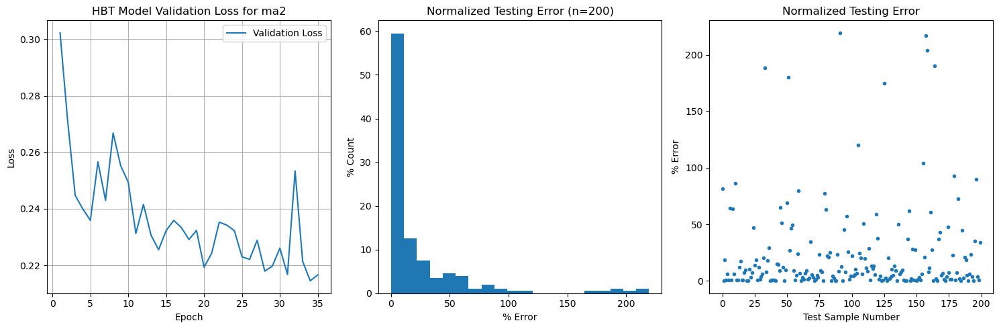

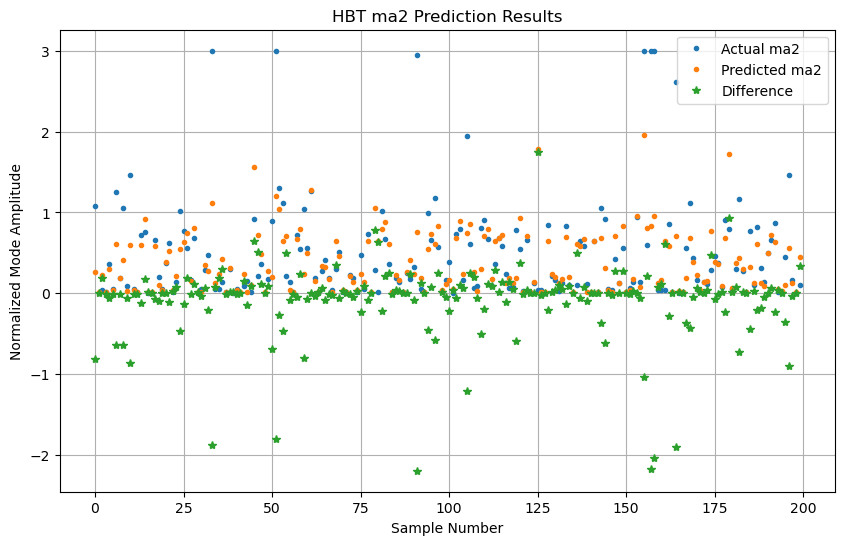

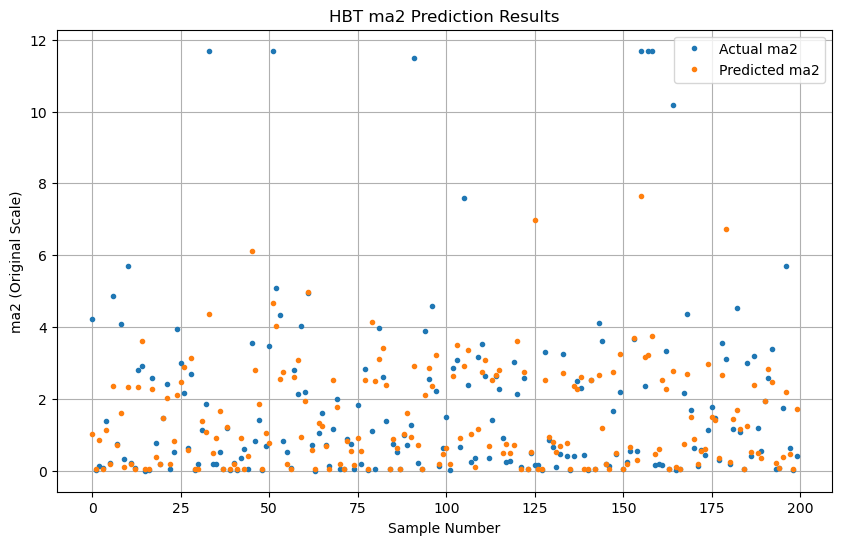

Maximum actual mode amplitude (normalized): 3.00
Maximum predicted mode amplitude (normalized): 1.96
Mean absolute percentage error: 23.23%


In [11]:
# Evaluate the model on test data
predictions = Model.predict(testing_inputs)

# Calculate prediction errors
prediction_errors = np.abs(testing_labels - predictions[:, 0]) * 100

# Create visualization plots
fig, axes = plt.subplots(figsize=(15, 5), ncols=3, nrows=1)

# Plot 1: Training History
axes[0].plot(range(1, len(history.history['val_loss']) + 1), 
             history.history['val_loss'], 
             label='Validation Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title(f'HBT Model Validation Loss for {selected_data_type}')
axes[0].legend()
axes[0].grid(True)

# Plot 2: Error Distribution
weights = np.ones_like(prediction_errors) / len(prediction_errors) * 100
axes[1].hist(prediction_errors, 20, weights=weights)
axes[1].set_xlabel('% Error')
axes[1].set_ylabel('% Count')
axes[1].set_title('Normalized Testing Error (n=200)')

# Plot 3: Error by Sample
axes[2].plot(prediction_errors, '.')
axes[2].set_xlabel('Test Sample Number')
axes[2].set_ylabel('% Error')
axes[2].set_title('Normalized Testing Error')
plt.tight_layout()
plt.show()

# Plot 4: Actual vs Predicted Values
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0], '.', label=f'Predicted {selected_data_type}')
plt.plot(-(testing_labels - predictions[:, 0]), '*', label='Difference')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

# Plot original scale predictions
plt.figure(figsize=(10, 6))
plt.plot(testing_labels * ma_norm, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0] * ma_norm, '.', label=f'Predicted {selected_data_type}')
plt.xlabel('Sample Number')
plt.ylabel(f'{selected_data_type} (Original Scale)')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

print(f"Maximum actual mode amplitude (normalized): {np.max(np.abs(testing_labels)):.2f}")
print(f"Maximum predicted mode amplitude (normalized): {np.max(np.abs(predictions[:, 0])):.2f}")
print(f"Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")

3.8972038269042963
Shot 119671: Camera frames=800, HBT frames=800, Time frames=800
Shape of reserved_shot_cut_2d: (800, 32, 32)
Shape of camera_data: (800, 32, 32)
Input data shape: (800, 32, 32, 1)
Model output shape: (None, 1)


Predictions shape: (800,)


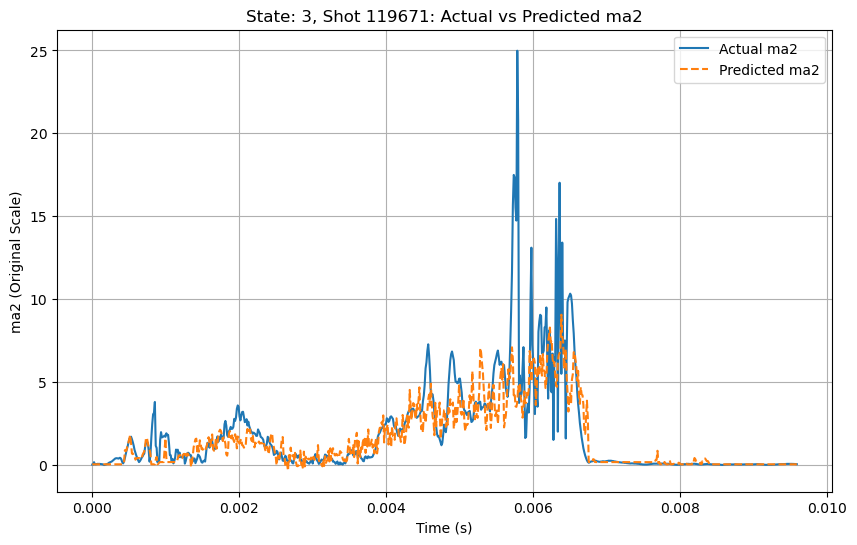

Shot 119671 - Mean absolute percentage error: 21.35%
Shot 119671 - Max actual ma2: 24.98
Shot 119671 - Max predicted ma2: 9.07


In [12]:
print(ma_norm)
def plot_RESERVED_SHOT_predictions(shot, shot_list, cut_training_data_2d, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, model, ma_norm):
    """Plot actual vs predicted Mode 2 amplitude for the reserved shot."""
    if reserved_shot_cut_2d is None:
        print(f"No data available for reserved shot {shot}. No plot generated.")
        return
    
    shot_idx = shot_list.index(shot)
    camera_data = reserved_shot_cut_2d
    hbt_data = hbt_dataType[shot_idx][:, 0]
    time_data = hbt_time_data[shot_idx]

    print(f"Shot {shot}: Camera frames={len(camera_data)}, HBT frames={len(hbt_data)}, Time frames={len(time_data)}")
    print(f"Shape of reserved_shot_cut_2d: {reserved_shot_cut_2d.shape}")
    print(f"Shape of camera_data: {np.array(camera_data).shape}")

    if len(camera_data) == 0:
        print(f"No camera data for shot {shot}. No plot generated.")
        return
    
    if len(camera_data) != len(hbt_data):
        print(f"Warning: Camera data ({len(camera_data)} frames) does not match HBT data ({len(hbt_data)} frames)")

    input_data = np.array(camera_data).reshape(-1, 32, 32, 1)
    print(f"Input data shape: {input_data.shape}")
    print(f"Model output shape: {model.output_shape}")

    predictions = []
    batch_size = 100
    for i in range(0, len(input_data), batch_size):
        batch = input_data[i:i+batch_size]
        batch_pred = model.predict(batch, verbose=0)[:, 0] * ma_norm
        predictions.extend(batch_pred)
    predictions = np.array(predictions)
    print(f"Predictions shape: {predictions.shape}")

    # Rest of the plotting code...
    
    # Plot actual vs predicted using time data
    plt.figure(figsize=(10, 6))
    plt.plot(time_data, hbt_data, label=f'Actual {selected_data_type}')
    plt.plot(time_data, predictions, '--', label=f'Predicted {selected_data_type}')
    plt.xlabel('Time (s)')  # Assuming time is in seconds; adjust if needed
    plt.ylabel(f'{selected_data_type} (Original Scale)')
    plt.title(f'State: {state}, Shot {shot}: Actual vs Predicted {selected_data_type}')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Print metrics
    prediction_errors = np.abs(hbt_data - predictions) / ma_norm * 100
    print(f"Shot {shot} - Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")
    print(f"Shot {shot} - Max actual {selected_data_type}: {np.max(np.abs(hbt_data)):.2f}")
    print(f"Shot {shot} - Max predicted {selected_data_type}: {np.max(np.abs(predictions)):.2f}")

    return predictions

reserved_predictions = plot_RESERVED_SHOT_predictions(
    RESERVED_SHOT, shot_list, cut_training_data_2D, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, william_model, ma_norm
)

In [13]:
# Save true ma2 data, predictions, and time data for reserved shot
time_data = hbt_time_data[shot_list.index(RESERVED_SHOT)]

print(f"Untrimmed: Saving results for state {state}, shot {RESERVED_SHOT}")
print(f"True data defined: {'hbt_dataType' in locals()}, {'shot_list' in locals()}, {'RESERVED_SHOT' in locals()}")
print(f"Predictions defined: {'predictions' in locals()}, shape: {reserved_predictions.shape if 'predictions' in locals() else 'N/A'}")
print(f"Time data defined: {'hbt_time_data' in locals()}, shape: {hbt_time_data[shot_list.index(RESERVED_SHOT)].shape if 'hbt_time_data' in locals() else 'N/A'}")
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_true.npy', hbt_dataType[shot_list.index(RESERVED_SHOT)][:, 0])
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_pred.npy', reserved_predictions)
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_time.npy', time_data)
print("Done")

Untrimmed: Saving results for state 3, shot 119671
True data defined: True, True, True
Predictions defined: True, shape: (800,)
Time data defined: True, shape: (800,)
Done
